In [1]:
import pandas as pd
import numpy as np

# Load custom modules
from nets import *
from sampling import *
from preprocess import *
from model_data import *
from model import *
from metrics import gini_normalized

# Others
from IPython.display import FileLink
from tqdm import tqdm
from torch.autograd import Variable as V
import matplotlib.pyplot as plt
import gc

%matplotlib inline

In [2]:
import sys
sys.path.append('../../fastai/')
from fastai.learner import *
from fastai.column_data import *
from torch.utils.data import Dataset, DataLoader

### LOAD DATA

For fast iterations and experimentaions we will work with a random subsample.

In [3]:
train = pd.read_csv('./data/Porto_Seguro/train.csv')

In [4]:
train.shape

(595212, 59)

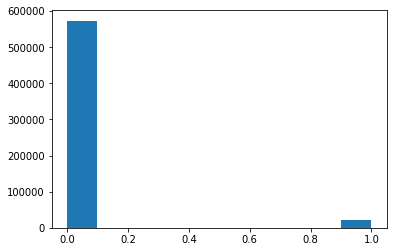

In [5]:
plot = plt.hist(train.target)

In [6]:
sampledata = subsample(train, 0.25)

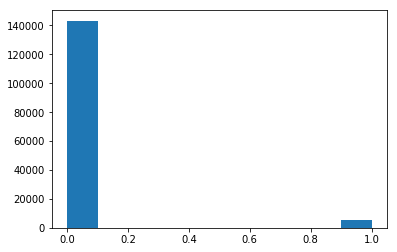

In [7]:
plot = plt.hist(sampledata.target)

In [8]:
# Get ohe for cats
cats = [c for c in sampledata.columns if 'cat' in c]
sampledata = num_df(sampledata, cats)

In [9]:
sampledata.shape

(148803, 243)

In [10]:
# drop calc features
calcs = [c for c in sampledata.columns if 'calc' in c]
sampledata = sampledata.drop(calcs, 1)

### SIMPLENET

* Simple Fully Connected Net
* OHE data 
* Normalized data 

In [11]:
# Normalize data by rankgauss, ignore id and target
sampledata = rankgauss(sampledata, exclude=['id', 'target'])

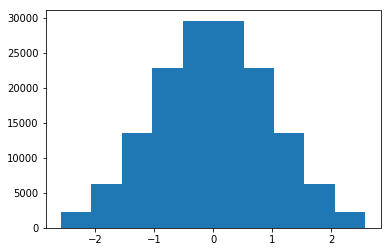

In [12]:
plot = plt.hist(sampledata.ps_car_01_cat)

In [11]:
class SimpleNet(nn.Module):
    def __init__(self, layers):
        super().__init__()
        self.linears = nn.ModuleList([nn.Linear(layers[i], layers[i + 1]) for i in range(len(layers) - 1)])
            
    def forward(self, x):
        for lin in self.linears:
            lin_x = lin(x)
            x = F.relu(lin_x)
        return F.log_softmax(lin_x, dim=1)

In [14]:
class SimpleColumnDataset(Dataset):
    # Expecting a numpy array
    def __init__(self, X, y=None):
        self.X = X
        self.y = y
    def __getitem__(self, index):
        return torch.from_numpy(self.X[index]).float(), torch.from_numpy(self.y[index, None])[0]

    def __len__(self):
        return len(self.y)

In [15]:
def create_submission(test_df, learn, filename, id_name, target_name):
    # input
    X = test_df.drop([id_name, target_name], 1)
    X = np.array(X)
    
    # Create submission
    if torch.cuda.is_available():test_tensor = V(torch.FloatTensor(X).cuda())
    else:test_tensor = V(torch.FloatTensor(X))
    test_preds = learn.model(test_tensor)
    test_preds = torch.exp(test_preds)
    if torch.cuda.is_available():test_preds = test_preds[:, 1].data.cpu().numpy()
    else: test_preds = test_preds[:, 1].data.numpy()
    pd.DataFrame({id_name:test_df.id, target_name:test_preds}).to_csv(filename, index=False)    
    

### 1) Baseline with Multilayer Perceptron


#### PLAYGROUND WITH SAMPLE DATA

* Find best params using sampledata

In [27]:
# Do 5 fold cv split
cv_idxs = kfold_cv_idx(sampledata, 5)

# Input
X, y = sampledata.drop(['id', 'target'], 1), sampledata.target
X, y = np.array(X), np.array(y)

trn_idx, val_idx = cv_idxs[0]

# Create dataloaders
trn_ds = SimpleColumnDataset(X[trn_idx], y[trn_idx])
val_ds = SimpleColumnDataset(X[val_idx], y[val_idx])
trn_dl = DataLoader(trn_ds, 128, True)
val_dl = DataLoader(val_ds, 128)

# Fastai integration with modeldata and singlemodel
md = ModelData('./', trn_dl, val_dl)
model = SimpleNet([221, 1000, 2])
if torch.cuda.is_available():
    single_model = SingleModel(model.cuda())
else: single_model = SingleModel(model)

# Create learner
learn = Learner(md, single_model)
learn.crit = nn.NLLLoss()
learn.opt_fn = optim.Adam

In [28]:
# Find learning rate
learn.lr_find()

HBox(children=(IntProgress(value=0, description='Epoch', max=1), HTML(value='')))

 69%|██████▊   | 640/931 [00:05<00:02, 110.34it/s, loss=0.709]


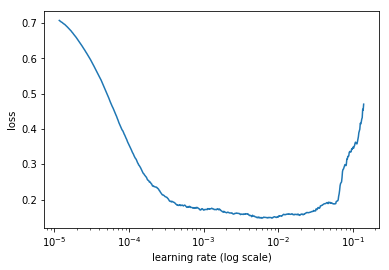

In [29]:
learn.sched.plot()

In [30]:
lr = 1e-4

In [32]:
# Do 5 fold cv split
cv_idxs = kfold_cv_idx(sampledata, 5)

# Input
X, y = sampledata.drop(['id', 'target'], 1), sampledata.target
X, y = np.array(X), np.array(y)

# Fit cv
cv_res = []

for trn_idx, val_idx in cv_idxs:
    # Create dataloaders
    trn_ds = SimpleColumnDataset(X[trn_idx], y[trn_idx])
    val_ds = SimpleColumnDataset(X[val_idx], y[val_idx])
    trn_dl = DataLoader(trn_ds, 128, True)
    val_dl = DataLoader(val_ds, 128)

    # Fastai integration with modeldata and singlemodel
    md = ModelData('./', trn_dl, val_dl)
    model = SimpleNet([221, 1000, 2])
    if torch.cuda.is_available():
        single_model = SingleModel(model.cuda())
    else: single_model = SingleModel(model)

    # Create learner
    learn = Learner(md, single_model)
    learn.crit = nn.NLLLoss()
    learn.opt_fn = optim.Adam

    # Fit model
    learn.fit(1e-4, 10, 1e-4, cycle_len=1)

    # Get cv results
    preds = learn.predict()
    preds = np.exp(preds)[:, 1]
    score = gini_normalized(y[val_idx], preds)
    cv_res.append(score)

print(f'cv mean: {round(np.mean(cv_res), 4)} +/- {round(np.std(cv_res), 4)}')

HBox(children=(IntProgress(value=0, description='Epoch', max=10), HTML(value='')))

[ 0.       0.15405  0.15948]                                  
[ 1.       0.14582  0.15817]                                  
[ 2.       0.16467  0.15744]                                  
[ 3.       0.14631  0.15685]                                  
[ 4.       0.15497  0.15675]                                  
[ 5.       0.15534  0.15656]                                  
[ 6.       0.15352  0.15649]                                  
[ 7.       0.16172  0.15645]                                  
[ 8.       0.14906  0.15648]                                  
[ 9.       0.14912  0.15637]                                  



HBox(children=(IntProgress(value=0, description='Epoch', max=10), HTML(value='')))

[ 0.       0.14777  0.15537]                                  
[ 1.       0.15393  0.15488]                                  
[ 2.       0.15199  0.15454]                                  
[ 3.       0.1507   0.15459]                                  
[ 4.       0.14287  0.15445]                                  
[ 5.       0.15093  0.1545 ]                                  
[ 6.       0.14765  0.15444]                                  
[ 7.       0.1563   0.15443]                                  
[ 8.       0.14882  0.15445]                                 
[ 9.       0.1474   0.15468]                                  



HBox(children=(IntProgress(value=0, description='Epoch', max=10), HTML(value='')))

[ 0.       0.14888  0.15457]                                  
[ 1.       0.15242  0.15392]                                  
[ 2.       0.1606   0.15355]                                  
[ 3.       0.1443   0.15364]                                  
[ 4.       0.15581  0.15355]                                  
[ 5.       0.1516   0.15355]                                  
[ 6.       0.17882  0.15367]                                  
[ 7.       0.17759  0.15359]                                  
[ 8.       0.15085  0.15367]                                  
[ 9.       0.1521   0.15397]                                  



HBox(children=(IntProgress(value=0, description='Epoch', max=10), HTML(value='')))

[ 0.       0.15741  0.15259]                                  
[ 1.       0.15251  0.15206]                                  
[ 2.       0.14661  0.15167]                                  
[ 3.       0.18122  0.15185]                                  
[ 4.       0.15146  0.15164]                                  
[ 5.       0.13983  0.15158]                                  
[ 6.       0.14971  0.15158]                                  
[ 7.       0.14934  0.15176]                                  
[ 8.       0.14728  0.15169]                                  
[ 9.       0.15135  0.1517 ]                                  



HBox(children=(IntProgress(value=0, description='Epoch', max=10), HTML(value='')))

[ 0.       0.16956  0.15763]                                  
[ 1.       0.1574   0.15713]                                  
[ 2.       0.15374  0.15708]                                 
[ 3.       0.196    0.15696]                                  
[ 4.       0.14817  0.15697]                                  
[ 5.       0.16308  0.15692]                                  
[ 6.       0.14428  0.15695]                                  
[ 7.       0.17195  0.15696]                                  
[ 8.       0.1567   0.15706]                                 
[ 9.       0.14929  0.15682]                                  

cv mean: 0.2433 +/- 0.0095


In [33]:
cv_res

[0.25504768039310477,
 0.23858611474450264,
 0.24050216487307599,
 0.25277974470086056,
 0.2294581250655717]

#### CROSS-VALIDATIE WITH FULL DATA (0.2752 +/- 0.0039)

* Fit model with full data and get cv scores

In [34]:
train = num_df(train, cats)
train = train.drop(calcs, 1)
train = rankgauss(train, exclude=['id', 'target'])

In [35]:
# Do 5 fold cv split
cv_idxs = kfold_cv_idx(train, 5)

# Input
X, y = train.drop(['id', 'target'], 1), train.target
X, y = np.array(X), np.array(y)

# Fit cv
cv_res = []

for trn_idx, val_idx in cv_idxs:
    # Create dataloaders
    trn_ds = SimpleColumnDataset(X[trn_idx], y[trn_idx])
    val_ds = SimpleColumnDataset(X[val_idx], y[val_idx])
    trn_dl = DataLoader(trn_ds, 128, True)
    val_dl = DataLoader(val_ds, 128)

    # Fastai integration with modeldata and singlemodel
    md = ModelData('./', trn_dl, val_dl)
    model = SimpleNet([221, 1000, 2])
    if torch.cuda.is_available():
        single_model = SingleModel(model.cuda())
    else: single_model = SingleModel(model)

    # Create learner
    learn = Learner(md, single_model)
    learn.crit = nn.NLLLoss()
    learn.opt_fn = optim.Adam

    # Fit model
    learn.fit(1e-4, 10, 1e-4, cycle_len=1)

    # Get cv results
    preds = learn.predict()
    preds = np.exp(preds)[:, 1]
    score = gini_normalized(y[val_idx], preds)
    cv_res.append(score)

print(f'cv mean: {round(np.mean(cv_res), 4)} +/- {round(np.std(cv_res), 4)}')

HBox(children=(IntProgress(value=0, description='Epoch', max=10), HTML(value='')))

[ 0.       0.15846  0.15416]                                    
[ 1.       0.15864  0.15345]                                    
[ 2.       0.16764  0.1533 ]                                    
[ 3.       0.14919  0.15324]                                    
[ 4.       0.16111  0.1532 ]                                    
[ 5.       0.15851  0.15315]                                    
[ 6.       0.14741  0.15307]                                    
[ 7.       0.15289  0.1531 ]                                   
[ 8.       0.14555  0.15308]                                   
[ 9.       0.14059  0.15305]                                   



HBox(children=(IntProgress(value=0, description='Epoch', max=10), HTML(value='')))

[ 0.       0.14885  0.15223]                                    
[ 1.       0.15189  0.15129]                                    
[ 2.       0.1417   0.15103]                                    
[ 3.       0.16681  0.15094]                                    
[ 4.       0.15135  0.1509 ]                                    
[ 5.       0.15662  0.15092]                                   
[ 6.       0.15119  0.15087]                                   
[ 7.       0.15386  0.15092]                                   
[ 8.       0.15653  0.15095]                                   
[ 9.       0.14745  0.15104]                                   



HBox(children=(IntProgress(value=0, description='Epoch', max=10), HTML(value='')))

[ 0.       0.15691  0.15309]                                    
[ 1.       0.13926  0.15258]                                    
[ 2.       0.15513  0.15242]                                    
[ 3.       0.1471   0.15233]                                    
[ 4.       0.14203  0.15233]                                    
[ 5.       0.1616   0.15229]                                    
[ 6.       0.14501  0.15224]                                    
[ 7.       0.15195  0.15218]                                    
[ 8.       0.15691  0.15221]                                    
[ 9.       0.15556  0.1522 ]                                    



HBox(children=(IntProgress(value=0, description='Epoch', max=10), HTML(value='')))

[ 0.       0.15059  0.15273]                                    
[ 1.       0.1545   0.15184]                                    
[ 2.       0.14775  0.15162]                                    
[ 3.       0.16631  0.15142]                                    
[ 4.      0.1527  0.1514]                                       
[ 5.       0.15037  0.15138]                                    
[ 6.       0.1478   0.15132]                                   
[ 7.       0.15855  0.15136]                                    
[ 8.       0.15378  0.15131]                                    
[ 9.       0.14141  0.15137]                                    



HBox(children=(IntProgress(value=0, description='Epoch', max=10), HTML(value='')))

[ 0.       0.15138  0.15303]                                    
[ 1.       0.15305  0.15261]                                    
[ 2.       0.15481  0.1524 ]                                    
[ 3.       0.14596  0.15239]                                    
[ 4.       0.15169  0.15231]                                   
[ 5.       0.14677  0.1523 ]                                    
[ 6.       0.14992  0.15224]                                    
[ 7.       0.16076  0.15226]                                    
[ 8.       0.14715  0.15223]                                   
[ 9.       0.14445  0.15223]                                   

cv mean: 0.2752 +/- 0.0039


In [36]:
cv_res

[0.27746594875584785,
 0.26782983989758979,
 0.27774560286086508,
 0.27489093155530825,
 0.27818544677572177]

#### TRAIN WITH FULL + DATA PREDICT (Private: 0.27236)

* Make predictions and submit to kaggle

In [51]:
# combine train and test
train = pd.read_csv('./data/Porto_Seguro/train.csv')
test = pd.read_csv('./data/Porto_Seguro/test.csv')
test.target = 0
train_test = pd.concat([train, test]).reset_index(drop=True)

# do necessary preprocessing
train_test = num_df(train_test, cats) # Do OHE
train_test = train_test.drop(calcs, 1) # Drop calc fbeatures
train_test = rankgauss(train_test, exclude=['id', 'target']) # Normalize

n = len(train)
train, test = train_test[:n], train_test[n:]

Exception in thread Thread-138:
Traceback (most recent call last):
  File "/home/kturgutlu/anaconda3/envs/fastai/lib/python3.6/threading.py", line 916, in _bootstrap_inner
    self.run()
  File "/home/kturgutlu/anaconda3/envs/fastai/lib/python3.6/site-packages/tqdm/_tqdm.py", line 144, in run
    for instance in self.tqdm_cls._instances:
  File "/home/kturgutlu/anaconda3/envs/fastai/lib/python3.6/_weakrefset.py", line 60, in __iter__
    for itemref in self.data:
RuntimeError: Set changed size during iteration



In [ ]:
# INPUT
# Trick is to get 0 as val idx
X, y = train.drop(['id', 'target'], 1), train.target.astype('int32')
X, y = np.array(X), np.array(y)
lr = 1e-4

trn_idx = np.array(range(1, len(X)))
val_idx = np.array([0])

# Create model data
trn_ds = SimpleColumnDataset(X[trn_idx], y[trn_idx])
val_ds = SimpleColumnDataset(X[val_idx], y[val_idx])
trn_dl = DataLoader(trn_ds, 128, True)
val_dl = DataLoader(val_ds, 128)

# Fastai integration
md = ModelData('./', trn_dl, val_dl)
if torch.cuda.is_available():
    model = SingleModel(SimpleNet([221, 1000, 2]).cuda())
else: model = SingleModel(SimpleNet([221, 1000, 2]))
learn = Learner(md, model)
learn.crit = nn.NLLLoss()
learn.opt_fn = optim.Adam

# Fit model
learn.fit(lr, 10, wds=1e-4, cycle_len=1)

In [58]:
create_submission(test, learn, './baseline_mlp.csv', 'id', 'target')

In [59]:
FileLink('./baseline_mlp.csv')

/home/kturgutlu/Desktop/GITHUB/deeplearning/baseline_mlp.csv

### 2) Multilayer Perceptron with Embeddings


#### PLAYGROUND WITH SAMPLE DATA

* Find best params using sampledata
* Also modify mixed model to run classification with log loss 

In [16]:
class EmbeddingDataset(Dataset):
    # Takes a dataframe
    def __init__(self, df, emb_cols, y):
        self.X = X
        self.emb_cols = emb_cols
        self.y = y
        self.conts = np.array(df.drop(emb_cols,1)).astype('float32')
        self.cats = np.array(df[cats])
        
    def __len__(self): return len(self.y)

    def __getitem__(self, idx):
        return [torch.from_numpy(self.cats[idx]), torch.from_numpy(self.conts[idx]).float(), torch.from_numpy(self.y[idx, None])[0]]

In [17]:
class MixedInputClassifier(nn.Module):
    def __init__(self, emb_szs, n_cont, emb_drop, out_sz, szs, drops,
                 y_range=None, use_bn=False):
        super().__init__()
        self.embs = nn.ModuleList([nn.Embedding(c, s) for c,s in emb_szs])
        for emb in self.embs: emb_init(emb)
        n_emb = sum(e.embedding_dim for e in self.embs)

        szs = [n_emb+n_cont] + szs
        self.lins = nn.ModuleList([
            nn.Linear(szs[i], szs[i+1]) for i in range(len(szs)-1)])
        self.bns = nn.ModuleList([
            nn.BatchNorm1d(sz) for sz in szs[1:]])
        for o in self.lins: kaiming_normal(o.weight.data)
        self.outp = nn.Linear(szs[-1], out_sz)
        kaiming_normal(self.outp.weight.data)

        self.emb_drop = nn.Dropout(emb_drop)
        self.drops = nn.ModuleList([nn.Dropout(drop) for drop in drops])
        self.bn = nn.BatchNorm1d(n_cont)
        self.use_bn,self.y_range = use_bn,y_range

    def forward(self, x_cat, x_cont):
        x = [e(x_cat[:,i]) for i,e in enumerate(self.embs)]
        x = torch.cat(x, 1)
        x2 = self.bn(x_cont)
        x = self.emb_drop(x)
        x = torch.cat([x, x2], 1)
        for l,d,b in zip(self.lins, self.drops, self.bns):
            x = F.relu(l(x))
            if self.use_bn: x = b(x)
            x = d(x)
        x = self.outp(x)
        return F.log_softmax(x, dim=1)

#### Playground with Sample Data

In [122]:
train = pd.read_csv('./data/Porto_Seguro/train.csv')

In [151]:
sampledata = subsample(train, 0.25)
sampledata = sampledata.drop(calcs, 1)

In [152]:
data = sampledata
# take min cardinality 2 for embeddings
cats = [c for c in data.columns if ('cat' in c) & (len(data[c].unique()) > 2)]
data = rankgauss(data, exclude=['id', 'target'] + cats)

# to index encoding for embedding cols
for c in cats:
    emb_dict = {v:i for i,v in enumerate(data[c].unique())}
    data[c] = data[c].apply(lambda x: emb_dict[x])

# get sizes
cat_sz = [len(data[c].unique()) for c in cats]
emb_szs = [(sz, min(50, (sz+1)//2)) for sz in cat_sz]

In [167]:
# Do 5 fold cv split
cv_idxs = kfold_cv_idx(sampledata, 5)

# Input
X, y = data.drop(['id', 'target'], 1), data.target.values

trn_idx, val_idx = cv_idxs[0]

# Create dataloaders
trn_ds = EmbeddingDataset(X.iloc[trn_idx], cats, y[trn_idx])
val_ds = EmbeddingDataset(X.iloc[val_idx], cats, y[val_idx])
trn_dl = DataLoader(trn_ds, 128, True)
val_dl = DataLoader(val_ds, 128)

# Fastai integration with modeldata and singlemodel
md = ModelData('./', trn_dl, val_dl)
model = MixedInputClassifier(emb_szs, 24, 0, 2, [1000], [0])
if torch.cuda.is_available():
    single_model = SingleModel(model.cuda())
else: single_model = SingleModel(model)

# Create learner
learn = Learner(md, single_model)
learn.crit = nn.NLLLoss()
learn.opt_fn = optim.Adam

In [168]:
learn.lr_find()

HBox(children=(IntProgress(value=0, description='Epoch', max=1), HTML(value='')))







  0%|          | 0/931 [00:00<?, ?it/s]





  0%|          | 0/931 [00:00<?, ?it/s, loss=0.694]





  0%|          | 0/931 [00:00<?, ?it/s, loss=0.689]





  0%|          | 0/931 [00:00<?, ?it/s, loss=0.678]





  0%|          | 0/931 [00:00<?, ?it/s, loss=0.675]





  0%|          | 0/931 [00:00<?, ?it/s, loss=0.679]





  0%|          | 0/931 [00:00<?, ?it/s, loss=0.676]





  0%|          | 0/931 [00:00<?, ?it/s, loss=0.674]





  0%|          | 0/931 [00:00<?, ?it/s, loss=0.677]





  1%|          | 8/931 [00:00<00:12, 72.45it/s, loss=0.677]





  1%|          | 8/931 [00:00<00:16, 57.21it/s, loss=0.678]





  1%|          | 8/931 [00:00<00:19, 47.02it/s, loss=0.678]





  1%|          | 8/931 [00:00<00:21, 42.91it/s, loss=0.675]





  1%|          | 8/931 [00:00<00:22, 40.50it/s, loss=0.674]





  1%|          | 8/931 [00:00<00:26, 35.34it/s, loss=0.671]





  1%|▏         | 13/931 [00:00<00:16, 55.65it/s, loss=0.671]





  1%|▏         | 13/931 [00:00<00:17,

 19%|█▊        | 173/931 [00:02<00:09, 79.01it/s, loss=0.265]





 19%|█▊        | 173/931 [00:02<00:09, 78.40it/s, loss=0.264]





 19%|█▊        | 173/931 [00:02<00:09, 77.85it/s, loss=0.262]





 19%|█▊        | 173/931 [00:02<00:09, 77.29it/s, loss=0.26] 





 19%|█▊        | 173/931 [00:02<00:09, 77.00it/s, loss=0.259]





 19%|█▊        | 173/931 [00:02<00:09, 76.06it/s, loss=0.258]





 19%|█▊        | 173/931 [00:02<00:10, 75.48it/s, loss=0.255]





 19%|█▉        | 181/931 [00:02<00:09, 78.92it/s, loss=0.255]





 19%|█▉        | 181/931 [00:02<00:09, 78.56it/s, loss=0.255]





 19%|█▉        | 181/931 [00:02<00:09, 78.24it/s, loss=0.253]





 19%|█▉        | 181/931 [00:02<00:09, 77.91it/s, loss=0.25] 





 19%|█▉        | 181/931 [00:02<00:09, 77.57it/s, loss=0.248]





 19%|█▉        | 181/931 [00:02<00:09, 77.28it/s, loss=0.246]





 19%|█▉        | 181/931 [00:02<00:09, 76.88it/s, loss=0.244]





 19%|█▉        | 181/931 [00:02<00:09, 76.41it/s, loss=0.243]


 37%|███▋      | 341/931 [00:04<00:08, 73.68it/s, loss=0.162]





 37%|███▋      | 341/931 [00:04<00:08, 73.52it/s, loss=0.161]





 37%|███▋      | 341/931 [00:04<00:08, 73.20it/s, loss=0.163]





 37%|███▋      | 341/931 [00:04<00:08, 72.98it/s, loss=0.163]





 38%|███▊      | 350/931 [00:04<00:07, 74.88it/s, loss=0.163]





 38%|███▊      | 350/931 [00:04<00:07, 74.66it/s, loss=0.163]





 38%|███▊      | 350/931 [00:04<00:07, 74.48it/s, loss=0.164]





 38%|███▊      | 350/931 [00:04<00:07, 74.30it/s, loss=0.166]





 38%|███▊      | 350/931 [00:04<00:07, 74.13it/s, loss=0.165]





 38%|███▊      | 350/931 [00:04<00:07, 73.92it/s, loss=0.166]





 38%|███▊      | 350/931 [00:04<00:07, 73.79it/s, loss=0.164]





 38%|███▊      | 350/931 [00:04<00:07, 73.63it/s, loss=0.165]





 38%|███▊      | 350/931 [00:04<00:07, 73.42it/s, loss=0.166]





 38%|███▊      | 350/931 [00:04<00:07, 73.28it/s, loss=0.167]





 39%|███▊      | 359/931 [00:04<00:07, 75.15it/s, loss=0.167]


 56%|█████▌    | 519/931 [00:06<00:05, 75.76it/s, loss=0.159]





 56%|█████▌    | 519/931 [00:06<00:05, 75.60it/s, loss=0.158]





 56%|█████▌    | 519/931 [00:06<00:05, 75.47it/s, loss=0.159]





 56%|█████▌    | 519/931 [00:06<00:05, 75.36it/s, loss=0.158]





 56%|█████▌    | 519/931 [00:06<00:05, 75.24it/s, loss=0.158]





 56%|█████▌    | 519/931 [00:06<00:05, 75.12it/s, loss=0.156]





 56%|█████▌    | 519/931 [00:06<00:05, 74.99it/s, loss=0.157]





 56%|█████▌    | 519/931 [00:06<00:05, 74.86it/s, loss=0.156]





 56%|█████▌    | 519/931 [00:06<00:05, 74.74it/s, loss=0.154]





 56%|█████▌    | 519/931 [00:06<00:05, 74.62it/s, loss=0.153]





 57%|█████▋    | 528/931 [00:06<00:05, 75.89it/s, loss=0.153]





 57%|█████▋    | 528/931 [00:06<00:05, 75.76it/s, loss=0.153]





 57%|█████▋    | 528/931 [00:06<00:05, 75.63it/s, loss=0.152]





 57%|█████▋    | 528/931 [00:06<00:05, 75.51it/s, loss=0.153]





 57%|█████▋    | 528/931 [00:07<00:05, 75.38it/s, loss=0.152]


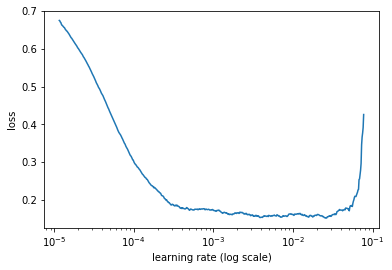

In [169]:
learn.sched.plot()

In [170]:
lr = 1e-4

In [173]:
# Fit cv
cv_res = []

for trn_idx, val_idx in cv_idxs:
    # Create dataloaders
    trn_ds = EmbeddingDataset(X.iloc[trn_idx], cats, y[trn_idx])
    val_ds = EmbeddingDataset(X.iloc[val_idx], cats, y[val_idx])
    trn_dl = DataLoader(trn_ds, 128, True)
    val_dl = DataLoader(val_ds, 128)

    # Fastai integration with modeldata and singlemodel
    md = ModelData('./', trn_dl, val_dl)
    model = MixedInputClassifier(emb_szs, 24, 0, 2, [1000], [0])
    if torch.cuda.is_available(): single_model = SingleModel(model.cuda())
    else: single_model = SingleModel(model)

    # Create learner
    learn = Learner(md, single_model)
    learn.crit = nn.NLLLoss()
    learn.opt_fn = optim.Adam

    # Fit model
    learn.fit(1e-4, 10, 1e-4, cycle_len=1)

    # Get cv results
    preds = learn.predict()
    preds = np.exp(preds)[:, 1]
    score = gini_normalized(y[val_idx], preds)
    cv_res.append(score)

print(f'cv mean: {round(np.mean(cv_res), 4)} +/- {round(np.std(cv_res), 4)}')

HBox(children=(IntProgress(value=0, description='Epoch', max=10), HTML(value='')))








  0%|          | 0/931 [00:00<?, ?it/s]






  0%|          | 0/931 [00:00<?, ?it/s, loss=0.56]






  0%|          | 0/931 [00:00<?, ?it/s, loss=0.562]






  0%|          | 0/931 [00:00<?, ?it/s, loss=0.565]






  0%|          | 0/931 [00:00<?, ?it/s, loss=0.564]






  0%|          | 4/931 [00:00<00:24, 37.41it/s, loss=0.564]






  0%|          | 4/931 [00:00<00:26, 34.46it/s, loss=0.561]






  0%|          | 4/931 [00:00<00:29, 31.87it/s, loss=0.56] 






  0%|          | 4/931 [00:00<00:31, 29.62it/s, loss=0.554]






  0%|          | 4/931 [00:00<00:33, 27.79it/s, loss=0.552]






  0%|          | 4/931 [00:00<00:35, 25.78it/s, loss=0.553]






  0%|          | 4/931 [00:00<00:37, 24.48it/s, loss=0.551]






  0%|          | 4/931 [00:00<00:40, 22.67it/s, loss=0.55] 






  0%|          | 4/931 [00:00<00:42, 21.66it/s, loss=0.549]






  0%|          | 4/931 [00:00<00:46, 19.93it/s, loss=0.55] 






  0%|          | 4/931 [00:00<00:48, 19.05it/s, loss=0.5

  9%|▉         | 83/931 [00:01<00:12, 66.80it/s, loss=0.402]






  9%|▉         | 83/931 [00:01<00:12, 65.94it/s, loss=0.398]






  9%|▉         | 83/931 [00:01<00:12, 65.51it/s, loss=0.393]






  9%|▉         | 83/931 [00:01<00:13, 64.89it/s, loss=0.389]






  9%|▉         | 83/931 [00:01<00:13, 64.22it/s, loss=0.386]






  9%|▉         | 83/931 [00:01<00:13, 63.80it/s, loss=0.381]






  9%|▉         | 83/931 [00:01<00:13, 62.95it/s, loss=0.378]






  9%|▉         | 83/931 [00:01<00:13, 62.47it/s, loss=0.374]






  9%|▉         | 83/931 [00:01<00:13, 61.80it/s, loss=0.37] 






 10%|▉         | 91/931 [00:01<00:12, 67.68it/s, loss=0.37]






 10%|▉         | 91/931 [00:01<00:12, 67.15it/s, loss=0.365]






 10%|▉         | 91/931 [00:01<00:12, 66.67it/s, loss=0.361]






 10%|▉         | 91/931 [00:01<00:12, 65.34it/s, loss=0.358]






 10%|▉         | 91/931 [00:01<00:12, 64.77it/s, loss=0.352]






 10%|▉         | 91/931 [00:01<00:13, 64.27it/s, loss=0.35] 




 26%|██▌       | 244/931 [00:03<00:09, 68.80it/s, loss=0.164]






 26%|██▌       | 244/931 [00:03<00:10, 68.60it/s, loss=0.164]






 26%|██▌       | 244/931 [00:03<00:10, 68.43it/s, loss=0.163]






 26%|██▌       | 244/931 [00:03<00:10, 68.10it/s, loss=0.164]






 26%|██▌       | 244/931 [00:03<00:10, 67.93it/s, loss=0.163]






 26%|██▌       | 244/931 [00:03<00:10, 67.73it/s, loss=0.163]






 27%|██▋       | 253/931 [00:03<00:09, 70.19it/s, loss=0.163]






 27%|██▋       | 253/931 [00:03<00:09, 70.01it/s, loss=0.163]






 27%|██▋       | 253/931 [00:03<00:09, 69.84it/s, loss=0.164]






 27%|██▋       | 253/931 [00:03<00:09, 69.63it/s, loss=0.165]






 27%|██▋       | 253/931 [00:03<00:09, 69.43it/s, loss=0.165]






 27%|██▋       | 253/931 [00:03<00:09, 69.21it/s, loss=0.165]






 27%|██▋       | 253/931 [00:03<00:09, 69.01it/s, loss=0.166]






 27%|██▋       | 253/931 [00:03<00:09, 68.80it/s, loss=0.166]






 27%|██▋       | 253/931 [00:03<00:09, 68.64it/s

 44%|████▍     | 409/931 [00:05<00:07, 71.61it/s, loss=0.161]






 44%|████▍     | 409/931 [00:05<00:07, 71.47it/s, loss=0.161]






 44%|████▍     | 409/931 [00:05<00:07, 71.34it/s, loss=0.159]






 44%|████▍     | 409/931 [00:05<00:07, 71.21it/s, loss=0.16] 






 44%|████▍     | 409/931 [00:05<00:07, 71.06it/s, loss=0.162]






 44%|████▍     | 409/931 [00:05<00:07, 70.94it/s, loss=0.161]






 45%|████▍     | 418/931 [00:05<00:07, 72.49it/s, loss=0.161]






 45%|████▍     | 418/931 [00:05<00:07, 72.24it/s, loss=0.159]






 45%|████▍     | 418/931 [00:05<00:07, 72.09it/s, loss=0.158]






 45%|████▍     | 418/931 [00:05<00:07, 71.95it/s, loss=0.159]






 45%|████▍     | 418/931 [00:05<00:07, 71.83it/s, loss=0.159]






 45%|████▍     | 418/931 [00:05<00:07, 71.67it/s, loss=0.158]






 45%|████▍     | 418/931 [00:05<00:07, 71.55it/s, loss=0.157]






 45%|████▍     | 418/931 [00:05<00:07, 71.38it/s, loss=0.157]






 45%|████▍     | 418/931 [00:05<00:07, 71.22it/s

 62%|██████▏   | 577/931 [00:08<00:04, 71.69it/s, loss=0.15]






 62%|██████▏   | 577/931 [00:08<00:04, 71.54it/s, loss=0.151]






 62%|██████▏   | 577/931 [00:08<00:04, 71.44it/s, loss=0.152]






 62%|██████▏   | 577/931 [00:08<00:04, 71.35it/s, loss=0.152]






 62%|██████▏   | 577/931 [00:08<00:04, 71.27it/s, loss=0.152]






 62%|██████▏   | 577/931 [00:08<00:04, 71.16it/s, loss=0.153]






 62%|██████▏   | 577/931 [00:08<00:04, 71.04it/s, loss=0.153]






 62%|██████▏   | 577/931 [00:08<00:04, 70.93it/s, loss=0.155]






 62%|██████▏   | 577/931 [00:08<00:04, 70.84it/s, loss=0.153]






 62%|██████▏   | 577/931 [00:08<00:05, 70.74it/s, loss=0.154]






 63%|██████▎   | 586/931 [00:08<00:04, 71.82it/s, loss=0.154]






 63%|██████▎   | 586/931 [00:08<00:04, 71.69it/s, loss=0.155]






 63%|██████▎   | 586/931 [00:08<00:04, 71.58it/s, loss=0.158]






 63%|██████▎   | 586/931 [00:08<00:04, 71.47it/s, loss=0.158]






 63%|██████▎   | 586/931 [00:08<00:04, 71.38it/s,

 79%|███████▉  | 739/931 [00:10<00:02, 72.26it/s, loss=0.151]






 79%|███████▉  | 739/931 [00:10<00:02, 72.17it/s, loss=0.151]






 79%|███████▉  | 739/931 [00:10<00:02, 72.10it/s, loss=0.15] 






 79%|███████▉  | 739/931 [00:10<00:02, 72.01it/s, loss=0.151]






 80%|████████  | 746/931 [00:10<00:02, 72.67it/s, loss=0.151]






 80%|████████  | 746/931 [00:10<00:02, 72.59it/s, loss=0.152]






 80%|████████  | 746/931 [00:10<00:02, 72.51it/s, loss=0.152]






 80%|████████  | 746/931 [00:10<00:02, 72.44it/s, loss=0.153]






 80%|████████  | 746/931 [00:10<00:02, 72.35it/s, loss=0.153]






 80%|████████  | 746/931 [00:10<00:02, 72.26it/s, loss=0.153]






 80%|████████  | 746/931 [00:10<00:02, 72.19it/s, loss=0.153]






 80%|████████  | 746/931 [00:10<00:02, 72.05it/s, loss=0.154]






 80%|████████  | 746/931 [00:10<00:02, 71.94it/s, loss=0.155]






 81%|████████  | 754/931 [00:10<00:02, 72.66it/s, loss=0.155]






 81%|████████  | 754/931 [00:10<00:02, 72.56it/s

 97%|█████████▋| 906/931 [00:12<00:00, 72.09it/s, loss=0.153]






 97%|█████████▋| 906/931 [00:12<00:00, 72.02it/s, loss=0.154]






 97%|█████████▋| 906/931 [00:12<00:00, 71.95it/s, loss=0.152]






 97%|█████████▋| 906/931 [00:12<00:00, 71.89it/s, loss=0.153]






 97%|█████████▋| 906/931 [00:12<00:00, 71.84it/s, loss=0.153]






 97%|█████████▋| 906/931 [00:12<00:00, 71.75it/s, loss=0.154]






 97%|█████████▋| 906/931 [00:12<00:00, 71.68it/s, loss=0.155]






 97%|█████████▋| 906/931 [00:12<00:00, 71.61it/s, loss=0.156]






 97%|█████████▋| 906/931 [00:12<00:00, 71.55it/s, loss=0.157]






 97%|█████████▋| 906/931 [00:12<00:00, 71.49it/s, loss=0.158]






 98%|█████████▊| 915/931 [00:12<00:00, 72.19it/s, loss=0.158]






 98%|█████████▊| 915/931 [00:12<00:00, 72.12it/s, loss=0.159]






 98%|█████████▊| 915/931 [00:12<00:00, 72.07it/s, loss=0.16] 






 98%|█████████▊| 915/931 [00:12<00:00, 72.01it/s, loss=0.159]






 98%|█████████▊| 915/931 [00:12<00:00, 71.95it/s

 15%|█▌        | 141/931 [00:01<00:10, 78.90it/s, loss=0.158]






 15%|█▌        | 141/931 [00:01<00:10, 78.46it/s, loss=0.157]






 15%|█▌        | 141/931 [00:01<00:10, 78.04it/s, loss=0.161]






 15%|█▌        | 141/931 [00:01<00:10, 77.57it/s, loss=0.159]






 15%|█▌        | 141/931 [00:01<00:10, 77.12it/s, loss=0.158]






 15%|█▌        | 141/931 [00:01<00:10, 76.50it/s, loss=0.157]






 15%|█▌        | 141/931 [00:01<00:10, 76.03it/s, loss=0.158]






 15%|█▌        | 141/931 [00:01<00:10, 75.49it/s, loss=0.157]






 15%|█▌        | 141/931 [00:01<00:10, 75.03it/s, loss=0.155]






 16%|█▌        | 149/931 [00:01<00:09, 78.76it/s, loss=0.155]






 16%|█▌        | 149/931 [00:01<00:09, 78.38it/s, loss=0.155]






 16%|█▌        | 149/931 [00:01<00:10, 77.90it/s, loss=0.158]






 16%|█▌        | 149/931 [00:01<00:10, 77.51it/s, loss=0.157]






 16%|█▌        | 149/931 [00:01<00:10, 77.08it/s, loss=0.158]






 16%|█▌        | 149/931 [00:01<00:10, 76.69it/s

 33%|███▎      | 304/931 [00:03<00:08, 76.25it/s, loss=0.157]






 33%|███▎      | 304/931 [00:04<00:08, 75.89it/s, loss=0.157]






 33%|███▎      | 304/931 [00:04<00:08, 75.64it/s, loss=0.156]






 33%|███▎      | 304/931 [00:04<00:08, 75.36it/s, loss=0.158]






 33%|███▎      | 304/931 [00:04<00:08, 75.07it/s, loss=0.157]






 33%|███▎      | 304/931 [00:04<00:08, 74.79it/s, loss=0.158]






 34%|███▎      | 312/931 [00:04<00:08, 76.66it/s, loss=0.158]






 34%|███▎      | 312/931 [00:04<00:08, 76.43it/s, loss=0.159]






 34%|███▎      | 312/931 [00:04<00:08, 76.21it/s, loss=0.158]






 34%|███▎      | 312/931 [00:04<00:08, 75.98it/s, loss=0.159]






 34%|███▎      | 312/931 [00:04<00:08, 75.71it/s, loss=0.159]






 34%|███▎      | 312/931 [00:04<00:08, 75.47it/s, loss=0.16] 






 34%|███▎      | 312/931 [00:04<00:08, 75.18it/s, loss=0.162]






 34%|███▎      | 312/931 [00:04<00:08, 75.03it/s, loss=0.162]






 34%|███▎      | 312/931 [00:04<00:08, 74.80it/s

 50%|█████     | 470/931 [00:06<00:06, 75.64it/s, loss=0.153]






 50%|█████     | 470/931 [00:06<00:06, 75.50it/s, loss=0.153]






 50%|█████     | 470/931 [00:06<00:06, 75.35it/s, loss=0.152]






 50%|█████     | 470/931 [00:06<00:06, 75.20it/s, loss=0.153]






 50%|█████     | 470/931 [00:06<00:06, 75.06it/s, loss=0.151]






 50%|█████     | 470/931 [00:06<00:06, 74.90it/s, loss=0.15] 






 50%|█████     | 470/931 [00:06<00:06, 74.77it/s, loss=0.149]






 51%|█████▏    | 478/931 [00:06<00:05, 75.99it/s, loss=0.149]






 51%|█████▏    | 478/931 [00:06<00:05, 75.84it/s, loss=0.149]






 51%|█████▏    | 478/931 [00:06<00:05, 75.71it/s, loss=0.149]






 51%|█████▏    | 478/931 [00:06<00:05, 75.54it/s, loss=0.152]






 51%|█████▏    | 478/931 [00:06<00:06, 75.38it/s, loss=0.151]






 51%|█████▏    | 478/931 [00:06<00:06, 75.26it/s, loss=0.15] 






 51%|█████▏    | 478/931 [00:06<00:06, 75.09it/s, loss=0.151]






 51%|█████▏    | 478/931 [00:06<00:06, 74.90it/s

 67%|██████▋   | 628/931 [00:08<00:04, 75.54it/s, loss=0.153]






 69%|██████▊   | 638/931 [00:08<00:03, 76.73it/s, loss=0.153]






 69%|██████▊   | 638/931 [00:08<00:03, 76.60it/s, loss=0.152]






 69%|██████▊   | 638/931 [00:08<00:03, 76.52it/s, loss=0.152]






 69%|██████▊   | 638/931 [00:08<00:03, 76.42it/s, loss=0.153]






 69%|██████▊   | 638/931 [00:08<00:03, 76.34it/s, loss=0.154]






 69%|██████▊   | 638/931 [00:08<00:03, 76.23it/s, loss=0.155]






 69%|██████▊   | 638/931 [00:08<00:03, 76.09it/s, loss=0.155]






 69%|██████▊   | 638/931 [00:08<00:03, 75.95it/s, loss=0.154]






 69%|██████▊   | 638/931 [00:08<00:03, 75.83it/s, loss=0.156]






 69%|██████▊   | 638/931 [00:08<00:03, 75.71it/s, loss=0.156]






 69%|██████▉   | 647/931 [00:08<00:03, 76.74it/s, loss=0.156]






 69%|██████▉   | 647/931 [00:08<00:03, 76.64it/s, loss=0.155]






 69%|██████▉   | 647/931 [00:08<00:03, 76.52it/s, loss=0.156]






 69%|██████▉   | 647/931 [00:08<00:03, 76.41it/s

 85%|████████▌ | 795/931 [00:10<00:01, 76.48it/s, loss=0.155]






 86%|████████▋ | 804/931 [00:10<00:01, 77.33it/s, loss=0.155]






 86%|████████▋ | 804/931 [00:10<00:01, 77.26it/s, loss=0.154]






 86%|████████▋ | 804/931 [00:10<00:01, 77.18it/s, loss=0.153]






 86%|████████▋ | 804/931 [00:10<00:01, 77.12it/s, loss=0.153]






 86%|████████▋ | 804/931 [00:10<00:01, 77.02it/s, loss=0.152]






 86%|████████▋ | 804/931 [00:10<00:01, 76.92it/s, loss=0.153]






 86%|████████▋ | 804/931 [00:10<00:01, 76.83it/s, loss=0.153]






 86%|████████▋ | 804/931 [00:10<00:01, 76.75it/s, loss=0.153]






 86%|████████▋ | 804/931 [00:10<00:01, 76.68it/s, loss=0.152]






 86%|████████▋ | 804/931 [00:10<00:01, 76.58it/s, loss=0.154]






 87%|████████▋ | 813/931 [00:10<00:01, 77.43it/s, loss=0.154]






 87%|████████▋ | 813/931 [00:10<00:01, 77.35it/s, loss=0.155]






 87%|████████▋ | 813/931 [00:10<00:01, 77.28it/s, loss=0.155]






 87%|████████▋ | 813/931 [00:10<00:01, 77.21it/s

  4%|▎         | 33/931 [00:00<00:13, 67.09it/s, loss=0.152]






  4%|▎         | 33/931 [00:00<00:13, 65.55it/s, loss=0.151]






  4%|▎         | 33/931 [00:00<00:14, 64.09it/s, loss=0.152]






  4%|▎         | 33/931 [00:00<00:14, 62.08it/s, loss=0.151]






  4%|▍         | 41/931 [00:00<00:11, 76.85it/s, loss=0.151]






  4%|▍         | 41/931 [00:00<00:11, 75.35it/s, loss=0.15] 






  4%|▍         | 41/931 [00:00<00:12, 73.76it/s, loss=0.15]






  4%|▍         | 41/931 [00:00<00:12, 72.41it/s, loss=0.151]






  4%|▍         | 41/931 [00:00<00:12, 70.98it/s, loss=0.149]






  4%|▍         | 41/931 [00:00<00:12, 69.86it/s, loss=0.148]






  4%|▍         | 41/931 [00:00<00:13, 68.45it/s, loss=0.15] 






  4%|▍         | 41/931 [00:00<00:13, 65.80it/s, loss=0.148]






  4%|▍         | 41/931 [00:00<00:13, 64.52it/s, loss=0.148]






  5%|▌         | 49/931 [00:00<00:11, 76.64it/s, loss=0.148]






  5%|▌         | 49/931 [00:00<00:11, 75.19it/s, loss=0.149]




 22%|██▏       | 201/931 [00:02<00:09, 79.41it/s, loss=0.163]






 22%|██▏       | 201/931 [00:02<00:09, 79.06it/s, loss=0.162]






 22%|██▏       | 201/931 [00:02<00:09, 78.72it/s, loss=0.164]






 22%|██▏       | 201/931 [00:02<00:09, 78.41it/s, loss=0.163]






 22%|██▏       | 201/931 [00:02<00:09, 78.11it/s, loss=0.161]






 22%|██▏       | 201/931 [00:02<00:09, 77.81it/s, loss=0.162]






 22%|██▏       | 201/931 [00:02<00:09, 77.52it/s, loss=0.162]






 22%|██▏       | 201/931 [00:02<00:09, 77.21it/s, loss=0.161]






 22%|██▏       | 201/931 [00:02<00:09, 76.88it/s, loss=0.161]






 23%|██▎       | 211/931 [00:02<00:08, 80.67it/s, loss=0.161]






 23%|██▎       | 211/931 [00:02<00:08, 80.34it/s, loss=0.16] 






 23%|██▎       | 211/931 [00:02<00:08, 80.04it/s, loss=0.16]






 23%|██▎       | 211/931 [00:02<00:09, 79.68it/s, loss=0.162]






 23%|██▎       | 211/931 [00:02<00:09, 79.26it/s, loss=0.161]






 23%|██▎       | 211/931 [00:02<00:09, 78.77it/s,

 39%|███▉      | 365/931 [00:04<00:07, 79.84it/s, loss=0.145]






 39%|███▉      | 365/931 [00:04<00:07, 79.66it/s, loss=0.144]






 39%|███▉      | 365/931 [00:04<00:07, 79.48it/s, loss=0.141]






 39%|███▉      | 365/931 [00:04<00:07, 79.30it/s, loss=0.14] 






 39%|███▉      | 365/931 [00:04<00:07, 79.12it/s, loss=0.142]






 39%|███▉      | 365/931 [00:04<00:07, 78.91it/s, loss=0.142]






 40%|████      | 374/931 [00:04<00:06, 80.79it/s, loss=0.142]






 40%|████      | 374/931 [00:04<00:06, 80.61it/s, loss=0.142]






 40%|████      | 374/931 [00:04<00:06, 80.41it/s, loss=0.142]






 40%|████      | 374/931 [00:04<00:06, 80.20it/s, loss=0.143]






 40%|████      | 374/931 [00:04<00:06, 79.98it/s, loss=0.144]






 40%|████      | 374/931 [00:04<00:06, 79.71it/s, loss=0.143]






 40%|████      | 374/931 [00:04<00:07, 79.54it/s, loss=0.142]






 40%|████      | 374/931 [00:04<00:07, 79.33it/s, loss=0.144]






 40%|████      | 374/931 [00:04<00:07, 79.10it/s

 57%|█████▋    | 533/931 [00:06<00:04, 80.24it/s, loss=0.154]






 57%|█████▋    | 533/931 [00:06<00:04, 80.11it/s, loss=0.152]






 57%|█████▋    | 533/931 [00:06<00:04, 79.99it/s, loss=0.152]






 57%|█████▋    | 533/931 [00:06<00:04, 79.85it/s, loss=0.151]






 57%|█████▋    | 533/931 [00:06<00:04, 79.71it/s, loss=0.15] 






 57%|█████▋    | 533/931 [00:06<00:05, 79.49it/s, loss=0.15]






 57%|█████▋    | 533/931 [00:06<00:05, 79.35it/s, loss=0.149]






 58%|█████▊    | 541/931 [00:06<00:04, 80.51it/s, loss=0.149]






 58%|█████▊    | 541/931 [00:06<00:04, 80.34it/s, loss=0.149]






 58%|█████▊    | 541/931 [00:06<00:04, 80.20it/s, loss=0.147]






 58%|█████▊    | 541/931 [00:06<00:04, 80.00it/s, loss=0.148]






 58%|█████▊    | 541/931 [00:06<00:04, 79.84it/s, loss=0.147]






 58%|█████▊    | 541/931 [00:06<00:04, 79.69it/s, loss=0.145]






 58%|█████▊    | 541/931 [00:06<00:04, 79.56it/s, loss=0.146]






 58%|█████▊    | 541/931 [00:06<00:04, 79.42it/s,

 75%|███████▍  | 695/931 [00:08<00:02, 79.35it/s, loss=0.159]






 75%|███████▍  | 695/931 [00:08<00:02, 79.24it/s, loss=0.158]






 75%|███████▍  | 695/931 [00:08<00:02, 79.13it/s, loss=0.157]






 75%|███████▍  | 695/931 [00:08<00:02, 79.04it/s, loss=0.158]






 75%|███████▍  | 695/931 [00:08<00:02, 78.93it/s, loss=0.159]






 76%|███████▌  | 704/931 [00:08<00:02, 79.93it/s, loss=0.159]






 76%|███████▌  | 704/931 [00:08<00:02, 79.80it/s, loss=0.161]






 76%|███████▌  | 704/931 [00:08<00:02, 79.67it/s, loss=0.163]






 76%|███████▌  | 704/931 [00:08<00:02, 79.54it/s, loss=0.161]






 76%|███████▌  | 704/931 [00:08<00:02, 79.44it/s, loss=0.161]






 76%|███████▌  | 704/931 [00:08<00:02, 79.34it/s, loss=0.161]






 76%|███████▌  | 704/931 [00:08<00:02, 79.24it/s, loss=0.16] 






 76%|███████▌  | 704/931 [00:08<00:02, 79.09it/s, loss=0.158]






 76%|███████▌  | 704/931 [00:08<00:02, 78.98it/s, loss=0.16] 






 76%|███████▌  | 704/931 [00:08<00:02, 78.87it/s

 92%|█████████▏| 861/931 [00:10<00:00, 79.97it/s, loss=0.164]






 92%|█████████▏| 861/931 [00:10<00:00, 79.88it/s, loss=0.165]






 92%|█████████▏| 861/931 [00:10<00:00, 79.80it/s, loss=0.166]






 92%|█████████▏| 861/931 [00:10<00:00, 79.71it/s, loss=0.166]






 92%|█████████▏| 861/931 [00:10<00:00, 79.64it/s, loss=0.165]






 93%|█████████▎| 870/931 [00:10<00:00, 80.45it/s, loss=0.165]






 93%|█████████▎| 870/931 [00:10<00:00, 80.37it/s, loss=0.164]






 93%|█████████▎| 870/931 [00:10<00:00, 80.28it/s, loss=0.164]






 93%|█████████▎| 870/931 [00:10<00:00, 80.17it/s, loss=0.163]






 93%|█████████▎| 870/931 [00:10<00:00, 80.08it/s, loss=0.163]






 93%|█████████▎| 870/931 [00:10<00:00, 79.98it/s, loss=0.165]






 93%|█████████▎| 870/931 [00:10<00:00, 79.88it/s, loss=0.164]






 93%|█████████▎| 870/931 [00:10<00:00, 79.80it/s, loss=0.163]






 93%|█████████▎| 870/931 [00:10<00:00, 79.71it/s, loss=0.163]






 93%|█████████▎| 870/931 [00:10<00:00, 79.61it/s

 10%|█         | 97/931 [00:01<00:09, 87.77it/s, loss=0.15]






 10%|█         | 97/931 [00:01<00:09, 86.96it/s, loss=0.152]






 10%|█         | 97/931 [00:01<00:09, 86.04it/s, loss=0.152]






 10%|█         | 97/931 [00:01<00:09, 85.24it/s, loss=0.151]






 10%|█         | 97/931 [00:01<00:09, 84.44it/s, loss=0.153]






 10%|█         | 97/931 [00:01<00:09, 83.68it/s, loss=0.154]






 10%|█         | 97/931 [00:01<00:10, 82.81it/s, loss=0.153]






 11%|█▏        | 107/931 [00:01<00:09, 91.10it/s, loss=0.153]






 11%|█▏        | 107/931 [00:01<00:09, 90.38it/s, loss=0.152]






 11%|█▏        | 107/931 [00:01<00:09, 89.51it/s, loss=0.151]






 11%|█▏        | 107/931 [00:01<00:09, 88.84it/s, loss=0.15] 






 11%|█▏        | 107/931 [00:01<00:09, 88.15it/s, loss=0.15]






 11%|█▏        | 107/931 [00:01<00:09, 87.23it/s, loss=0.152]






 11%|█▏        | 107/931 [00:01<00:09, 86.63it/s, loss=0.151]






 11%|█▏        | 107/931 [00:01<00:09, 85.78it/s, loss=0.

 28%|██▊       | 264/931 [00:02<00:07, 88.80it/s, loss=0.161]






 28%|██▊       | 264/931 [00:02<00:07, 88.49it/s, loss=0.16] 






 28%|██▊       | 264/931 [00:02<00:07, 88.15it/s, loss=0.161]






 28%|██▊       | 264/931 [00:03<00:07, 87.77it/s, loss=0.161]






 28%|██▊       | 264/931 [00:03<00:07, 87.45it/s, loss=0.162]






 28%|██▊       | 264/931 [00:03<00:07, 87.13it/s, loss=0.161]






 28%|██▊       | 264/931 [00:03<00:07, 86.82it/s, loss=0.163]






 29%|██▉       | 274/931 [00:03<00:07, 90.05it/s, loss=0.163]






 29%|██▉       | 274/931 [00:03<00:07, 89.70it/s, loss=0.164]






 29%|██▉       | 274/931 [00:03<00:07, 89.32it/s, loss=0.165]






 29%|██▉       | 274/931 [00:03<00:07, 88.99it/s, loss=0.164]






 29%|██▉       | 274/931 [00:03<00:07, 88.64it/s, loss=0.164]






 29%|██▉       | 274/931 [00:03<00:07, 88.32it/s, loss=0.164]






 29%|██▉       | 274/931 [00:03<00:07, 88.02it/s, loss=0.165]






 29%|██▉       | 274/931 [00:03<00:07, 87.63it/s

 46%|████▋     | 431/931 [00:04<00:05, 86.82it/s, loss=0.144]






 46%|████▋     | 431/931 [00:04<00:05, 86.64it/s, loss=0.143]






 46%|████▋     | 431/931 [00:04<00:05, 86.48it/s, loss=0.144]






 46%|████▋     | 431/931 [00:04<00:05, 86.31it/s, loss=0.144]






 46%|████▋     | 431/931 [00:05<00:05, 86.14it/s, loss=0.147]






 46%|████▋     | 431/931 [00:05<00:05, 85.98it/s, loss=0.147]






 46%|████▋     | 431/931 [00:05<00:05, 85.72it/s, loss=0.145]






 46%|████▋     | 431/931 [00:05<00:05, 85.47it/s, loss=0.147]






 47%|████▋     | 441/931 [00:05<00:05, 87.43it/s, loss=0.147]






 47%|████▋     | 441/931 [00:05<00:05, 87.26it/s, loss=0.146]






 47%|████▋     | 441/931 [00:05<00:05, 87.10it/s, loss=0.147]






 47%|████▋     | 441/931 [00:05<00:05, 86.88it/s, loss=0.147]






 47%|████▋     | 441/931 [00:05<00:05, 86.74it/s, loss=0.147]






 47%|████▋     | 441/931 [00:05<00:05, 86.55it/s, loss=0.146]






 47%|████▋     | 441/931 [00:05<00:05, 86.38it/s

 64%|██████▍   | 598/931 [00:06<00:03, 86.81it/s, loss=0.153]






 64%|██████▍   | 598/931 [00:06<00:03, 86.63it/s, loss=0.152]






 64%|██████▍   | 598/931 [00:06<00:03, 86.52it/s, loss=0.152]






 64%|██████▍   | 598/931 [00:06<00:03, 86.40it/s, loss=0.152]






 64%|██████▍   | 598/931 [00:06<00:03, 86.27it/s, loss=0.154]






 64%|██████▍   | 598/931 [00:06<00:03, 86.15it/s, loss=0.153]






 64%|██████▍   | 598/931 [00:06<00:03, 86.01it/s, loss=0.152]






 64%|██████▍   | 598/931 [00:06<00:03, 85.89it/s, loss=0.152]






 65%|██████▌   | 608/931 [00:06<00:03, 87.31it/s, loss=0.152]






 65%|██████▌   | 608/931 [00:06<00:03, 87.18it/s, loss=0.152]






 65%|██████▌   | 608/931 [00:06<00:03, 87.07it/s, loss=0.151]






 65%|██████▌   | 608/931 [00:06<00:03, 86.93it/s, loss=0.151]






 65%|██████▌   | 608/931 [00:07<00:03, 86.82it/s, loss=0.153]






 65%|██████▌   | 608/931 [00:07<00:03, 86.70it/s, loss=0.154]






 65%|██████▌   | 608/931 [00:07<00:03, 86.55it/s

 82%|████████▏ | 759/931 [00:08<00:02, 84.87it/s, loss=0.152]






 82%|████████▏ | 759/931 [00:08<00:02, 84.73it/s, loss=0.151]






 82%|████████▏ | 768/931 [00:08<00:01, 85.71it/s, loss=0.151]






 82%|████████▏ | 768/931 [00:08<00:01, 85.60it/s, loss=0.151]






 82%|████████▏ | 768/931 [00:08<00:01, 85.49it/s, loss=0.152]






 82%|████████▏ | 768/931 [00:08<00:01, 85.38it/s, loss=0.15] 






 82%|████████▏ | 768/931 [00:09<00:01, 85.27it/s, loss=0.149]






 82%|████████▏ | 768/931 [00:09<00:01, 85.10it/s, loss=0.149]






 82%|████████▏ | 768/931 [00:09<00:01, 85.01it/s, loss=0.15] 






 82%|████████▏ | 768/931 [00:09<00:01, 84.89it/s, loss=0.149]






 82%|████████▏ | 768/931 [00:09<00:01, 84.77it/s, loss=0.15] 






 83%|████████▎ | 776/931 [00:09<00:01, 85.61it/s, loss=0.15]






 83%|████████▎ | 776/931 [00:09<00:01, 85.49it/s, loss=0.151]






 83%|████████▎ | 776/931 [00:09<00:01, 85.37it/s, loss=0.149]






 83%|████████▎ | 776/931 [00:09<00:01, 85.27it/s,

  0%|          | 0/931 [00:00<?, ?it/s]






  0%|          | 0/931 [00:00<?, ?it/s, loss=0.151]






  0%|          | 0/931 [00:00<?, ?it/s, loss=0.153]






  0%|          | 0/931 [00:00<?, ?it/s, loss=0.152]






  0%|          | 0/931 [00:00<?, ?it/s, loss=0.152]






  0%|          | 0/931 [00:00<?, ?it/s, loss=0.151]






  0%|          | 0/931 [00:00<?, ?it/s, loss=0.152]






  0%|          | 0/931 [00:00<?, ?it/s, loss=0.151]






  0%|          | 0/931 [00:00<?, ?it/s, loss=0.153]






  0%|          | 0/931 [00:00<?, ?it/s, loss=0.154]






  0%|          | 0/931 [00:00<?, ?it/s, loss=0.154]






  1%|          | 10/931 [00:00<00:09, 98.10it/s, loss=0.154]






  1%|          | 10/931 [00:00<00:10, 90.78it/s, loss=0.154]






  1%|          | 10/931 [00:00<00:10, 83.89it/s, loss=0.153]






  1%|          | 10/931 [00:00<00:11, 78.25it/s, loss=0.152]






  1%|          | 10/931 [00:00<00:12, 73.15it/s, loss=0.151]






  1%|          | 10/931 [00:00<00:13, 6

 17%|█▋        | 160/931 [00:01<00:09, 83.29it/s, loss=0.148]






 18%|█▊        | 169/931 [00:01<00:08, 87.91it/s, loss=0.148]






 18%|█▊        | 169/931 [00:01<00:08, 87.44it/s, loss=0.148]






 18%|█▊        | 169/931 [00:01<00:08, 87.01it/s, loss=0.149]






 18%|█▊        | 169/931 [00:01<00:08, 86.47it/s, loss=0.148]






 18%|█▊        | 169/931 [00:01<00:08, 85.98it/s, loss=0.147]






 18%|█▊        | 169/931 [00:01<00:08, 85.33it/s, loss=0.146]






 18%|█▊        | 169/931 [00:01<00:09, 84.63it/s, loss=0.146]






 18%|█▊        | 169/931 [00:02<00:09, 83.95it/s, loss=0.147]






 18%|█▊        | 169/931 [00:02<00:09, 83.10it/s, loss=0.149]






 18%|█▊        | 169/931 [00:02<00:09, 82.71it/s, loss=0.15] 






 19%|█▉        | 178/931 [00:02<00:08, 87.05it/s, loss=0.15]






 19%|█▉        | 178/931 [00:02<00:08, 86.56it/s, loss=0.149]






 19%|█▉        | 178/931 [00:02<00:08, 86.14it/s, loss=0.15] 






 19%|█▉        | 178/931 [00:02<00:08, 85.72it/s,

 36%|███▌      | 331/931 [00:03<00:07, 83.14it/s, loss=0.153]






 36%|███▌      | 331/931 [00:03<00:07, 82.92it/s, loss=0.154]






 36%|███▌      | 331/931 [00:04<00:07, 82.70it/s, loss=0.156]






 36%|███▌      | 331/931 [00:04<00:07, 82.50it/s, loss=0.155]






 36%|███▌      | 331/931 [00:04<00:07, 82.30it/s, loss=0.155]






 36%|███▌      | 331/931 [00:04<00:07, 82.09it/s, loss=0.153]






 36%|███▌      | 331/931 [00:04<00:07, 81.85it/s, loss=0.153]






 36%|███▌      | 331/931 [00:04<00:07, 81.61it/s, loss=0.155]






 37%|███▋      | 341/931 [00:04<00:07, 84.05it/s, loss=0.155]






 37%|███▋      | 341/931 [00:04<00:07, 83.79it/s, loss=0.153]






 37%|███▋      | 341/931 [00:04<00:07, 83.58it/s, loss=0.153]






 37%|███▋      | 341/931 [00:04<00:07, 83.37it/s, loss=0.151]






 37%|███▋      | 341/931 [00:04<00:07, 83.13it/s, loss=0.15] 






 37%|███▋      | 341/931 [00:04<00:07, 82.85it/s, loss=0.149]






 37%|███▋      | 341/931 [00:04<00:07, 82.64it/s

 53%|█████▎    | 496/931 [00:06<00:05, 82.13it/s, loss=0.154]






 53%|█████▎    | 496/931 [00:06<00:05, 81.99it/s, loss=0.154]






 53%|█████▎    | 496/931 [00:06<00:05, 81.87it/s, loss=0.154]






 53%|█████▎    | 496/931 [00:06<00:05, 81.73it/s, loss=0.155]






 53%|█████▎    | 496/931 [00:06<00:05, 81.55it/s, loss=0.155]






 53%|█████▎    | 496/931 [00:06<00:05, 81.38it/s, loss=0.156]






 54%|█████▍    | 505/931 [00:06<00:05, 82.84it/s, loss=0.156]






 54%|█████▍    | 505/931 [00:06<00:05, 82.70it/s, loss=0.155]






 54%|█████▍    | 505/931 [00:06<00:05, 82.59it/s, loss=0.155]






 54%|█████▍    | 505/931 [00:06<00:05, 82.43it/s, loss=0.154]






 54%|█████▍    | 505/931 [00:06<00:05, 82.29it/s, loss=0.153]






 54%|█████▍    | 505/931 [00:06<00:05, 82.17it/s, loss=0.152]






 54%|█████▍    | 505/931 [00:06<00:05, 82.03it/s, loss=0.151]






 54%|█████▍    | 505/931 [00:06<00:05, 81.90it/s, loss=0.15] 






 54%|█████▍    | 505/931 [00:06<00:05, 81.73it/s

 71%|███████▏  | 664/931 [00:08<00:03, 82.30it/s, loss=0.163]






 71%|███████▏  | 664/931 [00:08<00:03, 82.17it/s, loss=0.164]






 71%|███████▏  | 664/931 [00:08<00:03, 82.06it/s, loss=0.164]






 71%|███████▏  | 664/931 [00:08<00:03, 81.96it/s, loss=0.166]






 71%|███████▏  | 664/931 [00:08<00:03, 81.83it/s, loss=0.166]






 71%|███████▏  | 664/931 [00:08<00:03, 81.70it/s, loss=0.165]






 71%|███████▏  | 664/931 [00:08<00:03, 81.61it/s, loss=0.164]






 71%|███████▏  | 664/931 [00:08<00:03, 81.51it/s, loss=0.164]






 72%|███████▏  | 673/931 [00:08<00:03, 82.60it/s, loss=0.164]






 72%|███████▏  | 673/931 [00:08<00:03, 82.49it/s, loss=0.166]






 72%|███████▏  | 673/931 [00:08<00:03, 82.39it/s, loss=0.165]






 72%|███████▏  | 673/931 [00:08<00:03, 82.31it/s, loss=0.165]






 72%|███████▏  | 673/931 [00:08<00:03, 82.21it/s, loss=0.165]






 72%|███████▏  | 673/931 [00:08<00:03, 82.08it/s, loss=0.164]






 72%|███████▏  | 673/931 [00:08<00:03, 81.98it/s

 88%|████████▊ | 823/931 [00:09<00:01, 82.39it/s, loss=0.146]






 89%|████████▉ | 833/931 [00:09<00:01, 83.38it/s, loss=0.146]






 89%|████████▉ | 833/931 [00:10<00:01, 83.30it/s, loss=0.145]






 89%|████████▉ | 833/931 [00:10<00:01, 83.21it/s, loss=0.144]






 89%|████████▉ | 833/931 [00:10<00:01, 83.12it/s, loss=0.145]






 89%|████████▉ | 833/931 [00:10<00:01, 83.01it/s, loss=0.145]






 89%|████████▉ | 833/931 [00:10<00:01, 82.93it/s, loss=0.143]






 89%|████████▉ | 833/931 [00:10<00:01, 82.77it/s, loss=0.145]






 89%|████████▉ | 833/931 [00:10<00:01, 82.63it/s, loss=0.144]






 89%|████████▉ | 833/931 [00:10<00:01, 82.50it/s, loss=0.143]






 89%|████████▉ | 833/931 [00:10<00:01, 82.37it/s, loss=0.142]






 90%|█████████ | 842/931 [00:10<00:01, 83.20it/s, loss=0.142]






 90%|█████████ | 842/931 [00:10<00:01, 83.10it/s, loss=0.141]






 90%|█████████ | 842/931 [00:10<00:01, 83.00it/s, loss=0.141]






 90%|█████████ | 842/931 [00:10<00:01, 82.91it/s

  7%|▋         | 65/931 [00:00<00:11, 76.17it/s, loss=0.149]






  7%|▋         | 65/931 [00:00<00:11, 75.44it/s, loss=0.151]






  7%|▋         | 65/931 [00:00<00:11, 74.65it/s, loss=0.151]






  7%|▋         | 65/931 [00:00<00:11, 73.79it/s, loss=0.151]






  7%|▋         | 65/931 [00:00<00:11, 73.01it/s, loss=0.151]






  7%|▋         | 65/931 [00:00<00:11, 72.28it/s, loss=0.151]






  7%|▋         | 65/931 [00:00<00:12, 71.64it/s, loss=0.15] 






  7%|▋         | 65/931 [00:00<00:12, 70.81it/s, loss=0.15]






  7%|▋         | 65/931 [00:00<00:12, 70.18it/s, loss=0.151]






  7%|▋         | 65/931 [00:00<00:12, 69.39it/s, loss=0.15] 






  7%|▋         | 65/931 [00:00<00:12, 68.52it/s, loss=0.149]






  8%|▊         | 76/931 [00:00<00:10, 79.80it/s, loss=0.149]






  8%|▊         | 76/931 [00:00<00:10, 78.97it/s, loss=0.15] 






  8%|▊         | 76/931 [00:00<00:10, 78.12it/s, loss=0.15]






  8%|▊         | 76/931 [00:00<00:11, 77.20it/s, loss=0.15]






 24%|██▍       | 224/931 [00:02<00:09, 75.93it/s, loss=0.145]






 24%|██▍       | 224/931 [00:02<00:09, 75.69it/s, loss=0.147]






 24%|██▍       | 224/931 [00:02<00:09, 75.37it/s, loss=0.146]






 25%|██▌       | 234/931 [00:02<00:08, 78.58it/s, loss=0.146]






 25%|██▌       | 234/931 [00:02<00:08, 78.26it/s, loss=0.145]






 25%|██▌       | 234/931 [00:03<00:08, 77.93it/s, loss=0.144]






 25%|██▌       | 234/931 [00:03<00:08, 77.60it/s, loss=0.145]






 25%|██▌       | 234/931 [00:03<00:09, 77.26it/s, loss=0.145]






 25%|██▌       | 234/931 [00:03<00:09, 76.97it/s, loss=0.145]






 25%|██▌       | 234/931 [00:03<00:09, 76.65it/s, loss=0.145]






 25%|██▌       | 234/931 [00:03<00:09, 76.36it/s, loss=0.145]






 25%|██▌       | 234/931 [00:03<00:09, 76.06it/s, loss=0.145]






 25%|██▌       | 234/931 [00:03<00:09, 75.72it/s, loss=0.145]






 26%|██▌       | 243/931 [00:03<00:08, 78.58it/s, loss=0.145]






 26%|██▌       | 243/931 [00:03<00:08, 78.24it/s

 43%|████▎     | 397/931 [00:05<00:06, 78.87it/s, loss=0.15]






 43%|████▎     | 397/931 [00:05<00:06, 78.66it/s, loss=0.149]






 43%|████▎     | 397/931 [00:05<00:06, 78.48it/s, loss=0.149]






 43%|████▎     | 397/931 [00:05<00:06, 78.28it/s, loss=0.149]






 43%|████▎     | 397/931 [00:05<00:06, 78.09it/s, loss=0.149]






 43%|████▎     | 397/931 [00:05<00:06, 77.91it/s, loss=0.149]






 43%|████▎     | 397/931 [00:05<00:06, 77.72it/s, loss=0.149]






 43%|████▎     | 397/931 [00:05<00:06, 77.53it/s, loss=0.148]






 43%|████▎     | 397/931 [00:05<00:06, 77.29it/s, loss=0.149]






 44%|████▎     | 405/931 [00:05<00:06, 78.81it/s, loss=0.149]






 44%|████▎     | 405/931 [00:05<00:06, 78.60it/s, loss=0.148]






 44%|████▎     | 405/931 [00:05<00:06, 78.34it/s, loss=0.149]






 44%|████▎     | 405/931 [00:05<00:06, 78.15it/s, loss=0.149]






 44%|████▎     | 405/931 [00:05<00:06, 77.97it/s, loss=0.15] 






 44%|████▎     | 405/931 [00:05<00:06, 77.76it/s,

 60%|██████    | 562/931 [00:07<00:04, 78.58it/s, loss=0.15]






 60%|██████    | 562/931 [00:07<00:04, 78.44it/s, loss=0.153]






 60%|██████    | 562/931 [00:07<00:04, 78.30it/s, loss=0.151]






 60%|██████    | 562/931 [00:07<00:04, 78.17it/s, loss=0.152]






 60%|██████    | 562/931 [00:07<00:04, 78.05it/s, loss=0.154]






 60%|██████    | 562/931 [00:07<00:04, 77.95it/s, loss=0.154]






 60%|██████    | 562/931 [00:07<00:04, 77.75it/s, loss=0.153]






 60%|██████    | 562/931 [00:07<00:04, 77.60it/s, loss=0.153]






 60%|██████    | 562/931 [00:07<00:04, 77.42it/s, loss=0.153]






 61%|██████    | 570/931 [00:07<00:04, 78.49it/s, loss=0.153]






 61%|██████    | 570/931 [00:07<00:04, 78.34it/s, loss=0.154]






 61%|██████    | 570/931 [00:07<00:04, 78.19it/s, loss=0.156]






 61%|██████    | 570/931 [00:07<00:04, 78.06it/s, loss=0.156]






 61%|██████    | 570/931 [00:07<00:04, 77.92it/s, loss=0.155]






 61%|██████    | 570/931 [00:07<00:04, 77.80it/s,

 77%|███████▋  | 720/931 [00:09<00:02, 78.59it/s, loss=0.155]






 77%|███████▋  | 720/931 [00:09<00:02, 78.50it/s, loss=0.155]






 77%|███████▋  | 720/931 [00:09<00:02, 78.41it/s, loss=0.154]






 78%|███████▊  | 730/931 [00:09<00:02, 79.49it/s, loss=0.154]






 78%|███████▊  | 730/931 [00:09<00:02, 79.41it/s, loss=0.154]






 78%|███████▊  | 730/931 [00:09<00:02, 79.33it/s, loss=0.153]






 78%|███████▊  | 730/931 [00:09<00:02, 79.23it/s, loss=0.152]






 78%|███████▊  | 730/931 [00:09<00:02, 79.15it/s, loss=0.154]






 78%|███████▊  | 730/931 [00:09<00:02, 79.08it/s, loss=0.153]






 78%|███████▊  | 730/931 [00:09<00:02, 79.00it/s, loss=0.153]






 78%|███████▊  | 730/931 [00:09<00:02, 78.92it/s, loss=0.153]






 78%|███████▊  | 730/931 [00:09<00:02, 78.85it/s, loss=0.152]






 78%|███████▊  | 730/931 [00:09<00:02, 78.77it/s, loss=0.152]






 78%|███████▊  | 730/931 [00:09<00:02, 78.68it/s, loss=0.151]






 78%|███████▊  | 730/931 [00:09<00:02, 78.58it/s

 95%|█████████▌| 886/931 [00:11<00:00, 78.06it/s, loss=0.159]






 96%|█████████▌| 893/931 [00:11<00:00, 78.64it/s, loss=0.159]






 96%|█████████▌| 893/931 [00:11<00:00, 78.55it/s, loss=0.16] 






 96%|█████████▌| 893/931 [00:11<00:00, 78.48it/s, loss=0.16]






 96%|█████████▌| 893/931 [00:11<00:00, 78.40it/s, loss=0.159]






 96%|█████████▌| 893/931 [00:11<00:00, 78.29it/s, loss=0.157]






 96%|█████████▌| 893/931 [00:11<00:00, 78.19it/s, loss=0.16] 






 96%|█████████▌| 893/931 [00:11<00:00, 78.08it/s, loss=0.158]






 96%|█████████▌| 893/931 [00:11<00:00, 78.00it/s, loss=0.16] 






 96%|█████████▌| 893/931 [00:11<00:00, 77.92it/s, loss=0.16]






 97%|█████████▋| 901/931 [00:11<00:00, 78.60it/s, loss=0.16]






 97%|█████████▋| 901/931 [00:11<00:00, 78.51it/s, loss=0.158]






 97%|█████████▋| 901/931 [00:11<00:00, 78.42it/s, loss=0.159]






 97%|█████████▋| 901/931 [00:11<00:00, 78.35it/s, loss=0.159]






 97%|█████████▋| 901/931 [00:11<00:00, 78.27it/s, l

 13%|█▎        | 118/931 [00:01<00:11, 72.61it/s, loss=0.155]






 14%|█▎        | 126/931 [00:01<00:10, 77.26it/s, loss=0.155]






 14%|█▎        | 126/931 [00:01<00:10, 76.64it/s, loss=0.154]






 14%|█▎        | 126/931 [00:01<00:10, 75.71it/s, loss=0.153]






 14%|█▎        | 126/931 [00:01<00:10, 75.22it/s, loss=0.154]






 14%|█▎        | 126/931 [00:01<00:10, 74.70it/s, loss=0.154]






 14%|█▎        | 126/931 [00:01<00:10, 74.17it/s, loss=0.154]






 14%|█▎        | 126/931 [00:01<00:10, 73.74it/s, loss=0.153]






 14%|█▎        | 126/931 [00:01<00:11, 73.05it/s, loss=0.155]






 14%|█▎        | 126/931 [00:01<00:11, 72.59it/s, loss=0.156]






 14%|█▍        | 134/931 [00:01<00:10, 77.11it/s, loss=0.156]






 14%|█▍        | 134/931 [00:01<00:10, 76.45it/s, loss=0.156]






 14%|█▍        | 134/931 [00:01<00:10, 75.95it/s, loss=0.155]






 14%|█▍        | 134/931 [00:01<00:10, 75.39it/s, loss=0.154]






 14%|█▍        | 134/931 [00:01<00:10, 74.89it/s

 31%|███       | 287/931 [00:03<00:08, 77.05it/s, loss=0.147]






 31%|███       | 287/931 [00:03<00:08, 76.73it/s, loss=0.147]






 31%|███       | 287/931 [00:03<00:08, 76.52it/s, loss=0.146]






 31%|███       | 287/931 [00:03<00:08, 76.32it/s, loss=0.146]






 31%|███       | 287/931 [00:03<00:08, 76.09it/s, loss=0.146]






 31%|███       | 287/931 [00:03<00:08, 75.85it/s, loss=0.147]






 31%|███       | 287/931 [00:03<00:08, 75.63it/s, loss=0.148]






 32%|███▏      | 296/931 [00:03<00:08, 77.97it/s, loss=0.148]






 32%|███▏      | 296/931 [00:03<00:08, 77.72it/s, loss=0.147]






 32%|███▏      | 296/931 [00:03<00:08, 77.49it/s, loss=0.149]






 32%|███▏      | 296/931 [00:03<00:08, 77.27it/s, loss=0.149]






 32%|███▏      | 296/931 [00:03<00:08, 77.05it/s, loss=0.149]






 32%|███▏      | 296/931 [00:03<00:08, 76.83it/s, loss=0.149]






 32%|███▏      | 296/931 [00:03<00:08, 76.60it/s, loss=0.151]






 32%|███▏      | 296/931 [00:03<00:08, 76.40it/s

 49%|████▊     | 452/931 [00:05<00:06, 78.73it/s, loss=0.158]






 49%|████▊     | 452/931 [00:05<00:06, 78.57it/s, loss=0.158]






 49%|████▊     | 452/931 [00:05<00:06, 78.42it/s, loss=0.16] 






 49%|████▊     | 452/931 [00:05<00:06, 78.27it/s, loss=0.161]






 49%|████▊     | 452/931 [00:05<00:06, 78.11it/s, loss=0.162]






 49%|████▊     | 452/931 [00:05<00:06, 77.95it/s, loss=0.161]






 50%|████▉     | 461/931 [00:05<00:05, 79.46it/s, loss=0.161]






 50%|████▉     | 461/931 [00:05<00:05, 79.29it/s, loss=0.16] 






 50%|████▉     | 461/931 [00:05<00:05, 79.10it/s, loss=0.158]






 50%|████▉     | 461/931 [00:05<00:05, 78.92it/s, loss=0.16] 






 50%|████▉     | 461/931 [00:05<00:05, 78.77it/s, loss=0.16]






 50%|████▉     | 461/931 [00:05<00:05, 78.61it/s, loss=0.158]






 50%|████▉     | 461/931 [00:05<00:05, 78.47it/s, loss=0.157]






 50%|████▉     | 461/931 [00:05<00:06, 78.31it/s, loss=0.157]






 50%|████▉     | 461/931 [00:05<00:06, 78.15it/s,

 66%|██████▌   | 616/931 [00:07<00:03, 79.24it/s, loss=0.152]






 66%|██████▌   | 616/931 [00:07<00:03, 79.15it/s, loss=0.152]






 66%|██████▌   | 616/931 [00:07<00:03, 79.04it/s, loss=0.15] 






 66%|██████▌   | 616/931 [00:07<00:03, 78.93it/s, loss=0.148]






 67%|██████▋   | 625/931 [00:07<00:03, 80.06it/s, loss=0.148]






 67%|██████▋   | 625/931 [00:07<00:03, 79.96it/s, loss=0.147]






 67%|██████▋   | 625/931 [00:07<00:03, 79.85it/s, loss=0.148]






 67%|██████▋   | 625/931 [00:07<00:03, 79.73it/s, loss=0.147]






 67%|██████▋   | 625/931 [00:07<00:03, 79.64it/s, loss=0.151]






 67%|██████▋   | 625/931 [00:07<00:03, 79.51it/s, loss=0.153]






 67%|██████▋   | 625/931 [00:07<00:03, 79.39it/s, loss=0.151]






 67%|██████▋   | 625/931 [00:07<00:03, 79.29it/s, loss=0.149]






 67%|██████▋   | 625/931 [00:07<00:03, 79.19it/s, loss=0.149]






 67%|██████▋   | 625/931 [00:07<00:03, 79.07it/s, loss=0.148]






 67%|██████▋   | 625/931 [00:07<00:03, 78.97it/s

 84%|████████▍ | 785/931 [00:09<00:01, 79.83it/s, loss=0.152]






 84%|████████▍ | 785/931 [00:09<00:01, 79.75it/s, loss=0.152]






 84%|████████▍ | 785/931 [00:09<00:01, 79.66it/s, loss=0.151]






 84%|████████▍ | 785/931 [00:09<00:01, 79.56it/s, loss=0.15] 






 84%|████████▍ | 785/931 [00:09<00:01, 79.47it/s, loss=0.151]






 84%|████████▍ | 785/931 [00:09<00:01, 79.38it/s, loss=0.152]






 84%|████████▍ | 785/931 [00:09<00:01, 79.30it/s, loss=0.153]






 84%|████████▍ | 785/931 [00:09<00:01, 79.20it/s, loss=0.152]






 85%|████████▌ | 794/931 [00:09<00:01, 80.10it/s, loss=0.152]






 85%|████████▌ | 794/931 [00:09<00:01, 79.99it/s, loss=0.151]






 85%|████████▌ | 794/931 [00:09<00:01, 79.90it/s, loss=0.151]






 85%|████████▌ | 794/931 [00:09<00:01, 79.72it/s, loss=0.155]






 85%|████████▌ | 794/931 [00:09<00:01, 79.63it/s, loss=0.156]






 85%|████████▌ | 794/931 [00:09<00:01, 79.50it/s, loss=0.155]






 85%|████████▌ | 794/931 [00:10<00:01, 79.40it/s

  2%|▏         | 21/931 [00:00<00:09, 96.00it/s, loss=0.152]






  2%|▏         | 21/931 [00:00<00:09, 91.62it/s, loss=0.153]






  2%|▏         | 21/931 [00:00<00:10, 87.52it/s, loss=0.153]






  2%|▏         | 21/931 [00:00<00:10, 83.45it/s, loss=0.154]






  2%|▏         | 21/931 [00:00<00:11, 78.86it/s, loss=0.152]






  2%|▏         | 21/931 [00:00<00:11, 75.86it/s, loss=0.153]






  2%|▏         | 21/931 [00:00<00:12, 72.50it/s, loss=0.153]






  2%|▏         | 21/931 [00:00<00:13, 69.72it/s, loss=0.153]






  2%|▏         | 21/931 [00:00<00:13, 67.02it/s, loss=0.154]






  2%|▏         | 21/931 [00:00<00:14, 64.53it/s, loss=0.153]






  3%|▎         | 30/931 [00:00<00:09, 91.65it/s, loss=0.153]






  3%|▎         | 30/931 [00:00<00:10, 89.01it/s, loss=0.153]






  3%|▎         | 30/931 [00:00<00:10, 86.16it/s, loss=0.154]






  3%|▎         | 30/931 [00:00<00:10, 83.42it/s, loss=0.154]






  3%|▎         | 30/931 [00:00<00:11, 81.01it/s, loss=0.153]



 20%|█▉        | 184/931 [00:02<00:09, 81.71it/s, loss=0.154]






 20%|█▉        | 184/931 [00:02<00:09, 81.40it/s, loss=0.153]






 20%|█▉        | 184/931 [00:02<00:09, 81.03it/s, loss=0.154]






 20%|█▉        | 184/931 [00:02<00:09, 80.64it/s, loss=0.154]






 20%|█▉        | 184/931 [00:02<00:09, 80.25it/s, loss=0.153]






 20%|█▉        | 184/931 [00:02<00:09, 79.91it/s, loss=0.152]






 20%|█▉        | 184/931 [00:02<00:09, 79.51it/s, loss=0.153]






 21%|██        | 194/931 [00:02<00:08, 83.77it/s, loss=0.153]






 21%|██        | 194/931 [00:02<00:08, 83.43it/s, loss=0.151]






 21%|██        | 194/931 [00:02<00:08, 83.11it/s, loss=0.151]






 21%|██        | 194/931 [00:02<00:08, 82.72it/s, loss=0.151]






 21%|██        | 194/931 [00:02<00:08, 82.36it/s, loss=0.151]






 21%|██        | 194/931 [00:02<00:08, 81.96it/s, loss=0.149]






 21%|██        | 194/931 [00:02<00:09, 81.60it/s, loss=0.15] 






 21%|██        | 194/931 [00:02<00:09, 81.23it/s

 37%|███▋      | 347/931 [00:04<00:07, 81.99it/s, loss=0.154]






 37%|███▋      | 347/931 [00:04<00:07, 81.70it/s, loss=0.153]






 38%|███▊      | 356/931 [00:04<00:06, 83.78it/s, loss=0.153]






 38%|███▊      | 356/931 [00:04<00:06, 83.49it/s, loss=0.153]






 38%|███▊      | 356/931 [00:04<00:06, 83.23it/s, loss=0.153]






 38%|███▊      | 356/931 [00:04<00:06, 83.00it/s, loss=0.153]






 38%|███▊      | 356/931 [00:04<00:06, 82.76it/s, loss=0.152]






 38%|███▊      | 356/931 [00:04<00:06, 82.51it/s, loss=0.151]






 38%|███▊      | 356/931 [00:04<00:06, 82.35it/s, loss=0.151]






 38%|███▊      | 356/931 [00:04<00:07, 82.10it/s, loss=0.152]






 38%|███▊      | 356/931 [00:04<00:07, 81.79it/s, loss=0.152]






 39%|███▉      | 364/931 [00:04<00:06, 83.60it/s, loss=0.152]






 39%|███▉      | 364/931 [00:04<00:06, 83.39it/s, loss=0.151]






 39%|███▉      | 364/931 [00:04<00:06, 83.15it/s, loss=0.152]






 39%|███▉      | 364/931 [00:04<00:06, 82.94it/s

 56%|█████▌    | 518/931 [00:06<00:05, 82.07it/s, loss=0.151]






 56%|█████▌    | 518/931 [00:06<00:05, 81.91it/s, loss=0.15] 






 56%|█████▌    | 518/931 [00:06<00:05, 81.77it/s, loss=0.149]






 56%|█████▌    | 518/931 [00:06<00:05, 81.61it/s, loss=0.15] 






 56%|█████▌    | 518/931 [00:06<00:05, 81.46it/s, loss=0.149]






 56%|█████▌    | 518/931 [00:06<00:05, 81.28it/s, loss=0.148]






 56%|█████▌    | 518/931 [00:06<00:05, 81.13it/s, loss=0.147]






 56%|█████▌    | 518/931 [00:06<00:05, 81.00it/s, loss=0.147]






 57%|█████▋    | 527/931 [00:06<00:04, 82.38it/s, loss=0.147]






 57%|█████▋    | 527/931 [00:06<00:04, 82.24it/s, loss=0.146]






 57%|█████▋    | 527/931 [00:06<00:04, 82.09it/s, loss=0.146]






 57%|█████▋    | 527/931 [00:06<00:04, 81.92it/s, loss=0.148]






 57%|█████▋    | 527/931 [00:06<00:04, 81.77it/s, loss=0.149]






 57%|█████▋    | 527/931 [00:06<00:04, 81.63it/s, loss=0.148]






 57%|█████▋    | 527/931 [00:06<00:04, 81.44it/s

 73%|███████▎  | 684/931 [00:08<00:03, 81.62it/s, loss=0.152]






 73%|███████▎  | 684/931 [00:08<00:03, 81.52it/s, loss=0.152]






 73%|███████▎  | 684/931 [00:08<00:03, 81.41it/s, loss=0.154]






 73%|███████▎  | 684/931 [00:08<00:03, 81.28it/s, loss=0.153]






 73%|███████▎  | 684/931 [00:08<00:03, 81.16it/s, loss=0.154]






 73%|███████▎  | 684/931 [00:08<00:03, 81.06it/s, loss=0.154]






 73%|███████▎  | 684/931 [00:08<00:03, 80.92it/s, loss=0.153]






 73%|███████▎  | 684/931 [00:08<00:03, 80.79it/s, loss=0.151]






 73%|███████▎  | 684/931 [00:08<00:03, 80.67it/s, loss=0.152]






 74%|███████▍  | 693/931 [00:08<00:02, 81.68it/s, loss=0.152]






 74%|███████▍  | 693/931 [00:08<00:02, 81.54it/s, loss=0.152]






 74%|███████▍  | 693/931 [00:08<00:02, 81.43it/s, loss=0.15] 






 74%|███████▍  | 693/931 [00:08<00:02, 81.33it/s, loss=0.151]






 74%|███████▍  | 693/931 [00:08<00:02, 81.21it/s, loss=0.152]






 74%|███████▍  | 693/931 [00:08<00:02, 81.13it/s

 91%|█████████ | 845/931 [00:10<00:01, 81.75it/s, loss=0.152]






 91%|█████████ | 845/931 [00:10<00:01, 81.66it/s, loss=0.152]






 91%|█████████ | 845/931 [00:10<00:01, 81.59it/s, loss=0.154]






 91%|█████████ | 845/931 [00:10<00:01, 81.49it/s, loss=0.154]






 92%|█████████▏| 855/931 [00:10<00:00, 82.43it/s, loss=0.154]






 92%|█████████▏| 855/931 [00:10<00:00, 82.33it/s, loss=0.155]






 92%|█████████▏| 855/931 [00:10<00:00, 82.24it/s, loss=0.154]






 92%|█████████▏| 855/931 [00:10<00:00, 82.15it/s, loss=0.156]






 92%|█████████▏| 855/931 [00:10<00:00, 82.08it/s, loss=0.157]






 92%|█████████▏| 855/931 [00:10<00:00, 81.97it/s, loss=0.16] 






 92%|█████████▏| 855/931 [00:10<00:00, 81.87it/s, loss=0.161]






 92%|█████████▏| 855/931 [00:10<00:00, 81.79it/s, loss=0.163]






 92%|█████████▏| 855/931 [00:10<00:00, 81.71it/s, loss=0.165]






 92%|█████████▏| 855/931 [00:10<00:00, 81.58it/s, loss=0.165]






 92%|█████████▏| 855/931 [00:10<00:00, 81.50it/s

  9%|▊         | 81/931 [00:01<00:11, 71.04it/s, loss=0.147]






  9%|▊         | 81/931 [00:01<00:12, 70.07it/s, loss=0.147]






  9%|▊         | 81/931 [00:01<00:12, 69.11it/s, loss=0.148]






  9%|▊         | 81/931 [00:01<00:12, 68.47it/s, loss=0.149]






  9%|▊         | 81/931 [00:01<00:12, 67.80it/s, loss=0.149]






 10%|▉         | 90/931 [00:01<00:11, 75.20it/s, loss=0.149]






 10%|▉         | 90/931 [00:01<00:11, 74.17it/s, loss=0.148]






 10%|▉         | 90/931 [00:01<00:11, 73.49it/s, loss=0.149]






 10%|▉         | 90/931 [00:01<00:11, 72.41it/s, loss=0.149]






 10%|▉         | 90/931 [00:01<00:11, 71.42it/s, loss=0.149]






 10%|▉         | 90/931 [00:01<00:11, 70.38it/s, loss=0.147]






 10%|▉         | 90/931 [00:01<00:12, 69.62it/s, loss=0.148]






 10%|▉         | 90/931 [00:01<00:12, 68.98it/s, loss=0.147]






 10%|▉         | 90/931 [00:01<00:12, 68.28it/s, loss=0.146]






 11%|█         | 98/931 [00:01<00:11, 74.22it/s, loss=0.146]



 26%|██▌       | 244/931 [00:03<00:08, 78.09it/s, loss=0.147]






 26%|██▌       | 244/931 [00:03<00:08, 77.83it/s, loss=0.146]






 26%|██▌       | 244/931 [00:03<00:08, 77.52it/s, loss=0.147]






 27%|██▋       | 254/931 [00:03<00:08, 80.66it/s, loss=0.147]






 27%|██▋       | 254/931 [00:03<00:08, 80.41it/s, loss=0.148]






 27%|██▋       | 254/931 [00:03<00:08, 80.17it/s, loss=0.15] 






 27%|██▋       | 254/931 [00:03<00:08, 79.95it/s, loss=0.152]






 27%|██▋       | 254/931 [00:03<00:08, 79.67it/s, loss=0.151]






 27%|██▋       | 254/931 [00:03<00:08, 79.41it/s, loss=0.152]






 27%|██▋       | 254/931 [00:03<00:08, 79.17it/s, loss=0.15] 






 27%|██▋       | 254/931 [00:03<00:08, 78.93it/s, loss=0.149]






 27%|██▋       | 254/931 [00:03<00:08, 78.68it/s, loss=0.148]






 27%|██▋       | 254/931 [00:03<00:08, 78.45it/s, loss=0.147]






 27%|██▋       | 254/931 [00:03<00:08, 78.13it/s, loss=0.145]






 28%|██▊       | 264/931 [00:03<00:08, 81.11it/s

 44%|████▍     | 411/931 [00:05<00:06, 81.88it/s, loss=0.153]






 44%|████▍     | 411/931 [00:05<00:06, 81.68it/s, loss=0.153]






 44%|████▍     | 411/931 [00:05<00:06, 81.51it/s, loss=0.153]






 45%|████▌     | 421/931 [00:05<00:06, 83.46it/s, loss=0.153]






 45%|████▌     | 421/931 [00:05<00:06, 83.24it/s, loss=0.151]






 45%|████▌     | 421/931 [00:05<00:06, 83.07it/s, loss=0.152]






 45%|████▌     | 421/931 [00:05<00:06, 82.90it/s, loss=0.153]






 45%|████▌     | 421/931 [00:05<00:06, 82.70it/s, loss=0.154]






 45%|████▌     | 421/931 [00:05<00:06, 82.52it/s, loss=0.153]






 45%|████▌     | 421/931 [00:05<00:06, 82.34it/s, loss=0.152]






 45%|████▌     | 421/931 [00:05<00:06, 82.15it/s, loss=0.153]






 45%|████▌     | 421/931 [00:05<00:06, 81.95it/s, loss=0.152]






 45%|████▌     | 421/931 [00:05<00:06, 81.75it/s, loss=0.155]






 45%|████▌     | 421/931 [00:05<00:06, 81.58it/s, loss=0.154]






 46%|████▋     | 431/931 [00:05<00:05, 83.49it/s

 62%|██████▏   | 580/931 [00:06<00:04, 83.57it/s, loss=0.16] 






 62%|██████▏   | 580/931 [00:06<00:04, 83.45it/s, loss=0.16]






 62%|██████▏   | 580/931 [00:06<00:04, 83.26it/s, loss=0.163]






 62%|██████▏   | 580/931 [00:06<00:04, 83.12it/s, loss=0.162]






 63%|██████▎   | 589/931 [00:06<00:04, 84.33it/s, loss=0.162]






 63%|██████▎   | 589/931 [00:06<00:04, 84.16it/s, loss=0.163]






 63%|██████▎   | 589/931 [00:07<00:04, 84.02it/s, loss=0.162]






 63%|██████▎   | 589/931 [00:07<00:04, 83.90it/s, loss=0.162]






 63%|██████▎   | 589/931 [00:07<00:04, 83.79it/s, loss=0.162]






 63%|██████▎   | 589/931 [00:07<00:04, 83.67it/s, loss=0.163]






 63%|██████▎   | 589/931 [00:07<00:04, 83.56it/s, loss=0.162]






 63%|██████▎   | 589/931 [00:07<00:04, 83.44it/s, loss=0.163]






 63%|██████▎   | 589/931 [00:07<00:04, 83.32it/s, loss=0.163]






 63%|██████▎   | 589/931 [00:07<00:04, 83.18it/s, loss=0.163]






 64%|██████▍   | 598/931 [00:07<00:03, 84.42it/s,

 80%|███████▉  | 743/931 [00:08<00:02, 83.16it/s, loss=0.16] 






 80%|███████▉  | 743/931 [00:08<00:02, 83.06it/s, loss=0.159]






 81%|████████  | 753/931 [00:08<00:02, 84.16it/s, loss=0.159]






 81%|████████  | 753/931 [00:08<00:02, 84.05it/s, loss=0.161]






 81%|████████  | 753/931 [00:08<00:02, 83.96it/s, loss=0.159]






 81%|████████  | 753/931 [00:08<00:02, 83.86it/s, loss=0.159]






 81%|████████  | 753/931 [00:08<00:02, 83.76it/s, loss=0.159]






 81%|████████  | 753/931 [00:09<00:02, 83.65it/s, loss=0.16] 






 81%|████████  | 753/931 [00:09<00:02, 83.56it/s, loss=0.159]






 81%|████████  | 753/931 [00:09<00:02, 83.46it/s, loss=0.158]






 81%|████████  | 753/931 [00:09<00:02, 83.36it/s, loss=0.157]






 81%|████████  | 753/931 [00:09<00:02, 83.27it/s, loss=0.157]






 81%|████████  | 753/931 [00:09<00:02, 83.17it/s, loss=0.159]






 82%|████████▏ | 763/931 [00:09<00:01, 84.26it/s, loss=0.159]






 82%|████████▏ | 763/931 [00:09<00:01, 84.15it/s

 98%|█████████▊| 910/931 [00:10<00:00, 83.18it/s, loss=0.15]






 98%|█████████▊| 910/931 [00:10<00:00, 83.10it/s, loss=0.149]






 99%|█████████▊| 919/931 [00:10<00:00, 83.91it/s, loss=0.149]






 99%|█████████▊| 919/931 [00:10<00:00, 83.81it/s, loss=0.149]






 99%|█████████▊| 919/931 [00:10<00:00, 83.73it/s, loss=0.15] 






 99%|█████████▊| 919/931 [00:10<00:00, 83.63it/s, loss=0.15]






 99%|█████████▊| 919/931 [00:10<00:00, 83.55it/s, loss=0.149]






 99%|█████████▊| 919/931 [00:11<00:00, 83.45it/s, loss=0.148]






 99%|█████████▊| 919/931 [00:11<00:00, 83.36it/s, loss=0.149]






 99%|█████████▊| 919/931 [00:11<00:00, 83.19it/s, loss=0.151]






 99%|█████████▊| 919/931 [00:11<00:00, 83.09it/s, loss=0.152]






 99%|█████████▊| 919/931 [00:11<00:00, 82.97it/s, loss=0.15] 






100%|█████████▉| 928/931 [00:11<00:00, 83.76it/s, loss=0.15]






100%|█████████▉| 928/931 [00:11<00:00, 83.67it/s, loss=0.15]






100%|█████████▉| 928/931 [00:11<00:00, 83.58it/s, lo

 16%|█▌        | 147/931 [00:02<00:11, 71.23it/s, loss=0.15]






 16%|█▌        | 147/931 [00:02<00:11, 70.77it/s, loss=0.151]






 16%|█▌        | 147/931 [00:02<00:11, 70.13it/s, loss=0.152]






 16%|█▌        | 147/931 [00:02<00:11, 69.61it/s, loss=0.152]






 17%|█▋        | 154/931 [00:02<00:10, 72.71it/s, loss=0.152]






 17%|█▋        | 154/931 [00:02<00:10, 72.26it/s, loss=0.155]






 17%|█▋        | 154/931 [00:02<00:10, 71.84it/s, loss=0.157]






 17%|█▋        | 154/931 [00:02<00:10, 71.43it/s, loss=0.158]






 17%|█▋        | 154/931 [00:02<00:10, 71.03it/s, loss=0.159]






 17%|█▋        | 154/931 [00:02<00:10, 70.65it/s, loss=0.162]






 17%|█▋        | 154/931 [00:02<00:11, 70.21it/s, loss=0.161]






 17%|█▋        | 154/931 [00:02<00:11, 69.74it/s, loss=0.159]






 17%|█▋        | 154/931 [00:02<00:11, 69.34it/s, loss=0.158]






 17%|█▋        | 162/931 [00:02<00:10, 72.86it/s, loss=0.158]






 17%|█▋        | 162/931 [00:02<00:10, 72.48it/s,

 33%|███▎      | 311/931 [00:04<00:08, 71.37it/s, loss=0.145]






 33%|███▎      | 311/931 [00:04<00:08, 71.21it/s, loss=0.147]






 33%|███▎      | 311/931 [00:04<00:08, 71.02it/s, loss=0.149]






 33%|███▎      | 311/931 [00:04<00:08, 70.83it/s, loss=0.151]






 33%|███▎      | 311/931 [00:04<00:08, 70.66it/s, loss=0.151]






 33%|███▎      | 311/931 [00:04<00:08, 70.47it/s, loss=0.152]






 33%|███▎      | 311/931 [00:04<00:08, 70.33it/s, loss=0.154]






 34%|███▍      | 321/931 [00:04<00:08, 72.57it/s, loss=0.154]






 34%|███▍      | 321/931 [00:04<00:08, 72.37it/s, loss=0.153]






 34%|███▍      | 321/931 [00:04<00:08, 72.10it/s, loss=0.153]






 34%|███▍      | 321/931 [00:04<00:08, 71.91it/s, loss=0.152]






 34%|███▍      | 321/931 [00:04<00:08, 71.65it/s, loss=0.152]






 34%|███▍      | 321/931 [00:04<00:08, 71.42it/s, loss=0.151]






 34%|███▍      | 321/931 [00:04<00:08, 71.24it/s, loss=0.15] 






 34%|███▍      | 321/931 [00:04<00:08, 71.05it/s

 51%|█████     | 476/931 [00:06<00:06, 72.28it/s, loss=0.145]






 51%|█████     | 476/931 [00:06<00:06, 72.11it/s, loss=0.147]






 51%|█████     | 476/931 [00:06<00:06, 71.99it/s, loss=0.146]






 51%|█████     | 476/931 [00:06<00:06, 71.87it/s, loss=0.148]






 51%|█████     | 476/931 [00:06<00:06, 71.73it/s, loss=0.148]






 51%|█████     | 476/931 [00:06<00:06, 71.60it/s, loss=0.149]






 51%|█████     | 476/931 [00:06<00:06, 71.46it/s, loss=0.149]






 52%|█████▏    | 485/931 [00:06<00:06, 72.79it/s, loss=0.149]






 52%|█████▏    | 485/931 [00:06<00:06, 72.62it/s, loss=0.149]






 52%|█████▏    | 485/931 [00:06<00:06, 72.49it/s, loss=0.147]






 52%|█████▏    | 485/931 [00:06<00:06, 72.35it/s, loss=0.149]






 52%|█████▏    | 485/931 [00:06<00:06, 72.21it/s, loss=0.148]






 52%|█████▏    | 485/931 [00:06<00:06, 72.08it/s, loss=0.15] 






 52%|█████▏    | 485/931 [00:06<00:06, 71.96it/s, loss=0.148]






 52%|█████▏    | 485/931 [00:06<00:06, 71.82it/s

 69%|██████▊   | 638/931 [00:08<00:04, 73.09it/s, loss=0.153]






 69%|██████▊   | 638/931 [00:08<00:04, 73.02it/s, loss=0.153]






 69%|██████▊   | 638/931 [00:08<00:04, 72.93it/s, loss=0.154]






 69%|██████▊   | 638/931 [00:08<00:04, 72.85it/s, loss=0.154]






 69%|██████▊   | 638/931 [00:08<00:04, 72.78it/s, loss=0.153]






 69%|██████▊   | 638/931 [00:08<00:04, 72.69it/s, loss=0.152]






 70%|██████▉   | 649/931 [00:08<00:03, 73.93it/s, loss=0.152]






 70%|██████▉   | 649/931 [00:08<00:03, 73.84it/s, loss=0.15] 






 70%|██████▉   | 649/931 [00:08<00:03, 73.76it/s, loss=0.152]






 70%|██████▉   | 649/931 [00:08<00:03, 73.67it/s, loss=0.155]






 70%|██████▉   | 649/931 [00:08<00:03, 73.32it/s, loss=0.155]






 70%|██████▉   | 649/931 [00:08<00:03, 73.11it/s, loss=0.155]






 70%|██████▉   | 649/931 [00:08<00:03, 72.86it/s, loss=0.155]






 70%|██████▉   | 649/931 [00:08<00:03, 72.54it/s, loss=0.157]






 70%|██████▉   | 649/931 [00:08<00:03, 72.37it/s

 86%|████████▋ | 803/931 [00:11<00:01, 72.37it/s, loss=0.157]






 86%|████████▋ | 803/931 [00:11<00:01, 72.27it/s, loss=0.157]






 86%|████████▋ | 803/931 [00:11<00:01, 72.17it/s, loss=0.158]






 86%|████████▋ | 803/931 [00:11<00:01, 72.09it/s, loss=0.156]






 87%|████████▋ | 811/931 [00:11<00:01, 72.79it/s, loss=0.156]






 87%|████████▋ | 811/931 [00:11<00:01, 72.72it/s, loss=0.156]






 87%|████████▋ | 811/931 [00:11<00:01, 72.65it/s, loss=0.155]






 87%|████████▋ | 811/931 [00:11<00:01, 72.54it/s, loss=0.155]






 87%|████████▋ | 811/931 [00:11<00:01, 72.48it/s, loss=0.156]






 87%|████████▋ | 811/931 [00:11<00:01, 72.40it/s, loss=0.156]






 87%|████████▋ | 811/931 [00:11<00:01, 72.33it/s, loss=0.156]






 87%|████████▋ | 811/931 [00:11<00:01, 72.26it/s, loss=0.157]






 87%|████████▋ | 811/931 [00:11<00:01, 72.18it/s, loss=0.156]






 87%|████████▋ | 811/931 [00:11<00:01, 72.10it/s, loss=0.155]






 88%|████████▊ | 820/931 [00:11<00:01, 72.88it/s

HBox(children=(IntProgress(value=0, description='Epoch', max=10), HTML(value='')))








  0%|          | 0/931 [00:00<?, ?it/s]






  0%|          | 0/931 [00:00<?, ?it/s, loss=0.474]






  0%|          | 0/931 [00:00<?, ?it/s, loss=0.466]






  0%|          | 0/931 [00:00<?, ?it/s, loss=0.454]






  0%|          | 3/931 [00:00<00:36, 25.17it/s, loss=0.454]






  0%|          | 3/931 [00:00<00:45, 20.33it/s, loss=0.454]






  0%|          | 3/931 [00:00<00:54, 17.07it/s, loss=0.445]






  0%|          | 3/931 [00:00<01:01, 15.20it/s, loss=0.444]






  0%|          | 3/931 [00:00<01:08, 13.51it/s, loss=0.442]






  1%|          | 7/931 [00:00<00:30, 30.76it/s, loss=0.442]






  1%|          | 7/931 [00:00<00:31, 29.00it/s, loss=0.442]






  1%|          | 7/931 [00:00<00:33, 27.46it/s, loss=0.442]






  1%|          | 7/931 [00:00<00:35, 26.19it/s, loss=0.441]






  1%|          | 7/931 [00:00<00:37, 24.54it/s, loss=0.437]






  1%|          | 7/931 [00:00<00:39, 23.42it/s, loss=0.441]






  1%|          | 7/931 [00:00<00:41, 22.27it/s,

 17%|█▋        | 158/931 [00:02<00:11, 65.72it/s, loss=0.192]






 17%|█▋        | 158/931 [00:02<00:11, 65.45it/s, loss=0.19] 






 18%|█▊        | 166/931 [00:02<00:11, 68.72it/s, loss=0.19]






 18%|█▊        | 166/931 [00:02<00:11, 68.42it/s, loss=0.19]






 18%|█▊        | 166/931 [00:02<00:11, 68.08it/s, loss=0.188]






 18%|█▊        | 166/931 [00:02<00:11, 67.84it/s, loss=0.186]






 18%|█▊        | 166/931 [00:02<00:11, 67.58it/s, loss=0.185]






 18%|█▊        | 166/931 [00:02<00:11, 67.35it/s, loss=0.185]






 18%|█▊        | 166/931 [00:02<00:11, 66.96it/s, loss=0.184]






 18%|█▊        | 166/931 [00:02<00:11, 66.58it/s, loss=0.183]






 18%|█▊        | 166/931 [00:02<00:11, 66.22it/s, loss=0.183]






 18%|█▊        | 166/931 [00:02<00:11, 65.85it/s, loss=0.182]






 19%|█▉        | 175/931 [00:02<00:10, 69.25it/s, loss=0.182]






 19%|█▉        | 175/931 [00:02<00:10, 68.89it/s, loss=0.182]






 19%|█▉        | 175/931 [00:02<00:11, 68.54it/s, 

 35%|███▍      | 325/931 [00:04<00:08, 67.80it/s, loss=0.165]






 35%|███▍      | 325/931 [00:04<00:08, 67.65it/s, loss=0.166]






 35%|███▍      | 325/931 [00:04<00:08, 67.52it/s, loss=0.167]






 35%|███▍      | 325/931 [00:04<00:09, 67.32it/s, loss=0.166]






 35%|███▍      | 325/931 [00:04<00:09, 67.18it/s, loss=0.166]






 35%|███▍      | 325/931 [00:04<00:09, 66.98it/s, loss=0.164]






 35%|███▍      | 325/931 [00:04<00:09, 66.85it/s, loss=0.162]






 36%|███▌      | 334/931 [00:04<00:08, 68.66it/s, loss=0.162]






 36%|███▌      | 334/931 [00:04<00:08, 68.50it/s, loss=0.162]






 36%|███▌      | 334/931 [00:04<00:08, 68.35it/s, loss=0.163]






 36%|███▌      | 334/931 [00:04<00:08, 68.21it/s, loss=0.163]






 36%|███▌      | 334/931 [00:04<00:08, 68.07it/s, loss=0.163]






 36%|███▌      | 334/931 [00:04<00:08, 67.94it/s, loss=0.162]






 36%|███▌      | 334/931 [00:04<00:08, 67.80it/s, loss=0.162]






 36%|███▌      | 334/931 [00:04<00:08, 67.65it/s

 53%|█████▎    | 493/931 [00:06<00:06, 70.60it/s, loss=0.153]






 53%|█████▎    | 493/931 [00:06<00:06, 70.50it/s, loss=0.152]






 53%|█████▎    | 493/931 [00:07<00:06, 70.40it/s, loss=0.151]






 53%|█████▎    | 493/931 [00:07<00:06, 70.31it/s, loss=0.152]






 53%|█████▎    | 493/931 [00:07<00:06, 70.21it/s, loss=0.153]






 53%|█████▎    | 493/931 [00:07<00:06, 70.08it/s, loss=0.153]






 53%|█████▎    | 493/931 [00:07<00:06, 69.97it/s, loss=0.153]






 53%|█████▎    | 493/931 [00:07<00:06, 69.87it/s, loss=0.153]






 53%|█████▎    | 493/931 [00:07<00:06, 69.74it/s, loss=0.152]






 53%|█████▎    | 493/931 [00:07<00:06, 69.64it/s, loss=0.151]






 53%|█████▎    | 493/931 [00:07<00:06, 69.55it/s, loss=0.151]






 54%|█████▍    | 503/931 [00:07<00:06, 70.95it/s, loss=0.151]






 54%|█████▍    | 503/931 [00:07<00:06, 70.85it/s, loss=0.152]






 54%|█████▍    | 503/931 [00:07<00:06, 70.73it/s, loss=0.154]






 54%|█████▍    | 503/931 [00:07<00:06, 70.62it/s

 70%|███████   | 653/931 [00:09<00:03, 72.33it/s, loss=0.154]






 70%|███████   | 653/931 [00:09<00:03, 72.25it/s, loss=0.155]






 70%|███████   | 653/931 [00:09<00:03, 72.18it/s, loss=0.154]






 70%|███████   | 653/931 [00:09<00:03, 72.11it/s, loss=0.153]






 70%|███████   | 653/931 [00:09<00:03, 72.01it/s, loss=0.154]






 71%|███████▏  | 664/931 [00:09<00:03, 73.20it/s, loss=0.154]






 71%|███████▏  | 664/931 [00:09<00:03, 73.03it/s, loss=0.157]






 71%|███████▏  | 664/931 [00:09<00:03, 72.96it/s, loss=0.156]






 71%|███████▏  | 664/931 [00:09<00:03, 72.78it/s, loss=0.154]






 71%|███████▏  | 664/931 [00:09<00:03, 72.62it/s, loss=0.154]






 71%|███████▏  | 664/931 [00:09<00:03, 72.54it/s, loss=0.154]






 71%|███████▏  | 664/931 [00:09<00:03, 72.29it/s, loss=0.156]






 71%|███████▏  | 664/931 [00:09<00:03, 72.03it/s, loss=0.157]






 71%|███████▏  | 664/931 [00:09<00:03, 71.83it/s, loss=0.156]






 71%|███████▏  | 664/931 [00:09<00:03, 71.70it/s

 89%|████████▊ | 825/931 [00:11<00:01, 74.49it/s, loss=0.157]






 89%|████████▊ | 825/931 [00:11<00:01, 74.43it/s, loss=0.156]






 89%|████████▊ | 825/931 [00:11<00:01, 74.37it/s, loss=0.156]






 89%|████████▊ | 825/931 [00:11<00:01, 74.31it/s, loss=0.157]






 89%|████████▊ | 825/931 [00:11<00:01, 74.25it/s, loss=0.158]






 89%|████████▊ | 825/931 [00:11<00:01, 74.18it/s, loss=0.157]






 89%|████████▊ | 825/931 [00:11<00:01, 74.12it/s, loss=0.158]






 89%|████████▊ | 825/931 [00:11<00:01, 74.02it/s, loss=0.156]






 89%|████████▊ | 825/931 [00:11<00:01, 73.92it/s, loss=0.155]






 89%|████████▊ | 825/931 [00:11<00:01, 73.82it/s, loss=0.155]






 90%|████████▉ | 835/931 [00:11<00:01, 74.69it/s, loss=0.155]






 90%|████████▉ | 835/931 [00:11<00:01, 74.62it/s, loss=0.153]






 90%|████████▉ | 835/931 [00:11<00:01, 74.56it/s, loss=0.152]






 90%|████████▉ | 835/931 [00:11<00:01, 74.49it/s, loss=0.153]






 90%|████████▉ | 835/931 [00:11<00:01, 74.42it/s

  6%|▌         | 57/931 [00:00<00:11, 76.69it/s, loss=0.154]






  6%|▌         | 57/931 [00:00<00:11, 75.61it/s, loss=0.153]






  6%|▌         | 57/931 [00:00<00:11, 74.61it/s, loss=0.154]






  6%|▌         | 57/931 [00:00<00:11, 73.68it/s, loss=0.155]






  6%|▌         | 57/931 [00:00<00:12, 72.21it/s, loss=0.154]






  7%|▋         | 66/931 [00:00<00:10, 83.46it/s, loss=0.154]






  7%|▋         | 66/931 [00:00<00:10, 82.14it/s, loss=0.155]






  7%|▋         | 66/931 [00:00<00:10, 80.75it/s, loss=0.153]






  7%|▋         | 66/931 [00:00<00:10, 79.79it/s, loss=0.153]






  7%|▋         | 66/931 [00:00<00:10, 78.82it/s, loss=0.153]






  7%|▋         | 66/931 [00:00<00:11, 77.80it/s, loss=0.154]






  7%|▋         | 66/931 [00:00<00:11, 76.83it/s, loss=0.154]






  7%|▋         | 66/931 [00:00<00:11, 75.89it/s, loss=0.153]






  7%|▋         | 66/931 [00:00<00:11, 74.83it/s, loss=0.154]






  7%|▋         | 66/931 [00:00<00:11, 73.90it/s, loss=0.155]



 24%|██▍       | 224/931 [00:02<00:08, 80.08it/s, loss=0.163]






 24%|██▍       | 224/931 [00:02<00:08, 79.69it/s, loss=0.162]






 24%|██▍       | 224/931 [00:02<00:08, 79.29it/s, loss=0.161]






 24%|██▍       | 224/931 [00:02<00:08, 78.86it/s, loss=0.159]






 24%|██▍       | 224/931 [00:02<00:09, 78.39it/s, loss=0.158]






 25%|██▍       | 232/931 [00:02<00:08, 81.14it/s, loss=0.158]






 25%|██▍       | 232/931 [00:02<00:08, 80.88it/s, loss=0.159]






 25%|██▍       | 232/931 [00:02<00:08, 80.62it/s, loss=0.158]






 25%|██▍       | 232/931 [00:02<00:08, 80.31it/s, loss=0.159]






 25%|██▍       | 232/931 [00:02<00:08, 80.05it/s, loss=0.16] 






 25%|██▍       | 232/931 [00:02<00:08, 79.65it/s, loss=0.161]






 25%|██▍       | 232/931 [00:02<00:08, 79.40it/s, loss=0.161]






 25%|██▍       | 232/931 [00:02<00:08, 79.12it/s, loss=0.161]






 25%|██▍       | 232/931 [00:02<00:08, 78.81it/s, loss=0.161]






 25%|██▍       | 232/931 [00:02<00:08, 78.54it/s

 42%|████▏     | 393/931 [00:05<00:06, 78.32it/s, loss=0.156]






 42%|████▏     | 393/931 [00:05<00:06, 78.16it/s, loss=0.155]






 42%|████▏     | 393/931 [00:05<00:06, 78.00it/s, loss=0.154]






 42%|████▏     | 393/931 [00:05<00:06, 77.84it/s, loss=0.153]






 42%|████▏     | 393/931 [00:05<00:06, 77.69it/s, loss=0.154]






 42%|████▏     | 393/931 [00:05<00:06, 77.56it/s, loss=0.154]






 42%|████▏     | 393/931 [00:05<00:06, 77.35it/s, loss=0.156]






 42%|████▏     | 393/931 [00:05<00:06, 77.14it/s, loss=0.154]






 42%|████▏     | 393/931 [00:05<00:06, 76.92it/s, loss=0.152]






 42%|████▏     | 393/931 [00:05<00:07, 76.69it/s, loss=0.155]






 43%|████▎     | 402/931 [00:05<00:06, 78.36it/s, loss=0.155]






 43%|████▎     | 402/931 [00:05<00:06, 78.15it/s, loss=0.155]






 43%|████▎     | 402/931 [00:05<00:06, 77.95it/s, loss=0.154]






 43%|████▎     | 402/931 [00:05<00:06, 77.79it/s, loss=0.153]






 43%|████▎     | 402/931 [00:05<00:06, 77.62it/s

 60%|█████▉    | 556/931 [00:07<00:04, 77.81it/s, loss=0.155]






 60%|█████▉    | 556/931 [00:07<00:04, 77.69it/s, loss=0.155]






 60%|█████▉    | 556/931 [00:07<00:04, 77.53it/s, loss=0.155]






 60%|█████▉    | 556/931 [00:07<00:04, 77.38it/s, loss=0.156]






 60%|█████▉    | 556/931 [00:07<00:04, 77.24it/s, loss=0.157]






 60%|█████▉    | 556/931 [00:07<00:04, 77.09it/s, loss=0.156]






 60%|█████▉    | 556/931 [00:07<00:04, 76.93it/s, loss=0.157]






 61%|██████    | 565/931 [00:07<00:04, 78.16it/s, loss=0.157]






 61%|██████    | 565/931 [00:07<00:04, 78.01it/s, loss=0.158]






 61%|██████    | 565/931 [00:07<00:04, 77.89it/s, loss=0.159]






 61%|██████    | 565/931 [00:07<00:04, 77.77it/s, loss=0.158]






 61%|██████    | 565/931 [00:07<00:04, 77.64it/s, loss=0.157]






 61%|██████    | 565/931 [00:07<00:04, 77.48it/s, loss=0.157]






 61%|██████    | 565/931 [00:07<00:04, 77.13it/s, loss=0.157]






 61%|██████    | 565/931 [00:07<00:04, 76.85it/s

 77%|███████▋  | 721/931 [00:09<00:02, 78.28it/s, loss=0.158]






 77%|███████▋  | 721/931 [00:09<00:02, 78.19it/s, loss=0.158]






 77%|███████▋  | 721/931 [00:09<00:02, 78.10it/s, loss=0.157]






 77%|███████▋  | 721/931 [00:09<00:02, 78.00it/s, loss=0.156]






 77%|███████▋  | 721/931 [00:09<00:02, 77.91it/s, loss=0.155]






 77%|███████▋  | 721/931 [00:09<00:02, 77.80it/s, loss=0.155]






 78%|███████▊  | 730/931 [00:09<00:02, 78.74it/s, loss=0.155]






 78%|███████▊  | 730/931 [00:09<00:02, 78.62it/s, loss=0.155]






 78%|███████▊  | 730/931 [00:09<00:02, 78.35it/s, loss=0.154]






 78%|███████▊  | 730/931 [00:09<00:02, 78.21it/s, loss=0.156]






 78%|███████▊  | 730/931 [00:09<00:02, 78.05it/s, loss=0.16] 






 78%|███████▊  | 730/931 [00:09<00:02, 77.88it/s, loss=0.159]






 78%|███████▊  | 730/931 [00:09<00:02, 77.79it/s, loss=0.159]






 78%|███████▊  | 730/931 [00:09<00:02, 77.64it/s, loss=0.159]






 78%|███████▊  | 730/931 [00:09<00:02, 77.53it/s

 95%|█████████▌| 886/931 [00:11<00:00, 77.69it/s, loss=0.151]






 95%|█████████▌| 886/931 [00:11<00:00, 77.50it/s, loss=0.151]






 95%|█████████▌| 886/931 [00:11<00:00, 77.36it/s, loss=0.151]






 95%|█████████▌| 886/931 [00:11<00:00, 77.25it/s, loss=0.152]






 96%|█████████▌| 894/931 [00:11<00:00, 77.94it/s, loss=0.152]






 96%|█████████▌| 894/931 [00:11<00:00, 77.77it/s, loss=0.153]






 96%|█████████▌| 894/931 [00:11<00:00, 77.59it/s, loss=0.152]






 96%|█████████▌| 894/931 [00:11<00:00, 77.45it/s, loss=0.151]






 96%|█████████▌| 894/931 [00:11<00:00, 77.36it/s, loss=0.152]






 96%|█████████▌| 894/931 [00:11<00:00, 77.26it/s, loss=0.152]






 96%|█████████▌| 894/931 [00:11<00:00, 77.12it/s, loss=0.152]






 96%|█████████▌| 894/931 [00:11<00:00, 77.02it/s, loss=0.151]






 96%|█████████▌| 894/931 [00:11<00:00, 76.96it/s, loss=0.152]






 97%|█████████▋| 902/931 [00:11<00:00, 77.63it/s, loss=0.152]






 97%|█████████▋| 902/931 [00:11<00:00, 77.49it/s

 13%|█▎        | 117/931 [00:01<00:10, 75.05it/s, loss=0.163]






 13%|█▎        | 117/931 [00:01<00:10, 74.57it/s, loss=0.162]






 13%|█▎        | 117/931 [00:01<00:11, 73.90it/s, loss=0.162]






 14%|█▎        | 127/931 [00:01<00:10, 80.14it/s, loss=0.162]






 14%|█▎        | 127/931 [00:01<00:10, 79.66it/s, loss=0.161]






 14%|█▎        | 127/931 [00:01<00:10, 79.20it/s, loss=0.163]






 14%|█▎        | 127/931 [00:01<00:10, 78.66it/s, loss=0.162]






 14%|█▎        | 127/931 [00:01<00:10, 78.04it/s, loss=0.163]






 14%|█▎        | 127/931 [00:01<00:10, 77.49it/s, loss=0.162]






 14%|█▎        | 127/931 [00:01<00:10, 76.99it/s, loss=0.162]






 14%|█▎        | 127/931 [00:01<00:10, 76.59it/s, loss=0.161]






 14%|█▎        | 127/931 [00:01<00:10, 75.98it/s, loss=0.16] 






 14%|█▎        | 127/931 [00:01<00:10, 75.47it/s, loss=0.16]






 15%|█▍        | 136/931 [00:01<00:09, 80.63it/s, loss=0.16]






 15%|█▍        | 136/931 [00:01<00:09, 80.23it/s, 

 30%|███       | 282/931 [00:03<00:08, 73.76it/s, loss=0.155]






 31%|███       | 290/931 [00:03<00:08, 75.82it/s, loss=0.155]






 31%|███       | 290/931 [00:03<00:08, 75.56it/s, loss=0.156]






 31%|███       | 290/931 [00:03<00:08, 75.29it/s, loss=0.156]






 31%|███       | 290/931 [00:03<00:08, 75.05it/s, loss=0.155]






 31%|███       | 290/931 [00:03<00:08, 74.79it/s, loss=0.154]






 31%|███       | 290/931 [00:03<00:08, 74.52it/s, loss=0.156]






 31%|███       | 290/931 [00:03<00:08, 74.20it/s, loss=0.155]






 31%|███       | 290/931 [00:03<00:08, 73.99it/s, loss=0.153]






 31%|███       | 290/931 [00:03<00:08, 73.59it/s, loss=0.154]






 32%|███▏      | 298/931 [00:03<00:08, 75.59it/s, loss=0.154]






 32%|███▏      | 298/931 [00:03<00:08, 75.37it/s, loss=0.155]






 32%|███▏      | 298/931 [00:03<00:08, 75.13it/s, loss=0.156]






 32%|███▏      | 298/931 [00:03<00:08, 74.95it/s, loss=0.154]






 32%|███▏      | 298/931 [00:03<00:08, 74.68it/s

 49%|████▉     | 454/931 [00:06<00:06, 74.76it/s, loss=0.157]






 49%|████▉     | 454/931 [00:06<00:06, 74.62it/s, loss=0.157]






 49%|████▉     | 454/931 [00:06<00:06, 74.46it/s, loss=0.156]






 49%|████▉     | 454/931 [00:06<00:06, 74.34it/s, loss=0.156]






 49%|████▉     | 454/931 [00:06<00:06, 74.22it/s, loss=0.156]






 49%|████▉     | 454/931 [00:06<00:06, 74.10it/s, loss=0.156]






 49%|████▉     | 454/931 [00:06<00:06, 73.93it/s, loss=0.155]






 49%|████▉     | 454/931 [00:06<00:06, 73.80it/s, loss=0.156]






 49%|████▉     | 454/931 [00:06<00:06, 73.64it/s, loss=0.156]






 49%|████▉     | 454/931 [00:06<00:06, 73.53it/s, loss=0.157]






 50%|████▉     | 463/931 [00:06<00:06, 74.96it/s, loss=0.157]






 50%|████▉     | 463/931 [00:06<00:06, 74.85it/s, loss=0.157]






 50%|████▉     | 463/931 [00:06<00:06, 74.69it/s, loss=0.158]






 50%|████▉     | 463/931 [00:06<00:06, 74.57it/s, loss=0.156]






 50%|████▉     | 463/931 [00:06<00:06, 74.42it/s

 66%|██████▋   | 619/931 [00:08<00:04, 74.78it/s, loss=0.158]






 66%|██████▋   | 619/931 [00:08<00:04, 74.67it/s, loss=0.159]






 66%|██████▋   | 619/931 [00:08<00:04, 74.57it/s, loss=0.157]






 66%|██████▋   | 619/931 [00:08<00:04, 74.46it/s, loss=0.157]






 66%|██████▋   | 619/931 [00:08<00:04, 74.36it/s, loss=0.156]






 66%|██████▋   | 619/931 [00:08<00:04, 74.26it/s, loss=0.158]






 66%|██████▋   | 619/931 [00:08<00:04, 74.17it/s, loss=0.157]






 66%|██████▋   | 619/931 [00:08<00:04, 74.07it/s, loss=0.157]






 66%|██████▋   | 619/931 [00:08<00:04, 73.93it/s, loss=0.158]






 66%|██████▋   | 619/931 [00:08<00:04, 73.80it/s, loss=0.157]






 67%|██████▋   | 628/931 [00:08<00:04, 74.85it/s, loss=0.157]






 67%|██████▋   | 628/931 [00:08<00:04, 74.74it/s, loss=0.156]






 67%|██████▋   | 628/931 [00:08<00:04, 74.63it/s, loss=0.156]






 67%|██████▋   | 628/931 [00:08<00:04, 74.52it/s, loss=0.156]






 67%|██████▋   | 628/931 [00:08<00:04, 74.38it/s

 84%|████████▍ | 780/931 [00:10<00:02, 73.61it/s, loss=0.16] 






 84%|████████▍ | 780/931 [00:10<00:02, 73.51it/s, loss=0.159]






 84%|████████▍ | 780/931 [00:10<00:02, 73.41it/s, loss=0.159]






 84%|████████▍ | 780/931 [00:10<00:02, 73.30it/s, loss=0.159]






 84%|████████▍ | 780/931 [00:10<00:02, 73.22it/s, loss=0.159]






 85%|████████▍ | 788/931 [00:10<00:01, 73.95it/s, loss=0.159]






 85%|████████▍ | 788/931 [00:10<00:01, 73.88it/s, loss=0.158]






 85%|████████▍ | 788/931 [00:10<00:01, 73.82it/s, loss=0.159]






 85%|████████▍ | 788/931 [00:10<00:01, 73.74it/s, loss=0.159]






 85%|████████▍ | 788/931 [00:10<00:01, 73.64it/s, loss=0.159]






 85%|████████▍ | 788/931 [00:10<00:01, 73.57it/s, loss=0.159]






 85%|████████▍ | 788/931 [00:10<00:01, 73.48it/s, loss=0.16] 






 85%|████████▍ | 788/931 [00:10<00:01, 73.40it/s, loss=0.161]






 85%|████████▍ | 788/931 [00:10<00:01, 73.32it/s, loss=0.161]






 85%|████████▍ | 788/931 [00:10<00:01, 73.21it/s

  1%|▏         | 12/931 [00:00<00:13, 68.62it/s, loss=0.151]






  1%|▏         | 12/931 [00:00<00:14, 65.37it/s, loss=0.151]






  1%|▏         | 12/931 [00:00<00:14, 62.45it/s, loss=0.15] 






  1%|▏         | 12/931 [00:00<00:15, 59.25it/s, loss=0.148]






  1%|▏         | 12/931 [00:00<00:16, 56.27it/s, loss=0.147]






  2%|▏         | 23/931 [00:00<00:08, 107.05it/s, loss=0.147]






  2%|▏         | 23/931 [00:00<00:08, 102.16it/s, loss=0.147]






  2%|▏         | 23/931 [00:00<00:09, 96.52it/s, loss=0.148] 






  2%|▏         | 23/931 [00:00<00:09, 92.35it/s, loss=0.148]






  2%|▏         | 23/931 [00:00<00:10, 87.06it/s, loss=0.146]






  2%|▏         | 23/931 [00:00<00:11, 81.92it/s, loss=0.146]






  2%|▏         | 23/931 [00:00<00:11, 77.25it/s, loss=0.147]






  2%|▏         | 23/931 [00:00<00:12, 73.23it/s, loss=0.149]






  3%|▎         | 30/931 [00:00<00:09, 92.54it/s, loss=0.149]






  3%|▎         | 30/931 [00:00<00:10, 89.43it/s, loss=0.149

 19%|█▉        | 179/931 [00:02<00:09, 79.71it/s, loss=0.147]






 19%|█▉        | 179/931 [00:02<00:09, 79.40it/s, loss=0.148]






 19%|█▉        | 179/931 [00:02<00:09, 78.91it/s, loss=0.149]






 20%|██        | 188/931 [00:02<00:08, 82.70it/s, loss=0.149]






 20%|██        | 188/931 [00:02<00:09, 82.28it/s, loss=0.149]






 20%|██        | 188/931 [00:02<00:09, 81.93it/s, loss=0.147]






 20%|██        | 188/931 [00:02<00:09, 81.51it/s, loss=0.146]






 20%|██        | 188/931 [00:02<00:09, 81.13it/s, loss=0.148]






 20%|██        | 188/931 [00:02<00:09, 80.71it/s, loss=0.148]






 20%|██        | 188/931 [00:02<00:09, 80.33it/s, loss=0.149]






 20%|██        | 188/931 [00:02<00:09, 79.97it/s, loss=0.149]






 20%|██        | 188/931 [00:02<00:09, 79.58it/s, loss=0.148]






 20%|██        | 188/931 [00:02<00:09, 79.13it/s, loss=0.149]






 21%|██        | 197/931 [00:02<00:08, 82.78it/s, loss=0.149]






 21%|██        | 197/931 [00:02<00:08, 82.35it/s

 37%|███▋      | 342/931 [00:04<00:07, 76.48it/s, loss=0.156]






 38%|███▊      | 351/931 [00:04<00:07, 78.46it/s, loss=0.156]






 38%|███▊      | 351/931 [00:04<00:07, 78.25it/s, loss=0.155]






 38%|███▊      | 351/931 [00:04<00:07, 78.05it/s, loss=0.156]






 38%|███▊      | 351/931 [00:04<00:07, 77.87it/s, loss=0.154]






 38%|███▊      | 351/931 [00:04<00:07, 77.68it/s, loss=0.153]






 38%|███▊      | 351/931 [00:04<00:07, 77.47it/s, loss=0.151]






 38%|███▊      | 351/931 [00:04<00:07, 77.21it/s, loss=0.151]






 38%|███▊      | 351/931 [00:04<00:07, 77.00it/s, loss=0.153]






 38%|███▊      | 351/931 [00:04<00:07, 76.75it/s, loss=0.153]






 38%|███▊      | 351/931 [00:04<00:07, 76.55it/s, loss=0.154]






 39%|███▊      | 360/931 [00:04<00:07, 78.49it/s, loss=0.154]






 39%|███▊      | 360/931 [00:04<00:07, 78.29it/s, loss=0.153]






 39%|███▊      | 360/931 [00:04<00:07, 78.11it/s, loss=0.153]






 39%|███▊      | 360/931 [00:04<00:07, 77.93it/s

 54%|█████▍    | 507/931 [00:06<00:05, 75.74it/s, loss=0.16] 






 55%|█████▌    | 516/931 [00:06<00:05, 77.01it/s, loss=0.16]






 55%|█████▌    | 516/931 [00:06<00:05, 76.84it/s, loss=0.159]






 55%|█████▌    | 516/931 [00:06<00:05, 76.50it/s, loss=0.158]






 55%|█████▌    | 516/931 [00:06<00:05, 76.36it/s, loss=0.157]






 55%|█████▌    | 516/931 [00:06<00:05, 76.09it/s, loss=0.156]






 55%|█████▌    | 516/931 [00:06<00:05, 75.84it/s, loss=0.156]






 55%|█████▌    | 516/931 [00:06<00:05, 75.66it/s, loss=0.157]






 55%|█████▌    | 516/931 [00:06<00:05, 75.55it/s, loss=0.157]






 55%|█████▌    | 516/931 [00:06<00:05, 75.31it/s, loss=0.158]






 56%|█████▋    | 524/931 [00:06<00:05, 76.41it/s, loss=0.158]






 56%|█████▋    | 524/931 [00:06<00:05, 76.28it/s, loss=0.158]






 56%|█████▋    | 524/931 [00:06<00:05, 76.11it/s, loss=0.158]






 56%|█████▋    | 524/931 [00:06<00:05, 75.83it/s, loss=0.158]






 56%|█████▋    | 524/931 [00:06<00:05, 75.69it/s,

 72%|███████▏  | 673/931 [00:09<00:03, 74.50it/s, loss=0.16]






 72%|███████▏  | 673/931 [00:09<00:03, 74.43it/s, loss=0.16]






 72%|███████▏  | 673/931 [00:09<00:03, 74.32it/s, loss=0.159]






 72%|███████▏  | 673/931 [00:09<00:03, 74.23it/s, loss=0.16] 






 72%|███████▏  | 673/931 [00:09<00:03, 74.16it/s, loss=0.16]






 73%|███████▎  | 684/931 [00:09<00:03, 75.36it/s, loss=0.16]






 73%|███████▎  | 684/931 [00:09<00:03, 75.27it/s, loss=0.16]






 73%|███████▎  | 684/931 [00:09<00:03, 75.18it/s, loss=0.159]






 73%|███████▎  | 684/931 [00:09<00:03, 75.11it/s, loss=0.157]






 73%|███████▎  | 684/931 [00:09<00:03, 75.02it/s, loss=0.157]






 73%|███████▎  | 684/931 [00:09<00:03, 74.93it/s, loss=0.157]






 73%|███████▎  | 684/931 [00:09<00:03, 74.85it/s, loss=0.158]






 73%|███████▎  | 684/931 [00:09<00:03, 74.77it/s, loss=0.158]






 73%|███████▎  | 684/931 [00:09<00:03, 74.68it/s, loss=0.158]






 73%|███████▎  | 684/931 [00:09<00:03, 74.58it/s, los

 90%|█████████ | 839/931 [00:11<00:01, 74.21it/s, loss=0.15] 






 90%|█████████ | 839/931 [00:11<00:01, 74.15it/s, loss=0.153]






 90%|█████████ | 839/931 [00:11<00:01, 74.05it/s, loss=0.153]






 91%|█████████ | 847/931 [00:11<00:01, 74.73it/s, loss=0.153]






 91%|█████████ | 847/931 [00:11<00:01, 74.65it/s, loss=0.153]






 91%|█████████ | 847/931 [00:11<00:01, 74.57it/s, loss=0.152]






 91%|█████████ | 847/931 [00:11<00:01, 74.50it/s, loss=0.151]






 91%|█████████ | 847/931 [00:11<00:01, 74.41it/s, loss=0.15] 






 91%|█████████ | 847/931 [00:11<00:01, 74.34it/s, loss=0.149]






 91%|█████████ | 847/931 [00:11<00:01, 74.28it/s, loss=0.15] 






 91%|█████████ | 847/931 [00:11<00:01, 74.21it/s, loss=0.152]






 91%|█████████ | 847/931 [00:11<00:01, 74.12it/s, loss=0.152]






 91%|█████████ | 847/931 [00:11<00:01, 74.07it/s, loss=0.151]






 92%|█████████▏| 856/931 [00:11<00:01, 74.84it/s, loss=0.151]






 92%|█████████▏| 856/931 [00:11<00:01, 74.76it/s

  8%|▊         | 72/931 [00:00<00:11, 72.25it/s, loss=0.148]






  8%|▊         | 72/931 [00:01<00:12, 71.49it/s, loss=0.149]






  8%|▊         | 72/931 [00:01<00:12, 70.70it/s, loss=0.148]






  9%|▊         | 81/931 [00:01<00:10, 79.42it/s, loss=0.148]






  9%|▊         | 81/931 [00:01<00:10, 78.63it/s, loss=0.147]






  9%|▊         | 81/931 [00:01<00:10, 77.85it/s, loss=0.147]






  9%|▊         | 81/931 [00:01<00:11, 77.03it/s, loss=0.147]






  9%|▊         | 81/931 [00:01<00:11, 76.29it/s, loss=0.147]






  9%|▊         | 81/931 [00:01<00:11, 75.53it/s, loss=0.147]






  9%|▊         | 81/931 [00:01<00:11, 74.84it/s, loss=0.147]






  9%|▊         | 81/931 [00:01<00:11, 74.15it/s, loss=0.146]






  9%|▊         | 81/931 [00:01<00:11, 72.87it/s, loss=0.147]






  9%|▊         | 81/931 [00:01<00:11, 72.06it/s, loss=0.147]






 10%|▉         | 90/931 [00:01<00:10, 79.96it/s, loss=0.147]






 10%|▉         | 90/931 [00:01<00:10, 79.06it/s, loss=0.147]



 25%|██▌       | 237/931 [00:03<00:09, 74.94it/s, loss=0.16] 






 25%|██▌       | 237/931 [00:03<00:09, 74.64it/s, loss=0.159]






 26%|██▋       | 245/931 [00:03<00:08, 77.09it/s, loss=0.159]






 26%|██▋       | 245/931 [00:03<00:08, 76.74it/s, loss=0.158]






 26%|██▋       | 245/931 [00:03<00:08, 76.46it/s, loss=0.158]






 26%|██▋       | 245/931 [00:03<00:09, 76.18it/s, loss=0.158]






 26%|██▋       | 245/931 [00:03<00:09, 75.90it/s, loss=0.159]






 26%|██▋       | 245/931 [00:03<00:09, 75.60it/s, loss=0.157]






 26%|██▋       | 245/931 [00:03<00:09, 75.32it/s, loss=0.161]






 26%|██▋       | 245/931 [00:03<00:09, 75.01it/s, loss=0.16] 






 26%|██▋       | 245/931 [00:03<00:09, 74.72it/s, loss=0.158]






 27%|██▋       | 253/931 [00:03<00:08, 77.11it/s, loss=0.158]






 27%|██▋       | 253/931 [00:03<00:08, 76.85it/s, loss=0.16] 






 27%|██▋       | 253/931 [00:03<00:08, 76.61it/s, loss=0.16]






 27%|██▋       | 253/931 [00:03<00:08, 76.32it/s,

 43%|████▎     | 402/931 [00:05<00:07, 75.39it/s, loss=0.157]






 43%|████▎     | 402/931 [00:05<00:07, 75.26it/s, loss=0.157]






 43%|████▎     | 402/931 [00:05<00:07, 75.10it/s, loss=0.157]






 43%|████▎     | 402/931 [00:05<00:07, 74.94it/s, loss=0.156]






 44%|████▍     | 412/931 [00:05<00:06, 76.79it/s, loss=0.156]






 44%|████▍     | 412/931 [00:05<00:06, 76.52it/s, loss=0.157]






 44%|████▍     | 412/931 [00:05<00:06, 76.31it/s, loss=0.158]






 44%|████▍     | 412/931 [00:05<00:06, 76.18it/s, loss=0.157]






 44%|████▍     | 412/931 [00:05<00:06, 76.01it/s, loss=0.157]






 44%|████▍     | 412/931 [00:05<00:06, 75.84it/s, loss=0.157]






 44%|████▍     | 412/931 [00:05<00:06, 75.70it/s, loss=0.157]






 44%|████▍     | 412/931 [00:05<00:06, 75.50it/s, loss=0.158]






 44%|████▍     | 412/931 [00:05<00:06, 75.26it/s, loss=0.159]






 44%|████▍     | 412/931 [00:05<00:06, 75.11it/s, loss=0.158]






 45%|████▌     | 421/931 [00:05<00:06, 76.73it/s

 61%|██████    | 565/931 [00:07<00:04, 74.82it/s, loss=0.154]






 61%|██████    | 565/931 [00:07<00:04, 74.74it/s, loss=0.153]






 61%|██████    | 565/931 [00:07<00:04, 74.65it/s, loss=0.154]






 62%|██████▏   | 576/931 [00:07<00:04, 76.09it/s, loss=0.154]






 62%|██████▏   | 576/931 [00:07<00:04, 75.99it/s, loss=0.153]






 62%|██████▏   | 576/931 [00:07<00:04, 75.90it/s, loss=0.154]






 62%|██████▏   | 576/931 [00:07<00:04, 75.80it/s, loss=0.154]






 62%|██████▏   | 576/931 [00:07<00:04, 75.71it/s, loss=0.155]






 62%|██████▏   | 576/931 [00:07<00:04, 75.60it/s, loss=0.156]






 62%|██████▏   | 576/931 [00:07<00:04, 75.51it/s, loss=0.155]






 62%|██████▏   | 576/931 [00:07<00:04, 75.24it/s, loss=0.153]






 62%|██████▏   | 576/931 [00:07<00:04, 74.94it/s, loss=0.155]






 62%|██████▏   | 576/931 [00:07<00:04, 74.81it/s, loss=0.153]






 63%|██████▎   | 585/931 [00:07<00:04, 75.97it/s, loss=0.153]






 63%|██████▎   | 585/931 [00:07<00:04, 75.74it/s

 79%|███████▊  | 733/931 [00:09<00:02, 76.16it/s, loss=0.156]






 79%|███████▊  | 733/931 [00:09<00:02, 76.07it/s, loss=0.155]






 79%|███████▊  | 733/931 [00:09<00:02, 75.88it/s, loss=0.156]






 79%|███████▊  | 733/931 [00:09<00:02, 75.66it/s, loss=0.157]






 80%|███████▉  | 743/931 [00:09<00:02, 76.67it/s, loss=0.157]






 80%|███████▉  | 743/931 [00:09<00:02, 76.53it/s, loss=0.157]






 80%|███████▉  | 743/931 [00:09<00:02, 76.23it/s, loss=0.156]






 80%|███████▉  | 743/931 [00:09<00:02, 76.10it/s, loss=0.156]






 80%|███████▉  | 743/931 [00:09<00:02, 75.99it/s, loss=0.157]






 80%|███████▉  | 743/931 [00:09<00:02, 75.85it/s, loss=0.158]






 80%|███████▉  | 743/931 [00:09<00:02, 75.77it/s, loss=0.157]






 80%|███████▉  | 743/931 [00:09<00:02, 75.67it/s, loss=0.157]






 80%|███████▉  | 743/931 [00:09<00:02, 75.57it/s, loss=0.156]






 80%|███████▉  | 743/931 [00:09<00:02, 75.51it/s, loss=0.155]






 81%|████████  | 752/931 [00:09<00:02, 76.41it/s

 96%|█████████▋| 897/931 [00:11<00:00, 75.15it/s, loss=0.155]






 96%|█████████▋| 897/931 [00:11<00:00, 75.10it/s, loss=0.157]






 97%|█████████▋| 906/931 [00:11<00:00, 75.84it/s, loss=0.157]






 97%|█████████▋| 906/931 [00:11<00:00, 75.78it/s, loss=0.156]






 97%|█████████▋| 906/931 [00:11<00:00, 75.73it/s, loss=0.156]






 97%|█████████▋| 906/931 [00:11<00:00, 75.67it/s, loss=0.156]






 97%|█████████▋| 906/931 [00:11<00:00, 75.62it/s, loss=0.156]






 97%|█████████▋| 906/931 [00:11<00:00, 75.55it/s, loss=0.155]






 97%|█████████▋| 906/931 [00:12<00:00, 75.49it/s, loss=0.157]






 97%|█████████▋| 906/931 [00:12<00:00, 75.42it/s, loss=0.158]






 97%|█████████▋| 906/931 [00:12<00:00, 75.36it/s, loss=0.158]






 97%|█████████▋| 906/931 [00:12<00:00, 75.29it/s, loss=0.158]






 97%|█████████▋| 906/931 [00:12<00:00, 75.22it/s, loss=0.158]






 97%|█████████▋| 906/931 [00:12<00:00, 75.15it/s, loss=0.159]






 98%|█████████▊| 917/931 [00:12<00:00, 76.05it/s

 14%|█▍        | 134/931 [00:01<00:11, 72.07it/s, loss=0.151]






 14%|█▍        | 134/931 [00:01<00:11, 71.66it/s, loss=0.151]






 14%|█▍        | 134/931 [00:01<00:11, 71.17it/s, loss=0.154]






 14%|█▍        | 134/931 [00:01<00:11, 70.76it/s, loss=0.154]






 14%|█▍        | 134/931 [00:01<00:11, 70.29it/s, loss=0.153]






 14%|█▍        | 134/931 [00:01<00:11, 69.67it/s, loss=0.156]






 15%|█▌        | 143/931 [00:01<00:10, 74.19it/s, loss=0.156]






 15%|█▌        | 143/931 [00:01<00:10, 73.33it/s, loss=0.156]






 15%|█▌        | 143/931 [00:01<00:10, 72.25it/s, loss=0.155]






 15%|█▌        | 143/931 [00:02<00:11, 71.30it/s, loss=0.155]






 15%|█▌        | 143/931 [00:02<00:11, 70.91it/s, loss=0.155]






 15%|█▌        | 143/931 [00:02<00:11, 70.33it/s, loss=0.157]






 15%|█▌        | 143/931 [00:02<00:11, 69.97it/s, loss=0.158]






 15%|█▌        | 143/931 [00:02<00:11, 69.56it/s, loss=0.158]






 15%|█▌        | 143/931 [00:02<00:11, 68.83it/s

 32%|███▏      | 295/931 [00:04<00:09, 69.99it/s, loss=0.159]






 32%|███▏      | 295/931 [00:04<00:09, 69.81it/s, loss=0.159]






 33%|███▎      | 303/931 [00:04<00:08, 71.67it/s, loss=0.159]






 33%|███▎      | 303/931 [00:04<00:08, 71.45it/s, loss=0.157]






 33%|███▎      | 303/931 [00:04<00:08, 71.24it/s, loss=0.156]






 33%|███▎      | 303/931 [00:04<00:08, 71.05it/s, loss=0.158]






 33%|███▎      | 303/931 [00:04<00:08, 70.89it/s, loss=0.161]






 33%|███▎      | 303/931 [00:04<00:08, 70.66it/s, loss=0.161]






 33%|███▎      | 303/931 [00:04<00:08, 70.44it/s, loss=0.161]






 33%|███▎      | 303/931 [00:04<00:08, 70.28it/s, loss=0.16] 






 33%|███▎      | 303/931 [00:04<00:08, 69.98it/s, loss=0.16]






 33%|███▎      | 311/931 [00:04<00:08, 71.75it/s, loss=0.16]






 33%|███▎      | 311/931 [00:04<00:08, 71.56it/s, loss=0.161]






 33%|███▎      | 311/931 [00:04<00:08, 71.35it/s, loss=0.16] 






 33%|███▎      | 311/931 [00:04<00:08, 71.12it/s, 

 50%|████▉     | 464/931 [00:06<00:06, 72.07it/s, loss=0.153]






 50%|████▉     | 464/931 [00:06<00:06, 71.92it/s, loss=0.151]






 50%|████▉     | 464/931 [00:06<00:06, 71.78it/s, loss=0.153]






 50%|████▉     | 464/931 [00:06<00:06, 71.66it/s, loss=0.15] 






 50%|████▉     | 464/931 [00:06<00:06, 71.52it/s, loss=0.15]






 50%|████▉     | 464/931 [00:06<00:06, 71.41it/s, loss=0.149]






 50%|████▉     | 464/931 [00:06<00:06, 71.25it/s, loss=0.148]






 50%|████▉     | 464/931 [00:06<00:06, 71.12it/s, loss=0.149]






 51%|█████     | 473/931 [00:06<00:06, 72.48it/s, loss=0.149]






 51%|█████     | 473/931 [00:06<00:06, 72.31it/s, loss=0.149]






 51%|█████     | 473/931 [00:06<00:06, 72.17it/s, loss=0.148]






 51%|█████     | 473/931 [00:06<00:06, 72.05it/s, loss=0.148]






 51%|█████     | 473/931 [00:06<00:06, 71.82it/s, loss=0.149]






 51%|█████     | 473/931 [00:06<00:06, 71.58it/s, loss=0.147]






 51%|█████     | 473/931 [00:06<00:06, 71.39it/s,

 67%|██████▋   | 624/931 [00:08<00:04, 71.65it/s, loss=0.152]






 67%|██████▋   | 624/931 [00:08<00:04, 71.56it/s, loss=0.152]






 68%|██████▊   | 633/931 [00:08<00:04, 72.58it/s, loss=0.152]






 68%|██████▊   | 633/931 [00:08<00:04, 72.47it/s, loss=0.151]






 68%|██████▊   | 633/931 [00:08<00:04, 72.39it/s, loss=0.154]






 68%|██████▊   | 633/931 [00:08<00:04, 72.30it/s, loss=0.155]






 68%|██████▊   | 633/931 [00:08<00:04, 72.20it/s, loss=0.155]






 68%|██████▊   | 633/931 [00:08<00:04, 72.12it/s, loss=0.155]






 68%|██████▊   | 633/931 [00:08<00:04, 72.02it/s, loss=0.155]






 68%|██████▊   | 633/931 [00:08<00:04, 71.93it/s, loss=0.156]






 68%|██████▊   | 633/931 [00:08<00:04, 71.85it/s, loss=0.157]






 68%|██████▊   | 633/931 [00:08<00:04, 71.73it/s, loss=0.157]






 69%|██████▉   | 642/931 [00:08<00:03, 72.72it/s, loss=0.157]






 69%|██████▉   | 642/931 [00:08<00:03, 72.63it/s, loss=0.157]






 69%|██████▉   | 642/931 [00:08<00:03, 72.56it/s

 85%|████████▌ | 792/931 [00:10<00:01, 72.77it/s, loss=0.155]






 85%|████████▌ | 792/931 [00:10<00:01, 72.69it/s, loss=0.156]






 85%|████████▌ | 792/931 [00:10<00:01, 72.61it/s, loss=0.155]






 85%|████████▌ | 792/931 [00:10<00:01, 72.48it/s, loss=0.154]






 86%|████████▌ | 800/931 [00:10<00:01, 73.20it/s, loss=0.154]






 86%|████████▌ | 800/931 [00:10<00:01, 73.10it/s, loss=0.156]






 86%|████████▌ | 800/931 [00:10<00:01, 72.97it/s, loss=0.156]






 86%|████████▌ | 800/931 [00:10<00:01, 72.90it/s, loss=0.156]






 86%|████████▌ | 800/931 [00:10<00:01, 72.77it/s, loss=0.155]






 86%|████████▌ | 800/931 [00:11<00:01, 72.69it/s, loss=0.153]






 86%|████████▌ | 800/931 [00:11<00:01, 72.56it/s, loss=0.154]






 86%|████████▌ | 800/931 [00:11<00:01, 72.41it/s, loss=0.152]






 86%|████████▌ | 800/931 [00:11<00:01, 72.21it/s, loss=0.152]






 87%|████████▋ | 808/931 [00:11<00:01, 72.88it/s, loss=0.152]






 87%|████████▋ | 808/931 [00:11<00:01, 72.73it/s

  3%|▎         | 28/931 [00:00<00:11, 78.10it/s, loss=0.142]






  3%|▎         | 28/931 [00:00<00:11, 75.67it/s, loss=0.146]






  3%|▎         | 28/931 [00:00<00:12, 73.45it/s, loss=0.146]






  3%|▎         | 28/931 [00:00<00:12, 71.00it/s, loss=0.147]






  3%|▎         | 28/931 [00:00<00:13, 68.92it/s, loss=0.147]






  3%|▎         | 28/931 [00:00<00:13, 66.86it/s, loss=0.146]






  4%|▍         | 36/931 [00:00<00:10, 85.67it/s, loss=0.146]






  4%|▍         | 36/931 [00:00<00:10, 83.57it/s, loss=0.146]






  4%|▍         | 36/931 [00:00<00:10, 81.80it/s, loss=0.144]






  4%|▍         | 36/931 [00:00<00:11, 79.91it/s, loss=0.143]






  4%|▍         | 36/931 [00:00<00:11, 78.01it/s, loss=0.144]






  4%|▍         | 36/931 [00:00<00:11, 75.98it/s, loss=0.144]






  4%|▍         | 36/931 [00:00<00:11, 74.60it/s, loss=0.143]






  4%|▍         | 36/931 [00:00<00:12, 73.09it/s, loss=0.142]






  4%|▍         | 36/931 [00:00<00:12, 71.60it/s, loss=0.142]



 12%|█▏        | 111/931 [00:01<00:10, 80.04it/s, loss=0.14] 






 12%|█▏        | 111/931 [00:01<00:10, 79.48it/s, loss=0.141]






 12%|█▏        | 111/931 [00:01<00:10, 78.95it/s, loss=0.14] 






 12%|█▏        | 111/931 [00:01<00:10, 78.34it/s, loss=0.139]






 12%|█▏        | 111/931 [00:01<00:10, 77.87it/s, loss=0.139]






 12%|█▏        | 111/931 [00:01<00:10, 77.24it/s, loss=0.139]






 12%|█▏        | 111/931 [00:01<00:10, 76.65it/s, loss=0.139]






 13%|█▎        | 121/931 [00:01<00:09, 83.46it/s, loss=0.139]






 13%|█▎        | 121/931 [00:01<00:09, 82.92it/s, loss=0.139]






 13%|█▎        | 121/931 [00:01<00:09, 82.20it/s, loss=0.138]






 13%|█▎        | 121/931 [00:01<00:09, 81.31it/s, loss=0.138]






 13%|█▎        | 121/931 [00:01<00:10, 80.63it/s, loss=0.138]






 13%|█▎        | 121/931 [00:01<00:10, 79.79it/s, loss=0.139]






 13%|█▎        | 121/931 [00:01<00:10, 78.89it/s, loss=0.14] 






 13%|█▎        | 121/931 [00:01<00:10, 78.06it/s

 30%|██▉       | 277/931 [00:03<00:08, 78.99it/s, loss=0.164]






 30%|██▉       | 277/931 [00:03<00:08, 78.76it/s, loss=0.164]






 30%|██▉       | 277/931 [00:03<00:08, 78.56it/s, loss=0.163]






 30%|██▉       | 277/931 [00:03<00:08, 78.32it/s, loss=0.162]






 30%|██▉       | 277/931 [00:03<00:08, 78.09it/s, loss=0.16] 






 30%|██▉       | 277/931 [00:03<00:08, 77.85it/s, loss=0.159]






 30%|██▉       | 277/931 [00:03<00:08, 77.55it/s, loss=0.16] 






 31%|███       | 287/931 [00:03<00:08, 80.16it/s, loss=0.16]






 31%|███       | 287/931 [00:03<00:08, 79.93it/s, loss=0.16]






 31%|███       | 287/931 [00:03<00:08, 79.71it/s, loss=0.16]






 31%|███       | 287/931 [00:03<00:08, 79.51it/s, loss=0.161]






 31%|███       | 287/931 [00:03<00:08, 79.28it/s, loss=0.16] 






 31%|███       | 287/931 [00:03<00:08, 79.05it/s, loss=0.159]






 31%|███       | 287/931 [00:03<00:08, 78.83it/s, loss=0.16] 






 31%|███       | 287/931 [00:03<00:08, 78.59it/s, l

 48%|████▊     | 445/931 [00:05<00:06, 79.96it/s, loss=0.15]






 48%|████▊     | 445/931 [00:05<00:06, 79.80it/s, loss=0.15]






 48%|████▊     | 445/931 [00:05<00:06, 79.56it/s, loss=0.151]






 48%|████▊     | 445/931 [00:05<00:06, 79.36it/s, loss=0.15] 






 48%|████▊     | 445/931 [00:05<00:06, 79.20it/s, loss=0.15]






 48%|████▊     | 445/931 [00:05<00:06, 79.08it/s, loss=0.148]






 48%|████▊     | 445/931 [00:05<00:06, 78.90it/s, loss=0.147]






 48%|████▊     | 445/931 [00:05<00:06, 78.71it/s, loss=0.148]






 49%|████▉     | 454/931 [00:05<00:05, 80.28it/s, loss=0.148]






 49%|████▉     | 454/931 [00:05<00:05, 80.10it/s, loss=0.147]






 49%|████▉     | 454/931 [00:05<00:05, 79.93it/s, loss=0.147]






 49%|████▉     | 454/931 [00:05<00:05, 79.79it/s, loss=0.146]






 49%|████▉     | 454/931 [00:05<00:05, 79.63it/s, loss=0.145]






 49%|████▉     | 454/931 [00:05<00:06, 79.49it/s, loss=0.143]






 49%|████▉     | 454/931 [00:05<00:06, 79.33it/s, l

 66%|██████▌   | 612/931 [00:07<00:03, 80.59it/s, loss=0.155]






 66%|██████▌   | 612/931 [00:07<00:03, 80.48it/s, loss=0.157]






 66%|██████▌   | 612/931 [00:07<00:03, 80.36it/s, loss=0.158]






 66%|██████▌   | 612/931 [00:07<00:03, 80.26it/s, loss=0.156]






 66%|██████▌   | 612/931 [00:07<00:03, 80.13it/s, loss=0.156]






 66%|██████▌   | 612/931 [00:07<00:03, 80.02it/s, loss=0.156]






 66%|██████▌   | 612/931 [00:07<00:03, 79.91it/s, loss=0.154]






 66%|██████▌   | 612/931 [00:07<00:03, 79.78it/s, loss=0.154]






 67%|██████▋   | 621/931 [00:07<00:03, 80.94it/s, loss=0.154]






 67%|██████▋   | 621/931 [00:07<00:03, 80.82it/s, loss=0.154]






 67%|██████▋   | 621/931 [00:07<00:03, 80.72it/s, loss=0.155]






 67%|██████▋   | 621/931 [00:07<00:03, 80.59it/s, loss=0.155]






 67%|██████▋   | 621/931 [00:07<00:03, 80.47it/s, loss=0.156]






 67%|██████▋   | 621/931 [00:07<00:03, 80.32it/s, loss=0.155]






 67%|██████▋   | 621/931 [00:07<00:03, 80.21it/s

 83%|████████▎ | 775/931 [00:09<00:01, 80.20it/s, loss=0.153]






 83%|████████▎ | 775/931 [00:09<00:01, 80.11it/s, loss=0.154]






 83%|████████▎ | 775/931 [00:09<00:01, 79.99it/s, loss=0.154]






 83%|████████▎ | 775/931 [00:09<00:01, 79.90it/s, loss=0.155]






 83%|████████▎ | 775/931 [00:09<00:01, 79.80it/s, loss=0.155]






 84%|████████▍ | 784/931 [00:09<00:01, 80.70it/s, loss=0.155]






 84%|████████▍ | 784/931 [00:09<00:01, 80.51it/s, loss=0.155]






 84%|████████▍ | 784/931 [00:09<00:01, 80.41it/s, loss=0.154]






 84%|████████▍ | 784/931 [00:09<00:01, 80.33it/s, loss=0.153]






 84%|████████▍ | 784/931 [00:09<00:01, 80.24it/s, loss=0.151]






 84%|████████▍ | 784/931 [00:09<00:01, 80.15it/s, loss=0.152]






 84%|████████▍ | 784/931 [00:09<00:01, 80.05it/s, loss=0.154]






 84%|████████▍ | 784/931 [00:09<00:01, 79.77it/s, loss=0.154]






 84%|████████▍ | 784/931 [00:09<00:01, 79.50it/s, loss=0.155]






 84%|████████▍ | 784/931 [00:09<00:01, 79.30it/s

  1%|          | 8/931 [00:00<00:18, 49.96it/s, loss=0.175]






  1%|          | 8/931 [00:00<00:19, 46.51it/s, loss=0.176]






  1%|          | 8/931 [00:00<00:21, 43.45it/s, loss=0.175]






  1%|          | 8/931 [00:00<00:22, 40.66it/s, loss=0.176]






  1%|          | 8/931 [00:00<00:24, 37.69it/s, loss=0.175]






  2%|▏         | 16/931 [00:00<00:12, 74.70it/s, loss=0.175]






  2%|▏         | 16/931 [00:00<00:12, 71.26it/s, loss=0.174]






  2%|▏         | 16/931 [00:00<00:13, 67.93it/s, loss=0.173]






  2%|▏         | 16/931 [00:00<00:14, 64.73it/s, loss=0.172]






  2%|▏         | 16/931 [00:00<00:14, 62.16it/s, loss=0.173]






  2%|▏         | 16/931 [00:00<00:15, 59.66it/s, loss=0.172]






  2%|▏         | 16/931 [00:00<00:16, 56.97it/s, loss=0.171]






  2%|▏         | 16/931 [00:00<00:16, 54.79it/s, loss=0.171]






  2%|▏         | 16/931 [00:00<00:17, 52.78it/s, loss=0.173]






  2%|▏         | 16/931 [00:00<00:18, 50.59it/s, loss=0.171]








 18%|█▊        | 172/931 [00:02<00:09, 77.25it/s, loss=0.154]






 18%|█▊        | 172/931 [00:02<00:09, 76.90it/s, loss=0.153]






 18%|█▊        | 172/931 [00:02<00:09, 76.46it/s, loss=0.153]






 19%|█▉        | 181/931 [00:02<00:09, 80.37it/s, loss=0.153]






 19%|█▉        | 181/931 [00:02<00:09, 79.99it/s, loss=0.154]






 19%|█▉        | 181/931 [00:02<00:09, 79.68it/s, loss=0.155]






 19%|█▉        | 181/931 [00:02<00:09, 79.32it/s, loss=0.155]






 19%|█▉        | 181/931 [00:02<00:09, 78.85it/s, loss=0.153]






 19%|█▉        | 181/931 [00:02<00:09, 78.51it/s, loss=0.153]






 19%|█▉        | 181/931 [00:02<00:09, 77.99it/s, loss=0.156]






 19%|█▉        | 181/931 [00:02<00:09, 77.57it/s, loss=0.155]






 19%|█▉        | 181/931 [00:02<00:09, 77.06it/s, loss=0.155]






 19%|█▉        | 181/931 [00:02<00:09, 76.77it/s, loss=0.153]






 20%|██        | 190/931 [00:02<00:09, 80.51it/s, loss=0.153]






 20%|██        | 190/931 [00:02<00:09, 80.20it/s

 37%|███▋      | 343/931 [00:04<00:07, 78.61it/s, loss=0.15] 






 37%|███▋      | 343/931 [00:04<00:07, 78.43it/s, loss=0.151]






 37%|███▋      | 343/931 [00:04<00:07, 78.26it/s, loss=0.15] 






 37%|███▋      | 343/931 [00:04<00:07, 77.78it/s, loss=0.151]






 37%|███▋      | 343/931 [00:04<00:07, 77.56it/s, loss=0.15] 






 37%|███▋      | 343/931 [00:04<00:07, 77.27it/s, loss=0.15]






 37%|███▋      | 343/931 [00:04<00:07, 76.91it/s, loss=0.151]






 37%|███▋      | 343/931 [00:04<00:07, 76.45it/s, loss=0.152]






 37%|███▋      | 343/931 [00:04<00:07, 75.74it/s, loss=0.152]






 37%|███▋      | 343/931 [00:04<00:07, 75.46it/s, loss=0.151]






 38%|███▊      | 353/931 [00:04<00:07, 77.57it/s, loss=0.151]






 38%|███▊      | 353/931 [00:04<00:07, 77.40it/s, loss=0.152]






 38%|███▊      | 353/931 [00:04<00:07, 77.20it/s, loss=0.151]






 38%|███▊      | 353/931 [00:04<00:07, 77.00it/s, loss=0.151]






 38%|███▊      | 353/931 [00:04<00:07, 76.81it/s,

 54%|█████▍    | 507/931 [00:06<00:05, 76.58it/s, loss=0.152]






 54%|█████▍    | 507/931 [00:06<00:05, 76.43it/s, loss=0.151]






 54%|█████▍    | 507/931 [00:06<00:05, 76.28it/s, loss=0.151]






 54%|█████▍    | 507/931 [00:06<00:05, 76.11it/s, loss=0.15] 






 54%|█████▍    | 507/931 [00:06<00:05, 75.97it/s, loss=0.149]






 54%|█████▍    | 507/931 [00:06<00:05, 75.82it/s, loss=0.148]






 55%|█████▌    | 515/931 [00:06<00:05, 76.95it/s, loss=0.148]






 55%|█████▌    | 515/931 [00:06<00:05, 76.79it/s, loss=0.148]






 55%|█████▌    | 515/931 [00:06<00:05, 76.65it/s, loss=0.149]






 55%|█████▌    | 515/931 [00:06<00:05, 76.53it/s, loss=0.149]






 55%|█████▌    | 515/931 [00:06<00:05, 76.39it/s, loss=0.149]






 55%|█████▌    | 515/931 [00:06<00:05, 76.28it/s, loss=0.148]






 55%|█████▌    | 515/931 [00:06<00:05, 76.15it/s, loss=0.148]






 55%|█████▌    | 515/931 [00:06<00:05, 76.04it/s, loss=0.148]






 55%|█████▌    | 515/931 [00:06<00:05, 75.90it/s

 71%|███████▏  | 665/931 [00:08<00:03, 75.86it/s, loss=0.153]






 73%|███████▎  | 677/931 [00:08<00:03, 77.22it/s, loss=0.153]






 73%|███████▎  | 677/931 [00:08<00:03, 77.14it/s, loss=0.155]






 73%|███████▎  | 677/931 [00:08<00:03, 77.06it/s, loss=0.154]






 73%|███████▎  | 677/931 [00:08<00:03, 76.98it/s, loss=0.154]






 73%|███████▎  | 677/931 [00:08<00:03, 76.91it/s, loss=0.153]






 73%|███████▎  | 677/931 [00:08<00:03, 76.83it/s, loss=0.155]






 73%|███████▎  | 677/931 [00:08<00:03, 76.75it/s, loss=0.155]






 73%|███████▎  | 677/931 [00:08<00:03, 76.66it/s, loss=0.153]






 73%|███████▎  | 677/931 [00:08<00:03, 76.58it/s, loss=0.153]






 73%|███████▎  | 677/931 [00:08<00:03, 76.49it/s, loss=0.152]






 73%|███████▎  | 677/931 [00:08<00:03, 76.39it/s, loss=0.153]






 73%|███████▎  | 677/931 [00:08<00:03, 76.29it/s, loss=0.153]






 74%|███████▍  | 688/931 [00:08<00:03, 77.50it/s, loss=0.153]






 74%|███████▍  | 688/931 [00:08<00:03, 77.42it/s

 90%|████████▉ | 837/931 [00:10<00:01, 76.97it/s, loss=0.158]






 90%|████████▉ | 837/931 [00:10<00:01, 76.89it/s, loss=0.158]






 90%|████████▉ | 837/931 [00:10<00:01, 76.80it/s, loss=0.157]






 90%|████████▉ | 837/931 [00:10<00:01, 76.73it/s, loss=0.158]






 91%|█████████ | 846/931 [00:10<00:01, 77.54it/s, loss=0.158]






 91%|█████████ | 846/931 [00:10<00:01, 77.46it/s, loss=0.158]






 91%|█████████ | 846/931 [00:10<00:01, 77.37it/s, loss=0.158]






 91%|█████████ | 846/931 [00:10<00:01, 77.26it/s, loss=0.158]






 91%|█████████ | 846/931 [00:10<00:01, 77.17it/s, loss=0.158]






 91%|█████████ | 846/931 [00:10<00:01, 77.07it/s, loss=0.159]






 91%|█████████ | 846/931 [00:10<00:01, 77.00it/s, loss=0.162]






 91%|█████████ | 846/931 [00:10<00:01, 76.92it/s, loss=0.161]






 91%|█████████ | 846/931 [00:11<00:01, 76.83it/s, loss=0.16] 






 91%|█████████ | 846/931 [00:11<00:01, 76.76it/s, loss=0.159]






 92%|█████████▏| 855/931 [00:11<00:00, 77.56it/s

  8%|▊         | 78/931 [00:00<00:09, 86.82it/s, loss=0.155]






  8%|▊         | 78/931 [00:00<00:09, 85.68it/s, loss=0.154]






  8%|▊         | 78/931 [00:00<00:10, 84.63it/s, loss=0.154]






  8%|▊         | 78/931 [00:00<00:10, 83.51it/s, loss=0.156]






  8%|▊         | 78/931 [00:00<00:10, 80.58it/s, loss=0.155]






  8%|▊         | 78/931 [00:00<00:10, 79.62it/s, loss=0.154]






  8%|▊         | 78/931 [00:00<00:10, 78.72it/s, loss=0.154]






  8%|▊         | 78/931 [00:01<00:11, 77.50it/s, loss=0.155]






  8%|▊         | 78/931 [00:01<00:11, 76.65it/s, loss=0.154]






  9%|▉         | 86/931 [00:01<00:10, 84.29it/s, loss=0.154]






  9%|▉         | 86/931 [00:01<00:10, 83.33it/s, loss=0.152]






  9%|▉         | 86/931 [00:01<00:10, 82.34it/s, loss=0.154]






  9%|▉         | 86/931 [00:01<00:10, 81.37it/s, loss=0.155]






  9%|▉         | 86/931 [00:01<00:10, 80.47it/s, loss=0.157]






  9%|▉         | 86/931 [00:01<00:10, 79.39it/s, loss=0.156]



 26%|██▌       | 242/931 [00:03<00:08, 78.61it/s, loss=0.163]






 26%|██▌       | 242/931 [00:03<00:08, 78.36it/s, loss=0.163]






 26%|██▌       | 242/931 [00:03<00:08, 78.10it/s, loss=0.164]






 26%|██▌       | 242/931 [00:03<00:08, 77.90it/s, loss=0.164]






 26%|██▌       | 242/931 [00:03<00:08, 77.62it/s, loss=0.165]






 26%|██▌       | 242/931 [00:03<00:08, 77.35it/s, loss=0.165]






 26%|██▌       | 242/931 [00:03<00:08, 77.07it/s, loss=0.165]






 26%|██▌       | 242/931 [00:03<00:08, 76.81it/s, loss=0.164]






 26%|██▌       | 242/931 [00:03<00:09, 76.51it/s, loss=0.165]






 26%|██▌       | 242/931 [00:03<00:09, 76.28it/s, loss=0.164]






 27%|██▋       | 252/931 [00:03<00:08, 79.39it/s, loss=0.164]






 27%|██▋       | 252/931 [00:03<00:08, 79.14it/s, loss=0.164]






 27%|██▋       | 252/931 [00:03<00:08, 78.93it/s, loss=0.166]






 27%|██▋       | 252/931 [00:03<00:08, 78.68it/s, loss=0.165]






 27%|██▋       | 252/931 [00:03<00:08, 78.41it/s

 44%|████▎     | 407/931 [00:05<00:06, 79.75it/s, loss=0.154]






 44%|████▎     | 407/931 [00:05<00:06, 79.59it/s, loss=0.153]






 44%|████▎     | 407/931 [00:05<00:06, 79.46it/s, loss=0.154]






 44%|████▎     | 407/931 [00:05<00:06, 79.29it/s, loss=0.155]






 44%|████▎     | 407/931 [00:05<00:06, 79.14it/s, loss=0.156]






 44%|████▎     | 407/931 [00:05<00:06, 79.00it/s, loss=0.156]






 44%|████▎     | 407/931 [00:05<00:06, 78.84it/s, loss=0.157]






 44%|████▎     | 407/931 [00:05<00:06, 78.67it/s, loss=0.157]






 45%|████▍     | 417/931 [00:05<00:06, 80.58it/s, loss=0.157]






 45%|████▍     | 417/931 [00:05<00:06, 80.42it/s, loss=0.157]






 45%|████▍     | 417/931 [00:05<00:06, 80.27it/s, loss=0.157]






 45%|████▍     | 417/931 [00:05<00:06, 80.13it/s, loss=0.157]






 45%|████▍     | 417/931 [00:05<00:06, 79.98it/s, loss=0.158]






 45%|████▍     | 417/931 [00:05<00:06, 79.83it/s, loss=0.157]






 45%|████▍     | 417/931 [00:05<00:06, 79.68it/s

 61%|██████    | 569/931 [00:07<00:04, 78.17it/s, loss=0.141]






 61%|██████    | 569/931 [00:07<00:04, 78.05it/s, loss=0.141]






 61%|██████    | 569/931 [00:07<00:04, 77.88it/s, loss=0.142]






 62%|██████▏   | 578/931 [00:07<00:04, 79.09it/s, loss=0.142]






 62%|██████▏   | 578/931 [00:07<00:04, 78.97it/s, loss=0.141]






 62%|██████▏   | 578/931 [00:07<00:04, 78.85it/s, loss=0.141]






 62%|██████▏   | 578/931 [00:07<00:04, 78.74it/s, loss=0.142]






 62%|██████▏   | 578/931 [00:07<00:04, 78.63it/s, loss=0.144]






 62%|██████▏   | 578/931 [00:07<00:04, 78.51it/s, loss=0.143]






 62%|██████▏   | 578/931 [00:07<00:04, 78.40it/s, loss=0.143]






 62%|██████▏   | 578/931 [00:07<00:04, 78.28it/s, loss=0.143]






 62%|██████▏   | 578/931 [00:07<00:04, 78.18it/s, loss=0.144]






 62%|██████▏   | 578/931 [00:07<00:04, 78.04it/s, loss=0.143]






 62%|██████▏   | 578/931 [00:07<00:04, 77.92it/s, loss=0.143]






 63%|██████▎   | 588/931 [00:07<00:04, 79.22it/s

 79%|███████▊  | 733/931 [00:09<00:02, 78.60it/s, loss=0.149]






 80%|███████▉  | 743/931 [00:09<00:02, 79.62it/s, loss=0.149]






 80%|███████▉  | 743/931 [00:09<00:02, 79.51it/s, loss=0.151]






 80%|███████▉  | 743/931 [00:09<00:02, 79.41it/s, loss=0.151]






 80%|███████▉  | 743/931 [00:09<00:02, 79.29it/s, loss=0.151]






 80%|███████▉  | 743/931 [00:09<00:02, 79.19it/s, loss=0.151]






 80%|███████▉  | 743/931 [00:09<00:02, 79.10it/s, loss=0.152]






 80%|███████▉  | 743/931 [00:09<00:02, 79.01it/s, loss=0.152]






 80%|███████▉  | 743/931 [00:09<00:02, 78.92it/s, loss=0.153]






 80%|███████▉  | 743/931 [00:09<00:02, 78.82it/s, loss=0.155]






 80%|███████▉  | 743/931 [00:09<00:02, 78.74it/s, loss=0.156]






 81%|████████  | 752/931 [00:09<00:02, 79.66it/s, loss=0.156]






 81%|████████  | 752/931 [00:09<00:02, 79.57it/s, loss=0.155]






 81%|████████  | 752/931 [00:09<00:02, 79.48it/s, loss=0.153]






 81%|████████  | 752/931 [00:09<00:02, 79.39it/s

 97%|█████████▋| 905/931 [00:11<00:00, 78.99it/s, loss=0.155]






 97%|█████████▋| 905/931 [00:11<00:00, 78.93it/s, loss=0.154]






 97%|█████████▋| 905/931 [00:11<00:00, 78.85it/s, loss=0.155]






 97%|█████████▋| 905/931 [00:11<00:00, 78.78it/s, loss=0.157]






 97%|█████████▋| 905/931 [00:11<00:00, 78.72it/s, loss=0.157]






 97%|█████████▋| 905/931 [00:11<00:00, 78.66it/s, loss=0.158]






 97%|█████████▋| 905/931 [00:11<00:00, 78.59it/s, loss=0.159]






 97%|█████████▋| 905/931 [00:11<00:00, 78.53it/s, loss=0.159]






 98%|█████████▊| 915/931 [00:11<00:00, 79.36it/s, loss=0.159]






 98%|█████████▊| 915/931 [00:11<00:00, 79.30it/s, loss=0.158]






 98%|█████████▊| 915/931 [00:11<00:00, 79.22it/s, loss=0.158]






 98%|█████████▊| 915/931 [00:11<00:00, 79.16it/s, loss=0.157]






 98%|█████████▊| 915/931 [00:11<00:00, 79.10it/s, loss=0.158]






 98%|█████████▊| 915/931 [00:11<00:00, 79.02it/s, loss=0.158]






 98%|█████████▊| 915/931 [00:11<00:00, 78.95it/s

 15%|█▍        | 137/931 [00:01<00:10, 72.61it/s, loss=0.15]






 15%|█▍        | 137/931 [00:01<00:10, 72.26it/s, loss=0.152]






 15%|█▍        | 137/931 [00:01<00:11, 71.92it/s, loss=0.152]






 15%|█▍        | 137/931 [00:01<00:11, 71.51it/s, loss=0.151]






 15%|█▍        | 137/931 [00:01<00:11, 71.15it/s, loss=0.15] 






 15%|█▍        | 137/931 [00:01<00:11, 70.72it/s, loss=0.148]






 16%|█▌        | 147/931 [00:01<00:10, 75.74it/s, loss=0.148]






 16%|█▌        | 147/931 [00:01<00:10, 75.37it/s, loss=0.147]






 16%|█▌        | 147/931 [00:01<00:10, 74.93it/s, loss=0.147]






 16%|█▌        | 147/931 [00:01<00:10, 74.58it/s, loss=0.147]






 16%|█▌        | 147/931 [00:01<00:10, 74.24it/s, loss=0.147]






 16%|█▌        | 147/931 [00:01<00:10, 73.61it/s, loss=0.146]






 16%|█▌        | 147/931 [00:02<00:10, 73.08it/s, loss=0.147]






 16%|█▌        | 147/931 [00:02<00:10, 72.49it/s, loss=0.146]






 16%|█▌        | 147/931 [00:02<00:10, 71.98it/s,

 33%|███▎      | 307/931 [00:03<00:08, 77.00it/s, loss=0.163]






 33%|███▎      | 307/931 [00:03<00:08, 76.80it/s, loss=0.162]






 33%|███▎      | 307/931 [00:04<00:08, 76.55it/s, loss=0.163]






 33%|███▎      | 307/931 [00:04<00:08, 76.35it/s, loss=0.164]






 33%|███▎      | 307/931 [00:04<00:08, 76.16it/s, loss=0.164]






 33%|███▎      | 307/931 [00:04<00:08, 75.95it/s, loss=0.163]






 33%|███▎      | 307/931 [00:04<00:08, 75.76it/s, loss=0.162]






 33%|███▎      | 307/931 [00:04<00:08, 75.52it/s, loss=0.164]






 34%|███▍      | 316/931 [00:04<00:07, 77.69it/s, loss=0.164]






 34%|███▍      | 316/931 [00:04<00:07, 77.47it/s, loss=0.163]






 34%|███▍      | 316/931 [00:04<00:07, 77.15it/s, loss=0.164]






 34%|███▍      | 316/931 [00:04<00:07, 76.91it/s, loss=0.163]






 34%|███▍      | 316/931 [00:04<00:08, 76.71it/s, loss=0.162]






 34%|███▍      | 316/931 [00:04<00:08, 76.50it/s, loss=0.16] 






 34%|███▍      | 316/931 [00:04<00:08, 76.27it/s

 50%|█████     | 468/931 [00:06<00:05, 77.63it/s, loss=0.159]






 50%|█████     | 468/931 [00:06<00:05, 77.51it/s, loss=0.16] 






 50%|█████     | 468/931 [00:06<00:05, 77.32it/s, loss=0.16]






 51%|█████▏    | 478/931 [00:06<00:05, 78.94it/s, loss=0.16]






 51%|█████▏    | 478/931 [00:06<00:05, 78.81it/s, loss=0.159]






 51%|█████▏    | 478/931 [00:06<00:05, 78.70it/s, loss=0.159]






 51%|█████▏    | 478/931 [00:06<00:05, 78.49it/s, loss=0.159]






 51%|█████▏    | 478/931 [00:06<00:05, 78.37it/s, loss=0.159]






 51%|█████▏    | 478/931 [00:06<00:05, 78.23it/s, loss=0.159]






 51%|█████▏    | 478/931 [00:06<00:05, 78.11it/s, loss=0.157]






 51%|█████▏    | 478/931 [00:06<00:05, 77.98it/s, loss=0.158]






 51%|█████▏    | 478/931 [00:06<00:05, 77.85it/s, loss=0.158]






 51%|█████▏    | 478/931 [00:06<00:05, 77.68it/s, loss=0.157]






 52%|█████▏    | 487/931 [00:06<00:05, 79.12it/s, loss=0.157]






 52%|█████▏    | 487/931 [00:06<00:05, 79.01it/s, 

 68%|██████▊   | 634/931 [00:08<00:03, 77.88it/s, loss=0.154]






 68%|██████▊   | 634/931 [00:08<00:03, 77.78it/s, loss=0.155]






 68%|██████▊   | 634/931 [00:08<00:03, 77.69it/s, loss=0.156]






 68%|██████▊   | 634/931 [00:08<00:03, 77.61it/s, loss=0.154]






 69%|██████▉   | 645/931 [00:08<00:03, 78.94it/s, loss=0.154]






 69%|██████▉   | 645/931 [00:08<00:03, 78.84it/s, loss=0.154]






 69%|██████▉   | 645/931 [00:08<00:03, 78.74it/s, loss=0.155]






 69%|██████▉   | 645/931 [00:08<00:03, 78.64it/s, loss=0.155]






 69%|██████▉   | 645/931 [00:08<00:03, 78.54it/s, loss=0.156]






 69%|██████▉   | 645/931 [00:08<00:03, 78.43it/s, loss=0.157]






 69%|██████▉   | 645/931 [00:08<00:03, 78.34it/s, loss=0.156]






 69%|██████▉   | 645/931 [00:08<00:03, 78.24it/s, loss=0.156]






 69%|██████▉   | 645/931 [00:08<00:03, 78.16it/s, loss=0.158]






 69%|██████▉   | 645/931 [00:08<00:03, 78.05it/s, loss=0.157]






 69%|██████▉   | 645/931 [00:08<00:03, 77.95it/s

 86%|████████▌ | 800/931 [00:10<00:01, 78.56it/s, loss=0.149]






 86%|████████▌ | 800/931 [00:10<00:01, 78.44it/s, loss=0.147]






 87%|████████▋ | 810/931 [00:10<00:01, 79.37it/s, loss=0.147]






 87%|████████▋ | 810/931 [00:10<00:01, 79.27it/s, loss=0.148]






 87%|████████▋ | 810/931 [00:10<00:01, 79.16it/s, loss=0.149]






 87%|████████▋ | 810/931 [00:10<00:01, 79.03it/s, loss=0.149]






 87%|████████▋ | 810/931 [00:10<00:01, 78.92it/s, loss=0.149]






 87%|████████▋ | 810/931 [00:10<00:01, 78.80it/s, loss=0.148]






 87%|████████▋ | 810/931 [00:10<00:01, 78.70it/s, loss=0.15] 






 87%|████████▋ | 810/931 [00:10<00:01, 78.60it/s, loss=0.149]






 87%|████████▋ | 810/931 [00:10<00:01, 78.50it/s, loss=0.149]






 87%|████████▋ | 810/931 [00:10<00:01, 78.39it/s, loss=0.15] 






 88%|████████▊ | 819/931 [00:10<00:01, 79.20it/s, loss=0.15]






 88%|████████▊ | 819/931 [00:10<00:01, 79.13it/s, loss=0.148]






 88%|████████▊ | 819/931 [00:10<00:01, 79.04it/s,

HBox(children=(IntProgress(value=0, description='Epoch', max=10), HTML(value='')))








  0%|          | 0/931 [00:00<?, ?it/s]






  0%|          | 0/931 [00:00<?, ?it/s, loss=0.699]






  0%|          | 0/931 [00:00<?, ?it/s, loss=0.704]






  0%|          | 0/931 [00:00<?, ?it/s, loss=0.712]






  0%|          | 0/931 [00:00<?, ?it/s, loss=0.714]






  0%|          | 0/931 [00:00<?, ?it/s, loss=0.725]






  0%|          | 0/931 [00:00<?, ?it/s, loss=0.719]






  0%|          | 0/931 [00:00<?, ?it/s, loss=0.717]






  0%|          | 0/931 [00:00<?, ?it/s, loss=0.715]






  0%|          | 0/931 [00:00<?, ?it/s, loss=0.714]






  0%|          | 0/931 [00:00<?, ?it/s, loss=0.717]






  1%|          | 10/931 [00:00<00:09, 95.49it/s, loss=0.717]






  1%|          | 10/931 [00:00<00:10, 87.47it/s, loss=0.715]






  1%|          | 10/931 [00:00<00:11, 81.67it/s, loss=0.718]






  1%|          | 10/931 [00:00<00:12, 76.68it/s, loss=0.718]






  1%|          | 10/931 [00:00<00:13, 70.07it/s, loss=0.718]






  1%|          | 10/931 [00:00<0

 18%|█▊        | 165/931 [00:02<00:09, 82.08it/s, loss=0.241]






 18%|█▊        | 165/931 [00:02<00:09, 81.70it/s, loss=0.24] 






 18%|█▊        | 165/931 [00:02<00:09, 81.33it/s, loss=0.241]






 18%|█▊        | 165/931 [00:02<00:09, 81.00it/s, loss=0.24] 






 18%|█▊        | 165/931 [00:02<00:09, 80.63it/s, loss=0.24]






 18%|█▊        | 165/931 [00:02<00:09, 80.30it/s, loss=0.238]






 18%|█▊        | 165/931 [00:02<00:09, 79.77it/s, loss=0.238]






 18%|█▊        | 165/931 [00:02<00:09, 79.33it/s, loss=0.236]






 19%|█▉        | 176/931 [00:02<00:08, 84.56it/s, loss=0.236]






 19%|█▉        | 176/931 [00:02<00:08, 84.01it/s, loss=0.235]






 19%|█▉        | 176/931 [00:02<00:09, 83.68it/s, loss=0.236]






 19%|█▉        | 176/931 [00:02<00:09, 83.16it/s, loss=0.234]






 19%|█▉        | 176/931 [00:02<00:09, 82.77it/s, loss=0.233]






 19%|█▉        | 176/931 [00:02<00:09, 82.42it/s, loss=0.233]






 19%|█▉        | 176/931 [00:02<00:09, 81.99it/s,

 35%|███▌      | 327/931 [00:04<00:07, 80.36it/s, loss=0.16] 






 36%|███▌      | 336/931 [00:04<00:07, 82.42it/s, loss=0.16]






 36%|███▌      | 336/931 [00:04<00:07, 82.03it/s, loss=0.161]






 36%|███▌      | 336/931 [00:04<00:07, 81.79it/s, loss=0.16] 






 36%|███▌      | 336/931 [00:04<00:07, 81.64it/s, loss=0.158]






 36%|███▌      | 336/931 [00:04<00:07, 81.45it/s, loss=0.16] 






 36%|███▌      | 336/931 [00:04<00:07, 81.29it/s, loss=0.159]






 36%|███▌      | 336/931 [00:04<00:07, 81.07it/s, loss=0.157]






 36%|███▌      | 336/931 [00:04<00:07, 80.91it/s, loss=0.161]






 36%|███▌      | 336/931 [00:04<00:07, 80.71it/s, loss=0.16] 






 36%|███▌      | 336/931 [00:04<00:07, 80.52it/s, loss=0.159]






 36%|███▌      | 336/931 [00:04<00:07, 80.36it/s, loss=0.16] 






 37%|███▋      | 346/931 [00:04<00:07, 82.73it/s, loss=0.16]






 37%|███▋      | 346/931 [00:04<00:07, 82.56it/s, loss=0.159]






 37%|███▋      | 346/931 [00:04<00:07, 82.40it/s, 

 53%|█████▎    | 496/931 [00:06<00:05, 78.71it/s, loss=0.159]






 53%|█████▎    | 496/931 [00:06<00:05, 78.57it/s, loss=0.16] 






 53%|█████▎    | 496/931 [00:06<00:05, 78.43it/s, loss=0.16]






 53%|█████▎    | 496/931 [00:06<00:05, 78.24it/s, loss=0.16]






 54%|█████▍    | 504/931 [00:06<00:05, 79.48it/s, loss=0.16]






 54%|█████▍    | 504/931 [00:06<00:05, 79.26it/s, loss=0.159]






 54%|█████▍    | 504/931 [00:06<00:05, 78.97it/s, loss=0.161]






 54%|█████▍    | 504/931 [00:06<00:05, 78.77it/s, loss=0.16] 






 54%|█████▍    | 504/931 [00:06<00:05, 78.56it/s, loss=0.16]






 54%|█████▍    | 504/931 [00:06<00:05, 78.24it/s, loss=0.16]






 54%|█████▍    | 504/931 [00:06<00:05, 78.13it/s, loss=0.162]






 54%|█████▍    | 504/931 [00:06<00:05, 77.88it/s, loss=0.162]






 54%|█████▍    | 504/931 [00:06<00:05, 77.70it/s, loss=0.164]






 55%|█████▍    | 512/931 [00:06<00:05, 78.86it/s, loss=0.164]






 55%|█████▍    | 512/931 [00:06<00:05, 78.54it/s, los

 71%|███████   | 658/931 [00:08<00:03, 74.05it/s, loss=0.17] 






 71%|███████   | 658/931 [00:08<00:03, 73.94it/s, loss=0.17]






 71%|███████   | 658/931 [00:08<00:03, 73.78it/s, loss=0.169]






 72%|███████▏  | 666/931 [00:08<00:03, 74.62it/s, loss=0.169]






 72%|███████▏  | 666/931 [00:08<00:03, 74.46it/s, loss=0.169]






 72%|███████▏  | 666/931 [00:08<00:03, 74.37it/s, loss=0.17] 






 72%|███████▏  | 666/931 [00:08<00:03, 74.29it/s, loss=0.168]






 72%|███████▏  | 666/931 [00:08<00:03, 74.22it/s, loss=0.167]






 72%|███████▏  | 666/931 [00:08<00:03, 74.13it/s, loss=0.167]






 72%|███████▏  | 666/931 [00:08<00:03, 74.04it/s, loss=0.167]






 72%|███████▏  | 666/931 [00:09<00:03, 73.96it/s, loss=0.167]






 72%|███████▏  | 666/931 [00:09<00:03, 73.89it/s, loss=0.168]






 72%|███████▏  | 666/931 [00:09<00:03, 73.82it/s, loss=0.169]






 73%|███████▎  | 675/931 [00:09<00:03, 74.80it/s, loss=0.169]






 73%|███████▎  | 675/931 [00:09<00:03, 74.67it/s,

 88%|████████▊ | 821/931 [00:11<00:01, 73.29it/s, loss=0.165]






 89%|████████▉ | 828/931 [00:11<00:01, 73.87it/s, loss=0.165]






 89%|████████▉ | 828/931 [00:11<00:01, 73.79it/s, loss=0.167]






 89%|████████▉ | 828/931 [00:11<00:01, 73.68it/s, loss=0.168]






 89%|████████▉ | 828/931 [00:11<00:01, 73.59it/s, loss=0.171]






 89%|████████▉ | 828/931 [00:11<00:01, 73.50it/s, loss=0.171]






 89%|████████▉ | 828/931 [00:11<00:01, 73.41it/s, loss=0.169]






 89%|████████▉ | 828/931 [00:11<00:01, 73.34it/s, loss=0.169]






 89%|████████▉ | 828/931 [00:11<00:01, 73.21it/s, loss=0.169]






 90%|████████▉ | 835/931 [00:11<00:01, 73.82it/s, loss=0.169]






 90%|████████▉ | 835/931 [00:11<00:01, 73.75it/s, loss=0.168]






 90%|████████▉ | 835/931 [00:11<00:01, 73.65it/s, loss=0.169]






 90%|████████▉ | 835/931 [00:11<00:01, 73.59it/s, loss=0.168]






 90%|████████▉ | 835/931 [00:11<00:01, 73.47it/s, loss=0.166]






 90%|████████▉ | 835/931 [00:11<00:01, 73.37it/s

  6%|▌         | 58/931 [00:00<00:14, 59.73it/s, loss=0.165]






  6%|▌         | 58/931 [00:00<00:14, 58.88it/s, loss=0.167]






  6%|▌         | 58/931 [00:00<00:15, 58.19it/s, loss=0.169]






  6%|▌         | 58/931 [00:01<00:15, 57.55it/s, loss=0.168]






  6%|▌         | 58/931 [00:01<00:15, 56.96it/s, loss=0.169]






  6%|▌         | 58/931 [00:01<00:15, 56.15it/s, loss=0.168]






  6%|▌         | 58/931 [00:01<00:15, 55.48it/s, loss=0.167]






  6%|▌         | 58/931 [00:01<00:15, 54.73it/s, loss=0.166]






  7%|▋         | 66/931 [00:01<00:13, 62.11it/s, loss=0.166]






  7%|▋         | 66/931 [00:01<00:14, 61.41it/s, loss=0.165]






  7%|▋         | 66/931 [00:01<00:14, 60.66it/s, loss=0.164]






  7%|▋         | 66/931 [00:01<00:14, 60.00it/s, loss=0.162]






  7%|▋         | 66/931 [00:01<00:14, 59.37it/s, loss=0.161]






  7%|▋         | 66/931 [00:01<00:14, 58.32it/s, loss=0.159]






  7%|▋         | 66/931 [00:01<00:14, 57.69it/s, loss=0.162]



 23%|██▎       | 216/931 [00:03<00:10, 67.67it/s, loss=0.154]






 23%|██▎       | 216/931 [00:03<00:10, 67.42it/s, loss=0.153]






 24%|██▍       | 225/931 [00:03<00:10, 70.09it/s, loss=0.153]






 24%|██▍       | 225/931 [00:03<00:10, 69.69it/s, loss=0.155]






 24%|██▍       | 225/931 [00:03<00:10, 69.31it/s, loss=0.155]






 24%|██▍       | 225/931 [00:03<00:10, 69.01it/s, loss=0.155]






 24%|██▍       | 225/931 [00:03<00:10, 68.78it/s, loss=0.154]






 24%|██▍       | 225/931 [00:03<00:10, 68.49it/s, loss=0.154]






 24%|██▍       | 225/931 [00:03<00:10, 68.27it/s, loss=0.155]






 24%|██▍       | 225/931 [00:03<00:10, 68.03it/s, loss=0.156]






 24%|██▍       | 225/931 [00:03<00:10, 67.81it/s, loss=0.158]






 24%|██▍       | 225/931 [00:03<00:10, 67.55it/s, loss=0.159]






 25%|██▌       | 234/931 [00:03<00:09, 70.20it/s, loss=0.159]






 25%|██▌       | 234/931 [00:03<00:09, 69.95it/s, loss=0.162]






 25%|██▌       | 234/931 [00:03<00:09, 69.74it/s

 41%|████      | 383/931 [00:05<00:07, 69.22it/s, loss=0.157]






 41%|████      | 383/931 [00:05<00:07, 69.01it/s, loss=0.158]






 41%|████      | 383/931 [00:05<00:07, 68.80it/s, loss=0.157]






 41%|████      | 383/931 [00:05<00:07, 68.62it/s, loss=0.157]






 42%|████▏     | 391/931 [00:05<00:07, 69.99it/s, loss=0.157]






 42%|████▏     | 391/931 [00:05<00:07, 69.84it/s, loss=0.157]






 42%|████▏     | 391/931 [00:05<00:07, 69.71it/s, loss=0.157]






 42%|████▏     | 391/931 [00:05<00:07, 69.61it/s, loss=0.156]






 42%|████▏     | 391/931 [00:05<00:07, 69.49it/s, loss=0.156]






 42%|████▏     | 391/931 [00:05<00:07, 69.38it/s, loss=0.156]






 42%|████▏     | 391/931 [00:05<00:07, 69.24it/s, loss=0.156]






 42%|████▏     | 391/931 [00:05<00:07, 69.12it/s, loss=0.157]






 42%|████▏     | 391/931 [00:05<00:07, 68.99it/s, loss=0.156]






 42%|████▏     | 391/931 [00:05<00:07, 68.87it/s, loss=0.156]






 42%|████▏     | 391/931 [00:05<00:07, 68.75it/s

 59%|█████▉    | 552/931 [00:07<00:05, 73.69it/s, loss=0.163]






 59%|█████▉    | 552/931 [00:07<00:05, 73.47it/s, loss=0.164]






 59%|█████▉    | 552/931 [00:07<00:05, 73.04it/s, loss=0.164]






 59%|█████▉    | 552/931 [00:07<00:05, 72.92it/s, loss=0.163]






 59%|█████▉    | 552/931 [00:07<00:05, 72.82it/s, loss=0.163]






 59%|█████▉    | 552/931 [00:07<00:05, 72.67it/s, loss=0.162]






 59%|█████▉    | 552/931 [00:07<00:05, 72.56it/s, loss=0.161]






 59%|█████▉    | 552/931 [00:07<00:05, 72.43it/s, loss=0.165]






 60%|██████    | 561/931 [00:07<00:05, 73.60it/s, loss=0.165]






 60%|██████    | 561/931 [00:07<00:05, 73.51it/s, loss=0.164]






 60%|██████    | 561/931 [00:07<00:05, 73.43it/s, loss=0.164]






 60%|██████    | 561/931 [00:07<00:05, 73.33it/s, loss=0.164]






 60%|██████    | 561/931 [00:07<00:05, 73.18it/s, loss=0.163]






 60%|██████    | 561/931 [00:07<00:05, 73.10it/s, loss=0.162]






 60%|██████    | 561/931 [00:07<00:05, 73.01it/s

 77%|███████▋  | 714/931 [00:09<00:02, 73.90it/s, loss=0.157]






 77%|███████▋  | 714/931 [00:09<00:02, 73.84it/s, loss=0.157]






 77%|███████▋  | 714/931 [00:09<00:02, 73.78it/s, loss=0.155]






 77%|███████▋  | 714/931 [00:09<00:02, 73.70it/s, loss=0.156]






 77%|███████▋  | 714/931 [00:09<00:02, 73.60it/s, loss=0.155]






 77%|███████▋  | 714/931 [00:09<00:02, 73.52it/s, loss=0.154]






 78%|███████▊  | 725/931 [00:09<00:02, 74.64it/s, loss=0.154]






 78%|███████▊  | 725/931 [00:09<00:02, 74.57it/s, loss=0.153]






 78%|███████▊  | 725/931 [00:09<00:02, 74.49it/s, loss=0.152]






 78%|███████▊  | 725/931 [00:09<00:02, 74.41it/s, loss=0.154]






 78%|███████▊  | 725/931 [00:09<00:02, 74.34it/s, loss=0.153]






 78%|███████▊  | 725/931 [00:09<00:02, 74.26it/s, loss=0.153]






 78%|███████▊  | 725/931 [00:09<00:02, 74.19it/s, loss=0.153]






 78%|███████▊  | 725/931 [00:09<00:02, 74.09it/s, loss=0.152]






 78%|███████▊  | 725/931 [00:09<00:02, 74.01it/s

 95%|█████████▍| 881/931 [00:11<00:00, 74.59it/s, loss=0.157]






 95%|█████████▍| 881/931 [00:11<00:00, 74.50it/s, loss=0.157]






 95%|█████████▍| 881/931 [00:11<00:00, 74.39it/s, loss=0.158]






 95%|█████████▍| 881/931 [00:11<00:00, 74.31it/s, loss=0.158]






 95%|█████████▌| 889/931 [00:11<00:00, 74.96it/s, loss=0.158]






 95%|█████████▌| 889/931 [00:11<00:00, 74.88it/s, loss=0.158]






 95%|█████████▌| 889/931 [00:11<00:00, 74.81it/s, loss=0.158]






 95%|█████████▌| 889/931 [00:11<00:00, 74.74it/s, loss=0.157]






 95%|█████████▌| 889/931 [00:11<00:00, 74.67it/s, loss=0.157]






 95%|█████████▌| 889/931 [00:11<00:00, 74.59it/s, loss=0.157]






 95%|█████████▌| 889/931 [00:11<00:00, 74.51it/s, loss=0.155]






 95%|█████████▌| 889/931 [00:11<00:00, 74.42it/s, loss=0.155]






 95%|█████████▌| 889/931 [00:11<00:00, 74.34it/s, loss=0.154]






 96%|█████████▋| 897/931 [00:11<00:00, 74.98it/s, loss=0.154]






 96%|█████████▋| 897/931 [00:11<00:00, 74.91it/s

 13%|█▎        | 117/931 [00:01<00:10, 80.97it/s, loss=0.154]






 13%|█▎        | 117/931 [00:01<00:10, 79.32it/s, loss=0.153]






 13%|█▎        | 117/931 [00:01<00:10, 78.20it/s, loss=0.157]






 13%|█▎        | 117/931 [00:01<00:10, 77.39it/s, loss=0.156]






 13%|█▎        | 117/931 [00:01<00:10, 76.15it/s, loss=0.157]






 13%|█▎        | 117/931 [00:01<00:10, 75.34it/s, loss=0.158]






 13%|█▎        | 117/931 [00:01<00:10, 74.05it/s, loss=0.158]






 14%|█▎        | 126/931 [00:01<00:10, 79.44it/s, loss=0.158]






 14%|█▎        | 126/931 [00:01<00:10, 78.98it/s, loss=0.157]






 14%|█▎        | 126/931 [00:01<00:10, 78.16it/s, loss=0.157]






 14%|█▎        | 126/931 [00:01<00:10, 77.57it/s, loss=0.157]






 14%|█▎        | 126/931 [00:01<00:10, 76.94it/s, loss=0.157]






 14%|█▎        | 126/931 [00:01<00:10, 76.44it/s, loss=0.155]






 14%|█▎        | 126/931 [00:01<00:10, 75.93it/s, loss=0.156]






 14%|█▎        | 126/931 [00:01<00:10, 75.45it/s

 30%|██▉       | 278/931 [00:03<00:08, 75.08it/s, loss=0.155]






 31%|███       | 286/931 [00:03<00:08, 77.22it/s, loss=0.155]






 31%|███       | 286/931 [00:03<00:08, 77.01it/s, loss=0.156]






 31%|███       | 286/931 [00:03<00:08, 76.83it/s, loss=0.156]






 31%|███       | 286/931 [00:03<00:08, 76.66it/s, loss=0.155]






 31%|███       | 286/931 [00:03<00:08, 76.49it/s, loss=0.154]






 31%|███       | 286/931 [00:03<00:08, 76.33it/s, loss=0.153]






 31%|███       | 286/931 [00:03<00:08, 76.08it/s, loss=0.153]






 31%|███       | 286/931 [00:03<00:08, 75.86it/s, loss=0.151]






 31%|███       | 286/931 [00:03<00:08, 75.62it/s, loss=0.15] 






 31%|███       | 286/931 [00:03<00:08, 75.42it/s, loss=0.15]






 31%|███       | 286/931 [00:03<00:08, 75.19it/s, loss=0.151]






 32%|███▏      | 296/931 [00:03<00:08, 77.78it/s, loss=0.151]






 32%|███▏      | 296/931 [00:03<00:08, 77.55it/s, loss=0.15] 






 32%|███▏      | 296/931 [00:03<00:08, 77.35it/s,

 47%|████▋     | 441/931 [00:05<00:06, 76.14it/s, loss=0.151]






 49%|████▊     | 452/931 [00:05<00:06, 78.02it/s, loss=0.151]






 49%|████▊     | 452/931 [00:05<00:06, 77.88it/s, loss=0.15] 






 49%|████▊     | 452/931 [00:05<00:06, 77.76it/s, loss=0.149]






 49%|████▊     | 452/931 [00:05<00:06, 77.64it/s, loss=0.149]






 49%|████▊     | 452/931 [00:05<00:06, 77.50it/s, loss=0.148]






 49%|████▊     | 452/931 [00:05<00:06, 77.37it/s, loss=0.147]






 49%|████▊     | 452/931 [00:05<00:06, 77.23it/s, loss=0.146]






 49%|████▊     | 452/931 [00:05<00:06, 77.11it/s, loss=0.147]






 49%|████▊     | 452/931 [00:05<00:06, 76.99it/s, loss=0.148]






 49%|████▊     | 452/931 [00:05<00:06, 76.85it/s, loss=0.147]






 49%|████▊     | 452/931 [00:05<00:06, 76.71it/s, loss=0.146]






 50%|████▉     | 462/931 [00:05<00:05, 78.39it/s, loss=0.146]






 50%|████▉     | 462/931 [00:05<00:05, 78.20it/s, loss=0.145]






 50%|████▉     | 462/931 [00:05<00:06, 78.09it/s

 65%|██████▌   | 609/931 [00:07<00:04, 78.41it/s, loss=0.159]






 66%|██████▋   | 619/931 [00:07<00:03, 79.65it/s, loss=0.159]






 66%|██████▋   | 619/931 [00:07<00:03, 79.50it/s, loss=0.159]






 66%|██████▋   | 619/931 [00:07<00:03, 79.38it/s, loss=0.159]






 66%|██████▋   | 619/931 [00:07<00:03, 79.25it/s, loss=0.159]






 66%|██████▋   | 619/931 [00:07<00:03, 79.11it/s, loss=0.158]






 66%|██████▋   | 619/931 [00:07<00:03, 78.99it/s, loss=0.157]






 66%|██████▋   | 619/931 [00:07<00:03, 78.88it/s, loss=0.159]






 66%|██████▋   | 619/931 [00:07<00:03, 78.74it/s, loss=0.159]






 66%|██████▋   | 619/931 [00:07<00:03, 78.63it/s, loss=0.159]






 67%|██████▋   | 627/931 [00:07<00:03, 79.62it/s, loss=0.159]






 67%|██████▋   | 627/931 [00:07<00:03, 79.50it/s, loss=0.158]






 67%|██████▋   | 627/931 [00:07<00:03, 79.38it/s, loss=0.157]






 67%|██████▋   | 627/931 [00:07<00:03, 79.26it/s, loss=0.156]






 67%|██████▋   | 627/931 [00:07<00:03, 79.14it/s

 84%|████████▍ | 780/931 [00:09<00:01, 78.35it/s, loss=0.158]






 84%|████████▍ | 780/931 [00:09<00:01, 78.24it/s, loss=0.157]






 84%|████████▍ | 780/931 [00:09<00:01, 78.14it/s, loss=0.157]






 84%|████████▍ | 780/931 [00:09<00:01, 78.03it/s, loss=0.157]






 84%|████████▍ | 780/931 [00:10<00:01, 77.92it/s, loss=0.158]






 84%|████████▍ | 780/931 [00:10<00:01, 77.81it/s, loss=0.16] 






 85%|████████▍ | 788/931 [00:10<00:01, 78.56it/s, loss=0.16]






 85%|████████▍ | 788/931 [00:10<00:01, 78.46it/s, loss=0.16]






 85%|████████▍ | 788/931 [00:10<00:01, 78.36it/s, loss=0.16]






 85%|████████▍ | 788/931 [00:10<00:01, 78.25it/s, loss=0.159]






 85%|████████▍ | 788/931 [00:10<00:01, 78.15it/s, loss=0.161]






 85%|████████▍ | 788/931 [00:10<00:01, 78.04it/s, loss=0.162]






 85%|████████▍ | 788/931 [00:10<00:01, 77.93it/s, loss=0.162]






 85%|████████▍ | 788/931 [00:10<00:01, 77.81it/s, loss=0.162]






 85%|████████▍ | 788/931 [00:10<00:01, 77.73it/s, l

  1%|          | 10/931 [00:00<00:16, 57.25it/s, loss=0.154]






  1%|          | 10/931 [00:00<00:16, 54.52it/s, loss=0.154]






  1%|          | 10/931 [00:00<00:17, 52.24it/s, loss=0.153]






  1%|          | 10/931 [00:00<00:18, 49.79it/s, loss=0.153]






  1%|          | 10/931 [00:00<00:19, 47.88it/s, loss=0.153]






  2%|▏         | 21/931 [00:00<00:09, 99.86it/s, loss=0.153]






  2%|▏         | 21/931 [00:00<00:10, 89.51it/s, loss=0.153]






  2%|▏         | 21/931 [00:00<00:10, 83.70it/s, loss=0.154]






  2%|▏         | 21/931 [00:00<00:11, 78.45it/s, loss=0.155]






  2%|▏         | 21/931 [00:00<00:12, 74.83it/s, loss=0.155]






  2%|▏         | 21/931 [00:00<00:12, 71.76it/s, loss=0.156]






  2%|▏         | 21/931 [00:00<00:13, 68.94it/s, loss=0.155]






  2%|▏         | 21/931 [00:00<00:13, 66.23it/s, loss=0.155]






  3%|▎         | 28/931 [00:00<00:10, 87.76it/s, loss=0.155]






  3%|▎         | 28/931 [00:00<00:10, 83.84it/s, loss=0.155]



 19%|█▉        | 180/931 [00:02<00:09, 76.53it/s, loss=0.157]






 19%|█▉        | 180/931 [00:02<00:09, 76.18it/s, loss=0.157]






 19%|█▉        | 180/931 [00:02<00:09, 75.86it/s, loss=0.155]






 19%|█▉        | 180/931 [00:02<00:09, 75.55it/s, loss=0.156]






 19%|█▉        | 180/931 [00:02<00:09, 75.28it/s, loss=0.155]






 19%|█▉        | 180/931 [00:02<00:10, 74.97it/s, loss=0.155]






 19%|█▉        | 180/931 [00:02<00:10, 74.71it/s, loss=0.154]






 19%|█▉        | 180/931 [00:02<00:10, 74.43it/s, loss=0.155]






 19%|█▉        | 180/931 [00:02<00:10, 74.03it/s, loss=0.156]






 20%|██        | 190/931 [00:02<00:09, 78.07it/s, loss=0.156]






 20%|██        | 190/931 [00:02<00:09, 77.81it/s, loss=0.158]






 20%|██        | 190/931 [00:02<00:09, 77.31it/s, loss=0.158]






 20%|██        | 190/931 [00:02<00:09, 76.99it/s, loss=0.159]






 20%|██        | 190/931 [00:02<00:09, 76.58it/s, loss=0.16] 






 20%|██        | 190/931 [00:02<00:09, 76.23it/s

 37%|███▋      | 341/931 [00:04<00:07, 75.03it/s, loss=0.156]






 37%|███▋      | 341/931 [00:04<00:07, 74.89it/s, loss=0.157]






 37%|███▋      | 341/931 [00:04<00:07, 74.71it/s, loss=0.156]






 38%|███▊      | 351/931 [00:04<00:07, 76.88it/s, loss=0.156]






 38%|███▊      | 351/931 [00:04<00:07, 76.74it/s, loss=0.158]






 38%|███▊      | 351/931 [00:04<00:07, 76.56it/s, loss=0.158]






 38%|███▊      | 351/931 [00:04<00:07, 76.33it/s, loss=0.158]






 38%|███▊      | 351/931 [00:04<00:07, 76.15it/s, loss=0.159]






 38%|███▊      | 351/931 [00:04<00:07, 76.00it/s, loss=0.158]






 38%|███▊      | 351/931 [00:04<00:07, 75.77it/s, loss=0.159]






 38%|███▊      | 351/931 [00:04<00:07, 75.58it/s, loss=0.157]






 38%|███▊      | 351/931 [00:04<00:07, 75.42it/s, loss=0.157]






 38%|███▊      | 351/931 [00:04<00:07, 75.22it/s, loss=0.157]






 39%|███▊      | 360/931 [00:04<00:07, 77.12it/s, loss=0.157]






 39%|███▊      | 360/931 [00:04<00:07, 76.95it/s

 55%|█████▌    | 513/931 [00:06<00:05, 76.72it/s, loss=0.156]






 55%|█████▌    | 513/931 [00:06<00:05, 76.58it/s, loss=0.157]






 55%|█████▌    | 513/931 [00:06<00:05, 76.44it/s, loss=0.156]






 55%|█████▌    | 513/931 [00:06<00:05, 76.31it/s, loss=0.155]






 55%|█████▌    | 513/931 [00:06<00:05, 76.17it/s, loss=0.155]






 55%|█████▌    | 513/931 [00:06<00:05, 76.05it/s, loss=0.154]






 55%|█████▌    | 513/931 [00:06<00:05, 75.88it/s, loss=0.154]






 55%|█████▌    | 513/931 [00:06<00:05, 75.74it/s, loss=0.155]






 55%|█████▌    | 513/931 [00:06<00:05, 75.60it/s, loss=0.153]






 56%|█████▌    | 522/931 [00:06<00:05, 76.91it/s, loss=0.153]






 56%|█████▌    | 522/931 [00:06<00:05, 76.78it/s, loss=0.153]






 56%|█████▌    | 522/931 [00:06<00:05, 76.65it/s, loss=0.152]






 56%|█████▌    | 522/931 [00:06<00:05, 76.50it/s, loss=0.15] 






 56%|█████▌    | 522/931 [00:06<00:05, 76.33it/s, loss=0.15]






 56%|█████▌    | 522/931 [00:06<00:05, 76.15it/s,

 73%|███████▎  | 676/931 [00:08<00:03, 76.90it/s, loss=0.148]






 73%|███████▎  | 676/931 [00:08<00:03, 76.82it/s, loss=0.148]






 73%|███████▎  | 676/931 [00:08<00:03, 76.74it/s, loss=0.148]






 73%|███████▎  | 676/931 [00:08<00:03, 76.67it/s, loss=0.148]






 73%|███████▎  | 676/931 [00:08<00:03, 76.60it/s, loss=0.147]






 73%|███████▎  | 676/931 [00:08<00:03, 76.53it/s, loss=0.148]






 73%|███████▎  | 676/931 [00:08<00:03, 76.44it/s, loss=0.147]






 73%|███████▎  | 676/931 [00:08<00:03, 76.38it/s, loss=0.147]






 73%|███████▎  | 676/931 [00:08<00:03, 76.29it/s, loss=0.147]






 74%|███████▍  | 688/931 [00:08<00:03, 77.63it/s, loss=0.147]






 74%|███████▍  | 688/931 [00:08<00:03, 77.47it/s, loss=0.147]






 74%|███████▍  | 688/931 [00:08<00:03, 77.40it/s, loss=0.148]






 74%|███████▍  | 688/931 [00:08<00:03, 77.31it/s, loss=0.147]






 74%|███████▍  | 688/931 [00:08<00:03, 77.24it/s, loss=0.148]






 74%|███████▍  | 688/931 [00:08<00:03, 77.16it/s

 90%|█████████ | 842/931 [00:10<00:01, 77.14it/s, loss=0.169]






 90%|█████████ | 842/931 [00:10<00:01, 77.07it/s, loss=0.169]






 90%|█████████ | 842/931 [00:10<00:01, 76.99it/s, loss=0.168]






 90%|█████████ | 842/931 [00:10<00:01, 76.87it/s, loss=0.167]






 90%|█████████ | 842/931 [00:10<00:01, 76.63it/s, loss=0.166]






 90%|█████████ | 842/931 [00:10<00:01, 76.55it/s, loss=0.166]






 91%|█████████▏| 851/931 [00:11<00:01, 77.36it/s, loss=0.166]






 91%|█████████▏| 851/931 [00:11<00:01, 77.16it/s, loss=0.164]






 91%|█████████▏| 851/931 [00:11<00:01, 77.10it/s, loss=0.164]






 91%|█████████▏| 851/931 [00:11<00:01, 77.04it/s, loss=0.166]






 91%|█████████▏| 851/931 [00:11<00:01, 76.97it/s, loss=0.165]






 91%|█████████▏| 851/931 [00:11<00:01, 76.88it/s, loss=0.164]






 91%|█████████▏| 851/931 [00:11<00:01, 76.79it/s, loss=0.165]






 91%|█████████▏| 851/931 [00:11<00:01, 76.70it/s, loss=0.165]






 91%|█████████▏| 851/931 [00:11<00:01, 76.60it/s

  8%|▊         | 75/931 [00:00<00:11, 77.72it/s, loss=0.155]






  8%|▊         | 75/931 [00:00<00:11, 77.05it/s, loss=0.157]






  8%|▊         | 75/931 [00:00<00:11, 76.26it/s, loss=0.157]






  8%|▊         | 75/931 [00:00<00:11, 75.58it/s, loss=0.157]






  8%|▊         | 75/931 [00:01<00:11, 74.88it/s, loss=0.157]






  9%|▉         | 85/931 [00:01<00:09, 84.75it/s, loss=0.157]






  9%|▉         | 85/931 [00:01<00:10, 84.02it/s, loss=0.157]






  9%|▉         | 85/931 [00:01<00:10, 83.30it/s, loss=0.158]






  9%|▉         | 85/931 [00:01<00:10, 81.86it/s, loss=0.16] 






  9%|▉         | 85/931 [00:01<00:10, 81.04it/s, loss=0.159]






  9%|▉         | 85/931 [00:01<00:10, 80.24it/s, loss=0.157]






  9%|▉         | 85/931 [00:01<00:10, 79.64it/s, loss=0.157]






  9%|▉         | 85/931 [00:01<00:10, 78.99it/s, loss=0.158]






  9%|▉         | 85/931 [00:01<00:10, 78.33it/s, loss=0.159]






  9%|▉         | 85/931 [00:01<00:10, 77.53it/s, loss=0.159]



 26%|██▋       | 245/931 [00:03<00:08, 79.54it/s, loss=0.157]






 26%|██▋       | 245/931 [00:03<00:08, 79.34it/s, loss=0.157]






 26%|██▋       | 245/931 [00:03<00:08, 79.14it/s, loss=0.157]






 26%|██▋       | 245/931 [00:03<00:08, 78.91it/s, loss=0.158]






 26%|██▋       | 245/931 [00:03<00:08, 78.59it/s, loss=0.16] 






 26%|██▋       | 245/931 [00:03<00:08, 78.16it/s, loss=0.16]






 26%|██▋       | 245/931 [00:03<00:08, 77.85it/s, loss=0.16]






 26%|██▋       | 245/931 [00:03<00:08, 77.36it/s, loss=0.159]






 26%|██▋       | 245/931 [00:03<00:08, 77.11it/s, loss=0.159]






 27%|██▋       | 255/931 [00:03<00:08, 80.22it/s, loss=0.159]






 27%|██▋       | 255/931 [00:03<00:08, 79.86it/s, loss=0.159]






 27%|██▋       | 255/931 [00:03<00:08, 79.58it/s, loss=0.158]






 27%|██▋       | 255/931 [00:03<00:08, 79.33it/s, loss=0.159]






 27%|██▋       | 255/931 [00:03<00:08, 79.08it/s, loss=0.157]






 27%|██▋       | 255/931 [00:03<00:08, 78.77it/s, 

 44%|████▍     | 410/931 [00:05<00:06, 79.98it/s, loss=0.146]






 44%|████▍     | 410/931 [00:05<00:06, 79.78it/s, loss=0.146]






 44%|████▍     | 410/931 [00:05<00:06, 79.62it/s, loss=0.145]






 44%|████▍     | 410/931 [00:05<00:06, 79.35it/s, loss=0.146]






 44%|████▍     | 410/931 [00:05<00:06, 79.17it/s, loss=0.146]






 44%|████▍     | 410/931 [00:05<00:06, 79.01it/s, loss=0.148]






 44%|████▍     | 410/931 [00:05<00:06, 78.82it/s, loss=0.146]






 45%|████▌     | 420/931 [00:05<00:06, 80.72it/s, loss=0.146]






 45%|████▌     | 420/931 [00:05<00:06, 80.55it/s, loss=0.146]






 45%|████▌     | 420/931 [00:05<00:06, 80.39it/s, loss=0.145]






 45%|████▌     | 420/931 [00:05<00:06, 80.24it/s, loss=0.146]






 45%|████▌     | 420/931 [00:05<00:06, 80.10it/s, loss=0.146]






 45%|████▌     | 420/931 [00:05<00:06, 79.93it/s, loss=0.147]






 45%|████▌     | 420/931 [00:05<00:06, 79.79it/s, loss=0.148]






 45%|████▌     | 420/931 [00:05<00:06, 79.63it/s

 62%|██████▏   | 578/931 [00:07<00:04, 76.57it/s, loss=0.153]






 62%|██████▏   | 578/931 [00:07<00:04, 76.49it/s, loss=0.154]






 62%|██████▏   | 578/931 [00:07<00:04, 76.38it/s, loss=0.154]






 62%|██████▏   | 578/931 [00:07<00:04, 76.29it/s, loss=0.153]






 62%|██████▏   | 578/931 [00:07<00:04, 76.20it/s, loss=0.157]






 62%|██████▏   | 578/931 [00:07<00:04, 76.09it/s, loss=0.156]






 62%|██████▏   | 578/931 [00:07<00:04, 76.01it/s, loss=0.155]






 62%|██████▏   | 578/931 [00:07<00:04, 75.88it/s, loss=0.156]






 62%|██████▏   | 578/931 [00:07<00:04, 75.76it/s, loss=0.154]






 62%|██████▏   | 578/931 [00:07<00:04, 75.63it/s, loss=0.156]






 62%|██████▏   | 578/931 [00:07<00:04, 75.53it/s, loss=0.157]






 63%|██████▎   | 588/931 [00:07<00:04, 76.82it/s, loss=0.157]






 63%|██████▎   | 588/931 [00:07<00:04, 76.69it/s, loss=0.156]






 63%|██████▎   | 588/931 [00:07<00:04, 76.60it/s, loss=0.155]






 63%|██████▎   | 588/931 [00:07<00:04, 76.45it/s

 79%|███████▉  | 739/931 [00:09<00:02, 76.13it/s, loss=0.16]






 79%|███████▉  | 739/931 [00:09<00:02, 76.05it/s, loss=0.161]






 79%|███████▉  | 739/931 [00:09<00:02, 75.99it/s, loss=0.161]






 79%|███████▉  | 739/931 [00:09<00:02, 75.90it/s, loss=0.16] 






 79%|███████▉  | 739/931 [00:09<00:02, 75.84it/s, loss=0.158]






 79%|███████▉  | 739/931 [00:09<00:02, 75.75it/s, loss=0.157]






 80%|████████  | 749/931 [00:09<00:02, 76.77it/s, loss=0.157]






 80%|████████  | 749/931 [00:09<00:02, 76.68it/s, loss=0.156]






 80%|████████  | 749/931 [00:09<00:02, 76.62it/s, loss=0.156]






 80%|████████  | 749/931 [00:09<00:02, 76.53it/s, loss=0.156]






 80%|████████  | 749/931 [00:09<00:02, 76.45it/s, loss=0.155]






 80%|████████  | 749/931 [00:09<00:02, 76.37it/s, loss=0.154]






 80%|████████  | 749/931 [00:09<00:02, 76.29it/s, loss=0.154]






 80%|████████  | 749/931 [00:09<00:02, 76.20it/s, loss=0.155]






 80%|████████  | 749/931 [00:09<00:02, 76.13it/s,

 97%|█████████▋| 907/931 [00:11<00:00, 76.48it/s, loss=0.153]






 97%|█████████▋| 907/931 [00:11<00:00, 76.40it/s, loss=0.152]






 97%|█████████▋| 907/931 [00:11<00:00, 76.31it/s, loss=0.15] 






 97%|█████████▋| 907/931 [00:11<00:00, 76.16it/s, loss=0.15]






 97%|█████████▋| 907/931 [00:11<00:00, 76.09it/s, loss=0.15]






 98%|█████████▊| 914/931 [00:11<00:00, 76.66it/s, loss=0.15]






 98%|█████████▊| 914/931 [00:11<00:00, 76.60it/s, loss=0.15]






 98%|█████████▊| 914/931 [00:11<00:00, 76.54it/s, loss=0.15]






 98%|█████████▊| 914/931 [00:11<00:00, 76.44it/s, loss=0.151]






 98%|█████████▊| 914/931 [00:11<00:00, 76.38it/s, loss=0.153]






 98%|█████████▊| 914/931 [00:11<00:00, 76.31it/s, loss=0.153]






 98%|█████████▊| 914/931 [00:11<00:00, 76.24it/s, loss=0.152]






 98%|█████████▊| 914/931 [00:11<00:00, 76.17it/s, loss=0.153]






 98%|█████████▊| 914/931 [00:12<00:00, 76.11it/s, loss=0.154]






 98%|█████████▊| 914/931 [00:12<00:00, 76.04it/s, los

 15%|█▌        | 143/931 [00:02<00:14, 54.63it/s, loss=0.156]






 15%|█▌        | 143/931 [00:02<00:14, 53.89it/s, loss=0.157]






 15%|█▌        | 143/931 [00:02<00:14, 53.48it/s, loss=0.157]






 15%|█▌        | 143/931 [00:02<00:14, 53.20it/s, loss=0.156]






 15%|█▌        | 143/931 [00:02<00:14, 53.01it/s, loss=0.155]






 15%|█▌        | 143/931 [00:02<00:14, 52.58it/s, loss=0.156]






 15%|█▌        | 143/931 [00:02<00:15, 52.16it/s, loss=0.157]






 15%|█▌        | 143/931 [00:02<00:15, 52.00it/s, loss=0.157]






 16%|█▌        | 150/931 [00:02<00:14, 54.53it/s, loss=0.157]






 16%|█▌        | 150/931 [00:02<00:14, 54.05it/s, loss=0.156]






 16%|█▌        | 150/931 [00:02<00:14, 53.55it/s, loss=0.156]






 16%|█▌        | 150/931 [00:02<00:14, 53.35it/s, loss=0.157]






 16%|█▌        | 150/931 [00:02<00:14, 53.11it/s, loss=0.155]






 16%|█▌        | 150/931 [00:02<00:14, 52.96it/s, loss=0.155]






 16%|█▌        | 150/931 [00:02<00:14, 52.78it/s

 33%|███▎      | 306/931 [00:04<00:09, 63.18it/s, loss=0.157]






 33%|███▎      | 306/931 [00:04<00:09, 63.00it/s, loss=0.156]






 33%|███▎      | 306/931 [00:04<00:09, 62.86it/s, loss=0.156]






 33%|███▎      | 306/931 [00:04<00:09, 62.70it/s, loss=0.156]






 33%|███▎      | 306/931 [00:04<00:09, 62.52it/s, loss=0.154]






 33%|███▎      | 306/931 [00:04<00:10, 62.35it/s, loss=0.156]






 34%|███▎      | 314/931 [00:04<00:09, 63.90it/s, loss=0.156]






 34%|███▎      | 314/931 [00:04<00:09, 63.68it/s, loss=0.155]






 34%|███▎      | 314/931 [00:04<00:09, 63.50it/s, loss=0.155]






 34%|███▎      | 314/931 [00:04<00:09, 63.34it/s, loss=0.155]






 34%|███▎      | 314/931 [00:04<00:09, 63.17it/s, loss=0.153]






 34%|███▎      | 314/931 [00:04<00:09, 63.00it/s, loss=0.153]






 34%|███▎      | 314/931 [00:04<00:09, 62.83it/s, loss=0.154]






 34%|███▎      | 314/931 [00:05<00:09, 62.64it/s, loss=0.155]






 34%|███▎      | 314/931 [00:05<00:09, 62.46it/s

 50%|█████     | 468/931 [00:06<00:06, 67.98it/s, loss=0.154]






 50%|█████     | 468/931 [00:06<00:06, 67.87it/s, loss=0.154]






 51%|█████     | 477/931 [00:06<00:06, 69.13it/s, loss=0.154]






 51%|█████     | 477/931 [00:06<00:06, 68.97it/s, loss=0.153]






 51%|█████     | 477/931 [00:06<00:06, 68.88it/s, loss=0.153]






 51%|█████     | 477/931 [00:06<00:06, 68.78it/s, loss=0.153]






 51%|█████     | 477/931 [00:06<00:06, 68.70it/s, loss=0.152]






 51%|█████     | 477/931 [00:06<00:06, 68.62it/s, loss=0.154]






 51%|█████     | 477/931 [00:06<00:06, 68.54it/s, loss=0.152]






 51%|█████     | 477/931 [00:06<00:06, 68.45it/s, loss=0.154]






 51%|█████     | 477/931 [00:06<00:06, 68.37it/s, loss=0.154]






 51%|█████     | 477/931 [00:06<00:06, 68.27it/s, loss=0.154]






 51%|█████     | 477/931 [00:06<00:06, 68.18it/s, loss=0.155]






 51%|█████     | 477/931 [00:07<00:06, 68.09it/s, loss=0.156]






 52%|█████▏    | 488/931 [00:07<00:06, 69.62it/s

 69%|██████▊   | 639/931 [00:09<00:04, 66.15it/s, loss=0.152]






 69%|██████▊   | 639/931 [00:09<00:04, 65.87it/s, loss=0.153]






 69%|██████▊   | 639/931 [00:09<00:04, 65.72it/s, loss=0.153]






 69%|██████▊   | 639/931 [00:09<00:04, 65.65it/s, loss=0.154]






 69%|██████▊   | 639/931 [00:09<00:04, 65.60it/s, loss=0.155]






 69%|██████▊   | 639/931 [00:09<00:04, 65.55it/s, loss=0.156]






 69%|██████▊   | 639/931 [00:09<00:04, 65.49it/s, loss=0.156]






 69%|██████▉   | 647/931 [00:09<00:04, 66.30it/s, loss=0.156]






 69%|██████▉   | 647/931 [00:09<00:04, 66.24it/s, loss=0.155]






 69%|██████▉   | 647/931 [00:09<00:04, 66.18it/s, loss=0.155]






 69%|██████▉   | 647/931 [00:09<00:04, 66.13it/s, loss=0.154]






 69%|██████▉   | 647/931 [00:09<00:04, 66.07it/s, loss=0.154]






 69%|██████▉   | 647/931 [00:09<00:04, 65.95it/s, loss=0.155]






 69%|██████▉   | 647/931 [00:09<00:04, 65.90it/s, loss=0.155]






 69%|██████▉   | 647/931 [00:09<00:04, 65.84it/s

 86%|████████▋ | 803/931 [00:11<00:01, 69.33it/s, loss=0.163]






 86%|████████▋ | 803/931 [00:11<00:01, 69.20it/s, loss=0.162]






 86%|████████▋ | 803/931 [00:11<00:01, 69.13it/s, loss=0.161]






 86%|████████▋ | 803/931 [00:11<00:01, 69.08it/s, loss=0.159]






 87%|████████▋ | 812/931 [00:11<00:01, 69.85it/s, loss=0.159]






 87%|████████▋ | 812/931 [00:11<00:01, 69.79it/s, loss=0.159]






 87%|████████▋ | 812/931 [00:11<00:01, 69.74it/s, loss=0.162]






 87%|████████▋ | 812/931 [00:11<00:01, 69.68it/s, loss=0.161]






 87%|████████▋ | 812/931 [00:11<00:01, 69.63it/s, loss=0.161]






 87%|████████▋ | 812/931 [00:11<00:01, 69.58it/s, loss=0.16] 






 87%|████████▋ | 812/931 [00:11<00:01, 69.47it/s, loss=0.161]






 87%|████████▋ | 812/931 [00:11<00:01, 69.43it/s, loss=0.16] 






 87%|████████▋ | 812/931 [00:11<00:01, 69.37it/s, loss=0.158]






 87%|████████▋ | 812/931 [00:11<00:01, 69.30it/s, loss=0.157]






 87%|████████▋ | 812/931 [00:11<00:01, 69.23it/s

  4%|▎         | 33/931 [00:00<00:13, 64.48it/s, loss=0.155]






  5%|▍         | 44/931 [00:00<00:10, 85.60it/s, loss=0.155]






  5%|▍         | 44/931 [00:00<00:10, 84.30it/s, loss=0.156]






  5%|▍         | 44/931 [00:00<00:10, 82.87it/s, loss=0.156]






  5%|▍         | 44/931 [00:00<00:10, 81.55it/s, loss=0.157]






  5%|▍         | 44/931 [00:00<00:11, 80.25it/s, loss=0.158]






  5%|▍         | 44/931 [00:00<00:11, 78.86it/s, loss=0.158]






  5%|▍         | 44/931 [00:00<00:11, 77.71it/s, loss=0.158]






  5%|▍         | 44/931 [00:00<00:11, 76.53it/s, loss=0.157]






  5%|▍         | 44/931 [00:00<00:11, 75.31it/s, loss=0.157]






  5%|▍         | 44/931 [00:00<00:11, 74.22it/s, loss=0.157]






  5%|▍         | 44/931 [00:00<00:12, 73.17it/s, loss=0.155]






  5%|▍         | 44/931 [00:00<00:12, 72.19it/s, loss=0.156]






  5%|▍         | 44/931 [00:00<00:12, 71.25it/s, loss=0.155]






  6%|▌         | 56/931 [00:00<00:09, 90.54it/s, loss=0.155]



 22%|██▏       | 205/931 [00:02<00:09, 78.87it/s, loss=0.16] 






 22%|██▏       | 205/931 [00:02<00:09, 78.55it/s, loss=0.159]






 22%|██▏       | 205/931 [00:02<00:09, 78.24it/s, loss=0.159]






 22%|██▏       | 205/931 [00:02<00:09, 77.77it/s, loss=0.157]






 23%|██▎       | 214/931 [00:02<00:08, 81.12it/s, loss=0.157]






 23%|██▎       | 214/931 [00:02<00:08, 80.80it/s, loss=0.157]






 23%|██▎       | 214/931 [00:02<00:08, 80.48it/s, loss=0.157]






 23%|██▎       | 214/931 [00:02<00:08, 80.16it/s, loss=0.156]






 23%|██▎       | 214/931 [00:02<00:08, 79.83it/s, loss=0.156]






 23%|██▎       | 214/931 [00:02<00:09, 79.49it/s, loss=0.154]






 23%|██▎       | 214/931 [00:02<00:09, 79.16it/s, loss=0.153]






 23%|██▎       | 214/931 [00:02<00:09, 78.87it/s, loss=0.153]






 23%|██▎       | 214/931 [00:02<00:09, 78.55it/s, loss=0.153]






 23%|██▎       | 214/931 [00:02<00:09, 78.16it/s, loss=0.152]






 24%|██▍       | 223/931 [00:02<00:08, 81.38it/s

 40%|████      | 375/931 [00:04<00:07, 77.19it/s, loss=0.161]






 40%|████      | 375/931 [00:04<00:07, 77.06it/s, loss=0.161]






 40%|████      | 375/931 [00:04<00:07, 76.91it/s, loss=0.16] 






 40%|████      | 375/931 [00:04<00:07, 76.70it/s, loss=0.159]






 40%|████      | 375/931 [00:04<00:07, 76.55it/s, loss=0.158]






 40%|████      | 375/931 [00:04<00:07, 76.41it/s, loss=0.158]






 40%|████      | 375/931 [00:04<00:07, 76.22it/s, loss=0.157]






 40%|████      | 375/931 [00:04<00:07, 76.08it/s, loss=0.156]






 40%|████      | 375/931 [00:04<00:07, 75.90it/s, loss=0.156]






 40%|████      | 375/931 [00:04<00:07, 75.74it/s, loss=0.156]






 41%|████▏     | 385/931 [00:04<00:07, 77.72it/s, loss=0.156]






 41%|████▏     | 385/931 [00:04<00:07, 77.56it/s, loss=0.155]






 41%|████▏     | 385/931 [00:04<00:07, 77.44it/s, loss=0.155]






 41%|████▏     | 385/931 [00:04<00:07, 77.30it/s, loss=0.155]






 41%|████▏     | 385/931 [00:05<00:07, 76.76it/s

 58%|█████▊    | 541/931 [00:06<00:05, 77.36it/s, loss=0.153]






 58%|█████▊    | 541/931 [00:07<00:05, 77.06it/s, loss=0.152]






 58%|█████▊    | 541/931 [00:07<00:05, 76.66it/s, loss=0.153]






 58%|█████▊    | 541/931 [00:07<00:05, 76.26it/s, loss=0.154]






 58%|█████▊    | 541/931 [00:07<00:05, 76.07it/s, loss=0.153]






 58%|█████▊    | 541/931 [00:07<00:05, 75.97it/s, loss=0.152]






 58%|█████▊    | 541/931 [00:07<00:05, 75.87it/s, loss=0.151]






 58%|█████▊    | 541/931 [00:07<00:05, 75.76it/s, loss=0.15] 






 59%|█████▉    | 549/931 [00:07<00:04, 76.85it/s, loss=0.15]






 59%|█████▉    | 549/931 [00:07<00:04, 76.76it/s, loss=0.15]






 59%|█████▉    | 549/931 [00:07<00:04, 76.64it/s, loss=0.152]






 59%|█████▉    | 549/931 [00:07<00:04, 76.55it/s, loss=0.155]






 59%|█████▉    | 549/931 [00:07<00:04, 76.41it/s, loss=0.154]






 59%|█████▉    | 549/931 [00:07<00:05, 76.30it/s, loss=0.153]






 59%|█████▉    | 549/931 [00:07<00:05, 76.22it/s, 

 76%|███████▌  | 704/931 [00:09<00:02, 77.36it/s, loss=0.149]






 76%|███████▌  | 704/931 [00:09<00:02, 77.24it/s, loss=0.148]






 76%|███████▌  | 704/931 [00:09<00:02, 77.15it/s, loss=0.149]






 76%|███████▌  | 704/931 [00:09<00:02, 77.06it/s, loss=0.148]






 76%|███████▌  | 704/931 [00:09<00:02, 76.96it/s, loss=0.148]






 76%|███████▌  | 704/931 [00:09<00:02, 76.79it/s, loss=0.148]






 77%|███████▋  | 713/931 [00:09<00:02, 77.74it/s, loss=0.148]






 77%|███████▋  | 713/931 [00:09<00:02, 77.66it/s, loss=0.151]






 77%|███████▋  | 713/931 [00:09<00:02, 77.54it/s, loss=0.151]






 77%|███████▋  | 713/931 [00:09<00:02, 77.46it/s, loss=0.151]






 77%|███████▋  | 713/931 [00:09<00:02, 77.38it/s, loss=0.151]






 77%|███████▋  | 713/931 [00:09<00:02, 77.30it/s, loss=0.151]






 77%|███████▋  | 713/931 [00:09<00:02, 77.19it/s, loss=0.151]






 77%|███████▋  | 713/931 [00:09<00:02, 77.12it/s, loss=0.151]






 77%|███████▋  | 713/931 [00:09<00:02, 77.05it/s

 93%|█████████▎| 868/931 [00:11<00:00, 77.20it/s, loss=0.154]






 93%|█████████▎| 868/931 [00:11<00:00, 77.10it/s, loss=0.154]






 93%|█████████▎| 868/931 [00:11<00:00, 77.01it/s, loss=0.151]






 94%|█████████▍| 876/931 [00:11<00:00, 77.69it/s, loss=0.151]






 94%|█████████▍| 876/931 [00:11<00:00, 77.61it/s, loss=0.151]






 94%|█████████▍| 876/931 [00:11<00:00, 77.53it/s, loss=0.15] 






 94%|█████████▍| 876/931 [00:11<00:00, 77.47it/s, loss=0.149]






 94%|█████████▍| 876/931 [00:11<00:00, 77.41it/s, loss=0.15] 






 94%|█████████▍| 876/931 [00:11<00:00, 77.33it/s, loss=0.15]






 94%|█████████▍| 876/931 [00:11<00:00, 77.27it/s, loss=0.148]






 94%|█████████▍| 876/931 [00:11<00:00, 77.20it/s, loss=0.149]






 94%|█████████▍| 876/931 [00:11<00:00, 77.12it/s, loss=0.148]






 94%|█████████▍| 876/931 [00:11<00:00, 77.04it/s, loss=0.148]






 94%|█████████▍| 876/931 [00:11<00:00, 76.91it/s, loss=0.146]






 95%|█████████▌| 886/931 [00:11<00:00, 77.77it/s,

 11%|█         | 100/931 [00:01<00:11, 71.42it/s, loss=0.154]






 11%|█         | 100/931 [00:01<00:11, 70.73it/s, loss=0.155]






 12%|█▏        | 109/931 [00:01<00:10, 76.98it/s, loss=0.155]






 12%|█▏        | 109/931 [00:01<00:10, 76.37it/s, loss=0.154]






 12%|█▏        | 109/931 [00:01<00:10, 75.73it/s, loss=0.155]






 12%|█▏        | 109/931 [00:01<00:10, 75.12it/s, loss=0.153]






 12%|█▏        | 109/931 [00:01<00:11, 74.52it/s, loss=0.154]






 12%|█▏        | 109/931 [00:01<00:11, 73.91it/s, loss=0.153]






 12%|█▏        | 109/931 [00:01<00:11, 73.38it/s, loss=0.152]






 12%|█▏        | 109/931 [00:01<00:11, 72.75it/s, loss=0.151]






 12%|█▏        | 109/931 [00:01<00:11, 71.49it/s, loss=0.15] 






 13%|█▎        | 117/931 [00:01<00:10, 76.39it/s, loss=0.15]






 13%|█▎        | 117/931 [00:01<00:10, 75.69it/s, loss=0.151]






 13%|█▎        | 117/931 [00:01<00:10, 74.48it/s, loss=0.151]






 13%|█▎        | 117/931 [00:01<00:11, 73.07it/s,

 29%|██▊       | 267/931 [00:03<00:09, 72.06it/s, loss=0.149]






 29%|██▊       | 267/931 [00:03<00:09, 71.30it/s, loss=0.148]






 29%|██▊       | 267/931 [00:03<00:09, 70.99it/s, loss=0.148]






 29%|██▊       | 267/931 [00:03<00:09, 70.79it/s, loss=0.147]






 30%|██▉       | 276/931 [00:03<00:08, 73.14it/s, loss=0.147]






 30%|██▉       | 276/931 [00:03<00:08, 72.92it/s, loss=0.147]






 30%|██▉       | 276/931 [00:03<00:09, 72.74it/s, loss=0.147]






 30%|██▉       | 276/931 [00:03<00:09, 72.50it/s, loss=0.147]






 30%|██▉       | 276/931 [00:03<00:09, 72.32it/s, loss=0.145]






 30%|██▉       | 276/931 [00:03<00:09, 72.11it/s, loss=0.146]






 30%|██▉       | 276/931 [00:03<00:09, 71.89it/s, loss=0.147]






 30%|██▉       | 276/931 [00:03<00:09, 71.71it/s, loss=0.149]






 30%|██▉       | 276/931 [00:03<00:09, 71.51it/s, loss=0.149]






 30%|██▉       | 276/931 [00:03<00:09, 71.28it/s, loss=0.149]






 31%|███       | 285/931 [00:03<00:08, 73.57it/s

 46%|████▋     | 432/931 [00:05<00:06, 74.95it/s, loss=0.159]






 46%|████▋     | 432/931 [00:05<00:06, 74.79it/s, loss=0.158]






 47%|████▋     | 440/931 [00:05<00:06, 76.11it/s, loss=0.158]






 47%|████▋     | 440/931 [00:05<00:06, 75.92it/s, loss=0.16] 






 47%|████▋     | 440/931 [00:05<00:06, 75.73it/s, loss=0.161]






 47%|████▋     | 440/931 [00:05<00:06, 75.53it/s, loss=0.161]






 47%|████▋     | 440/931 [00:05<00:06, 75.21it/s, loss=0.16] 






 47%|████▋     | 440/931 [00:05<00:06, 75.03it/s, loss=0.16]






 47%|████▋     | 440/931 [00:05<00:06, 74.86it/s, loss=0.162]






 47%|████▋     | 440/931 [00:05<00:06, 74.69it/s, loss=0.163]






 47%|████▋     | 440/931 [00:05<00:06, 74.53it/s, loss=0.165]






 48%|████▊     | 448/931 [00:05<00:06, 75.81it/s, loss=0.165]






 48%|████▊     | 448/931 [00:05<00:06, 75.65it/s, loss=0.164]






 48%|████▊     | 448/931 [00:05<00:06, 75.49it/s, loss=0.162]






 48%|████▊     | 448/931 [00:05<00:06, 75.28it/s,

 64%|██████▍   | 599/931 [00:08<00:04, 73.67it/s, loss=0.147]






 64%|██████▍   | 599/931 [00:08<00:04, 73.58it/s, loss=0.147]






 64%|██████▍   | 599/931 [00:08<00:04, 73.50it/s, loss=0.149]






 64%|██████▍   | 599/931 [00:08<00:04, 73.37it/s, loss=0.148]






 64%|██████▍   | 599/931 [00:08<00:04, 73.28it/s, loss=0.148]






 64%|██████▍   | 599/931 [00:08<00:04, 73.18it/s, loss=0.148]






 65%|██████▌   | 608/931 [00:08<00:04, 74.27it/s, loss=0.148]






 65%|██████▌   | 608/931 [00:08<00:04, 74.18it/s, loss=0.148]






 65%|██████▌   | 608/931 [00:08<00:04, 74.11it/s, loss=0.148]






 65%|██████▌   | 608/931 [00:08<00:04, 74.01it/s, loss=0.148]






 65%|██████▌   | 608/931 [00:08<00:04, 73.90it/s, loss=0.146]






 65%|██████▌   | 608/931 [00:08<00:04, 73.78it/s, loss=0.147]






 65%|██████▌   | 608/931 [00:08<00:04, 73.68it/s, loss=0.147]






 65%|██████▌   | 608/931 [00:08<00:04, 73.60it/s, loss=0.149]






 65%|██████▌   | 608/931 [00:08<00:04, 73.51it/s

 82%|████████▏ | 762/931 [00:10<00:02, 73.71it/s, loss=0.155]






 82%|████████▏ | 762/931 [00:10<00:02, 73.62it/s, loss=0.155]






 82%|████████▏ | 762/931 [00:10<00:02, 73.55it/s, loss=0.154]






 83%|████████▎ | 771/931 [00:10<00:02, 74.40it/s, loss=0.154]






 83%|████████▎ | 771/931 [00:10<00:02, 74.31it/s, loss=0.153]






 83%|████████▎ | 771/931 [00:10<00:02, 74.23it/s, loss=0.152]






 83%|████████▎ | 771/931 [00:10<00:02, 74.16it/s, loss=0.154]






 83%|████████▎ | 771/931 [00:10<00:02, 74.08it/s, loss=0.153]






 83%|████████▎ | 771/931 [00:10<00:02, 74.02it/s, loss=0.151]






 83%|████████▎ | 771/931 [00:10<00:02, 73.94it/s, loss=0.151]






 83%|████████▎ | 771/931 [00:10<00:02, 73.88it/s, loss=0.152]






 83%|████████▎ | 771/931 [00:10<00:02, 73.80it/s, loss=0.154]






 83%|████████▎ | 771/931 [00:10<00:02, 73.71it/s, loss=0.152]






 83%|████████▎ | 771/931 [00:10<00:02, 73.65it/s, loss=0.152]






 84%|████████▍ | 781/931 [00:10<00:02, 74.58it/s

  0%|          | 0/931 [00:00<?, ?it/s]






  0%|          | 0/931 [00:00<?, ?it/s, loss=0.145]






  0%|          | 0/931 [00:00<?, ?it/s, loss=0.145]






  0%|          | 0/931 [00:00<?, ?it/s, loss=0.143]






  0%|          | 0/931 [00:00<?, ?it/s, loss=0.144]






  0%|          | 0/931 [00:00<?, ?it/s, loss=0.143]






  0%|          | 0/931 [00:00<?, ?it/s, loss=0.145]






  0%|          | 0/931 [00:00<?, ?it/s, loss=0.144]






  0%|          | 0/931 [00:00<?, ?it/s, loss=0.144]






  0%|          | 0/931 [00:00<?, ?it/s, loss=0.145]






  0%|          | 0/931 [00:00<?, ?it/s, loss=0.145]






  0%|          | 0/931 [00:00<?, ?it/s, loss=0.144]






  1%|          | 11/931 [00:00<00:09, 101.15it/s, loss=0.144]






  1%|          | 11/931 [00:00<00:09, 93.31it/s, loss=0.143] 






  1%|          | 11/931 [00:00<00:10, 86.49it/s, loss=0.143]






  1%|          | 11/931 [00:00<00:11, 79.00it/s, loss=0.143]






  1%|          | 11/931 [00:00<00:12, 73.83it/

 17%|█▋        | 159/931 [00:02<00:11, 69.94it/s, loss=0.159]






 18%|█▊        | 167/931 [00:02<00:10, 73.42it/s, loss=0.159]






 18%|█▊        | 167/931 [00:02<00:10, 73.01it/s, loss=0.159]






 18%|█▊        | 167/931 [00:02<00:10, 72.64it/s, loss=0.159]






 18%|█▊        | 167/931 [00:02<00:10, 71.87it/s, loss=0.162]






 18%|█▊        | 167/931 [00:02<00:10, 71.54it/s, loss=0.164]






 18%|█▊        | 167/931 [00:02<00:10, 70.49it/s, loss=0.163]






 18%|█▊        | 167/931 [00:02<00:10, 70.01it/s, loss=0.165]






 18%|█▊        | 167/931 [00:02<00:10, 69.61it/s, loss=0.165]






 19%|█▊        | 174/931 [00:02<00:10, 72.37it/s, loss=0.165]






 19%|█▊        | 174/931 [00:02<00:10, 71.95it/s, loss=0.165]






 19%|█▊        | 174/931 [00:02<00:10, 71.50it/s, loss=0.165]






 19%|█▊        | 174/931 [00:02<00:10, 71.10it/s, loss=0.163]






 19%|█▊        | 174/931 [00:02<00:10, 70.66it/s, loss=0.162]






 19%|█▊        | 174/931 [00:02<00:10, 70.21it/s

 35%|███▌      | 328/931 [00:04<00:08, 72.11it/s, loss=0.166]






 35%|███▌      | 328/931 [00:04<00:08, 71.97it/s, loss=0.167]






 35%|███▌      | 328/931 [00:04<00:08, 71.81it/s, loss=0.166]






 35%|███▌      | 328/931 [00:04<00:08, 71.67it/s, loss=0.166]






 35%|███▌      | 328/931 [00:04<00:08, 71.54it/s, loss=0.165]






 35%|███▌      | 328/931 [00:04<00:08, 71.40it/s, loss=0.164]






 35%|███▌      | 328/931 [00:04<00:08, 71.26it/s, loss=0.163]






 35%|███▌      | 328/931 [00:04<00:08, 71.10it/s, loss=0.163]






 35%|███▌      | 328/931 [00:04<00:08, 70.95it/s, loss=0.167]






 36%|███▋      | 339/931 [00:04<00:08, 73.30it/s, loss=0.167]






 36%|███▋      | 339/931 [00:04<00:08, 73.14it/s, loss=0.166]






 36%|███▋      | 339/931 [00:04<00:08, 73.01it/s, loss=0.167]






 36%|███▋      | 339/931 [00:04<00:08, 72.87it/s, loss=0.167]






 36%|███▋      | 339/931 [00:04<00:08, 72.72it/s, loss=0.167]






 36%|███▋      | 339/931 [00:04<00:08, 72.57it/s

 53%|█████▎    | 490/931 [00:07<00:06, 69.96it/s, loss=0.157]






 53%|█████▎    | 490/931 [00:07<00:06, 69.86it/s, loss=0.158]






 53%|█████▎    | 490/931 [00:07<00:06, 69.74it/s, loss=0.158]






 53%|█████▎    | 490/931 [00:07<00:06, 69.66it/s, loss=0.156]






 53%|█████▎    | 490/931 [00:07<00:06, 69.55it/s, loss=0.154]






 54%|█████▎    | 499/931 [00:07<00:06, 70.81it/s, loss=0.154]






 54%|█████▎    | 499/931 [00:07<00:06, 70.69it/s, loss=0.153]






 54%|█████▎    | 499/931 [00:07<00:06, 70.60it/s, loss=0.151]






 54%|█████▎    | 499/931 [00:07<00:06, 70.49it/s, loss=0.151]






 54%|█████▎    | 499/931 [00:07<00:06, 70.39it/s, loss=0.15] 






 54%|█████▎    | 499/931 [00:07<00:06, 70.30it/s, loss=0.151]






 54%|█████▎    | 499/931 [00:07<00:06, 70.20it/s, loss=0.153]






 54%|█████▎    | 499/931 [00:07<00:06, 70.12it/s, loss=0.153]






 54%|█████▎    | 499/931 [00:07<00:06, 69.96it/s, loss=0.151]






 54%|█████▎    | 499/931 [00:07<00:06, 69.85it/s

 71%|███████   | 659/931 [00:09<00:03, 72.79it/s, loss=0.146]






 71%|███████   | 659/931 [00:09<00:03, 72.71it/s, loss=0.147]






 71%|███████   | 659/931 [00:09<00:03, 72.63it/s, loss=0.146]






 71%|███████   | 659/931 [00:09<00:03, 72.55it/s, loss=0.147]






 71%|███████   | 659/931 [00:09<00:03, 72.46it/s, loss=0.146]






 71%|███████   | 659/931 [00:09<00:03, 72.37it/s, loss=0.146]






 71%|███████   | 659/931 [00:09<00:03, 72.29it/s, loss=0.147]






 71%|███████   | 659/931 [00:09<00:03, 72.19it/s, loss=0.146]






 71%|███████   | 659/931 [00:09<00:03, 72.11it/s, loss=0.146]






 72%|███████▏  | 669/931 [00:09<00:03, 73.19it/s, loss=0.146]






 72%|███████▏  | 669/931 [00:09<00:03, 73.10it/s, loss=0.146]






 72%|███████▏  | 669/931 [00:09<00:03, 73.01it/s, loss=0.148]






 72%|███████▏  | 669/931 [00:09<00:03, 72.80it/s, loss=0.148]






 72%|███████▏  | 669/931 [00:09<00:03, 72.71it/s, loss=0.149]






 72%|███████▏  | 669/931 [00:09<00:03, 72.56it/s

 88%|████████▊ | 821/931 [00:11<00:01, 72.38it/s, loss=0.148]






 88%|████████▊ | 821/931 [00:11<00:01, 72.29it/s, loss=0.147]






 88%|████████▊ | 821/931 [00:11<00:01, 72.22it/s, loss=0.145]






 88%|████████▊ | 821/931 [00:11<00:01, 72.14it/s, loss=0.145]






 89%|████████▉ | 829/931 [00:11<00:01, 72.82it/s, loss=0.145]






 89%|████████▉ | 829/931 [00:11<00:01, 72.73it/s, loss=0.148]






 89%|████████▉ | 829/931 [00:11<00:01, 72.65it/s, loss=0.147]






 89%|████████▉ | 829/931 [00:11<00:01, 72.57it/s, loss=0.147]






 89%|████████▉ | 829/931 [00:11<00:01, 72.50it/s, loss=0.147]






 89%|████████▉ | 829/931 [00:11<00:01, 72.31it/s, loss=0.148]






 89%|████████▉ | 829/931 [00:11<00:01, 72.21it/s, loss=0.147]






 89%|████████▉ | 829/931 [00:11<00:01, 72.13it/s, loss=0.148]






 90%|████████▉ | 836/931 [00:11<00:01, 72.73it/s, loss=0.148]






 90%|████████▉ | 836/931 [00:11<00:01, 72.66it/s, loss=0.151]






 90%|████████▉ | 836/931 [00:11<00:01, 72.59it/s

  6%|▌         | 53/931 [00:00<00:12, 70.13it/s, loss=0.153]






  6%|▌         | 53/931 [00:00<00:12, 69.09it/s, loss=0.155]






  7%|▋         | 61/931 [00:00<00:10, 79.29it/s, loss=0.155]






  7%|▋         | 61/931 [00:00<00:11, 77.86it/s, loss=0.156]






  7%|▋         | 61/931 [00:00<00:11, 76.43it/s, loss=0.155]






  7%|▋         | 61/931 [00:00<00:11, 75.14it/s, loss=0.155]






  7%|▋         | 61/931 [00:00<00:11, 73.86it/s, loss=0.156]






  7%|▋         | 61/931 [00:00<00:12, 72.39it/s, loss=0.157]






  7%|▋         | 61/931 [00:00<00:12, 71.06it/s, loss=0.156]






  7%|▋         | 61/931 [00:00<00:12, 69.65it/s, loss=0.156]






  7%|▋         | 61/931 [00:00<00:12, 68.32it/s, loss=0.156]






  7%|▋         | 69/931 [00:00<00:11, 76.78it/s, loss=0.156]






  7%|▋         | 69/931 [00:00<00:11, 75.44it/s, loss=0.156]






  7%|▋         | 69/931 [00:00<00:11, 74.58it/s, loss=0.156]






  7%|▋         | 69/931 [00:00<00:11, 73.70it/s, loss=0.157]



 23%|██▎       | 218/931 [00:03<00:10, 70.78it/s, loss=0.159]






 23%|██▎       | 218/931 [00:03<00:10, 70.53it/s, loss=0.16] 






 23%|██▎       | 218/931 [00:03<00:10, 70.29it/s, loss=0.159]






 24%|██▍       | 226/931 [00:03<00:09, 72.82it/s, loss=0.159]






 24%|██▍       | 226/931 [00:03<00:09, 72.52it/s, loss=0.159]






 24%|██▍       | 226/931 [00:03<00:09, 72.25it/s, loss=0.159]






 24%|██▍       | 226/931 [00:03<00:09, 71.98it/s, loss=0.159]






 24%|██▍       | 226/931 [00:03<00:09, 71.74it/s, loss=0.159]






 24%|██▍       | 226/931 [00:03<00:09, 71.48it/s, loss=0.159]






 24%|██▍       | 226/931 [00:03<00:09, 71.25it/s, loss=0.158]






 24%|██▍       | 226/931 [00:03<00:09, 70.88it/s, loss=0.158]






 24%|██▍       | 226/931 [00:03<00:09, 70.66it/s, loss=0.158]






 24%|██▍       | 226/931 [00:03<00:10, 70.42it/s, loss=0.158]






 25%|██▌       | 235/931 [00:03<00:09, 73.19it/s, loss=0.158]






 25%|██▌       | 235/931 [00:03<00:09, 73.00it/s

 42%|████▏     | 387/931 [00:05<00:07, 73.31it/s, loss=0.155]






 42%|████▏     | 387/931 [00:05<00:07, 73.17it/s, loss=0.154]






 42%|████▏     | 387/931 [00:05<00:07, 72.99it/s, loss=0.155]






 42%|████▏     | 387/931 [00:05<00:07, 72.83it/s, loss=0.153]






 42%|████▏     | 387/931 [00:05<00:07, 72.70it/s, loss=0.153]






 42%|████▏     | 387/931 [00:05<00:07, 72.58it/s, loss=0.154]






 42%|████▏     | 387/931 [00:05<00:07, 72.44it/s, loss=0.154]






 42%|████▏     | 387/931 [00:05<00:07, 72.29it/s, loss=0.154]






 42%|████▏     | 387/931 [00:05<00:07, 72.13it/s, loss=0.153]






 42%|████▏     | 387/931 [00:05<00:07, 72.00it/s, loss=0.153]






 43%|████▎     | 397/931 [00:05<00:07, 73.81it/s, loss=0.153]






 43%|████▎     | 397/931 [00:05<00:07, 73.66it/s, loss=0.154]






 43%|████▎     | 397/931 [00:05<00:07, 73.49it/s, loss=0.153]






 43%|████▎     | 397/931 [00:05<00:07, 73.34it/s, loss=0.152]






 43%|████▎     | 397/931 [00:05<00:07, 73.17it/s

 59%|█████▉    | 553/931 [00:07<00:05, 73.15it/s, loss=0.155]






 59%|█████▉    | 553/931 [00:07<00:05, 73.03it/s, loss=0.155]






 59%|█████▉    | 553/931 [00:07<00:05, 72.92it/s, loss=0.154]






 59%|█████▉    | 553/931 [00:07<00:05, 72.82it/s, loss=0.156]






 59%|█████▉    | 553/931 [00:07<00:05, 72.71it/s, loss=0.156]






 59%|█████▉    | 553/931 [00:07<00:05, 72.61it/s, loss=0.155]






 59%|█████▉    | 553/931 [00:07<00:05, 72.50it/s, loss=0.155]






 59%|█████▉    | 553/931 [00:07<00:05, 72.40it/s, loss=0.154]






 59%|█████▉    | 553/931 [00:07<00:05, 72.29it/s, loss=0.154]






 59%|█████▉    | 553/931 [00:07<00:05, 72.17it/s, loss=0.153]






 60%|██████    | 562/931 [00:07<00:05, 73.33it/s, loss=0.153]






 60%|██████    | 562/931 [00:07<00:05, 73.19it/s, loss=0.152]






 60%|██████    | 562/931 [00:07<00:05, 73.09it/s, loss=0.153]






 60%|██████    | 562/931 [00:07<00:05, 72.98it/s, loss=0.153]






 60%|██████    | 562/931 [00:07<00:05, 72.88it/s

 76%|███████▋  | 711/931 [00:09<00:03, 72.82it/s, loss=0.153]






 77%|███████▋  | 719/931 [00:09<00:02, 73.59it/s, loss=0.153]






 77%|███████▋  | 719/931 [00:09<00:02, 73.48it/s, loss=0.153]






 77%|███████▋  | 719/931 [00:09<00:02, 73.37it/s, loss=0.152]






 77%|███████▋  | 719/931 [00:09<00:02, 73.27it/s, loss=0.152]






 77%|███████▋  | 719/931 [00:09<00:02, 73.16it/s, loss=0.151]






 77%|███████▋  | 719/931 [00:09<00:02, 73.04it/s, loss=0.151]






 77%|███████▋  | 719/931 [00:09<00:02, 72.90it/s, loss=0.155]






 77%|███████▋  | 719/931 [00:09<00:02, 72.78it/s, loss=0.155]






 77%|███████▋  | 719/931 [00:09<00:02, 72.69it/s, loss=0.155]






 78%|███████▊  | 727/931 [00:09<00:02, 73.47it/s, loss=0.155]






 78%|███████▊  | 727/931 [00:09<00:02, 73.37it/s, loss=0.156]






 78%|███████▊  | 727/931 [00:09<00:02, 73.29it/s, loss=0.157]






 78%|███████▊  | 727/931 [00:09<00:02, 73.22it/s, loss=0.158]






 78%|███████▊  | 727/931 [00:09<00:02, 73.12it/s

 95%|█████████▍| 882/931 [00:11<00:00, 74.39it/s, loss=0.153]






 95%|█████████▍| 882/931 [00:11<00:00, 74.31it/s, loss=0.155]






 95%|█████████▍| 882/931 [00:11<00:00, 74.25it/s, loss=0.156]






 95%|█████████▍| 882/931 [00:11<00:00, 74.17it/s, loss=0.156]






 95%|█████████▍| 882/931 [00:11<00:00, 74.09it/s, loss=0.155]






 95%|█████████▍| 882/931 [00:11<00:00, 73.95it/s, loss=0.155]






 95%|█████████▍| 882/931 [00:11<00:00, 73.80it/s, loss=0.156]






 95%|█████████▍| 882/931 [00:11<00:00, 73.72it/s, loss=0.156]






 96%|█████████▌| 891/931 [00:11<00:00, 74.43it/s, loss=0.156]






 96%|█████████▌| 891/931 [00:11<00:00, 74.26it/s, loss=0.156]






 96%|█████████▌| 891/931 [00:12<00:00, 74.06it/s, loss=0.158]






 96%|█████████▌| 891/931 [00:12<00:00, 73.89it/s, loss=0.157]






 96%|█████████▌| 891/931 [00:12<00:00, 73.80it/s, loss=0.156]






 96%|█████████▌| 891/931 [00:12<00:00, 73.72it/s, loss=0.156]






 96%|█████████▌| 891/931 [00:12<00:00, 73.61it/s

HBox(children=(IntProgress(value=0, description='Epoch', max=10), HTML(value='')))








  0%|          | 0/931 [00:00<?, ?it/s]






  0%|          | 0/931 [00:00<?, ?it/s, loss=0.583]






  0%|          | 0/931 [00:00<?, ?it/s, loss=0.57] 






  0%|          | 0/931 [00:00<?, ?it/s, loss=0.566]






  0%|          | 0/931 [00:00<?, ?it/s, loss=0.557]






  0%|          | 0/931 [00:00<?, ?it/s, loss=0.558]






  0%|          | 0/931 [00:00<?, ?it/s, loss=0.557]






  0%|          | 0/931 [00:00<?, ?it/s, loss=0.558]






  0%|          | 0/931 [00:00<?, ?it/s, loss=0.557]






  0%|          | 0/931 [00:00<?, ?it/s, loss=0.558]






  0%|          | 0/931 [00:00<?, ?it/s, loss=0.559]






  1%|          | 10/931 [00:00<00:09, 92.20it/s, loss=0.559]






  1%|          | 10/931 [00:00<00:12, 72.37it/s, loss=0.559]






  1%|          | 10/931 [00:00<00:15, 60.77it/s, loss=0.56] 






  1%|          | 10/931 [00:00<00:17, 53.80it/s, loss=0.56]






  1%|          | 10/931 [00:00<00:20, 45.91it/s, loss=0.559]






  2%|▏         | 14/931 [00:00<00

 17%|█▋        | 160/931 [00:02<00:10, 73.47it/s, loss=0.216]






 17%|█▋        | 160/931 [00:02<00:10, 73.18it/s, loss=0.215]






 18%|█▊        | 168/931 [00:02<00:09, 76.80it/s, loss=0.215]






 18%|█▊        | 168/931 [00:02<00:09, 76.42it/s, loss=0.214]






 18%|█▊        | 168/931 [00:02<00:10, 76.03it/s, loss=0.214]






 18%|█▊        | 168/931 [00:02<00:10, 75.67it/s, loss=0.213]






 18%|█▊        | 168/931 [00:02<00:10, 75.32it/s, loss=0.212]






 18%|█▊        | 168/931 [00:02<00:10, 74.95it/s, loss=0.211]






 18%|█▊        | 168/931 [00:02<00:10, 74.59it/s, loss=0.209]






 18%|█▊        | 168/931 [00:02<00:10, 74.16it/s, loss=0.208]






 18%|█▊        | 168/931 [00:02<00:10, 73.78it/s, loss=0.207]






 18%|█▊        | 168/931 [00:02<00:10, 73.37it/s, loss=0.206]






 19%|█▉        | 177/931 [00:02<00:09, 77.24it/s, loss=0.206]






 19%|█▉        | 177/931 [00:02<00:09, 76.85it/s, loss=0.204]






 19%|█▉        | 177/931 [00:02<00:09, 76.45it/s

 35%|███▌      | 330/931 [00:04<00:07, 78.28it/s, loss=0.16]






 35%|███▌      | 330/931 [00:04<00:07, 78.04it/s, loss=0.16]






 35%|███▌      | 330/931 [00:04<00:07, 77.73it/s, loss=0.161]






 35%|███▌      | 330/931 [00:04<00:07, 77.52it/s, loss=0.162]






 35%|███▌      | 330/931 [00:04<00:07, 77.11it/s, loss=0.161]






 35%|███▌      | 330/931 [00:04<00:07, 76.74it/s, loss=0.161]






 35%|███▌      | 330/931 [00:04<00:07, 76.19it/s, loss=0.162]






 35%|███▌      | 330/931 [00:04<00:07, 75.65it/s, loss=0.162]






 36%|███▋      | 339/931 [00:04<00:07, 77.68it/s, loss=0.162]






 36%|███▋      | 339/931 [00:04<00:07, 77.36it/s, loss=0.161]






 36%|███▋      | 339/931 [00:04<00:07, 77.14it/s, loss=0.161]






 36%|███▋      | 339/931 [00:04<00:07, 76.92it/s, loss=0.161]






 36%|███▋      | 339/931 [00:04<00:07, 76.72it/s, loss=0.163]






 36%|███▋      | 339/931 [00:04<00:07, 76.53it/s, loss=0.163]






 36%|███▋      | 339/931 [00:04<00:07, 76.34it/s, 

 53%|█████▎    | 495/931 [00:06<00:05, 76.47it/s, loss=0.158]






 53%|█████▎    | 495/931 [00:06<00:05, 76.36it/s, loss=0.159]






 53%|█████▎    | 495/931 [00:06<00:05, 76.24it/s, loss=0.158]






 53%|█████▎    | 495/931 [00:06<00:05, 76.12it/s, loss=0.159]






 53%|█████▎    | 495/931 [00:06<00:05, 75.98it/s, loss=0.159]






 53%|█████▎    | 495/931 [00:06<00:05, 75.80it/s, loss=0.158]






 53%|█████▎    | 495/931 [00:06<00:05, 75.69it/s, loss=0.157]






 53%|█████▎    | 495/931 [00:06<00:05, 75.54it/s, loss=0.157]






 54%|█████▍    | 504/931 [00:06<00:05, 76.89it/s, loss=0.157]






 54%|█████▍    | 504/931 [00:06<00:05, 76.77it/s, loss=0.158]






 54%|█████▍    | 504/931 [00:06<00:05, 76.62it/s, loss=0.159]






 54%|█████▍    | 504/931 [00:06<00:05, 76.49it/s, loss=0.161]






 54%|█████▍    | 504/931 [00:06<00:05, 76.34it/s, loss=0.161]






 54%|█████▍    | 504/931 [00:06<00:05, 76.22it/s, loss=0.162]






 54%|█████▍    | 504/931 [00:06<00:05, 76.05it/s

 71%|███████   | 658/931 [00:08<00:03, 74.61it/s, loss=0.158]






 71%|███████   | 658/931 [00:08<00:03, 74.51it/s, loss=0.159]






 71%|███████   | 658/931 [00:08<00:03, 74.41it/s, loss=0.162]






 71%|███████   | 658/931 [00:08<00:03, 74.30it/s, loss=0.162]






 71%|███████▏  | 665/931 [00:08<00:03, 75.07it/s, loss=0.162]






 71%|███████▏  | 665/931 [00:08<00:03, 74.94it/s, loss=0.162]






 71%|███████▏  | 665/931 [00:08<00:03, 74.83it/s, loss=0.16] 






 71%|███████▏  | 665/931 [00:08<00:03, 74.70it/s, loss=0.158]






 71%|███████▏  | 665/931 [00:08<00:03, 74.61it/s, loss=0.158]






 71%|███████▏  | 665/931 [00:08<00:03, 74.51it/s, loss=0.159]






 71%|███████▏  | 665/931 [00:08<00:03, 74.40it/s, loss=0.16] 






 71%|███████▏  | 665/931 [00:08<00:03, 74.28it/s, loss=0.162]






 71%|███████▏  | 665/931 [00:08<00:03, 74.18it/s, loss=0.16] 






 72%|███████▏  | 673/931 [00:08<00:03, 75.04it/s, loss=0.16]






 72%|███████▏  | 673/931 [00:08<00:03, 74.93it/s,

 89%|████████▊ | 825/931 [00:11<00:01, 74.55it/s, loss=0.162]






 89%|████████▊ | 825/931 [00:11<00:01, 74.46it/s, loss=0.162]






 89%|████████▊ | 825/931 [00:11<00:01, 74.39it/s, loss=0.162]






 89%|████████▊ | 825/931 [00:11<00:01, 74.32it/s, loss=0.164]






 89%|████████▊ | 825/931 [00:11<00:01, 74.05it/s, loss=0.163]






 89%|████████▊ | 825/931 [00:11<00:01, 73.85it/s, loss=0.164]






 89%|████████▊ | 825/931 [00:11<00:01, 73.71it/s, loss=0.163]






 89%|████████▊ | 825/931 [00:11<00:01, 73.58it/s, loss=0.163]






 89%|████████▉ | 833/931 [00:11<00:01, 74.26it/s, loss=0.163]






 89%|████████▉ | 833/931 [00:11<00:01, 74.08it/s, loss=0.162]






 89%|████████▉ | 833/931 [00:11<00:01, 73.96it/s, loss=0.161]






 89%|████████▉ | 833/931 [00:11<00:01, 73.77it/s, loss=0.162]






 89%|████████▉ | 833/931 [00:11<00:01, 73.68it/s, loss=0.163]






 89%|████████▉ | 833/931 [00:11<00:01, 73.60it/s, loss=0.161]






 89%|████████▉ | 833/931 [00:11<00:01, 73.52it/s

  6%|▋         | 59/931 [00:00<00:11, 76.94it/s, loss=0.157]






  6%|▋         | 59/931 [00:00<00:11, 75.25it/s, loss=0.156]






  6%|▋         | 59/931 [00:00<00:11, 74.30it/s, loss=0.156]






  6%|▋         | 59/931 [00:00<00:11, 73.35it/s, loss=0.156]






  6%|▋         | 59/931 [00:00<00:12, 72.24it/s, loss=0.156]






  6%|▋         | 59/931 [00:00<00:12, 71.31it/s, loss=0.157]






  6%|▋         | 59/931 [00:00<00:12, 70.34it/s, loss=0.157]






  6%|▋         | 59/931 [00:00<00:12, 69.58it/s, loss=0.157]






  6%|▋         | 59/931 [00:00<00:12, 68.81it/s, loss=0.156]






  7%|▋         | 68/931 [00:00<00:10, 79.17it/s, loss=0.156]






  7%|▋         | 68/931 [00:00<00:11, 78.13it/s, loss=0.154]






  7%|▋         | 68/931 [00:00<00:11, 76.98it/s, loss=0.155]






  7%|▋         | 68/931 [00:00<00:11, 76.11it/s, loss=0.155]






  7%|▋         | 68/931 [00:00<00:11, 75.36it/s, loss=0.154]






  7%|▋         | 68/931 [00:00<00:11, 74.52it/s, loss=0.154]



 23%|██▎       | 217/931 [00:03<00:10, 66.90it/s, loss=0.153]






 24%|██▍       | 225/931 [00:03<00:10, 69.25it/s, loss=0.153]






 24%|██▍       | 225/931 [00:03<00:10, 68.88it/s, loss=0.153]






 24%|██▍       | 225/931 [00:03<00:10, 68.67it/s, loss=0.154]






 24%|██▍       | 225/931 [00:03<00:10, 68.46it/s, loss=0.154]






 24%|██▍       | 225/931 [00:03<00:10, 68.26it/s, loss=0.154]






 24%|██▍       | 225/931 [00:03<00:10, 68.06it/s, loss=0.153]






 24%|██▍       | 225/931 [00:03<00:10, 67.82it/s, loss=0.152]






 24%|██▍       | 225/931 [00:03<00:10, 67.63it/s, loss=0.153]






 24%|██▍       | 225/931 [00:03<00:10, 67.39it/s, loss=0.152]






 24%|██▍       | 225/931 [00:03<00:10, 67.19it/s, loss=0.151]






 25%|██▌       | 234/931 [00:03<00:09, 69.84it/s, loss=0.151]






 25%|██▌       | 234/931 [00:03<00:10, 69.63it/s, loss=0.15] 






 25%|██▌       | 234/931 [00:03<00:10, 69.41it/s, loss=0.149]






 25%|██▌       | 234/931 [00:03<00:10, 69.21it/s

 41%|████      | 383/931 [00:05<00:07, 69.48it/s, loss=0.153]






 41%|████      | 383/931 [00:05<00:07, 69.34it/s, loss=0.154]






 41%|████      | 383/931 [00:05<00:07, 69.17it/s, loss=0.152]






 41%|████      | 383/931 [00:05<00:07, 68.99it/s, loss=0.153]






 42%|████▏     | 392/931 [00:05<00:07, 70.59it/s, loss=0.153]






 42%|████▏     | 392/931 [00:05<00:07, 70.44it/s, loss=0.153]






 42%|████▏     | 392/931 [00:05<00:07, 70.30it/s, loss=0.154]






 42%|████▏     | 392/931 [00:05<00:07, 70.10it/s, loss=0.154]






 42%|████▏     | 392/931 [00:05<00:07, 69.97it/s, loss=0.155]






 42%|████▏     | 392/931 [00:05<00:07, 69.83it/s, loss=0.154]






 42%|████▏     | 392/931 [00:05<00:07, 69.68it/s, loss=0.153]






 42%|████▏     | 392/931 [00:05<00:07, 69.53it/s, loss=0.156]






 42%|████▏     | 392/931 [00:05<00:07, 69.37it/s, loss=0.155]






 42%|████▏     | 392/931 [00:05<00:07, 69.22it/s, loss=0.156]






 43%|████▎     | 401/931 [00:05<00:07, 70.74it/s

 59%|█████▉    | 549/931 [00:07<00:05, 71.63it/s, loss=0.157]






 59%|█████▉    | 549/931 [00:07<00:05, 71.52it/s, loss=0.156]






 59%|█████▉    | 549/931 [00:07<00:05, 71.39it/s, loss=0.158]






 59%|█████▉    | 549/931 [00:07<00:05, 71.28it/s, loss=0.156]






 59%|█████▉    | 549/931 [00:07<00:05, 71.17it/s, loss=0.157]






 60%|█████▉    | 558/931 [00:07<00:05, 72.31it/s, loss=0.157]






 60%|█████▉    | 558/931 [00:07<00:05, 72.21it/s, loss=0.159]






 60%|█████▉    | 558/931 [00:07<00:05, 72.11it/s, loss=0.159]






 60%|█████▉    | 558/931 [00:07<00:05, 71.99it/s, loss=0.162]






 60%|█████▉    | 558/931 [00:07<00:05, 71.89it/s, loss=0.161]






 60%|█████▉    | 558/931 [00:07<00:05, 71.78it/s, loss=0.16] 






 60%|█████▉    | 558/931 [00:07<00:05, 71.66it/s, loss=0.16]






 60%|█████▉    | 558/931 [00:07<00:05, 71.53it/s, loss=0.161]






 60%|█████▉    | 558/931 [00:07<00:05, 71.44it/s, loss=0.164]






 60%|█████▉    | 558/931 [00:07<00:05, 71.24it/s,

 77%|███████▋  | 714/931 [00:09<00:02, 73.27it/s, loss=0.162]






 77%|███████▋  | 714/931 [00:09<00:02, 73.20it/s, loss=0.162]






 77%|███████▋  | 714/931 [00:09<00:02, 73.13it/s, loss=0.161]






 77%|███████▋  | 714/931 [00:09<00:02, 73.05it/s, loss=0.161]






 77%|███████▋  | 714/931 [00:09<00:02, 72.96it/s, loss=0.161]






 78%|███████▊  | 724/931 [00:09<00:02, 73.97it/s, loss=0.161]






 78%|███████▊  | 724/931 [00:09<00:02, 73.88it/s, loss=0.161]






 78%|███████▊  | 724/931 [00:09<00:02, 73.81it/s, loss=0.161]






 78%|███████▊  | 724/931 [00:09<00:02, 73.74it/s, loss=0.161]






 78%|███████▊  | 724/931 [00:09<00:02, 73.68it/s, loss=0.16] 






 78%|███████▊  | 724/931 [00:09<00:02, 73.61it/s, loss=0.161]






 78%|███████▊  | 724/931 [00:09<00:02, 73.53it/s, loss=0.162]






 78%|███████▊  | 724/931 [00:09<00:02, 73.46it/s, loss=0.161]






 78%|███████▊  | 724/931 [00:09<00:02, 73.37it/s, loss=0.161]






 78%|███████▊  | 724/931 [00:09<00:02, 73.30it/s

 95%|█████████▍| 880/931 [00:11<00:00, 74.35it/s, loss=0.151]






 95%|█████████▍| 880/931 [00:11<00:00, 74.29it/s, loss=0.15] 






 95%|█████████▍| 880/931 [00:11<00:00, 74.23it/s, loss=0.15]






 95%|█████████▍| 880/931 [00:11<00:00, 74.18it/s, loss=0.151]






 95%|█████████▍| 880/931 [00:11<00:00, 74.11it/s, loss=0.152]






 96%|█████████▌| 890/931 [00:11<00:00, 74.93it/s, loss=0.152]






 96%|█████████▌| 890/931 [00:11<00:00, 74.87it/s, loss=0.152]






 96%|█████████▌| 890/931 [00:11<00:00, 74.82it/s, loss=0.153]






 96%|█████████▌| 890/931 [00:11<00:00, 74.76it/s, loss=0.152]






 96%|█████████▌| 890/931 [00:11<00:00, 74.71it/s, loss=0.154]






 96%|█████████▌| 890/931 [00:11<00:00, 74.64it/s, loss=0.154]






 96%|█████████▌| 890/931 [00:11<00:00, 74.53it/s, loss=0.154]






 96%|█████████▌| 890/931 [00:11<00:00, 74.47it/s, loss=0.156]






 96%|█████████▌| 890/931 [00:11<00:00, 74.41it/s, loss=0.155]






 96%|█████████▌| 890/931 [00:11<00:00, 74.35it/s,

 12%|█▏        | 114/931 [00:01<00:11, 74.10it/s, loss=0.152]






 12%|█▏        | 114/931 [00:01<00:11, 73.56it/s, loss=0.152]






 12%|█▏        | 114/931 [00:01<00:11, 73.15it/s, loss=0.155]






 12%|█▏        | 114/931 [00:01<00:11, 72.58it/s, loss=0.155]






 13%|█▎        | 123/931 [00:01<00:10, 78.23it/s, loss=0.155]






 13%|█▎        | 123/931 [00:01<00:10, 77.56it/s, loss=0.155]






 13%|█▎        | 123/931 [00:01<00:10, 77.07it/s, loss=0.155]






 13%|█▎        | 123/931 [00:01<00:10, 76.57it/s, loss=0.155]






 13%|█▎        | 123/931 [00:01<00:10, 76.04it/s, loss=0.156]






 13%|█▎        | 123/931 [00:01<00:10, 75.52it/s, loss=0.156]






 13%|█▎        | 123/931 [00:01<00:10, 75.06it/s, loss=0.155]






 13%|█▎        | 123/931 [00:01<00:10, 74.56it/s, loss=0.154]






 13%|█▎        | 123/931 [00:01<00:10, 74.09it/s, loss=0.154]






 13%|█▎        | 123/931 [00:01<00:10, 73.55it/s, loss=0.156]






 14%|█▍        | 132/931 [00:01<00:10, 78.85it/s

 31%|███       | 285/931 [00:03<00:08, 80.42it/s, loss=0.148]






 31%|███       | 285/931 [00:03<00:08, 80.19it/s, loss=0.149]






 31%|███       | 285/931 [00:03<00:08, 79.96it/s, loss=0.148]






 31%|███       | 285/931 [00:03<00:08, 79.73it/s, loss=0.15] 






 31%|███       | 285/931 [00:03<00:08, 79.49it/s, loss=0.148]






 31%|███       | 285/931 [00:03<00:08, 79.21it/s, loss=0.149]






 31%|███       | 285/931 [00:03<00:08, 79.00it/s, loss=0.149]






 31%|███       | 285/931 [00:03<00:08, 78.76it/s, loss=0.147]






 31%|███       | 285/931 [00:03<00:08, 78.52it/s, loss=0.148]






 31%|███       | 285/931 [00:03<00:08, 78.34it/s, loss=0.149]






 32%|███▏      | 295/931 [00:03<00:07, 81.06it/s, loss=0.149]






 32%|███▏      | 295/931 [00:03<00:07, 80.78it/s, loss=0.15] 






 32%|███▏      | 295/931 [00:03<00:07, 80.57it/s, loss=0.15]






 32%|███▏      | 295/931 [00:03<00:07, 80.37it/s, loss=0.15]






 32%|███▏      | 295/931 [00:03<00:07, 80.16it/s, 

 48%|████▊     | 445/931 [00:05<00:06, 76.20it/s, loss=0.156]






 48%|████▊     | 445/931 [00:05<00:06, 76.10it/s, loss=0.156]






 48%|████▊     | 445/931 [00:05<00:06, 75.90it/s, loss=0.155]






 48%|████▊     | 445/931 [00:05<00:06, 75.78it/s, loss=0.156]






 49%|████▉     | 455/931 [00:05<00:06, 77.47it/s, loss=0.156]






 49%|████▉     | 455/931 [00:05<00:06, 77.33it/s, loss=0.157]






 49%|████▉     | 455/931 [00:05<00:06, 77.21it/s, loss=0.158]






 49%|████▉     | 455/931 [00:05<00:06, 77.04it/s, loss=0.16] 






 49%|████▉     | 455/931 [00:05<00:06, 76.88it/s, loss=0.16]






 49%|████▉     | 455/931 [00:05<00:06, 76.75it/s, loss=0.158]






 49%|████▉     | 455/931 [00:05<00:06, 76.64it/s, loss=0.158]






 49%|████▉     | 455/931 [00:05<00:06, 76.52it/s, loss=0.157]






 49%|████▉     | 455/931 [00:05<00:06, 76.40it/s, loss=0.159]






 49%|████▉     | 455/931 [00:05<00:06, 76.29it/s, loss=0.161]






 49%|████▉     | 455/931 [00:05<00:06, 76.09it/s,

 66%|██████▌   | 614/931 [00:07<00:04, 77.52it/s, loss=0.158]






 66%|██████▌   | 614/931 [00:07<00:04, 77.42it/s, loss=0.158]






 66%|██████▌   | 614/931 [00:07<00:04, 77.32it/s, loss=0.156]






 66%|██████▌   | 614/931 [00:07<00:04, 77.23it/s, loss=0.157]






 66%|██████▌   | 614/931 [00:07<00:04, 77.13it/s, loss=0.159]






 66%|██████▌   | 614/931 [00:07<00:04, 77.03it/s, loss=0.158]






 66%|██████▌   | 614/931 [00:07<00:04, 76.90it/s, loss=0.158]






 67%|██████▋   | 624/931 [00:07<00:03, 78.13it/s, loss=0.158]






 67%|██████▋   | 624/931 [00:07<00:03, 78.04it/s, loss=0.16] 






 67%|██████▋   | 624/931 [00:08<00:03, 77.92it/s, loss=0.161]






 67%|██████▋   | 624/931 [00:08<00:03, 77.82it/s, loss=0.163]






 67%|██████▋   | 624/931 [00:08<00:03, 77.71it/s, loss=0.163]






 67%|██████▋   | 624/931 [00:08<00:03, 77.62it/s, loss=0.162]






 67%|██████▋   | 624/931 [00:08<00:03, 77.50it/s, loss=0.163]






 67%|██████▋   | 624/931 [00:08<00:03, 77.40it/s

 84%|████████▍ | 783/931 [00:10<00:01, 76.34it/s, loss=0.159]






 84%|████████▍ | 783/931 [00:10<00:01, 76.18it/s, loss=0.161]






 84%|████████▍ | 783/931 [00:10<00:01, 76.01it/s, loss=0.162]






 84%|████████▍ | 783/931 [00:10<00:01, 75.89it/s, loss=0.161]






 84%|████████▍ | 783/931 [00:10<00:01, 75.81it/s, loss=0.16] 






 84%|████████▍ | 783/931 [00:10<00:01, 75.53it/s, loss=0.159]






 84%|████████▍ | 783/931 [00:10<00:01, 75.40it/s, loss=0.158]






 84%|████████▍ | 783/931 [00:10<00:01, 75.20it/s, loss=0.158]






 84%|████████▍ | 783/931 [00:10<00:01, 75.11it/s, loss=0.158]






 85%|████████▍ | 791/931 [00:10<00:01, 75.83it/s, loss=0.158]






 85%|████████▍ | 791/931 [00:10<00:01, 75.72it/s, loss=0.161]






 85%|████████▍ | 791/931 [00:10<00:01, 75.61it/s, loss=0.159]






 85%|████████▍ | 791/931 [00:10<00:01, 75.51it/s, loss=0.158]






 85%|████████▍ | 791/931 [00:10<00:01, 75.41it/s, loss=0.156]






 85%|████████▍ | 791/931 [00:10<00:01, 75.31it/s

  2%|▏         | 15/931 [00:00<00:14, 61.23it/s, loss=0.156]






  2%|▏         | 15/931 [00:00<00:16, 55.70it/s, loss=0.155]






  2%|▏         | 15/931 [00:00<00:18, 50.83it/s, loss=0.157]






  2%|▏         | 15/931 [00:00<00:19, 46.88it/s, loss=0.157]






  2%|▏         | 19/931 [00:00<00:15, 58.77it/s, loss=0.157]






  2%|▏         | 19/931 [00:00<00:16, 54.69it/s, loss=0.156]






  2%|▏         | 19/931 [00:00<00:17, 52.34it/s, loss=0.155]






  2%|▏         | 19/931 [00:00<00:19, 47.93it/s, loss=0.155]






  2%|▏         | 19/931 [00:00<00:19, 46.53it/s, loss=0.155]






  2%|▏         | 19/931 [00:00<00:20, 44.83it/s, loss=0.154]






  3%|▎         | 24/931 [00:00<00:16, 56.42it/s, loss=0.154]






  3%|▎         | 24/931 [00:00<00:16, 55.32it/s, loss=0.154]






  3%|▎         | 24/931 [00:00<00:16, 54.11it/s, loss=0.153]






  3%|▎         | 24/931 [00:00<00:17, 52.95it/s, loss=0.153]






  3%|▎         | 24/931 [00:00<00:17, 51.99it/s, loss=0.152]



 19%|█▉        | 180/931 [00:02<00:09, 76.96it/s, loss=0.152]






 19%|█▉        | 180/931 [00:02<00:09, 76.02it/s, loss=0.151]






 19%|█▉        | 180/931 [00:02<00:10, 74.39it/s, loss=0.15] 






 19%|█▉        | 180/931 [00:02<00:10, 73.95it/s, loss=0.15]






 19%|█▉        | 180/931 [00:02<00:10, 73.31it/s, loss=0.151]






 19%|█▉        | 180/931 [00:02<00:10, 72.92it/s, loss=0.149]






 19%|█▉        | 180/931 [00:02<00:10, 72.48it/s, loss=0.148]






 20%|██        | 189/931 [00:02<00:09, 75.83it/s, loss=0.148]






 20%|██        | 189/931 [00:02<00:09, 75.54it/s, loss=0.149]






 20%|██        | 189/931 [00:02<00:09, 75.09it/s, loss=0.15] 






 20%|██        | 189/931 [00:02<00:09, 74.77it/s, loss=0.15]






 20%|██        | 189/931 [00:02<00:09, 74.40it/s, loss=0.15]






 20%|██        | 189/931 [00:02<00:10, 74.09it/s, loss=0.15]






 20%|██        | 189/931 [00:02<00:10, 73.62it/s, loss=0.151]






 20%|██        | 189/931 [00:02<00:10, 73.32it/s, lo

 37%|███▋      | 343/931 [00:04<00:07, 75.50it/s, loss=0.147]






 37%|███▋      | 343/931 [00:04<00:07, 75.33it/s, loss=0.146]






 37%|███▋      | 343/931 [00:04<00:07, 75.18it/s, loss=0.149]






 37%|███▋      | 343/931 [00:04<00:07, 75.01it/s, loss=0.149]






 37%|███▋      | 343/931 [00:04<00:07, 74.81it/s, loss=0.15] 






 38%|███▊      | 353/931 [00:04<00:07, 76.96it/s, loss=0.15]






 38%|███▊      | 353/931 [00:04<00:07, 76.76it/s, loss=0.149]






 38%|███▊      | 353/931 [00:04<00:07, 76.57it/s, loss=0.15] 






 38%|███▊      | 353/931 [00:04<00:07, 76.39it/s, loss=0.151]






 38%|███▊      | 353/931 [00:04<00:07, 76.14it/s, loss=0.151]






 38%|███▊      | 353/931 [00:04<00:07, 75.92it/s, loss=0.153]






 38%|███▊      | 353/931 [00:04<00:07, 75.72it/s, loss=0.153]






 38%|███▊      | 353/931 [00:04<00:07, 75.55it/s, loss=0.155]






 38%|███▊      | 353/931 [00:04<00:07, 75.31it/s, loss=0.155]






 38%|███▊      | 353/931 [00:04<00:07, 75.10it/s,

 55%|█████▍    | 512/931 [00:06<00:05, 75.41it/s, loss=0.159]






 55%|█████▍    | 512/931 [00:06<00:05, 75.29it/s, loss=0.159]






 55%|█████▍    | 512/931 [00:06<00:05, 75.18it/s, loss=0.159]






 55%|█████▍    | 512/931 [00:06<00:05, 75.03it/s, loss=0.157]






 55%|█████▍    | 512/931 [00:06<00:05, 74.90it/s, loss=0.16] 






 55%|█████▍    | 512/931 [00:06<00:05, 74.77it/s, loss=0.16]






 55%|█████▍    | 512/931 [00:06<00:05, 74.62it/s, loss=0.159]






 55%|█████▍    | 512/931 [00:06<00:05, 74.46it/s, loss=0.158]






 56%|█████▌    | 521/931 [00:06<00:05, 75.74it/s, loss=0.158]






 56%|█████▌    | 521/931 [00:06<00:05, 75.61it/s, loss=0.157]






 56%|█████▌    | 521/931 [00:06<00:05, 75.46it/s, loss=0.157]






 56%|█████▌    | 521/931 [00:06<00:05, 75.30it/s, loss=0.157]






 56%|█████▌    | 521/931 [00:06<00:05, 75.12it/s, loss=0.157]






 56%|█████▌    | 521/931 [00:06<00:05, 75.01it/s, loss=0.156]






 56%|█████▌    | 521/931 [00:06<00:05, 74.87it/s,

 73%|███████▎  | 678/931 [00:09<00:03, 75.19it/s, loss=0.151]






 73%|███████▎  | 678/931 [00:09<00:03, 75.10it/s, loss=0.149]






 73%|███████▎  | 678/931 [00:09<00:03, 75.00it/s, loss=0.149]






 73%|███████▎  | 678/931 [00:09<00:03, 74.91it/s, loss=0.149]






 73%|███████▎  | 678/931 [00:09<00:03, 74.83it/s, loss=0.15] 






 73%|███████▎  | 678/931 [00:09<00:03, 74.74it/s, loss=0.149]






 73%|███████▎  | 678/931 [00:09<00:03, 74.66it/s, loss=0.149]






 73%|███████▎  | 678/931 [00:09<00:03, 74.55it/s, loss=0.15] 






 73%|███████▎  | 678/931 [00:09<00:03, 74.45it/s, loss=0.15]






 73%|███████▎  | 678/931 [00:09<00:03, 74.34it/s, loss=0.15]






 74%|███████▍  | 687/931 [00:09<00:03, 75.31it/s, loss=0.15]






 74%|███████▍  | 687/931 [00:09<00:03, 75.21it/s, loss=0.15]






 74%|███████▍  | 687/931 [00:09<00:03, 75.10it/s, loss=0.149]






 74%|███████▍  | 687/931 [00:09<00:03, 74.99it/s, loss=0.148]






 74%|███████▍  | 687/931 [00:09<00:03, 74.88it/s, lo

 91%|█████████ | 843/931 [00:11<00:01, 76.33it/s, loss=0.161]






 91%|█████████ | 843/931 [00:11<00:01, 76.24it/s, loss=0.161]






 91%|█████████ | 843/931 [00:11<00:01, 76.17it/s, loss=0.162]






 91%|█████████ | 843/931 [00:11<00:01, 76.09it/s, loss=0.162]






 91%|█████████ | 843/931 [00:11<00:01, 76.00it/s, loss=0.164]






 91%|█████████ | 843/931 [00:11<00:01, 75.90it/s, loss=0.162]






 91%|█████████ | 843/931 [00:11<00:01, 75.81it/s, loss=0.163]






 91%|█████████ | 843/931 [00:11<00:01, 75.76it/s, loss=0.163]






 92%|█████████▏| 852/931 [00:11<00:01, 76.56it/s, loss=0.163]






 92%|█████████▏| 852/931 [00:11<00:01, 76.49it/s, loss=0.163]






 92%|█████████▏| 852/931 [00:11<00:01, 76.42it/s, loss=0.164]






 92%|█████████▏| 852/931 [00:11<00:01, 76.35it/s, loss=0.163]






 92%|█████████▏| 852/931 [00:11<00:01, 76.28it/s, loss=0.162]






 92%|█████████▏| 852/931 [00:11<00:01, 76.22it/s, loss=0.162]






 92%|█████████▏| 852/931 [00:11<00:01, 76.15it/s

  8%|▊         | 76/931 [00:00<00:10, 83.13it/s, loss=0.159]






  8%|▊         | 76/931 [00:00<00:10, 82.22it/s, loss=0.159]






  8%|▊         | 76/931 [00:00<00:10, 81.35it/s, loss=0.158]






  8%|▊         | 76/931 [00:00<00:10, 80.27it/s, loss=0.16] 






  8%|▊         | 76/931 [00:00<00:10, 79.09it/s, loss=0.16]






  9%|▉         | 85/931 [00:00<00:09, 88.29it/s, loss=0.16]






  9%|▉         | 85/931 [00:00<00:09, 87.22it/s, loss=0.159]






  9%|▉         | 85/931 [00:00<00:09, 86.21it/s, loss=0.158]






  9%|▉         | 85/931 [00:00<00:09, 85.35it/s, loss=0.158]






  9%|▉         | 85/931 [00:01<00:10, 84.39it/s, loss=0.159]






  9%|▉         | 85/931 [00:01<00:10, 83.36it/s, loss=0.159]






  9%|▉         | 85/931 [00:01<00:10, 82.49it/s, loss=0.159]






  9%|▉         | 85/931 [00:01<00:10, 81.69it/s, loss=0.16] 






  9%|▉         | 85/931 [00:01<00:10, 80.86it/s, loss=0.158]






  9%|▉         | 85/931 [00:01<00:10, 79.88it/s, loss=0.158]





 26%|██▌       | 242/931 [00:02<00:08, 82.22it/s, loss=0.155]






 26%|██▌       | 242/931 [00:02<00:08, 81.95it/s, loss=0.155]






 26%|██▌       | 242/931 [00:02<00:08, 81.72it/s, loss=0.153]






 26%|██▌       | 242/931 [00:02<00:08, 81.49it/s, loss=0.155]






 26%|██▌       | 242/931 [00:02<00:08, 81.28it/s, loss=0.156]






 26%|██▌       | 242/931 [00:02<00:08, 80.82it/s, loss=0.157]






 27%|██▋       | 253/931 [00:02<00:08, 84.46it/s, loss=0.157]






 27%|██▋       | 253/931 [00:03<00:08, 84.17it/s, loss=0.155]






 27%|██▋       | 253/931 [00:03<00:08, 83.95it/s, loss=0.156]






 27%|██▋       | 253/931 [00:03<00:08, 83.71it/s, loss=0.156]






 27%|██▋       | 253/931 [00:03<00:08, 83.46it/s, loss=0.156]






 27%|██▋       | 253/931 [00:03<00:08, 83.17it/s, loss=0.155]






 27%|██▋       | 253/931 [00:03<00:08, 82.90it/s, loss=0.156]






 27%|██▋       | 253/931 [00:03<00:08, 82.50it/s, loss=0.154]






 27%|██▋       | 253/931 [00:03<00:08, 82.24it/s

 44%|████▎     | 406/931 [00:04<00:06, 82.00it/s, loss=0.153]






 45%|████▍     | 415/931 [00:04<00:06, 83.78it/s, loss=0.153]






 45%|████▍     | 415/931 [00:04<00:06, 83.60it/s, loss=0.152]






 45%|████▍     | 415/931 [00:04<00:06, 83.41it/s, loss=0.151]






 45%|████▍     | 415/931 [00:04<00:06, 83.22it/s, loss=0.15] 






 45%|████▍     | 415/931 [00:04<00:06, 83.02it/s, loss=0.148]






 45%|████▍     | 415/931 [00:05<00:06, 82.86it/s, loss=0.148]






 45%|████▍     | 415/931 [00:05<00:06, 82.53it/s, loss=0.148]






 45%|████▍     | 415/931 [00:05<00:06, 82.32it/s, loss=0.147]






 45%|████▍     | 415/931 [00:05<00:06, 82.10it/s, loss=0.146]






 45%|████▍     | 415/931 [00:05<00:06, 81.90it/s, loss=0.146]






 46%|████▌     | 424/931 [00:05<00:06, 83.64it/s, loss=0.146]






 46%|████▌     | 424/931 [00:05<00:06, 83.44it/s, loss=0.146]






 46%|████▌     | 424/931 [00:05<00:06, 83.21it/s, loss=0.146]






 46%|████▌     | 424/931 [00:05<00:06, 83.02it/s

 62%|██████▏   | 578/931 [00:07<00:04, 79.58it/s, loss=0.152]






 62%|██████▏   | 578/931 [00:07<00:04, 79.45it/s, loss=0.153]






 62%|██████▏   | 578/931 [00:07<00:04, 79.34it/s, loss=0.152]






 62%|██████▏   | 578/931 [00:07<00:04, 79.23it/s, loss=0.152]






 62%|██████▏   | 578/931 [00:07<00:04, 79.13it/s, loss=0.154]






 62%|██████▏   | 578/931 [00:07<00:04, 79.03it/s, loss=0.154]






 62%|██████▏   | 578/931 [00:07<00:04, 78.92it/s, loss=0.153]






 62%|██████▏   | 578/931 [00:07<00:04, 78.83it/s, loss=0.152]






 62%|██████▏   | 578/931 [00:07<00:04, 78.72it/s, loss=0.154]






 62%|██████▏   | 578/931 [00:07<00:04, 78.61it/s, loss=0.156]






 62%|██████▏   | 578/931 [00:07<00:04, 78.51it/s, loss=0.156]






 63%|██████▎   | 588/931 [00:07<00:04, 79.85it/s, loss=0.156]






 63%|██████▎   | 588/931 [00:07<00:04, 79.75it/s, loss=0.158]






 63%|██████▎   | 588/931 [00:07<00:04, 79.52it/s, loss=0.159]






 63%|██████▎   | 588/931 [00:07<00:04, 79.38it/s

 80%|███████▉  | 744/931 [00:09<00:02, 79.62it/s, loss=0.153]






 80%|███████▉  | 744/931 [00:09<00:02, 79.53it/s, loss=0.155]






 80%|███████▉  | 744/931 [00:09<00:02, 79.46it/s, loss=0.154]






 80%|███████▉  | 744/931 [00:09<00:02, 79.39it/s, loss=0.154]






 80%|███████▉  | 744/931 [00:09<00:02, 79.30it/s, loss=0.154]






 80%|███████▉  | 744/931 [00:09<00:02, 79.20it/s, loss=0.154]






 80%|███████▉  | 744/931 [00:09<00:02, 79.13it/s, loss=0.157]






 80%|███████▉  | 744/931 [00:09<00:02, 79.02it/s, loss=0.157]






 80%|███████▉  | 744/931 [00:09<00:02, 78.93it/s, loss=0.157]






 80%|███████▉  | 744/931 [00:09<00:02, 78.81it/s, loss=0.156]






 80%|███████▉  | 744/931 [00:09<00:02, 78.71it/s, loss=0.156]






 81%|████████  | 754/931 [00:09<00:02, 79.75it/s, loss=0.156]






 81%|████████  | 754/931 [00:09<00:02, 79.63it/s, loss=0.155]






 81%|████████  | 754/931 [00:09<00:02, 79.54it/s, loss=0.154]






 81%|████████  | 754/931 [00:09<00:02, 79.42it/s

 98%|█████████▊| 908/931 [00:11<00:00, 79.66it/s, loss=0.152]






 98%|█████████▊| 908/931 [00:11<00:00, 79.59it/s, loss=0.154]






 98%|█████████▊| 908/931 [00:11<00:00, 79.52it/s, loss=0.154]






 98%|█████████▊| 908/931 [00:11<00:00, 79.45it/s, loss=0.154]






 98%|█████████▊| 908/931 [00:11<00:00, 79.39it/s, loss=0.153]






 98%|█████████▊| 908/931 [00:11<00:00, 79.32it/s, loss=0.156]






 98%|█████████▊| 908/931 [00:11<00:00, 79.25it/s, loss=0.155]






 98%|█████████▊| 908/931 [00:11<00:00, 79.20it/s, loss=0.155]






 99%|█████████▊| 918/931 [00:11<00:00, 80.03it/s, loss=0.155]






 99%|█████████▊| 918/931 [00:11<00:00, 79.96it/s, loss=0.154]






 99%|█████████▊| 918/931 [00:11<00:00, 79.89it/s, loss=0.154]






 99%|█████████▊| 918/931 [00:11<00:00, 79.81it/s, loss=0.156]






 99%|█████████▊| 918/931 [00:11<00:00, 79.75it/s, loss=0.155]






 99%|█████████▊| 918/931 [00:11<00:00, 79.67it/s, loss=0.153]






 99%|█████████▊| 918/931 [00:11<00:00, 79.60it/s

 15%|█▌        | 140/931 [00:01<00:10, 72.65it/s, loss=0.155]






 15%|█▌        | 140/931 [00:01<00:10, 72.27it/s, loss=0.154]






 15%|█▌        | 140/931 [00:01<00:11, 71.88it/s, loss=0.153]






 15%|█▌        | 140/931 [00:01<00:11, 71.49it/s, loss=0.152]






 15%|█▌        | 140/931 [00:01<00:11, 71.12it/s, loss=0.151]






 15%|█▌        | 140/931 [00:01<00:11, 70.70it/s, loss=0.151]






 16%|█▌        | 150/931 [00:01<00:10, 75.69it/s, loss=0.151]






 16%|█▌        | 150/931 [00:01<00:10, 75.27it/s, loss=0.152]






 16%|█▌        | 150/931 [00:02<00:10, 74.94it/s, loss=0.154]






 16%|█▌        | 150/931 [00:02<00:10, 74.51it/s, loss=0.153]






 16%|█▌        | 150/931 [00:02<00:10, 74.12it/s, loss=0.152]






 16%|█▌        | 150/931 [00:02<00:10, 73.75it/s, loss=0.153]






 16%|█▌        | 150/931 [00:02<00:10, 73.35it/s, loss=0.153]






 16%|█▌        | 150/931 [00:02<00:10, 72.78it/s, loss=0.153]






 16%|█▌        | 150/931 [00:02<00:10, 72.29it/s

 33%|███▎      | 305/931 [00:03<00:08, 77.79it/s, loss=0.16] 






 33%|███▎      | 305/931 [00:03<00:08, 77.52it/s, loss=0.16]






 33%|███▎      | 305/931 [00:03<00:08, 77.29it/s, loss=0.161]






 34%|███▎      | 314/931 [00:03<00:07, 79.54it/s, loss=0.161]






 34%|███▎      | 314/931 [00:03<00:07, 79.28it/s, loss=0.16] 






 34%|███▎      | 314/931 [00:03<00:07, 79.08it/s, loss=0.158]






 34%|███▎      | 314/931 [00:03<00:07, 78.87it/s, loss=0.158]






 34%|███▎      | 314/931 [00:03<00:07, 78.68it/s, loss=0.157]






 34%|███▎      | 314/931 [00:04<00:07, 78.47it/s, loss=0.157]






 34%|███▎      | 314/931 [00:04<00:07, 78.25it/s, loss=0.159]






 34%|███▎      | 314/931 [00:04<00:07, 78.07it/s, loss=0.159]






 34%|███▎      | 314/931 [00:04<00:07, 77.84it/s, loss=0.158]






 34%|███▎      | 314/931 [00:04<00:07, 77.60it/s, loss=0.158]






 35%|███▍      | 323/931 [00:04<00:07, 79.78it/s, loss=0.158]






 35%|███▍      | 323/931 [00:04<00:07, 79.52it/s,

 51%|█████     | 472/931 [00:05<00:05, 79.50it/s, loss=0.15] 






 51%|█████     | 472/931 [00:05<00:05, 79.37it/s, loss=0.15]






 51%|█████     | 472/931 [00:05<00:05, 79.19it/s, loss=0.15]






 51%|█████     | 472/931 [00:05<00:05, 79.06it/s, loss=0.149]






 52%|█████▏    | 482/931 [00:05<00:05, 80.72it/s, loss=0.149]






 52%|█████▏    | 482/931 [00:05<00:05, 80.59it/s, loss=0.149]






 52%|█████▏    | 482/931 [00:05<00:05, 80.46it/s, loss=0.147]






 52%|█████▏    | 482/931 [00:06<00:05, 80.32it/s, loss=0.146]






 52%|█████▏    | 482/931 [00:06<00:05, 80.17it/s, loss=0.146]






 52%|█████▏    | 482/931 [00:06<00:05, 80.04it/s, loss=0.147]






 52%|█████▏    | 482/931 [00:06<00:05, 79.89it/s, loss=0.146]






 52%|█████▏    | 482/931 [00:06<00:05, 79.76it/s, loss=0.146]






 52%|█████▏    | 482/931 [00:06<00:05, 79.64it/s, loss=0.146]






 52%|█████▏    | 482/931 [00:06<00:05, 79.48it/s, loss=0.146]






 52%|█████▏    | 482/931 [00:06<00:05, 79.37it/s, 

 69%|██████▉   | 643/931 [00:07<00:03, 80.68it/s, loss=0.163]






 69%|██████▉   | 643/931 [00:07<00:03, 80.58it/s, loss=0.162]






 69%|██████▉   | 643/931 [00:07<00:03, 80.48it/s, loss=0.161]






 69%|██████▉   | 643/931 [00:08<00:03, 80.37it/s, loss=0.162]






 69%|██████▉   | 643/931 [00:08<00:03, 80.25it/s, loss=0.163]






 69%|██████▉   | 643/931 [00:08<00:03, 80.17it/s, loss=0.163]






 69%|██████▉   | 643/931 [00:08<00:03, 80.04it/s, loss=0.163]






 69%|██████▉   | 643/931 [00:08<00:03, 79.93it/s, loss=0.162]






 69%|██████▉   | 643/931 [00:08<00:03, 79.82it/s, loss=0.166]






 70%|███████   | 653/931 [00:08<00:03, 81.04it/s, loss=0.166]






 70%|███████   | 653/931 [00:08<00:03, 80.95it/s, loss=0.164]






 70%|███████   | 653/931 [00:08<00:03, 80.84it/s, loss=0.163]






 70%|███████   | 653/931 [00:08<00:03, 80.75it/s, loss=0.164]






 70%|███████   | 653/931 [00:08<00:03, 80.66it/s, loss=0.163]






 70%|███████   | 653/931 [00:08<00:03, 80.58it/s

 86%|████████▋ | 805/931 [00:09<00:01, 81.27it/s, loss=0.154]






 86%|████████▋ | 805/931 [00:09<00:01, 81.18it/s, loss=0.156]






 86%|████████▋ | 805/931 [00:09<00:01, 81.10it/s, loss=0.158]






 88%|████████▊ | 815/931 [00:09<00:01, 82.09it/s, loss=0.158]






 88%|████████▊ | 815/931 [00:09<00:01, 82.01it/s, loss=0.16] 






 88%|████████▊ | 815/931 [00:09<00:01, 81.93it/s, loss=0.161]






 88%|████████▊ | 815/931 [00:09<00:01, 81.84it/s, loss=0.161]






 88%|████████▊ | 815/931 [00:09<00:01, 81.73it/s, loss=0.161]






 88%|████████▊ | 815/931 [00:09<00:01, 81.65it/s, loss=0.159]






 88%|████████▊ | 815/931 [00:09<00:01, 81.57it/s, loss=0.161]






 88%|████████▊ | 815/931 [00:09<00:01, 81.51it/s, loss=0.162]






 88%|████████▊ | 815/931 [00:10<00:01, 81.43it/s, loss=0.163]






 88%|████████▊ | 815/931 [00:10<00:01, 81.28it/s, loss=0.161]






 88%|████████▊ | 815/931 [00:10<00:01, 81.22it/s, loss=0.163]






 89%|████████▊ | 825/931 [00:10<00:01, 82.20it/s

  4%|▍         | 37/931 [00:00<00:13, 67.41it/s, loss=0.161]






  5%|▌         | 48/931 [00:00<00:10, 87.12it/s, loss=0.161]






  5%|▌         | 48/931 [00:00<00:10, 85.47it/s, loss=0.162]






  5%|▌         | 48/931 [00:00<00:10, 83.99it/s, loss=0.163]






  5%|▌         | 48/931 [00:00<00:10, 82.02it/s, loss=0.162]






  5%|▌         | 48/931 [00:00<00:10, 80.74it/s, loss=0.162]






  5%|▌         | 48/931 [00:00<00:11, 79.20it/s, loss=0.161]






  5%|▌         | 48/931 [00:00<00:11, 77.83it/s, loss=0.161]






  5%|▌         | 48/931 [00:00<00:11, 76.70it/s, loss=0.16] 






  5%|▌         | 48/931 [00:00<00:11, 75.45it/s, loss=0.161]






  5%|▌         | 48/931 [00:00<00:11, 74.32it/s, loss=0.161]






  6%|▌         | 57/931 [00:00<00:09, 87.49it/s, loss=0.161]






  6%|▌         | 57/931 [00:00<00:10, 86.25it/s, loss=0.16] 






  6%|▌         | 57/931 [00:00<00:10, 85.05it/s, loss=0.161]






  6%|▌         | 57/931 [00:00<00:10, 84.05it/s, loss=0.161]



 22%|██▏       | 204/931 [00:02<00:08, 81.58it/s, loss=0.147]






 22%|██▏       | 204/931 [00:02<00:08, 81.31it/s, loss=0.147]






 23%|██▎       | 216/931 [00:02<00:08, 86.04it/s, loss=0.147]






 23%|██▎       | 216/931 [00:02<00:08, 85.76it/s, loss=0.149]






 23%|██▎       | 216/931 [00:02<00:08, 85.44it/s, loss=0.149]






 23%|██▎       | 216/931 [00:02<00:08, 85.02it/s, loss=0.15] 






 23%|██▎       | 216/931 [00:02<00:08, 84.63it/s, loss=0.152]






 23%|██▎       | 216/931 [00:02<00:08, 84.32it/s, loss=0.151]






 23%|██▎       | 216/931 [00:02<00:08, 83.97it/s, loss=0.151]






 23%|██▎       | 216/931 [00:02<00:08, 83.63it/s, loss=0.151]






 23%|██▎       | 216/931 [00:02<00:08, 83.30it/s, loss=0.151]






 23%|██▎       | 216/931 [00:02<00:08, 82.91it/s, loss=0.151]






 23%|██▎       | 216/931 [00:02<00:08, 82.58it/s, loss=0.151]






 24%|██▍       | 226/931 [00:02<00:08, 86.37it/s, loss=0.151]






 24%|██▍       | 226/931 [00:02<00:08, 86.03it/s

 40%|████      | 377/931 [00:04<00:06, 82.53it/s, loss=0.15] 






 40%|████      | 377/931 [00:04<00:06, 82.35it/s, loss=0.148]






 40%|████      | 377/931 [00:04<00:06, 82.18it/s, loss=0.148]






 40%|████      | 377/931 [00:04<00:06, 82.03it/s, loss=0.149]






 40%|████      | 377/931 [00:04<00:06, 81.85it/s, loss=0.149]






 40%|████      | 377/931 [00:04<00:06, 81.65it/s, loss=0.148]






 40%|████      | 377/931 [00:04<00:06, 81.43it/s, loss=0.149]






 42%|████▏     | 387/931 [00:04<00:06, 83.56it/s, loss=0.149]






 42%|████▏     | 387/931 [00:04<00:06, 83.33it/s, loss=0.149]






 42%|████▏     | 387/931 [00:04<00:06, 83.17it/s, loss=0.15] 






 42%|████▏     | 387/931 [00:04<00:06, 82.95it/s, loss=0.149]






 42%|████▏     | 387/931 [00:04<00:06, 82.67it/s, loss=0.151]






 42%|████▏     | 387/931 [00:04<00:06, 82.48it/s, loss=0.151]






 42%|████▏     | 387/931 [00:04<00:06, 82.30it/s, loss=0.15] 






 42%|████▏     | 387/931 [00:04<00:06, 82.11it/s

 59%|█████▉    | 547/931 [00:06<00:04, 81.85it/s, loss=0.157]






 59%|█████▉    | 547/931 [00:06<00:04, 81.70it/s, loss=0.156]






 59%|█████▉    | 547/931 [00:06<00:04, 81.56it/s, loss=0.156]






 59%|█████▉    | 547/931 [00:06<00:04, 81.41it/s, loss=0.155]






 59%|█████▉    | 547/931 [00:06<00:04, 81.26it/s, loss=0.155]






 59%|█████▉    | 547/931 [00:06<00:04, 81.12it/s, loss=0.155]






 59%|█████▉    | 547/931 [00:06<00:04, 80.98it/s, loss=0.154]






 59%|█████▉    | 547/931 [00:06<00:04, 80.85it/s, loss=0.157]






 59%|█████▉    | 547/931 [00:06<00:04, 80.70it/s, loss=0.158]






 59%|█████▉    | 547/931 [00:06<00:04, 80.56it/s, loss=0.159]






 60%|█████▉    | 556/931 [00:06<00:04, 81.86it/s, loss=0.159]






 60%|█████▉    | 556/931 [00:06<00:04, 81.71it/s, loss=0.16] 






 60%|█████▉    | 556/931 [00:06<00:04, 81.57it/s, loss=0.161]






 60%|█████▉    | 556/931 [00:06<00:04, 81.43it/s, loss=0.16] 






 60%|█████▉    | 556/931 [00:06<00:04, 81.30it/s

 76%|███████▌  | 707/931 [00:08<00:02, 80.68it/s, loss=0.16] 






 76%|███████▌  | 707/931 [00:08<00:02, 80.59it/s, loss=0.161]






 76%|███████▌  | 707/931 [00:08<00:02, 80.51it/s, loss=0.16] 






 76%|███████▌  | 707/931 [00:08<00:02, 80.42it/s, loss=0.161]






 76%|███████▌  | 707/931 [00:08<00:02, 80.22it/s, loss=0.163]






 77%|███████▋  | 718/931 [00:08<00:02, 81.46it/s, loss=0.163]






 77%|███████▋  | 718/931 [00:08<00:02, 81.37it/s, loss=0.162]






 77%|███████▋  | 718/931 [00:08<00:02, 81.27it/s, loss=0.161]






 77%|███████▋  | 718/931 [00:08<00:02, 81.17it/s, loss=0.161]






 77%|███████▋  | 718/931 [00:08<00:02, 81.09it/s, loss=0.161]






 77%|███████▋  | 718/931 [00:08<00:02, 80.99it/s, loss=0.159]






 77%|███████▋  | 718/931 [00:08<00:02, 80.89it/s, loss=0.16] 






 77%|███████▋  | 718/931 [00:08<00:02, 80.81it/s, loss=0.159]






 77%|███████▋  | 718/931 [00:08<00:02, 80.70it/s, loss=0.16] 






 77%|███████▋  | 718/931 [00:08<00:02, 80.60it/s

 94%|█████████▍| 874/931 [00:11<00:00, 77.73it/s, loss=0.156]






 94%|█████████▍| 874/931 [00:11<00:00, 77.57it/s, loss=0.157]






 94%|█████████▍| 874/931 [00:11<00:00, 77.37it/s, loss=0.156]






 94%|█████████▍| 874/931 [00:11<00:00, 77.23it/s, loss=0.155]






 95%|█████████▍| 881/931 [00:11<00:00, 77.81it/s, loss=0.155]






 95%|█████████▍| 881/931 [00:11<00:00, 77.71it/s, loss=0.155]






 95%|█████████▍| 881/931 [00:11<00:00, 77.54it/s, loss=0.155]






 95%|█████████▍| 881/931 [00:11<00:00, 77.45it/s, loss=0.155]






 95%|█████████▍| 881/931 [00:11<00:00, 77.20it/s, loss=0.157]






 95%|█████████▍| 881/931 [00:11<00:00, 77.14it/s, loss=0.156]






 95%|█████████▍| 881/931 [00:11<00:00, 77.08it/s, loss=0.155]






 95%|█████████▌| 887/931 [00:11<00:00, 77.60it/s, loss=0.155]






 95%|█████████▌| 887/931 [00:11<00:00, 77.54it/s, loss=0.156]






 95%|█████████▌| 887/931 [00:11<00:00, 77.47it/s, loss=0.156]






 95%|█████████▌| 887/931 [00:11<00:00, 77.41it/s

 12%|█▏        | 108/931 [00:01<00:10, 80.21it/s, loss=0.149]






 12%|█▏        | 108/931 [00:01<00:10, 79.64it/s, loss=0.148]






 12%|█▏        | 108/931 [00:01<00:10, 78.84it/s, loss=0.149]






 12%|█▏        | 108/931 [00:01<00:10, 78.29it/s, loss=0.148]






 12%|█▏        | 108/931 [00:01<00:10, 77.64it/s, loss=0.148]






 12%|█▏        | 108/931 [00:01<00:10, 76.86it/s, loss=0.147]






 13%|█▎        | 118/931 [00:01<00:09, 83.76it/s, loss=0.147]






 13%|█▎        | 118/931 [00:01<00:09, 82.95it/s, loss=0.148]






 13%|█▎        | 118/931 [00:01<00:09, 82.38it/s, loss=0.147]






 13%|█▎        | 118/931 [00:01<00:09, 81.72it/s, loss=0.147]






 13%|█▎        | 118/931 [00:01<00:10, 81.06it/s, loss=0.145]






 13%|█▎        | 118/931 [00:01<00:10, 80.48it/s, loss=0.148]






 13%|█▎        | 118/931 [00:01<00:10, 79.85it/s, loss=0.148]






 13%|█▎        | 118/931 [00:01<00:10, 79.22it/s, loss=0.148]






 13%|█▎        | 118/931 [00:01<00:10, 78.63it/s

 29%|██▉       | 273/931 [00:03<00:08, 80.34it/s, loss=0.159]






 29%|██▉       | 273/931 [00:03<00:08, 80.08it/s, loss=0.157]






 29%|██▉       | 273/931 [00:03<00:08, 79.73it/s, loss=0.157]






 30%|███       | 282/931 [00:03<00:07, 82.31it/s, loss=0.157]






 30%|███       | 282/931 [00:03<00:07, 82.04it/s, loss=0.157]






 30%|███       | 282/931 [00:03<00:07, 81.76it/s, loss=0.156]






 30%|███       | 282/931 [00:03<00:07, 81.49it/s, loss=0.157]






 30%|███       | 282/931 [00:03<00:07, 81.21it/s, loss=0.159]






 30%|███       | 282/931 [00:03<00:08, 80.93it/s, loss=0.158]






 30%|███       | 282/931 [00:03<00:08, 80.56it/s, loss=0.16] 






 30%|███       | 282/931 [00:03<00:08, 80.12it/s, loss=0.159]






 30%|███       | 282/931 [00:03<00:08, 79.77it/s, loss=0.158]






 30%|███       | 282/931 [00:03<00:08, 79.39it/s, loss=0.159]






 31%|███▏      | 291/931 [00:03<00:07, 81.76it/s, loss=0.159]






 31%|███▏      | 291/931 [00:03<00:07, 81.49it/s

 48%|████▊     | 445/931 [00:05<00:06, 80.70it/s, loss=0.16]






 48%|████▊     | 445/931 [00:05<00:06, 80.54it/s, loss=0.158]






 48%|████▊     | 445/931 [00:05<00:06, 80.38it/s, loss=0.159]






 48%|████▊     | 445/931 [00:05<00:06, 80.22it/s, loss=0.159]






 48%|████▊     | 445/931 [00:05<00:06, 80.06it/s, loss=0.159]






 48%|████▊     | 445/931 [00:05<00:06, 79.89it/s, loss=0.161]






 48%|████▊     | 445/931 [00:05<00:06, 79.77it/s, loss=0.16] 






 48%|████▊     | 445/931 [00:05<00:06, 79.55it/s, loss=0.161]






 48%|████▊     | 445/931 [00:05<00:06, 79.41it/s, loss=0.161]






 48%|████▊     | 445/931 [00:05<00:06, 79.22it/s, loss=0.159]






 49%|████▉     | 454/931 [00:05<00:05, 80.79it/s, loss=0.159]






 49%|████▉     | 454/931 [00:05<00:05, 80.48it/s, loss=0.159]






 49%|████▉     | 454/931 [00:05<00:05, 80.28it/s, loss=0.158]






 49%|████▉     | 454/931 [00:05<00:05, 80.14it/s, loss=0.158]






 49%|████▉     | 454/931 [00:05<00:05, 79.90it/s,

 65%|██████▍   | 602/931 [00:07<00:04, 79.75it/s, loss=0.152]






 66%|██████▌   | 612/931 [00:07<00:03, 81.05it/s, loss=0.152]






 66%|██████▌   | 612/931 [00:07<00:03, 80.94it/s, loss=0.151]






 66%|██████▌   | 612/931 [00:07<00:03, 80.84it/s, loss=0.152]






 66%|██████▌   | 612/931 [00:07<00:03, 80.74it/s, loss=0.152]






 66%|██████▌   | 612/931 [00:07<00:03, 80.63it/s, loss=0.152]






 66%|██████▌   | 612/931 [00:07<00:03, 80.54it/s, loss=0.151]






 66%|██████▌   | 612/931 [00:07<00:03, 80.26it/s, loss=0.15] 






 66%|██████▌   | 612/931 [00:07<00:03, 80.02it/s, loss=0.149]






 66%|██████▌   | 612/931 [00:07<00:03, 79.92it/s, loss=0.152]






 66%|██████▌   | 612/931 [00:07<00:04, 79.70it/s, loss=0.15] 






 66%|██████▌   | 612/931 [00:07<00:04, 79.54it/s, loss=0.15]






 67%|██████▋   | 622/931 [00:07<00:03, 80.82it/s, loss=0.15]






 67%|██████▋   | 622/931 [00:07<00:03, 80.56it/s, loss=0.149]






 67%|██████▋   | 622/931 [00:07<00:03, 80.44it/s, 

 83%|████████▎ | 777/931 [00:09<00:01, 80.20it/s, loss=0.157]






 83%|████████▎ | 777/931 [00:09<00:01, 80.01it/s, loss=0.159]






 83%|████████▎ | 777/931 [00:09<00:01, 79.89it/s, loss=0.159]






 83%|████████▎ | 777/931 [00:09<00:01, 79.75it/s, loss=0.158]






 83%|████████▎ | 777/931 [00:09<00:01, 79.65it/s, loss=0.157]






 83%|████████▎ | 777/931 [00:09<00:01, 79.55it/s, loss=0.156]






 83%|████████▎ | 777/931 [00:09<00:01, 79.45it/s, loss=0.154]






 84%|████████▍ | 785/931 [00:09<00:01, 80.23it/s, loss=0.154]






 84%|████████▍ | 785/931 [00:09<00:01, 80.15it/s, loss=0.155]






 84%|████████▍ | 785/931 [00:09<00:01, 80.06it/s, loss=0.157]






 84%|████████▍ | 785/931 [00:09<00:01, 79.95it/s, loss=0.155]






 84%|████████▍ | 785/931 [00:09<00:01, 79.80it/s, loss=0.156]






 84%|████████▍ | 785/931 [00:09<00:01, 79.69it/s, loss=0.156]






 84%|████████▍ | 785/931 [00:09<00:01, 79.53it/s, loss=0.154]






 84%|████████▍ | 785/931 [00:09<00:01, 79.37it/s

  1%|          | 9/931 [00:00<00:16, 56.93it/s, loss=0.147]






  1%|          | 9/931 [00:00<00:17, 52.40it/s, loss=0.147]






  1%|          | 9/931 [00:00<00:19, 48.31it/s, loss=0.148]






  1%|          | 9/931 [00:00<00:20, 44.24it/s, loss=0.147]






  2%|▏         | 16/931 [00:00<00:12, 76.13it/s, loss=0.147]






  2%|▏         | 16/931 [00:00<00:12, 72.42it/s, loss=0.147]






  2%|▏         | 16/931 [00:00<00:13, 67.34it/s, loss=0.147]






  2%|▏         | 16/931 [00:00<00:14, 64.85it/s, loss=0.147]






  2%|▏         | 16/931 [00:00<00:14, 62.26it/s, loss=0.146]






  2%|▏         | 16/931 [00:00<00:15, 59.51it/s, loss=0.145]






  2%|▏         | 16/931 [00:00<00:16, 56.96it/s, loss=0.143]






  2%|▏         | 16/931 [00:00<00:16, 54.92it/s, loss=0.145]






  2%|▏         | 16/931 [00:00<00:17, 52.52it/s, loss=0.146]






  3%|▎         | 24/931 [00:00<00:11, 77.74it/s, loss=0.146]






  3%|▎         | 24/931 [00:00<00:12, 74.88it/s, loss=0.148]







 19%|█▊        | 174/931 [00:02<00:09, 79.76it/s, loss=0.146]






 19%|█▊        | 174/931 [00:02<00:09, 79.35it/s, loss=0.148]






 19%|█▊        | 174/931 [00:02<00:09, 79.01it/s, loss=0.148]






 19%|█▊        | 174/931 [00:02<00:09, 78.63it/s, loss=0.147]






 19%|█▊        | 174/931 [00:02<00:09, 78.32it/s, loss=0.148]






 20%|█▉        | 184/931 [00:02<00:09, 82.76it/s, loss=0.148]






 20%|█▉        | 184/931 [00:02<00:09, 82.29it/s, loss=0.149]






 20%|█▉        | 184/931 [00:02<00:09, 81.53it/s, loss=0.15] 






 20%|█▉        | 184/931 [00:02<00:09, 81.12it/s, loss=0.149]






 20%|█▉        | 184/931 [00:02<00:09, 80.71it/s, loss=0.149]






 20%|█▉        | 184/931 [00:02<00:09, 80.29it/s, loss=0.151]






 20%|█▉        | 184/931 [00:02<00:09, 79.86it/s, loss=0.151]






 20%|█▉        | 184/931 [00:02<00:09, 79.44it/s, loss=0.152]






 20%|█▉        | 184/931 [00:02<00:09, 78.99it/s, loss=0.153]






 20%|█▉        | 184/931 [00:02<00:09, 78.58it/s

 37%|███▋      | 340/931 [00:04<00:07, 78.32it/s, loss=0.159]






 37%|███▋      | 340/931 [00:04<00:07, 78.09it/s, loss=0.158]






 37%|███▋      | 340/931 [00:04<00:07, 77.89it/s, loss=0.16] 






 37%|███▋      | 340/931 [00:04<00:07, 77.65it/s, loss=0.159]






 37%|███▋      | 349/931 [00:04<00:07, 79.67it/s, loss=0.159]






 37%|███▋      | 349/931 [00:04<00:07, 79.44it/s, loss=0.16] 






 37%|███▋      | 349/931 [00:04<00:07, 79.27it/s, loss=0.159]






 37%|███▋      | 349/931 [00:04<00:07, 79.01it/s, loss=0.159]






 37%|███▋      | 349/931 [00:04<00:07, 78.80it/s, loss=0.158]






 37%|███▋      | 349/931 [00:04<00:07, 78.46it/s, loss=0.157]






 37%|███▋      | 349/931 [00:04<00:07, 78.27it/s, loss=0.158]






 37%|███▋      | 349/931 [00:04<00:07, 77.72it/s, loss=0.158]






 37%|███▋      | 349/931 [00:04<00:07, 77.32it/s, loss=0.158]






 37%|███▋      | 349/931 [00:04<00:07, 77.13it/s, loss=0.158]






 38%|███▊      | 358/931 [00:04<00:07, 79.08it/s

 55%|█████▍    | 510/931 [00:06<00:05, 78.77it/s, loss=0.158]






 55%|█████▍    | 510/931 [00:06<00:05, 78.43it/s, loss=0.158]






 55%|█████▍    | 510/931 [00:06<00:05, 78.31it/s, loss=0.156]






 55%|█████▍    | 510/931 [00:06<00:05, 78.19it/s, loss=0.156]






 55%|█████▍    | 510/931 [00:06<00:05, 77.96it/s, loss=0.155]






 55%|█████▍    | 510/931 [00:06<00:05, 77.82it/s, loss=0.154]






 55%|█████▍    | 510/931 [00:06<00:05, 77.68it/s, loss=0.153]






 55%|█████▍    | 510/931 [00:06<00:05, 77.49it/s, loss=0.154]






 56%|█████▌    | 518/931 [00:06<00:05, 78.68it/s, loss=0.154]






 56%|█████▌    | 518/931 [00:06<00:05, 78.54it/s, loss=0.155]






 56%|█████▌    | 518/931 [00:06<00:05, 78.38it/s, loss=0.157]






 56%|█████▌    | 518/931 [00:06<00:05, 78.24it/s, loss=0.156]






 56%|█████▌    | 518/931 [00:06<00:05, 78.07it/s, loss=0.157]






 56%|█████▌    | 518/931 [00:06<00:05, 77.94it/s, loss=0.157]






 56%|█████▌    | 518/931 [00:06<00:05, 77.84it/s

 72%|███████▏  | 674/931 [00:08<00:03, 76.44it/s, loss=0.154]






 72%|███████▏  | 674/931 [00:08<00:03, 76.32it/s, loss=0.153]






 72%|███████▏  | 674/931 [00:08<00:03, 76.23it/s, loss=0.155]






 72%|███████▏  | 674/931 [00:08<00:03, 76.13it/s, loss=0.153]






 72%|███████▏  | 674/931 [00:08<00:03, 76.03it/s, loss=0.155]






 72%|███████▏  | 674/931 [00:08<00:03, 75.92it/s, loss=0.154]






 72%|███████▏  | 674/931 [00:08<00:03, 75.78it/s, loss=0.154]






 72%|███████▏  | 674/931 [00:08<00:03, 75.70it/s, loss=0.156]






 72%|███████▏  | 674/931 [00:08<00:03, 75.59it/s, loss=0.155]






 73%|███████▎  | 683/931 [00:08<00:03, 76.58it/s, loss=0.155]






 73%|███████▎  | 683/931 [00:08<00:03, 76.47it/s, loss=0.154]






 73%|███████▎  | 683/931 [00:08<00:03, 76.36it/s, loss=0.153]






 73%|███████▎  | 683/931 [00:08<00:03, 76.26it/s, loss=0.154]






 73%|███████▎  | 683/931 [00:08<00:03, 76.15it/s, loss=0.154]






 73%|███████▎  | 683/931 [00:08<00:03, 76.06it/s

 90%|████████▉ | 836/931 [00:11<00:01, 75.19it/s, loss=0.15]






 90%|████████▉ | 836/931 [00:11<00:01, 75.11it/s, loss=0.152]






 90%|████████▉ | 836/931 [00:11<00:01, 75.04it/s, loss=0.151]






 90%|████████▉ | 836/931 [00:11<00:01, 74.95it/s, loss=0.151]






 90%|████████▉ | 836/931 [00:11<00:01, 74.87it/s, loss=0.152]






 90%|████████▉ | 836/931 [00:11<00:01, 74.80it/s, loss=0.152]






 91%|█████████ | 845/931 [00:11<00:01, 75.59it/s, loss=0.152]






 91%|█████████ | 845/931 [00:11<00:01, 75.52it/s, loss=0.153]






 91%|█████████ | 845/931 [00:11<00:01, 75.46it/s, loss=0.153]






 91%|█████████ | 845/931 [00:11<00:01, 75.39it/s, loss=0.153]






 91%|█████████ | 845/931 [00:11<00:01, 75.32it/s, loss=0.153]






 91%|█████████ | 845/931 [00:11<00:01, 75.21it/s, loss=0.153]






 91%|█████████ | 845/931 [00:11<00:01, 75.14it/s, loss=0.153]






 91%|█████████ | 845/931 [00:11<00:01, 75.06it/s, loss=0.154]






 91%|█████████ | 845/931 [00:11<00:01, 74.97it/s,

  8%|▊         | 71/931 [00:00<00:11, 74.51it/s, loss=0.157]






  8%|▊         | 71/931 [00:00<00:11, 73.85it/s, loss=0.156]






  8%|▊         | 71/931 [00:00<00:11, 73.21it/s, loss=0.155]






  8%|▊         | 71/931 [00:00<00:11, 72.44it/s, loss=0.157]






  8%|▊         | 71/931 [00:00<00:11, 71.77it/s, loss=0.156]






  8%|▊         | 71/931 [00:00<00:12, 71.10it/s, loss=0.156]






  8%|▊         | 71/931 [00:01<00:12, 70.36it/s, loss=0.156]






  8%|▊         | 71/931 [00:01<00:12, 69.76it/s, loss=0.156]






  8%|▊         | 71/931 [00:01<00:12, 68.88it/s, loss=0.156]






  9%|▊         | 81/931 [00:01<00:10, 78.42it/s, loss=0.156]






  9%|▊         | 81/931 [00:01<00:10, 77.35it/s, loss=0.157]






  9%|▊         | 81/931 [00:01<00:11, 76.51it/s, loss=0.159]






  9%|▊         | 81/931 [00:01<00:11, 75.72it/s, loss=0.158]






  9%|▊         | 81/931 [00:01<00:11, 74.93it/s, loss=0.157]






  9%|▊         | 81/931 [00:01<00:11, 74.08it/s, loss=0.159]



 25%|██▍       | 232/931 [00:03<00:09, 72.17it/s, loss=0.153]






 25%|██▍       | 232/931 [00:03<00:09, 71.95it/s, loss=0.153]






 25%|██▍       | 232/931 [00:03<00:09, 71.71it/s, loss=0.152]






 25%|██▍       | 232/931 [00:03<00:09, 71.49it/s, loss=0.151]






 25%|██▍       | 232/931 [00:03<00:09, 71.27it/s, loss=0.151]






 26%|██▌       | 242/931 [00:03<00:09, 74.31it/s, loss=0.151]






 26%|██▌       | 242/931 [00:03<00:09, 74.12it/s, loss=0.152]






 26%|██▌       | 242/931 [00:03<00:09, 73.88it/s, loss=0.151]






 26%|██▌       | 242/931 [00:03<00:09, 73.68it/s, loss=0.151]






 26%|██▌       | 242/931 [00:03<00:09, 73.46it/s, loss=0.151]






 26%|██▌       | 242/931 [00:03<00:09, 73.23it/s, loss=0.151]






 26%|██▌       | 242/931 [00:03<00:09, 72.94it/s, loss=0.151]






 26%|██▌       | 242/931 [00:03<00:09, 72.58it/s, loss=0.15] 






 26%|██▌       | 242/931 [00:03<00:09, 72.21it/s, loss=0.15]






 26%|██▌       | 242/931 [00:03<00:09, 71.94it/s,

 43%|████▎     | 396/931 [00:05<00:07, 74.34it/s, loss=0.157]






 43%|████▎     | 396/931 [00:05<00:07, 74.16it/s, loss=0.158]






 44%|████▎     | 405/931 [00:05<00:06, 75.79it/s, loss=0.158]






 44%|████▎     | 405/931 [00:05<00:06, 75.60it/s, loss=0.157]






 44%|████▎     | 405/931 [00:05<00:06, 75.44it/s, loss=0.157]






 44%|████▎     | 405/931 [00:05<00:06, 75.26it/s, loss=0.156]






 44%|████▎     | 405/931 [00:05<00:07, 75.06it/s, loss=0.155]






 44%|████▎     | 405/931 [00:05<00:07, 74.91it/s, loss=0.155]






 44%|████▎     | 405/931 [00:05<00:07, 74.77it/s, loss=0.155]






 44%|████▎     | 405/931 [00:05<00:07, 74.57it/s, loss=0.154]






 44%|████▎     | 405/931 [00:05<00:07, 74.44it/s, loss=0.153]






 44%|████▎     | 405/931 [00:05<00:07, 74.28it/s, loss=0.153]






 44%|████▍     | 414/931 [00:05<00:06, 75.87it/s, loss=0.153]






 44%|████▍     | 414/931 [00:05<00:06, 75.73it/s, loss=0.155]






 44%|████▍     | 414/931 [00:05<00:06, 75.55it/s

 61%|██████    | 566/931 [00:07<00:04, 77.48it/s, loss=0.151]






 61%|██████    | 566/931 [00:07<00:04, 77.38it/s, loss=0.151]






 61%|██████    | 566/931 [00:07<00:04, 77.27it/s, loss=0.152]






 61%|██████    | 566/931 [00:07<00:04, 77.17it/s, loss=0.152]






 61%|██████    | 566/931 [00:07<00:04, 77.08it/s, loss=0.15] 






 61%|██████    | 566/931 [00:07<00:04, 76.99it/s, loss=0.152]






 61%|██████    | 566/931 [00:07<00:04, 76.87it/s, loss=0.15] 






 62%|██████▏   | 576/931 [00:07<00:04, 78.18it/s, loss=0.15]






 62%|██████▏   | 576/931 [00:07<00:04, 78.07it/s, loss=0.151]






 62%|██████▏   | 576/931 [00:07<00:04, 77.98it/s, loss=0.15] 






 62%|██████▏   | 576/931 [00:07<00:04, 77.88it/s, loss=0.151]






 62%|██████▏   | 576/931 [00:07<00:04, 77.78it/s, loss=0.151]






 62%|██████▏   | 576/931 [00:07<00:04, 77.68it/s, loss=0.151]






 62%|██████▏   | 576/931 [00:07<00:04, 77.58it/s, loss=0.15] 






 62%|██████▏   | 576/931 [00:07<00:04, 77.48it/s,

 78%|███████▊  | 727/931 [00:09<00:02, 78.05it/s, loss=0.155]






 79%|███████▉  | 737/931 [00:09<00:02, 79.11it/s, loss=0.155]






 79%|███████▉  | 737/931 [00:09<00:02, 79.03it/s, loss=0.155]






 79%|███████▉  | 737/931 [00:09<00:02, 78.95it/s, loss=0.155]






 79%|███████▉  | 737/931 [00:09<00:02, 78.89it/s, loss=0.154]






 79%|███████▉  | 737/931 [00:09<00:02, 78.81it/s, loss=0.155]






 79%|███████▉  | 737/931 [00:09<00:02, 78.73it/s, loss=0.156]






 79%|███████▉  | 737/931 [00:09<00:02, 78.65it/s, loss=0.157]






 79%|███████▉  | 737/931 [00:09<00:02, 78.56it/s, loss=0.155]






 79%|███████▉  | 737/931 [00:09<00:02, 78.47it/s, loss=0.154]






 79%|███████▉  | 737/931 [00:09<00:02, 78.36it/s, loss=0.153]






 79%|███████▉  | 737/931 [00:09<00:02, 78.27it/s, loss=0.155]






 80%|████████  | 747/931 [00:09<00:02, 79.32it/s, loss=0.155]






 80%|████████  | 747/931 [00:09<00:02, 79.21it/s, loss=0.155]






 80%|████████  | 747/931 [00:09<00:02, 79.10it/s

 96%|█████████▌| 894/931 [00:11<00:00, 79.56it/s, loss=0.151]






 96%|█████████▌| 894/931 [00:11<00:00, 79.48it/s, loss=0.152]






 97%|█████████▋| 905/931 [00:11<00:00, 80.44it/s, loss=0.152]






 97%|█████████▋| 905/931 [00:11<00:00, 80.34it/s, loss=0.151]






 97%|█████████▋| 905/931 [00:11<00:00, 80.27it/s, loss=0.153]






 97%|█████████▋| 905/931 [00:11<00:00, 80.21it/s, loss=0.153]






 97%|█████████▋| 905/931 [00:11<00:00, 80.14it/s, loss=0.153]






 97%|█████████▋| 905/931 [00:11<00:00, 80.09it/s, loss=0.152]






 97%|█████████▋| 905/931 [00:11<00:00, 80.01it/s, loss=0.152]






 97%|█████████▋| 905/931 [00:11<00:00, 79.95it/s, loss=0.152]






 97%|█████████▋| 905/931 [00:11<00:00, 79.87it/s, loss=0.153]






 97%|█████████▋| 905/931 [00:11<00:00, 79.78it/s, loss=0.152]






 97%|█████████▋| 905/931 [00:11<00:00, 79.70it/s, loss=0.152]






 98%|█████████▊| 915/931 [00:11<00:00, 80.57it/s, loss=0.152]






 98%|█████████▊| 915/931 [00:11<00:00, 80.49it/s

HBox(children=(IntProgress(value=0, description='Epoch', max=10), HTML(value='')))








  0%|          | 0/931 [00:00<?, ?it/s]






  0%|          | 0/931 [00:00<?, ?it/s, loss=0.591]






  0%|          | 0/931 [00:00<?, ?it/s, loss=0.592]






  0%|          | 0/931 [00:00<?, ?it/s, loss=0.587]






  0%|          | 0/931 [00:00<?, ?it/s, loss=0.589]






  0%|          | 0/931 [00:00<?, ?it/s, loss=0.587]






  0%|          | 0/931 [00:00<?, ?it/s, loss=0.585]






  1%|          | 6/931 [00:00<00:20, 45.24it/s, loss=0.585]






  1%|          | 6/931 [00:00<00:23, 39.26it/s, loss=0.584]






  1%|          | 6/931 [00:00<00:26, 34.47it/s, loss=0.585]






  1%|          | 6/931 [00:00<00:28, 32.62it/s, loss=0.587]






  1%|          | 6/931 [00:00<00:29, 31.23it/s, loss=0.586]






  1%|          | 6/931 [00:00<00:32, 28.69it/s, loss=0.589]






  1%|          | 6/931 [00:00<00:33, 27.56it/s, loss=0.589]






  1%|          | 6/931 [00:00<00:34, 26.46it/s, loss=0.588]






  1%|          | 6/931 [00:00<00:36, 25.52it/s, loss=0.589]






  2%|

  9%|▉         | 83/931 [00:01<00:11, 74.04it/s, loss=0.415]






  9%|▉         | 83/931 [00:01<00:11, 73.42it/s, loss=0.409]






  9%|▉         | 83/931 [00:01<00:11, 72.06it/s, loss=0.405]






  9%|▉         | 83/931 [00:01<00:11, 71.34it/s, loss=0.401]






  9%|▉         | 83/931 [00:01<00:11, 70.77it/s, loss=0.396]






  9%|▉         | 83/931 [00:01<00:12, 70.13it/s, loss=0.39] 






  9%|▉         | 83/931 [00:01<00:12, 69.59it/s, loss=0.385]






 10%|▉         | 91/931 [00:01<00:11, 76.09it/s, loss=0.385]






 10%|▉         | 91/931 [00:01<00:11, 75.48it/s, loss=0.381]






 10%|▉         | 91/931 [00:01<00:11, 74.86it/s, loss=0.376]






 10%|▉         | 91/931 [00:01<00:11, 74.26it/s, loss=0.373]






 10%|▉         | 91/931 [00:01<00:11, 73.64it/s, loss=0.37] 






 10%|▉         | 91/931 [00:01<00:11, 73.04it/s, loss=0.365]






 10%|▉         | 91/931 [00:01<00:11, 72.18it/s, loss=0.362]






 10%|▉         | 91/931 [00:01<00:11, 71.61it/s, loss=0.357]



 26%|██▌       | 244/931 [00:03<00:08, 76.52it/s, loss=0.17] 






 26%|██▌       | 244/931 [00:03<00:09, 76.19it/s, loss=0.17]






 26%|██▌       | 244/931 [00:03<00:09, 75.99it/s, loss=0.171]






 26%|██▌       | 244/931 [00:03<00:09, 75.79it/s, loss=0.17] 






 26%|██▌       | 244/931 [00:03<00:09, 75.55it/s, loss=0.17]






 27%|██▋       | 255/931 [00:03<00:08, 78.92it/s, loss=0.17]






 27%|██▋       | 255/931 [00:03<00:08, 78.73it/s, loss=0.17]






 27%|██▋       | 255/931 [00:03<00:08, 78.43it/s, loss=0.171]






 27%|██▋       | 255/931 [00:03<00:08, 78.23it/s, loss=0.171]






 27%|██▋       | 255/931 [00:03<00:08, 78.00it/s, loss=0.17] 






 27%|██▋       | 255/931 [00:03<00:08, 77.64it/s, loss=0.171]






 27%|██▋       | 255/931 [00:03<00:08, 77.42it/s, loss=0.17] 






 27%|██▋       | 255/931 [00:03<00:08, 77.07it/s, loss=0.168]






 27%|██▋       | 255/931 [00:03<00:08, 76.74it/s, loss=0.168]






 27%|██▋       | 255/931 [00:03<00:08, 76.36it/s, lo

 44%|████▍     | 409/931 [00:05<00:06, 78.34it/s, loss=0.164]






 45%|████▍     | 418/931 [00:05<00:06, 80.03it/s, loss=0.164]






 45%|████▍     | 418/931 [00:05<00:06, 79.86it/s, loss=0.164]






 45%|████▍     | 418/931 [00:05<00:06, 79.71it/s, loss=0.164]






 45%|████▍     | 418/931 [00:05<00:06, 79.55it/s, loss=0.164]






 45%|████▍     | 418/931 [00:05<00:06, 79.40it/s, loss=0.165]






 45%|████▍     | 418/931 [00:05<00:06, 79.22it/s, loss=0.164]






 45%|████▍     | 418/931 [00:05<00:06, 79.06it/s, loss=0.165]






 45%|████▍     | 418/931 [00:05<00:06, 78.88it/s, loss=0.164]






 45%|████▍     | 418/931 [00:05<00:06, 78.73it/s, loss=0.162]






 45%|████▍     | 418/931 [00:05<00:06, 78.47it/s, loss=0.163]






 46%|████▌     | 427/931 [00:05<00:06, 80.06it/s, loss=0.163]






 46%|████▌     | 427/931 [00:05<00:06, 79.90it/s, loss=0.162]






 46%|████▌     | 427/931 [00:05<00:06, 79.76it/s, loss=0.16] 






 46%|████▌     | 427/931 [00:05<00:06, 79.56it/s

 62%|██████▏   | 580/931 [00:07<00:04, 79.21it/s, loss=0.171]






 62%|██████▏   | 580/931 [00:07<00:04, 79.10it/s, loss=0.172]






 62%|██████▏   | 580/931 [00:07<00:04, 78.99it/s, loss=0.173]






 62%|██████▏   | 580/931 [00:07<00:04, 78.90it/s, loss=0.171]






 62%|██████▏   | 580/931 [00:07<00:04, 78.80it/s, loss=0.171]






 62%|██████▏   | 580/931 [00:07<00:04, 78.70it/s, loss=0.17] 






 62%|██████▏   | 580/931 [00:07<00:04, 78.61it/s, loss=0.169]






 62%|██████▏   | 580/931 [00:07<00:04, 78.52it/s, loss=0.169]






 62%|██████▏   | 580/931 [00:07<00:04, 78.39it/s, loss=0.17] 






 63%|██████▎   | 591/931 [00:07<00:04, 79.86it/s, loss=0.17]






 63%|██████▎   | 591/931 [00:07<00:04, 79.75it/s, loss=0.169]






 63%|██████▎   | 591/931 [00:07<00:04, 79.62it/s, loss=0.17] 






 63%|██████▎   | 591/931 [00:07<00:04, 79.50it/s, loss=0.17]






 63%|██████▎   | 591/931 [00:07<00:04, 79.41it/s, loss=0.17]






 63%|██████▎   | 591/931 [00:07<00:04, 79.32it/s, l

 80%|███████▉  | 742/931 [00:09<00:02, 78.53it/s, loss=0.156]






 80%|███████▉  | 742/931 [00:09<00:02, 78.41it/s, loss=0.156]






 81%|████████  | 751/931 [00:09<00:02, 79.31it/s, loss=0.156]






 81%|████████  | 751/931 [00:09<00:02, 79.17it/s, loss=0.157]






 81%|████████  | 751/931 [00:09<00:02, 79.08it/s, loss=0.156]






 81%|████████  | 751/931 [00:09<00:02, 79.01it/s, loss=0.158]






 81%|████████  | 751/931 [00:09<00:02, 78.93it/s, loss=0.157]






 81%|████████  | 751/931 [00:09<00:02, 78.81it/s, loss=0.157]






 81%|████████  | 751/931 [00:09<00:02, 78.72it/s, loss=0.158]






 81%|████████  | 751/931 [00:09<00:02, 78.64it/s, loss=0.158]






 81%|████████  | 751/931 [00:09<00:02, 78.52it/s, loss=0.158]






 82%|████████▏ | 759/931 [00:09<00:02, 79.33it/s, loss=0.158]






 82%|████████▏ | 759/931 [00:09<00:02, 79.25it/s, loss=0.158]






 82%|████████▏ | 759/931 [00:09<00:02, 79.16it/s, loss=0.157]






 82%|████████▏ | 759/931 [00:09<00:02, 79.09it/s

 98%|█████████▊| 915/931 [00:11<00:00, 79.47it/s, loss=0.152]






 98%|█████████▊| 915/931 [00:11<00:00, 79.37it/s, loss=0.151]






 98%|█████████▊| 915/931 [00:11<00:00, 79.29it/s, loss=0.15] 






 98%|█████████▊| 915/931 [00:11<00:00, 79.21it/s, loss=0.15]






 98%|█████████▊| 915/931 [00:11<00:00, 79.15it/s, loss=0.151]






 98%|█████████▊| 915/931 [00:11<00:00, 79.08it/s, loss=0.151]






 98%|█████████▊| 915/931 [00:11<00:00, 79.00it/s, loss=0.152]






 98%|█████████▊| 915/931 [00:11<00:00, 78.93it/s, loss=0.152]






 98%|█████████▊| 915/931 [00:11<00:00, 78.85it/s, loss=0.153]






 98%|█████████▊| 915/931 [00:11<00:00, 78.77it/s, loss=0.153]






 99%|█████████▉| 924/931 [00:11<00:00, 79.53it/s, loss=0.153]






 99%|█████████▉| 924/931 [00:11<00:00, 79.46it/s, loss=0.154]






 99%|█████████▉| 924/931 [00:11<00:00, 79.37it/s, loss=0.155]






 99%|█████████▉| 924/931 [00:11<00:00, 79.30it/s, loss=0.156]






 99%|█████████▉| 924/931 [00:11<00:00, 79.21it/s,

 16%|█▌        | 147/931 [00:01<00:09, 85.87it/s, loss=0.164]






 16%|█▌        | 147/931 [00:01<00:09, 84.52it/s, loss=0.165]






 16%|█▌        | 147/931 [00:01<00:09, 84.08it/s, loss=0.165]






 16%|█▌        | 147/931 [00:01<00:09, 82.96it/s, loss=0.164]






 16%|█▌        | 147/931 [00:01<00:09, 82.35it/s, loss=0.162]






 16%|█▌        | 147/931 [00:01<00:09, 81.68it/s, loss=0.16] 






 17%|█▋        | 156/931 [00:01<00:08, 86.49it/s, loss=0.16]






 17%|█▋        | 156/931 [00:01<00:09, 85.91it/s, loss=0.162]






 17%|█▋        | 156/931 [00:01<00:09, 85.34it/s, loss=0.164]






 17%|█▋        | 156/931 [00:01<00:09, 84.61it/s, loss=0.162]






 17%|█▋        | 156/931 [00:01<00:09, 84.04it/s, loss=0.164]






 17%|█▋        | 156/931 [00:01<00:09, 83.55it/s, loss=0.165]






 17%|█▋        | 156/931 [00:01<00:09, 82.71it/s, loss=0.164]






 17%|█▋        | 156/931 [00:01<00:09, 82.26it/s, loss=0.164]






 17%|█▋        | 156/931 [00:01<00:09, 81.84it/s,

 34%|███▍      | 315/931 [00:03<00:07, 87.17it/s, loss=0.153]






 34%|███▍      | 315/931 [00:03<00:07, 86.86it/s, loss=0.152]






 34%|███▍      | 315/931 [00:03<00:07, 86.66it/s, loss=0.152]






 34%|███▍      | 315/931 [00:03<00:07, 86.44it/s, loss=0.151]






 34%|███▍      | 315/931 [00:03<00:07, 86.20it/s, loss=0.151]






 34%|███▍      | 315/931 [00:03<00:07, 85.96it/s, loss=0.15] 






 34%|███▍      | 315/931 [00:03<00:07, 85.71it/s, loss=0.152]






 34%|███▍      | 315/931 [00:03<00:07, 85.00it/s, loss=0.152]






 35%|███▍      | 325/931 [00:03<00:06, 87.66it/s, loss=0.152]






 35%|███▍      | 325/931 [00:03<00:06, 86.72it/s, loss=0.155]






 35%|███▍      | 325/931 [00:03<00:07, 86.11it/s, loss=0.155]






 35%|███▍      | 325/931 [00:03<00:07, 85.44it/s, loss=0.155]






 35%|███▍      | 325/931 [00:03<00:07, 84.64it/s, loss=0.154]






 35%|███▍      | 325/931 [00:03<00:07, 84.42it/s, loss=0.153]






 35%|███▍      | 325/931 [00:03<00:07, 84.20it/s

 51%|█████     | 476/931 [00:05<00:05, 80.47it/s, loss=0.148]






 52%|█████▏    | 484/931 [00:05<00:05, 81.71it/s, loss=0.148]






 52%|█████▏    | 484/931 [00:05<00:05, 81.55it/s, loss=0.149]






 52%|█████▏    | 484/931 [00:05<00:05, 81.43it/s, loss=0.148]






 52%|█████▏    | 484/931 [00:05<00:05, 81.27it/s, loss=0.148]






 52%|█████▏    | 484/931 [00:05<00:05, 81.08it/s, loss=0.147]






 52%|█████▏    | 484/931 [00:05<00:05, 80.94it/s, loss=0.147]






 52%|█████▏    | 484/931 [00:05<00:05, 80.80it/s, loss=0.149]






 52%|█████▏    | 484/931 [00:05<00:05, 80.69it/s, loss=0.149]






 52%|█████▏    | 484/931 [00:06<00:05, 80.57it/s, loss=0.147]






 52%|█████▏    | 484/931 [00:06<00:05, 80.44it/s, loss=0.149]






 52%|█████▏    | 484/931 [00:06<00:05, 80.24it/s, loss=0.147]






 53%|█████▎    | 494/931 [00:06<00:05, 81.84it/s, loss=0.147]






 53%|█████▎    | 494/931 [00:06<00:05, 81.71it/s, loss=0.147]






 53%|█████▎    | 494/931 [00:06<00:05, 81.58it/s

 70%|██████▉   | 649/931 [00:07<00:03, 81.37it/s, loss=0.148]






 70%|██████▉   | 649/931 [00:07<00:03, 81.23it/s, loss=0.15] 






 70%|██████▉   | 649/931 [00:07<00:03, 81.13it/s, loss=0.152]






 70%|██████▉   | 649/931 [00:08<00:03, 81.02it/s, loss=0.151]






 70%|██████▉   | 649/931 [00:08<00:03, 80.94it/s, loss=0.153]






 70%|██████▉   | 649/931 [00:08<00:03, 80.85it/s, loss=0.152]






 70%|██████▉   | 649/931 [00:08<00:03, 80.74it/s, loss=0.152]






 70%|██████▉   | 649/931 [00:08<00:03, 80.64it/s, loss=0.153]






 70%|██████▉   | 649/931 [00:08<00:03, 80.53it/s, loss=0.156]






 70%|██████▉   | 649/931 [00:08<00:03, 80.43it/s, loss=0.156]






 70%|██████▉   | 649/931 [00:08<00:03, 80.32it/s, loss=0.154]






 71%|███████   | 659/931 [00:08<00:03, 81.54it/s, loss=0.154]






 71%|███████   | 659/931 [00:08<00:03, 81.41it/s, loss=0.153]






 71%|███████   | 659/931 [00:08<00:03, 81.31it/s, loss=0.154]






 71%|███████   | 659/931 [00:08<00:03, 81.23it/s

 87%|████████▋ | 808/931 [00:09<00:01, 81.31it/s, loss=0.156]






 87%|████████▋ | 808/931 [00:09<00:01, 81.24it/s, loss=0.154]






 87%|████████▋ | 808/931 [00:09<00:01, 81.09it/s, loss=0.153]






 88%|████████▊ | 819/931 [00:09<00:01, 82.18it/s, loss=0.153]






 88%|████████▊ | 819/931 [00:09<00:01, 82.08it/s, loss=0.154]






 88%|████████▊ | 819/931 [00:09<00:01, 82.01it/s, loss=0.155]






 88%|████████▊ | 819/931 [00:09<00:01, 81.90it/s, loss=0.158]






 88%|████████▊ | 819/931 [00:10<00:01, 81.82it/s, loss=0.158]






 88%|████████▊ | 819/931 [00:10<00:01, 81.74it/s, loss=0.157]






 88%|████████▊ | 819/931 [00:10<00:01, 81.65it/s, loss=0.156]






 88%|████████▊ | 819/931 [00:10<00:01, 81.57it/s, loss=0.155]






 88%|████████▊ | 819/931 [00:10<00:01, 81.38it/s, loss=0.155]






 88%|████████▊ | 819/931 [00:10<00:01, 81.25it/s, loss=0.158]






 88%|████████▊ | 819/931 [00:10<00:01, 81.13it/s, loss=0.156]






 89%|████████▉ | 829/931 [00:10<00:01, 82.11it/s

  5%|▍         | 42/931 [00:00<00:10, 81.17it/s, loss=0.174]






  6%|▌         | 53/931 [00:00<00:08, 102.23it/s, loss=0.174]






  6%|▌         | 53/931 [00:00<00:08, 100.45it/s, loss=0.175]






  6%|▌         | 53/931 [00:00<00:08, 98.71it/s, loss=0.175] 






  6%|▌         | 53/931 [00:00<00:09, 97.30it/s, loss=0.174]






  6%|▌         | 53/931 [00:00<00:09, 95.89it/s, loss=0.172]






  6%|▌         | 53/931 [00:00<00:09, 94.41it/s, loss=0.172]






  6%|▌         | 53/931 [00:00<00:09, 92.11it/s, loss=0.172]






  6%|▌         | 53/931 [00:00<00:09, 90.56it/s, loss=0.169]






  6%|▌         | 53/931 [00:00<00:09, 89.24it/s, loss=0.169]






  6%|▌         | 53/931 [00:00<00:09, 88.09it/s, loss=0.171]






  6%|▌         | 53/931 [00:00<00:10, 86.68it/s, loss=0.17] 






  6%|▌         | 53/931 [00:00<00:10, 84.57it/s, loss=0.172]






  7%|▋         | 64/931 [00:00<00:08, 101.65it/s, loss=0.172]






  7%|▋         | 64/931 [00:00<00:08, 99.66it/s, loss=0.17

 23%|██▎       | 212/931 [00:02<00:08, 81.07it/s, loss=0.145]






 23%|██▎       | 212/931 [00:02<00:08, 80.55it/s, loss=0.143]






 24%|██▎       | 220/931 [00:02<00:08, 83.51it/s, loss=0.143]






 24%|██▎       | 220/931 [00:02<00:08, 83.18it/s, loss=0.142]






 24%|██▎       | 220/931 [00:02<00:08, 82.81it/s, loss=0.142]






 24%|██▎       | 220/931 [00:02<00:08, 82.46it/s, loss=0.144]






 24%|██▎       | 220/931 [00:02<00:08, 82.15it/s, loss=0.143]






 24%|██▎       | 220/931 [00:02<00:08, 81.81it/s, loss=0.144]






 24%|██▎       | 220/931 [00:02<00:08, 81.48it/s, loss=0.145]






 24%|██▎       | 220/931 [00:02<00:08, 81.13it/s, loss=0.145]






 24%|██▎       | 220/931 [00:02<00:08, 80.80it/s, loss=0.148]






 24%|██▎       | 220/931 [00:02<00:08, 80.46it/s, loss=0.148]






 25%|██▍       | 229/931 [00:02<00:08, 83.68it/s, loss=0.148]






 25%|██▍       | 229/931 [00:02<00:08, 83.26it/s, loss=0.147]






 25%|██▍       | 229/931 [00:02<00:08, 82.90it/s

 41%|████▏     | 385/931 [00:04<00:06, 85.15it/s, loss=0.156]






 41%|████▏     | 385/931 [00:04<00:06, 84.98it/s, loss=0.154]






 41%|████▏     | 385/931 [00:04<00:06, 84.82it/s, loss=0.155]






 41%|████▏     | 385/931 [00:04<00:06, 84.63it/s, loss=0.155]






 41%|████▏     | 385/931 [00:04<00:06, 84.32it/s, loss=0.153]






 41%|████▏     | 385/931 [00:04<00:06, 84.14it/s, loss=0.154]






 41%|████▏     | 385/931 [00:04<00:06, 83.89it/s, loss=0.156]






 41%|████▏     | 385/931 [00:04<00:06, 83.69it/s, loss=0.154]






 41%|████▏     | 385/931 [00:04<00:06, 83.51it/s, loss=0.153]






 41%|████▏     | 385/931 [00:04<00:06, 83.32it/s, loss=0.152]






 42%|████▏     | 395/931 [00:04<00:06, 85.42it/s, loss=0.152]






 42%|████▏     | 395/931 [00:04<00:06, 85.26it/s, loss=0.152]






 42%|████▏     | 395/931 [00:04<00:06, 85.02it/s, loss=0.152]






 42%|████▏     | 395/931 [00:04<00:06, 84.84it/s, loss=0.153]






 42%|████▏     | 395/931 [00:04<00:06, 84.66it/s

 59%|█████▉    | 550/931 [00:06<00:04, 82.62it/s, loss=0.151]






 59%|█████▉    | 550/931 [00:06<00:04, 82.50it/s, loss=0.151]






 59%|█████▉    | 550/931 [00:06<00:04, 82.37it/s, loss=0.152]






 59%|█████▉    | 550/931 [00:06<00:04, 82.22it/s, loss=0.153]






 59%|█████▉    | 550/931 [00:06<00:04, 82.05it/s, loss=0.152]






 59%|█████▉    | 550/931 [00:06<00:04, 81.90it/s, loss=0.151]






 59%|█████▉    | 550/931 [00:06<00:04, 81.76it/s, loss=0.151]






 60%|██████    | 559/931 [00:06<00:04, 83.06it/s, loss=0.151]






 60%|██████    | 559/931 [00:06<00:04, 82.90it/s, loss=0.153]






 60%|██████    | 559/931 [00:06<00:04, 82.77it/s, loss=0.152]






 60%|██████    | 559/931 [00:06<00:04, 82.63it/s, loss=0.153]






 60%|██████    | 559/931 [00:06<00:04, 82.48it/s, loss=0.15] 






 60%|██████    | 559/931 [00:06<00:04, 82.34it/s, loss=0.151]






 60%|██████    | 559/931 [00:06<00:04, 82.05it/s, loss=0.149]






 60%|██████    | 559/931 [00:06<00:04, 81.72it/s

 77%|███████▋  | 717/931 [00:08<00:02, 82.00it/s, loss=0.156]






 77%|███████▋  | 717/931 [00:08<00:02, 81.91it/s, loss=0.156]






 77%|███████▋  | 717/931 [00:08<00:02, 81.82it/s, loss=0.156]






 77%|███████▋  | 717/931 [00:08<00:02, 81.60it/s, loss=0.16] 






 77%|███████▋  | 717/931 [00:08<00:02, 81.46it/s, loss=0.16]






 77%|███████▋  | 717/931 [00:08<00:02, 81.23it/s, loss=0.159]






 77%|███████▋  | 717/931 [00:08<00:02, 81.13it/s, loss=0.159]






 77%|███████▋  | 717/931 [00:08<00:02, 80.93it/s, loss=0.159]






 78%|███████▊  | 726/931 [00:08<00:02, 81.93it/s, loss=0.159]






 78%|███████▊  | 726/931 [00:08<00:02, 81.57it/s, loss=0.159]






 78%|███████▊  | 726/931 [00:08<00:02, 81.38it/s, loss=0.159]






 78%|███████▊  | 726/931 [00:08<00:02, 81.21it/s, loss=0.157]






 78%|███████▊  | 726/931 [00:08<00:02, 81.11it/s, loss=0.157]






 78%|███████▊  | 726/931 [00:08<00:02, 81.01it/s, loss=0.157]






 78%|███████▊  | 726/931 [00:08<00:02, 80.92it/s,

 95%|█████████▍| 880/931 [00:10<00:00, 80.86it/s, loss=0.163]






 95%|█████████▍| 880/931 [00:10<00:00, 80.78it/s, loss=0.161]






 95%|█████████▍| 880/931 [00:10<00:00, 80.72it/s, loss=0.159]






 95%|█████████▍| 880/931 [00:10<00:00, 80.64it/s, loss=0.158]






 95%|█████████▌| 889/931 [00:10<00:00, 81.45it/s, loss=0.158]






 95%|█████████▌| 889/931 [00:10<00:00, 81.38it/s, loss=0.158]






 95%|█████████▌| 889/931 [00:10<00:00, 81.30it/s, loss=0.157]






 95%|█████████▌| 889/931 [00:10<00:00, 81.23it/s, loss=0.157]






 95%|█████████▌| 889/931 [00:10<00:00, 81.14it/s, loss=0.158]






 95%|█████████▌| 889/931 [00:10<00:00, 81.06it/s, loss=0.157]






 95%|█████████▌| 889/931 [00:10<00:00, 81.00it/s, loss=0.159]






 95%|█████████▌| 889/931 [00:10<00:00, 80.93it/s, loss=0.158]






 95%|█████████▌| 889/931 [00:10<00:00, 80.87it/s, loss=0.16] 






 95%|█████████▌| 889/931 [00:11<00:00, 80.80it/s, loss=0.161]






 95%|█████████▌| 889/931 [00:11<00:00, 80.74it/s

 13%|█▎        | 119/931 [00:01<00:10, 74.81it/s, loss=0.156]






 13%|█▎        | 119/931 [00:01<00:10, 74.28it/s, loss=0.153]






 13%|█▎        | 119/931 [00:01<00:11, 73.80it/s, loss=0.152]






 13%|█▎        | 119/931 [00:01<00:11, 73.30it/s, loss=0.151]






 13%|█▎        | 119/931 [00:01<00:11, 72.80it/s, loss=0.152]






 13%|█▎        | 119/931 [00:01<00:11, 72.32it/s, loss=0.153]






 13%|█▎        | 119/931 [00:01<00:11, 71.33it/s, loss=0.154]






 13%|█▎        | 119/931 [00:01<00:11, 70.91it/s, loss=0.154]






 14%|█▎        | 127/931 [00:01<00:10, 75.60it/s, loss=0.154]






 14%|█▎        | 127/931 [00:01<00:10, 75.06it/s, loss=0.153]






 14%|█▎        | 127/931 [00:01<00:10, 74.56it/s, loss=0.154]






 14%|█▎        | 127/931 [00:01<00:10, 74.19it/s, loss=0.157]






 14%|█▎        | 127/931 [00:01<00:10, 73.77it/s, loss=0.158]






 14%|█▎        | 127/931 [00:01<00:10, 73.28it/s, loss=0.157]






 14%|█▎        | 127/931 [00:01<00:11, 72.81it/s

 30%|██▉       | 279/931 [00:03<00:08, 74.33it/s, loss=0.148]






 30%|██▉       | 279/931 [00:03<00:08, 74.07it/s, loss=0.149]






 30%|██▉       | 279/931 [00:03<00:08, 73.77it/s, loss=0.15] 






 31%|███       | 288/931 [00:03<00:08, 76.03it/s, loss=0.15]






 31%|███       | 288/931 [00:03<00:08, 75.76it/s, loss=0.149]






 31%|███       | 288/931 [00:03<00:08, 75.19it/s, loss=0.15] 






 31%|███       | 288/931 [00:03<00:08, 74.74it/s, loss=0.15]






 31%|███       | 288/931 [00:03<00:08, 74.42it/s, loss=0.152]






 31%|███       | 288/931 [00:03<00:08, 73.98it/s, loss=0.152]






 31%|███       | 288/931 [00:03<00:08, 73.55it/s, loss=0.152]






 31%|███       | 288/931 [00:03<00:08, 73.21it/s, loss=0.152]






 31%|███       | 288/931 [00:03<00:08, 72.70it/s, loss=0.153]






 32%|███▏      | 296/931 [00:03<00:08, 74.68it/s, loss=0.153]






 32%|███▏      | 296/931 [00:03<00:08, 74.32it/s, loss=0.154]






 32%|███▏      | 296/931 [00:03<00:08, 74.10it/s, 

 47%|████▋     | 442/931 [00:06<00:06, 72.34it/s, loss=0.154]






 48%|████▊     | 451/931 [00:06<00:06, 73.79it/s, loss=0.154]






 48%|████▊     | 451/931 [00:06<00:06, 73.67it/s, loss=0.155]






 48%|████▊     | 451/931 [00:06<00:06, 73.54it/s, loss=0.155]






 48%|████▊     | 451/931 [00:06<00:06, 73.42it/s, loss=0.156]






 48%|████▊     | 451/931 [00:06<00:06, 73.30it/s, loss=0.157]






 48%|████▊     | 451/931 [00:06<00:06, 73.17it/s, loss=0.156]






 48%|████▊     | 451/931 [00:06<00:06, 73.03it/s, loss=0.157]






 48%|████▊     | 451/931 [00:06<00:06, 72.87it/s, loss=0.158]






 48%|████▊     | 451/931 [00:06<00:06, 72.71it/s, loss=0.157]






 48%|████▊     | 451/931 [00:06<00:06, 72.53it/s, loss=0.158]






 49%|████▉     | 460/931 [00:06<00:06, 73.92it/s, loss=0.158]






 49%|████▉     | 460/931 [00:06<00:06, 73.79it/s, loss=0.155]






 49%|████▉     | 460/931 [00:06<00:06, 73.64it/s, loss=0.156]






 49%|████▉     | 460/931 [00:06<00:06, 73.49it/s

 66%|██████▌   | 615/931 [00:08<00:04, 74.42it/s, loss=0.154]






 66%|██████▌   | 615/931 [00:08<00:04, 74.35it/s, loss=0.153]






 66%|██████▌   | 615/931 [00:08<00:04, 74.25it/s, loss=0.156]






 66%|██████▌   | 615/931 [00:08<00:04, 74.17it/s, loss=0.156]






 66%|██████▌   | 615/931 [00:08<00:04, 74.07it/s, loss=0.155]






 66%|██████▌   | 615/931 [00:08<00:04, 73.98it/s, loss=0.155]






 66%|██████▌   | 615/931 [00:08<00:04, 73.89it/s, loss=0.154]






 66%|██████▌   | 615/931 [00:08<00:04, 73.76it/s, loss=0.152]






 66%|██████▌   | 615/931 [00:08<00:04, 73.65it/s, loss=0.153]






 66%|██████▌   | 615/931 [00:08<00:04, 73.51it/s, loss=0.152]






 67%|██████▋   | 624/931 [00:08<00:04, 74.52it/s, loss=0.152]






 67%|██████▋   | 624/931 [00:08<00:04, 74.36it/s, loss=0.151]






 67%|██████▋   | 624/931 [00:08<00:04, 74.26it/s, loss=0.15] 






 67%|██████▋   | 624/931 [00:08<00:04, 74.16it/s, loss=0.15]






 67%|██████▋   | 624/931 [00:08<00:04, 74.07it/s,

 84%|████████▍ | 780/931 [00:10<00:01, 75.73it/s, loss=0.15] 






 84%|████████▍ | 780/931 [00:10<00:01, 75.64it/s, loss=0.149]






 84%|████████▍ | 780/931 [00:10<00:01, 75.57it/s, loss=0.15] 






 84%|████████▍ | 780/931 [00:10<00:02, 75.49it/s, loss=0.151]






 84%|████████▍ | 780/931 [00:10<00:02, 75.40it/s, loss=0.151]






 84%|████████▍ | 780/931 [00:10<00:02, 75.34it/s, loss=0.15] 






 84%|████████▍ | 780/931 [00:10<00:02, 75.25it/s, loss=0.152]






 84%|████████▍ | 780/931 [00:10<00:02, 75.13it/s, loss=0.151]






 85%|████████▍ | 789/931 [00:10<00:01, 75.99it/s, loss=0.151]






 85%|████████▍ | 789/931 [00:10<00:01, 75.90it/s, loss=0.151]






 85%|████████▍ | 789/931 [00:10<00:01, 75.82it/s, loss=0.15] 






 85%|████████▍ | 789/931 [00:10<00:01, 75.73it/s, loss=0.149]






 85%|████████▍ | 789/931 [00:10<00:01, 75.64it/s, loss=0.15] 






 85%|████████▍ | 789/931 [00:10<00:01, 75.55it/s, loss=0.151]






 85%|████████▍ | 789/931 [00:10<00:01, 75.43it/s

  1%|          | 11/931 [00:00<00:21, 42.90it/s, loss=0.171]






  1%|          | 11/931 [00:00<00:22, 41.15it/s, loss=0.171]






  1%|          | 11/931 [00:00<00:23, 39.51it/s, loss=0.17] 






  1%|          | 11/931 [00:00<00:24, 38.13it/s, loss=0.169]






  1%|          | 11/931 [00:00<00:24, 36.84it/s, loss=0.168]






  1%|          | 11/931 [00:00<00:26, 35.37it/s, loss=0.166]






  2%|▏         | 20/931 [00:00<00:14, 63.92it/s, loss=0.166]






  2%|▏         | 20/931 [00:00<00:14, 61.86it/s, loss=0.164]






  2%|▏         | 20/931 [00:00<00:15, 59.30it/s, loss=0.163]






  2%|▏         | 20/931 [00:00<00:15, 57.37it/s, loss=0.164]






  2%|▏         | 20/931 [00:00<00:16, 55.62it/s, loss=0.164]






  2%|▏         | 20/931 [00:00<00:16, 54.12it/s, loss=0.163]






  2%|▏         | 20/931 [00:00<00:17, 52.20it/s, loss=0.162]






  2%|▏         | 20/931 [00:00<00:17, 50.78it/s, loss=0.162]






  2%|▏         | 20/931 [00:00<00:18, 49.29it/s, loss=0.162]



 20%|█▉        | 182/931 [00:02<00:09, 78.05it/s, loss=0.147]






 20%|█▉        | 182/931 [00:02<00:09, 77.71it/s, loss=0.147]






 20%|█▉        | 182/931 [00:02<00:09, 77.37it/s, loss=0.148]






 20%|█▉        | 182/931 [00:02<00:09, 77.10it/s, loss=0.148]






 20%|█▉        | 182/931 [00:02<00:09, 76.82it/s, loss=0.15] 






 20%|█▉        | 182/931 [00:02<00:09, 76.50it/s, loss=0.149]






 20%|█▉        | 182/931 [00:02<00:09, 76.24it/s, loss=0.151]






 20%|█▉        | 182/931 [00:02<00:09, 75.95it/s, loss=0.152]






 20%|█▉        | 182/931 [00:02<00:09, 75.63it/s, loss=0.156]






 20%|█▉        | 182/931 [00:02<00:09, 75.29it/s, loss=0.158]






 20%|█▉        | 182/931 [00:02<00:09, 75.03it/s, loss=0.157]






 20%|█▉        | 182/931 [00:02<00:10, 74.67it/s, loss=0.158]






 21%|██        | 193/931 [00:02<00:09, 79.13it/s, loss=0.158]






 21%|██        | 193/931 [00:02<00:09, 78.84it/s, loss=0.158]






 21%|██        | 193/931 [00:02<00:09, 78.55it/s

 36%|███▋      | 339/931 [00:04<00:07, 77.63it/s, loss=0.16] 






 38%|███▊      | 350/931 [00:04<00:07, 80.12it/s, loss=0.16]






 38%|███▊      | 350/931 [00:04<00:07, 79.98it/s, loss=0.159]






 38%|███▊      | 350/931 [00:04<00:07, 79.83it/s, loss=0.16] 






 38%|███▊      | 350/931 [00:04<00:07, 79.66it/s, loss=0.16]






 38%|███▊      | 350/931 [00:04<00:07, 79.51it/s, loss=0.16]






 38%|███▊      | 350/931 [00:04<00:07, 79.36it/s, loss=0.161]






 38%|███▊      | 350/931 [00:04<00:07, 79.19it/s, loss=0.16] 






 38%|███▊      | 350/931 [00:04<00:07, 79.05it/s, loss=0.16]






 38%|███▊      | 350/931 [00:04<00:07, 78.91it/s, loss=0.159]






 38%|███▊      | 350/931 [00:04<00:07, 78.71it/s, loss=0.158]






 38%|███▊      | 350/931 [00:04<00:07, 78.43it/s, loss=0.163]






 38%|███▊      | 350/931 [00:04<00:07, 78.19it/s, loss=0.162]






 39%|███▉      | 361/931 [00:04<00:07, 80.52it/s, loss=0.162]






 39%|███▉      | 361/931 [00:04<00:07, 80.30it/s, lo

 55%|█████▍    | 510/931 [00:06<00:05, 79.57it/s, loss=0.149]






 55%|█████▍    | 510/931 [00:06<00:05, 79.41it/s, loss=0.15] 






 55%|█████▍    | 510/931 [00:06<00:05, 79.22it/s, loss=0.15]






 55%|█████▍    | 510/931 [00:06<00:05, 79.05it/s, loss=0.15]






 56%|█████▌    | 519/931 [00:06<00:05, 80.38it/s, loss=0.15]






 56%|█████▌    | 519/931 [00:06<00:05, 80.23it/s, loss=0.15]






 56%|█████▌    | 519/931 [00:06<00:05, 79.88it/s, loss=0.149]






 56%|█████▌    | 519/931 [00:06<00:05, 79.71it/s, loss=0.149]






 56%|█████▌    | 519/931 [00:06<00:05, 79.57it/s, loss=0.15] 






 56%|█████▌    | 519/931 [00:06<00:05, 79.42it/s, loss=0.152]






 56%|█████▌    | 519/931 [00:06<00:05, 79.24it/s, loss=0.151]






 56%|█████▌    | 519/931 [00:06<00:05, 79.05it/s, loss=0.151]






 56%|█████▌    | 519/931 [00:06<00:05, 78.85it/s, loss=0.151]






 57%|█████▋    | 527/931 [00:06<00:05, 79.97it/s, loss=0.151]






 57%|█████▋    | 527/931 [00:06<00:05, 79.83it/s, lo

 73%|███████▎  | 676/931 [00:09<00:03, 72.13it/s, loss=0.151]






 73%|███████▎  | 676/931 [00:09<00:03, 72.04it/s, loss=0.152]






 73%|███████▎  | 676/931 [00:09<00:03, 71.91it/s, loss=0.152]






 73%|███████▎  | 676/931 [00:09<00:03, 71.81it/s, loss=0.152]






 73%|███████▎  | 676/931 [00:09<00:03, 71.70it/s, loss=0.152]






 73%|███████▎  | 676/931 [00:09<00:03, 71.56it/s, loss=0.152]






 73%|███████▎  | 684/931 [00:09<00:03, 72.36it/s, loss=0.152]






 73%|███████▎  | 684/931 [00:09<00:03, 72.25it/s, loss=0.154]






 73%|███████▎  | 684/931 [00:09<00:03, 72.13it/s, loss=0.155]






 73%|███████▎  | 684/931 [00:09<00:03, 72.02it/s, loss=0.155]






 73%|███████▎  | 684/931 [00:09<00:03, 71.92it/s, loss=0.155]






 73%|███████▎  | 684/931 [00:09<00:03, 71.80it/s, loss=0.154]






 73%|███████▎  | 684/931 [00:09<00:03, 71.70it/s, loss=0.153]






 73%|███████▎  | 684/931 [00:09<00:03, 71.60it/s, loss=0.155]






 73%|███████▎  | 684/931 [00:09<00:03, 71.50it/s

 91%|█████████ | 843/931 [00:11<00:01, 73.72it/s, loss=0.154]






 91%|█████████ | 843/931 [00:11<00:01, 73.66it/s, loss=0.157]






 91%|█████████ | 843/931 [00:11<00:01, 73.60it/s, loss=0.155]






 91%|█████████ | 843/931 [00:11<00:01, 73.53it/s, loss=0.155]






 91%|█████████ | 843/931 [00:11<00:01, 73.47it/s, loss=0.156]






 91%|█████████ | 843/931 [00:11<00:01, 73.40it/s, loss=0.158]






 91%|█████████ | 843/931 [00:11<00:01, 73.30it/s, loss=0.158]






 91%|█████████ | 843/931 [00:11<00:01, 73.19it/s, loss=0.158]






 92%|█████████▏| 852/931 [00:11<00:01, 73.97it/s, loss=0.158]






 92%|█████████▏| 852/931 [00:11<00:01, 73.90it/s, loss=0.158]






 92%|█████████▏| 852/931 [00:11<00:01, 73.85it/s, loss=0.157]






 92%|█████████▏| 852/931 [00:11<00:01, 73.79it/s, loss=0.156]






 92%|█████████▏| 852/931 [00:11<00:01, 73.74it/s, loss=0.156]






 92%|█████████▏| 852/931 [00:11<00:01, 73.66it/s, loss=0.156]






 92%|█████████▏| 852/931 [00:11<00:01, 73.61it/s

  8%|▊         | 75/931 [00:01<00:12, 68.34it/s, loss=0.157]






  8%|▊         | 75/931 [00:01<00:12, 67.56it/s, loss=0.159]






  8%|▊         | 75/931 [00:01<00:12, 66.71it/s, loss=0.16] 






  8%|▊         | 75/931 [00:01<00:12, 65.88it/s, loss=0.16]






  8%|▊         | 75/931 [00:01<00:13, 65.35it/s, loss=0.16]






  9%|▉         | 83/931 [00:01<00:11, 72.22it/s, loss=0.16]






  9%|▉         | 83/931 [00:01<00:11, 71.64it/s, loss=0.158]






  9%|▉         | 83/931 [00:01<00:11, 71.12it/s, loss=0.158]






  9%|▉         | 83/931 [00:01<00:12, 70.40it/s, loss=0.159]






  9%|▉         | 83/931 [00:01<00:12, 69.87it/s, loss=0.158]






  9%|▉         | 83/931 [00:01<00:12, 69.38it/s, loss=0.158]






  9%|▉         | 83/931 [00:01<00:12, 68.85it/s, loss=0.158]






  9%|▉         | 83/931 [00:01<00:12, 68.35it/s, loss=0.158]






  9%|▉         | 83/931 [00:01<00:12, 67.78it/s, loss=0.157]






  9%|▉         | 83/931 [00:01<00:12, 67.04it/s, loss=0.156]






 25%|██▌       | 236/931 [00:03<00:09, 72.84it/s, loss=0.154]






 26%|██▋       | 245/931 [00:03<00:09, 75.57it/s, loss=0.154]






 26%|██▋       | 245/931 [00:03<00:09, 75.31it/s, loss=0.152]






 26%|██▋       | 245/931 [00:03<00:09, 75.07it/s, loss=0.15] 






 26%|██▋       | 245/931 [00:03<00:09, 74.84it/s, loss=0.151]






 26%|██▋       | 245/931 [00:03<00:09, 74.61it/s, loss=0.151]






 26%|██▋       | 245/931 [00:03<00:09, 74.32it/s, loss=0.153]






 26%|██▋       | 245/931 [00:03<00:09, 74.05it/s, loss=0.152]






 26%|██▋       | 245/931 [00:03<00:09, 73.84it/s, loss=0.151]






 26%|██▋       | 245/931 [00:03<00:09, 73.43it/s, loss=0.154]






 26%|██▋       | 245/931 [00:03<00:09, 73.18it/s, loss=0.153]






 27%|██▋       | 254/931 [00:03<00:08, 75.81it/s, loss=0.153]






 27%|██▋       | 254/931 [00:03<00:08, 75.58it/s, loss=0.151]






 27%|██▋       | 254/931 [00:03<00:08, 75.36it/s, loss=0.152]






 27%|██▋       | 254/931 [00:03<00:09, 75.12it/s

 44%|████▎     | 406/931 [00:05<00:06, 76.37it/s, loss=0.154]






 44%|████▎     | 406/931 [00:05<00:06, 76.21it/s, loss=0.153]






 44%|████▎     | 406/931 [00:05<00:06, 76.02it/s, loss=0.153]






 44%|████▎     | 406/931 [00:05<00:06, 75.83it/s, loss=0.152]






 44%|████▎     | 406/931 [00:05<00:06, 75.58it/s, loss=0.154]






 45%|████▍     | 415/931 [00:05<00:06, 77.23it/s, loss=0.154]






 45%|████▍     | 415/931 [00:05<00:06, 77.00it/s, loss=0.155]






 45%|████▍     | 415/931 [00:05<00:06, 76.86it/s, loss=0.154]






 45%|████▍     | 415/931 [00:05<00:06, 76.71it/s, loss=0.155]






 45%|████▍     | 415/931 [00:05<00:06, 76.55it/s, loss=0.156]






 45%|████▍     | 415/931 [00:05<00:06, 76.42it/s, loss=0.157]






 45%|████▍     | 415/931 [00:05<00:06, 76.28it/s, loss=0.155]






 45%|████▍     | 415/931 [00:05<00:06, 76.12it/s, loss=0.153]






 45%|████▍     | 415/931 [00:05<00:06, 75.98it/s, loss=0.154]






 45%|████▍     | 415/931 [00:05<00:06, 75.83it/s

 61%|██████    | 569/931 [00:07<00:04, 75.73it/s, loss=0.145]






 62%|██████▏   | 577/931 [00:07<00:04, 76.76it/s, loss=0.145]






 62%|██████▏   | 577/931 [00:07<00:04, 76.65it/s, loss=0.145]






 62%|██████▏   | 577/931 [00:07<00:04, 76.53it/s, loss=0.144]






 62%|██████▏   | 577/931 [00:07<00:04, 76.42it/s, loss=0.144]






 62%|██████▏   | 577/931 [00:07<00:04, 76.31it/s, loss=0.142]






 62%|██████▏   | 577/931 [00:07<00:04, 76.19it/s, loss=0.142]






 62%|██████▏   | 577/931 [00:07<00:04, 76.07it/s, loss=0.141]






 62%|██████▏   | 577/931 [00:07<00:04, 75.96it/s, loss=0.141]






 62%|██████▏   | 577/931 [00:07<00:04, 75.85it/s, loss=0.143]






 62%|██████▏   | 577/931 [00:07<00:04, 75.70it/s, loss=0.141]






 63%|██████▎   | 586/931 [00:07<00:04, 76.86it/s, loss=0.141]






 63%|██████▎   | 586/931 [00:07<00:04, 76.72it/s, loss=0.141]






 63%|██████▎   | 586/931 [00:07<00:04, 76.62it/s, loss=0.143]






 63%|██████▎   | 586/931 [00:07<00:04, 76.53it/s

 79%|███████▉  | 736/931 [00:09<00:02, 74.84it/s, loss=0.151]






 79%|███████▉  | 736/931 [00:09<00:02, 74.77it/s, loss=0.149]






 79%|███████▉  | 736/931 [00:09<00:02, 74.71it/s, loss=0.148]






 79%|███████▉  | 736/931 [00:09<00:02, 74.64it/s, loss=0.147]






 79%|███████▉  | 736/931 [00:09<00:02, 74.57it/s, loss=0.147]






 79%|███████▉  | 736/931 [00:09<00:02, 74.48it/s, loss=0.147]






 80%|████████  | 746/931 [00:09<00:02, 75.48it/s, loss=0.147]






 80%|████████  | 746/931 [00:09<00:02, 75.38it/s, loss=0.149]






 80%|████████  | 746/931 [00:09<00:02, 75.30it/s, loss=0.147]






 80%|████████  | 746/931 [00:09<00:02, 75.18it/s, loss=0.147]






 80%|████████  | 746/931 [00:09<00:02, 75.11it/s, loss=0.148]






 80%|████████  | 746/931 [00:09<00:02, 75.03it/s, loss=0.149]






 80%|████████  | 746/931 [00:09<00:02, 74.96it/s, loss=0.147]






 80%|████████  | 746/931 [00:09<00:02, 74.85it/s, loss=0.147]






 80%|████████  | 746/931 [00:09<00:02, 74.78it/s

 97%|█████████▋| 906/931 [00:12<00:00, 74.88it/s, loss=0.157]






 97%|█████████▋| 906/931 [00:12<00:00, 74.80it/s, loss=0.158]






 97%|█████████▋| 906/931 [00:12<00:00, 74.75it/s, loss=0.158]






 97%|█████████▋| 906/931 [00:12<00:00, 74.67it/s, loss=0.158]






 97%|█████████▋| 906/931 [00:12<00:00, 74.61it/s, loss=0.158]






 97%|█████████▋| 906/931 [00:12<00:00, 74.56it/s, loss=0.16] 






 97%|█████████▋| 906/931 [00:12<00:00, 74.44it/s, loss=0.16]






 97%|█████████▋| 906/931 [00:12<00:00, 74.39it/s, loss=0.16]






 97%|█████████▋| 906/931 [00:12<00:00, 74.33it/s, loss=0.161]






 97%|█████████▋| 906/931 [00:12<00:00, 74.26it/s, loss=0.163]






 98%|█████████▊| 915/931 [00:12<00:00, 74.98it/s, loss=0.163]






 98%|█████████▊| 915/931 [00:12<00:00, 74.92it/s, loss=0.163]






 98%|█████████▊| 915/931 [00:12<00:00, 74.85it/s, loss=0.162]






 98%|█████████▊| 915/931 [00:12<00:00, 74.77it/s, loss=0.164]






 98%|█████████▊| 915/931 [00:12<00:00, 74.71it/s, 

 15%|█▍        | 138/931 [00:01<00:10, 77.00it/s, loss=0.149]






 15%|█▍        | 138/931 [00:01<00:10, 76.53it/s, loss=0.149]






 15%|█▍        | 138/931 [00:01<00:10, 76.08it/s, loss=0.15] 






 15%|█▍        | 138/931 [00:01<00:10, 75.44it/s, loss=0.148]






 15%|█▍        | 138/931 [00:01<00:10, 74.87it/s, loss=0.148]






 15%|█▍        | 138/931 [00:01<00:10, 74.21it/s, loss=0.148]






 15%|█▍        | 138/931 [00:01<00:10, 73.59it/s, loss=0.15] 






 15%|█▍        | 138/931 [00:01<00:10, 72.92it/s, loss=0.148]






 16%|█▌        | 147/931 [00:01<00:10, 77.46it/s, loss=0.148]






 16%|█▌        | 147/931 [00:01<00:10, 76.82it/s, loss=0.15] 






 16%|█▌        | 147/931 [00:01<00:10, 76.24it/s, loss=0.15]






 16%|█▌        | 147/931 [00:01<00:10, 75.62it/s, loss=0.15]






 16%|█▌        | 147/931 [00:01<00:10, 74.94it/s, loss=0.149]






 16%|█▌        | 147/931 [00:01<00:10, 74.39it/s, loss=0.148]






 16%|█▌        | 147/931 [00:01<00:10, 73.95it/s, 

 33%|███▎      | 306/931 [00:03<00:07, 80.10it/s, loss=0.163]






 33%|███▎      | 306/931 [00:03<00:07, 79.88it/s, loss=0.163]






 33%|███▎      | 306/931 [00:03<00:07, 79.64it/s, loss=0.164]






 33%|███▎      | 306/931 [00:03<00:07, 79.43it/s, loss=0.165]






 33%|███▎      | 306/931 [00:03<00:07, 79.18it/s, loss=0.165]






 33%|███▎      | 306/931 [00:03<00:07, 78.96it/s, loss=0.166]






 33%|███▎      | 306/931 [00:03<00:07, 78.73it/s, loss=0.166]






 33%|███▎      | 306/931 [00:03<00:07, 78.51it/s, loss=0.166]






 33%|███▎      | 306/931 [00:03<00:07, 78.33it/s, loss=0.164]






 33%|███▎      | 306/931 [00:03<00:08, 78.06it/s, loss=0.164]






 34%|███▍      | 315/931 [00:03<00:07, 80.32it/s, loss=0.164]






 34%|███▍      | 315/931 [00:03<00:07, 80.11it/s, loss=0.165]






 34%|███▍      | 315/931 [00:03<00:07, 79.86it/s, loss=0.165]






 34%|███▍      | 315/931 [00:03<00:07, 79.67it/s, loss=0.165]






 34%|███▍      | 315/931 [00:03<00:07, 79.46it/s

 50%|█████     | 466/931 [00:05<00:05, 79.39it/s, loss=0.15] 






 50%|█████     | 466/931 [00:05<00:05, 79.25it/s, loss=0.151]






 50%|█████     | 466/931 [00:05<00:05, 79.10it/s, loss=0.152]






 51%|█████     | 475/931 [00:05<00:05, 80.56it/s, loss=0.152]






 51%|█████     | 475/931 [00:05<00:05, 80.37it/s, loss=0.151]






 51%|█████     | 475/931 [00:05<00:05, 80.19it/s, loss=0.15] 






 51%|█████     | 475/931 [00:05<00:05, 79.97it/s, loss=0.151]






 51%|█████     | 475/931 [00:05<00:05, 79.72it/s, loss=0.15] 






 51%|█████     | 475/931 [00:05<00:05, 79.60it/s, loss=0.149]






 51%|█████     | 475/931 [00:05<00:05, 79.38it/s, loss=0.147]






 51%|█████     | 475/931 [00:05<00:05, 79.27it/s, loss=0.148]






 51%|█████     | 475/931 [00:06<00:05, 79.13it/s, loss=0.149]






 51%|█████     | 475/931 [00:06<00:05, 78.98it/s, loss=0.149]






 52%|█████▏    | 484/931 [00:06<00:05, 80.46it/s, loss=0.149]






 52%|█████▏    | 484/931 [00:06<00:05, 80.32it/s

 68%|██████▊   | 630/931 [00:08<00:03, 78.08it/s, loss=0.151]






 68%|██████▊   | 630/931 [00:08<00:03, 77.97it/s, loss=0.149]






 68%|██████▊   | 630/931 [00:08<00:03, 77.76it/s, loss=0.147]






 69%|██████▊   | 640/931 [00:08<00:03, 78.99it/s, loss=0.147]






 69%|██████▊   | 640/931 [00:08<00:03, 78.75it/s, loss=0.146]






 69%|██████▊   | 640/931 [00:08<00:03, 78.36it/s, loss=0.144]






 69%|██████▊   | 640/931 [00:08<00:03, 78.09it/s, loss=0.144]






 69%|██████▊   | 640/931 [00:08<00:03, 77.92it/s, loss=0.143]






 69%|██████▊   | 640/931 [00:08<00:03, 77.73it/s, loss=0.142]






 69%|██████▊   | 640/931 [00:08<00:03, 77.38it/s, loss=0.141]






 69%|██████▊   | 640/931 [00:08<00:03, 77.11it/s, loss=0.142]






 69%|██████▊   | 640/931 [00:08<00:03, 76.85it/s, loss=0.141]






 69%|██████▊   | 640/931 [00:08<00:03, 76.74it/s, loss=0.141]






 70%|██████▉   | 649/931 [00:08<00:03, 77.79it/s, loss=0.141]






 70%|██████▉   | 649/931 [00:08<00:03, 77.69it/s

 85%|████████▌ | 794/931 [00:10<00:01, 74.94it/s, loss=0.153]






 85%|████████▌ | 794/931 [00:10<00:01, 74.88it/s, loss=0.153]






 85%|████████▌ | 794/931 [00:10<00:01, 74.82it/s, loss=0.155]






 85%|████████▌ | 794/931 [00:10<00:01, 74.76it/s, loss=0.155]






 86%|████████▋ | 805/931 [00:10<00:01, 75.79it/s, loss=0.155]






 86%|████████▋ | 805/931 [00:10<00:01, 75.67it/s, loss=0.155]






 86%|████████▋ | 805/931 [00:10<00:01, 75.61it/s, loss=0.154]






 86%|████████▋ | 805/931 [00:10<00:01, 75.52it/s, loss=0.156]






 86%|████████▋ | 805/931 [00:10<00:01, 75.46it/s, loss=0.155]






 86%|████████▋ | 805/931 [00:10<00:01, 75.39it/s, loss=0.155]






 86%|████████▋ | 805/931 [00:10<00:01, 75.33it/s, loss=0.154]






 86%|████████▋ | 805/931 [00:10<00:01, 75.27it/s, loss=0.154]






 86%|████████▋ | 805/931 [00:10<00:01, 75.20it/s, loss=0.153]






 86%|████████▋ | 805/931 [00:10<00:01, 75.14it/s, loss=0.151]






 86%|████████▋ | 805/931 [00:10<00:01, 75.04it/s

  4%|▎         | 33/931 [00:00<00:15, 56.52it/s, loss=0.149]






  4%|▎         | 33/931 [00:00<00:16, 54.49it/s, loss=0.15] 






  4%|▎         | 33/931 [00:00<00:16, 53.74it/s, loss=0.152]






  4%|▍         | 38/931 [00:00<00:14, 61.73it/s, loss=0.152]






  4%|▍         | 38/931 [00:00<00:14, 60.87it/s, loss=0.151]






  4%|▍         | 38/931 [00:00<00:14, 60.00it/s, loss=0.15] 






  4%|▍         | 38/931 [00:00<00:15, 58.94it/s, loss=0.15]






  4%|▍         | 38/931 [00:00<00:15, 58.03it/s, loss=0.149]






  4%|▍         | 38/931 [00:00<00:15, 57.28it/s, loss=0.148]






  4%|▍         | 38/931 [00:00<00:15, 56.54it/s, loss=0.149]






  4%|▍         | 38/931 [00:00<00:15, 55.85it/s, loss=0.15] 






  4%|▍         | 38/931 [00:00<00:16, 55.16it/s, loss=0.15]






  4%|▍         | 38/931 [00:00<00:16, 54.49it/s, loss=0.151]






  4%|▍         | 38/931 [00:00<00:16, 53.24it/s, loss=0.152]






  5%|▌         | 48/931 [00:00<00:13, 66.97it/s, loss=0.152]





 21%|██        | 197/931 [00:02<00:10, 71.88it/s, loss=0.153]






 21%|██        | 197/931 [00:02<00:10, 71.47it/s, loss=0.155]






 21%|██        | 197/931 [00:02<00:10, 71.16it/s, loss=0.154]






 21%|██        | 197/931 [00:02<00:10, 70.91it/s, loss=0.153]






 21%|██        | 197/931 [00:02<00:10, 70.59it/s, loss=0.153]






 21%|██        | 197/931 [00:02<00:10, 70.28it/s, loss=0.153]






 22%|██▏       | 206/931 [00:02<00:09, 73.43it/s, loss=0.153]






 22%|██▏       | 206/931 [00:02<00:09, 73.14it/s, loss=0.153]






 22%|██▏       | 206/931 [00:02<00:09, 72.83it/s, loss=0.154]






 22%|██▏       | 206/931 [00:02<00:09, 72.55it/s, loss=0.155]






 22%|██▏       | 206/931 [00:02<00:10, 72.29it/s, loss=0.157]






 22%|██▏       | 206/931 [00:02<00:10, 72.02it/s, loss=0.157]






 22%|██▏       | 206/931 [00:02<00:10, 71.75it/s, loss=0.158]






 22%|██▏       | 206/931 [00:02<00:10, 71.48it/s, loss=0.161]






 22%|██▏       | 206/931 [00:02<00:10, 71.17it/s

 39%|███▉      | 362/931 [00:05<00:08, 69.23it/s, loss=0.143]






 39%|███▉      | 362/931 [00:05<00:08, 69.11it/s, loss=0.144]






 39%|███▉      | 362/931 [00:05<00:08, 68.98it/s, loss=0.143]






 39%|███▉      | 362/931 [00:05<00:08, 68.74it/s, loss=0.144]






 39%|███▉      | 362/931 [00:05<00:08, 68.58it/s, loss=0.147]






 39%|███▉      | 362/931 [00:05<00:08, 68.39it/s, loss=0.146]






 40%|███▉      | 370/931 [00:05<00:08, 69.83it/s, loss=0.146]






 40%|███▉      | 370/931 [00:05<00:08, 69.68it/s, loss=0.145]






 40%|███▉      | 370/931 [00:05<00:08, 69.56it/s, loss=0.144]






 40%|███▉      | 370/931 [00:05<00:08, 69.33it/s, loss=0.143]






 40%|███▉      | 370/931 [00:05<00:08, 69.17it/s, loss=0.143]






 40%|███▉      | 370/931 [00:05<00:08, 68.48it/s, loss=0.142]






 40%|███▉      | 370/931 [00:05<00:08, 68.10it/s, loss=0.142]






 40%|███▉      | 370/931 [00:05<00:08, 67.92it/s, loss=0.141]






 40%|███▉      | 370/931 [00:05<00:08, 67.71it/s

 56%|█████▋    | 524/931 [00:07<00:05, 70.74it/s, loss=0.149]






 56%|█████▋    | 524/931 [00:07<00:05, 70.44it/s, loss=0.149]






 57%|█████▋    | 532/931 [00:07<00:05, 71.50it/s, loss=0.149]






 57%|█████▋    | 532/931 [00:07<00:05, 71.37it/s, loss=0.149]






 57%|█████▋    | 532/931 [00:07<00:05, 71.27it/s, loss=0.147]






 57%|█████▋    | 532/931 [00:07<00:05, 71.15it/s, loss=0.146]






 57%|█████▋    | 532/931 [00:07<00:05, 70.97it/s, loss=0.145]






 57%|█████▋    | 532/931 [00:07<00:05, 70.86it/s, loss=0.146]






 57%|█████▋    | 532/931 [00:07<00:05, 70.75it/s, loss=0.145]






 57%|█████▋    | 532/931 [00:07<00:05, 70.62it/s, loss=0.147]






 57%|█████▋    | 532/931 [00:07<00:05, 70.51it/s, loss=0.148]






 58%|█████▊    | 540/931 [00:07<00:05, 71.54it/s, loss=0.148]






 58%|█████▊    | 540/931 [00:07<00:05, 71.43it/s, loss=0.146]






 58%|█████▊    | 540/931 [00:07<00:05, 71.20it/s, loss=0.146]






 58%|█████▊    | 540/931 [00:07<00:05, 71.09it/s

 74%|███████▍  | 687/931 [00:09<00:03, 71.64it/s, loss=0.147]






 75%|███████▍  | 696/931 [00:09<00:03, 72.56it/s, loss=0.147]






 75%|███████▍  | 696/931 [00:09<00:03, 72.44it/s, loss=0.148]






 75%|███████▍  | 696/931 [00:09<00:03, 72.37it/s, loss=0.149]






 75%|███████▍  | 696/931 [00:09<00:03, 72.29it/s, loss=0.149]






 75%|███████▍  | 696/931 [00:09<00:03, 72.23it/s, loss=0.149]






 75%|███████▍  | 696/931 [00:09<00:03, 72.16it/s, loss=0.148]






 75%|███████▍  | 696/931 [00:09<00:03, 72.06it/s, loss=0.147]






 75%|███████▍  | 696/931 [00:09<00:03, 71.98it/s, loss=0.146]






 75%|███████▍  | 696/931 [00:09<00:03, 71.88it/s, loss=0.145]






 75%|███████▍  | 696/931 [00:09<00:03, 71.81it/s, loss=0.145]






 76%|███████▌  | 705/931 [00:09<00:03, 72.72it/s, loss=0.145]






 76%|███████▌  | 705/931 [00:09<00:03, 72.63it/s, loss=0.146]






 76%|███████▌  | 705/931 [00:09<00:03, 72.54it/s, loss=0.146]






 76%|███████▌  | 705/931 [00:09<00:03, 72.46it/s

 92%|█████████▏| 860/931 [00:11<00:00, 73.12it/s, loss=0.151]






 92%|█████████▏| 860/931 [00:11<00:00, 73.06it/s, loss=0.151]






 92%|█████████▏| 860/931 [00:11<00:00, 73.01it/s, loss=0.151]






 92%|█████████▏| 860/931 [00:11<00:00, 72.92it/s, loss=0.152]






 92%|█████████▏| 860/931 [00:11<00:00, 72.86it/s, loss=0.153]






 92%|█████████▏| 860/931 [00:11<00:00, 72.79it/s, loss=0.153]






 92%|█████████▏| 860/931 [00:11<00:00, 72.73it/s, loss=0.152]






 92%|█████████▏| 860/931 [00:11<00:00, 72.68it/s, loss=0.152]






 92%|█████████▏| 860/931 [00:11<00:00, 72.62it/s, loss=0.152]






 92%|█████████▏| 860/931 [00:11<00:00, 72.56it/s, loss=0.151]






 93%|█████████▎| 870/931 [00:11<00:00, 73.39it/s, loss=0.151]






 93%|█████████▎| 870/931 [00:11<00:00, 73.31it/s, loss=0.15] 






 93%|█████████▎| 870/931 [00:11<00:00, 73.25it/s, loss=0.149]






 93%|█████████▎| 870/931 [00:11<00:00, 73.19it/s, loss=0.15] 






 93%|█████████▎| 870/931 [00:11<00:00, 73.09it/s

  9%|▉         | 88/931 [00:01<00:13, 60.52it/s, loss=0.16]






  9%|▉         | 88/931 [00:01<00:14, 60.08it/s, loss=0.158]






  9%|▉         | 88/931 [00:01<00:14, 59.65it/s, loss=0.158]






  9%|▉         | 88/931 [00:01<00:14, 59.26it/s, loss=0.157]






 11%|█         | 98/931 [00:01<00:12, 65.80it/s, loss=0.157]






 11%|█         | 98/931 [00:01<00:12, 65.36it/s, loss=0.158]






 11%|█         | 98/931 [00:01<00:12, 64.94it/s, loss=0.16] 






 11%|█         | 98/931 [00:01<00:12, 64.45it/s, loss=0.161]






 11%|█         | 98/931 [00:01<00:13, 64.01it/s, loss=0.161]






 11%|█         | 98/931 [00:01<00:13, 63.57it/s, loss=0.16] 






 11%|█         | 98/931 [00:01<00:13, 63.16it/s, loss=0.158]






 11%|█         | 98/931 [00:01<00:13, 62.76it/s, loss=0.157]






 11%|█         | 98/931 [00:01<00:13, 62.30it/s, loss=0.159]






 11%|█         | 98/931 [00:01<00:13, 61.77it/s, loss=0.158]






 11%|█         | 98/931 [00:01<00:13, 61.35it/s, loss=0.157]




 28%|██▊       | 259/931 [00:03<00:09, 73.48it/s, loss=0.153]






 28%|██▊       | 259/931 [00:03<00:09, 73.27it/s, loss=0.153]






 28%|██▊       | 259/931 [00:03<00:09, 73.08it/s, loss=0.154]






 28%|██▊       | 259/931 [00:03<00:09, 72.90it/s, loss=0.155]






 28%|██▊       | 259/931 [00:03<00:09, 72.73it/s, loss=0.155]






 28%|██▊       | 259/931 [00:03<00:09, 72.55it/s, loss=0.154]






 28%|██▊       | 259/931 [00:03<00:09, 72.37it/s, loss=0.154]






 28%|██▊       | 259/931 [00:03<00:09, 72.18it/s, loss=0.153]






 28%|██▊       | 259/931 [00:03<00:09, 71.97it/s, loss=0.153]






 28%|██▊       | 259/931 [00:03<00:09, 71.74it/s, loss=0.152]






 29%|██▉       | 270/931 [00:03<00:08, 74.74it/s, loss=0.152]






 29%|██▉       | 270/931 [00:03<00:08, 74.54it/s, loss=0.152]






 29%|██▉       | 270/931 [00:03<00:08, 74.33it/s, loss=0.152]






 29%|██▉       | 270/931 [00:03<00:08, 74.14it/s, loss=0.153]






 29%|██▉       | 270/931 [00:03<00:08, 73.93it/s

 45%|████▌     | 419/931 [00:05<00:06, 76.69it/s, loss=0.158]






 46%|████▌     | 429/931 [00:05<00:06, 78.50it/s, loss=0.158]






 46%|████▌     | 429/931 [00:05<00:06, 78.36it/s, loss=0.157]






 46%|████▌     | 429/931 [00:05<00:06, 78.22it/s, loss=0.158]






 46%|████▌     | 429/931 [00:05<00:06, 78.03it/s, loss=0.157]






 46%|████▌     | 429/931 [00:05<00:06, 77.91it/s, loss=0.157]






 46%|████▌     | 429/931 [00:05<00:06, 77.77it/s, loss=0.159]






 46%|████▌     | 429/931 [00:05<00:06, 77.65it/s, loss=0.157]






 46%|████▌     | 429/931 [00:05<00:06, 77.51it/s, loss=0.156]






 46%|████▌     | 429/931 [00:05<00:06, 77.36it/s, loss=0.156]






 46%|████▌     | 429/931 [00:05<00:06, 77.24it/s, loss=0.155]






 46%|████▌     | 429/931 [00:05<00:06, 77.09it/s, loss=0.154]






 47%|████▋     | 439/931 [00:05<00:06, 78.87it/s, loss=0.154]






 47%|████▋     | 439/931 [00:05<00:06, 78.74it/s, loss=0.155]






 47%|████▋     | 439/931 [00:05<00:06, 78.57it/s

 63%|██████▎   | 586/931 [00:07<00:04, 78.54it/s, loss=0.156]






 64%|██████▍   | 596/931 [00:07<00:04, 79.86it/s, loss=0.156]






 64%|██████▍   | 596/931 [00:07<00:04, 79.72it/s, loss=0.154]






 64%|██████▍   | 596/931 [00:07<00:04, 79.61it/s, loss=0.154]






 64%|██████▍   | 596/931 [00:07<00:04, 79.50it/s, loss=0.155]






 64%|██████▍   | 596/931 [00:07<00:04, 79.36it/s, loss=0.152]






 64%|██████▍   | 596/931 [00:07<00:04, 79.24it/s, loss=0.153]






 64%|██████▍   | 596/931 [00:07<00:04, 79.12it/s, loss=0.152]






 64%|██████▍   | 596/931 [00:07<00:04, 79.00it/s, loss=0.152]






 64%|██████▍   | 596/931 [00:07<00:04, 78.88it/s, loss=0.151]






 64%|██████▍   | 596/931 [00:07<00:04, 78.76it/s, loss=0.15] 






 65%|██████▍   | 605/931 [00:07<00:04, 79.93it/s, loss=0.15]






 65%|██████▍   | 605/931 [00:07<00:04, 79.81it/s, loss=0.149]






 65%|██████▍   | 605/931 [00:07<00:04, 79.70it/s, loss=0.151]






 65%|██████▍   | 605/931 [00:07<00:04, 79.54it/s,

 81%|████████▏ | 757/931 [00:09<00:02, 77.17it/s, loss=0.159]






 81%|████████▏ | 757/931 [00:09<00:02, 77.03it/s, loss=0.158]






 81%|████████▏ | 757/931 [00:09<00:02, 76.95it/s, loss=0.158]






 81%|████████▏ | 757/931 [00:09<00:02, 76.86it/s, loss=0.158]






 81%|████████▏ | 757/931 [00:09<00:02, 76.77it/s, loss=0.159]






 81%|████████▏ | 757/931 [00:09<00:02, 76.69it/s, loss=0.161]






 81%|████████▏ | 757/931 [00:09<00:02, 76.58it/s, loss=0.159]






 82%|████████▏ | 766/931 [00:09<00:02, 77.45it/s, loss=0.159]






 82%|████████▏ | 766/931 [00:09<00:02, 77.31it/s, loss=0.159]






 82%|████████▏ | 766/931 [00:09<00:02, 77.24it/s, loss=0.16] 






 82%|████████▏ | 766/931 [00:09<00:02, 77.15it/s, loss=0.16]






 82%|████████▏ | 766/931 [00:09<00:02, 77.06it/s, loss=0.16]






 82%|████████▏ | 766/931 [00:09<00:02, 76.95it/s, loss=0.161]






 82%|████████▏ | 766/931 [00:09<00:02, 76.85it/s, loss=0.161]






 82%|████████▏ | 766/931 [00:09<00:02, 76.75it/s, 

 99%|█████████▉| 924/931 [00:12<00:00, 76.38it/s, loss=0.144]






 99%|█████████▉| 924/931 [00:12<00:00, 76.30it/s, loss=0.144]






 99%|█████████▉| 924/931 [00:12<00:00, 76.22it/s, loss=0.143]






 99%|█████████▉| 924/931 [00:12<00:00, 75.96it/s, loss=0.142]






 99%|█████████▉| 924/931 [00:12<00:00, 75.81it/s, loss=0.142]






 99%|█████████▉| 924/931 [00:12<00:00, 75.64it/s, loss=0.142]






 99%|█████████▉| 924/931 [00:12<00:00, 75.59it/s, loss=0.142]






 99%|█████████▉| 924/931 [00:12<00:00, 75.47it/s, loss=0.14] 






                                                            [ 8.       0.13981  0.15668]







  0%|          | 0/931 [00:00<?, ?it/s]






  0%|          | 0/931 [00:00<?, ?it/s, loss=0.139]






  0%|          | 0/931 [00:00<?, ?it/s, loss=0.139]






  0%|          | 0/931 [00:00<?, ?it/s, loss=0.139]






  0%|          | 0/931 [00:00<?, ?it/s, loss=0.139]






  0%|          | 0/931 [00:00<?, ?it/s, loss=0.14] 






  0%|          | 0/931 [

  8%|▊         | 71/931 [00:00<00:11, 75.32it/s, loss=0.148]






  8%|▊         | 71/931 [00:00<00:11, 73.76it/s, loss=0.149]






  8%|▊         | 71/931 [00:00<00:11, 72.57it/s, loss=0.149]






  8%|▊         | 79/931 [00:00<00:10, 80.33it/s, loss=0.149]






  8%|▊         | 79/931 [00:01<00:10, 78.62it/s, loss=0.15] 






  8%|▊         | 79/931 [00:01<00:11, 77.24it/s, loss=0.148]






  8%|▊         | 79/931 [00:01<00:11, 76.15it/s, loss=0.147]






  8%|▊         | 79/931 [00:01<00:11, 75.01it/s, loss=0.147]






  8%|▊         | 79/931 [00:01<00:11, 73.85it/s, loss=0.147]






  8%|▊         | 79/931 [00:01<00:11, 72.92it/s, loss=0.148]






  8%|▊         | 79/931 [00:01<00:11, 71.81it/s, loss=0.147]






  8%|▊         | 79/931 [00:01<00:12, 70.85it/s, loss=0.148]






  9%|▉         | 87/931 [00:01<00:10, 77.61it/s, loss=0.148]






  9%|▉         | 87/931 [00:01<00:10, 76.76it/s, loss=0.149]






  9%|▉         | 87/931 [00:01<00:11, 75.90it/s, loss=0.147]



 26%|██▌       | 238/931 [00:03<00:09, 76.20it/s, loss=0.152]






 26%|██▌       | 238/931 [00:03<00:09, 75.99it/s, loss=0.152]






 26%|██▌       | 238/931 [00:03<00:09, 75.74it/s, loss=0.152]






 26%|██▌       | 238/931 [00:03<00:09, 75.41it/s, loss=0.152]






 26%|██▌       | 238/931 [00:03<00:09, 75.17it/s, loss=0.152]






 26%|██▌       | 238/931 [00:03<00:09, 74.95it/s, loss=0.151]






 26%|██▌       | 238/931 [00:03<00:09, 74.73it/s, loss=0.152]






 27%|██▋       | 248/931 [00:03<00:08, 77.83it/s, loss=0.152]






 27%|██▋       | 248/931 [00:03<00:08, 77.60it/s, loss=0.152]






 27%|██▋       | 248/931 [00:03<00:08, 77.29it/s, loss=0.154]






 27%|██▋       | 248/931 [00:03<00:08, 77.08it/s, loss=0.152]






 27%|██▋       | 248/931 [00:03<00:08, 76.85it/s, loss=0.152]






 27%|██▋       | 248/931 [00:03<00:08, 76.65it/s, loss=0.151]






 27%|██▋       | 248/931 [00:03<00:08, 76.43it/s, loss=0.15] 






 27%|██▋       | 248/931 [00:03<00:08, 76.19it/s

 44%|████▎     | 406/931 [00:05<00:06, 76.94it/s, loss=0.153]






 44%|████▎     | 406/931 [00:05<00:06, 76.77it/s, loss=0.153]






 44%|████▎     | 406/931 [00:05<00:06, 76.17it/s, loss=0.153]






 44%|████▎     | 406/931 [00:05<00:06, 75.58it/s, loss=0.153]






 44%|████▎     | 406/931 [00:05<00:06, 75.43it/s, loss=0.153]






 44%|████▎     | 406/931 [00:05<00:06, 75.24it/s, loss=0.156]






 44%|████▎     | 406/931 [00:05<00:06, 75.00it/s, loss=0.154]






 44%|████▎     | 406/931 [00:05<00:07, 74.81it/s, loss=0.153]






 44%|████▍     | 414/931 [00:05<00:06, 76.26it/s, loss=0.153]






 44%|████▍     | 414/931 [00:05<00:06, 76.02it/s, loss=0.154]






 44%|████▍     | 414/931 [00:05<00:06, 75.87it/s, loss=0.153]






 44%|████▍     | 414/931 [00:05<00:06, 75.69it/s, loss=0.154]






 44%|████▍     | 414/931 [00:05<00:06, 75.55it/s, loss=0.155]






 44%|████▍     | 414/931 [00:05<00:06, 75.39it/s, loss=0.156]






 44%|████▍     | 414/931 [00:05<00:06, 75.26it/s

 61%|██████    | 570/931 [00:07<00:04, 75.27it/s, loss=0.143]






 61%|██████    | 570/931 [00:07<00:04, 75.19it/s, loss=0.144]






 61%|██████    | 570/931 [00:07<00:04, 75.10it/s, loss=0.144]






 61%|██████    | 570/931 [00:07<00:04, 75.01it/s, loss=0.144]






 61%|██████    | 570/931 [00:07<00:04, 74.88it/s, loss=0.144]






 61%|██████    | 570/931 [00:07<00:04, 74.79it/s, loss=0.144]






 61%|██████    | 570/931 [00:07<00:04, 74.69it/s, loss=0.146]






 61%|██████    | 570/931 [00:07<00:04, 74.60it/s, loss=0.147]






 61%|██████    | 570/931 [00:07<00:04, 74.52it/s, loss=0.146]






 62%|██████▏   | 580/931 [00:07<00:04, 75.77it/s, loss=0.146]






 62%|██████▏   | 580/931 [00:07<00:04, 75.67it/s, loss=0.146]






 62%|██████▏   | 580/931 [00:07<00:04, 75.58it/s, loss=0.148]






 62%|██████▏   | 580/931 [00:07<00:04, 75.48it/s, loss=0.148]






 62%|██████▏   | 580/931 [00:07<00:04, 75.38it/s, loss=0.148]






 62%|██████▏   | 580/931 [00:07<00:04, 75.29it/s

 78%|███████▊  | 730/931 [00:09<00:02, 76.05it/s, loss=0.155]






 78%|███████▊  | 730/931 [00:09<00:02, 75.97it/s, loss=0.156]






 79%|███████▉  | 740/931 [00:09<00:02, 77.00it/s, loss=0.156]






 79%|███████▉  | 740/931 [00:09<00:02, 76.90it/s, loss=0.155]






 79%|███████▉  | 740/931 [00:09<00:02, 76.83it/s, loss=0.157]






 79%|███████▉  | 740/931 [00:09<00:02, 76.75it/s, loss=0.156]






 79%|███████▉  | 740/931 [00:09<00:02, 76.67it/s, loss=0.157]






 79%|███████▉  | 740/931 [00:09<00:02, 76.60it/s, loss=0.156]






 79%|███████▉  | 740/931 [00:09<00:02, 76.54it/s, loss=0.156]






 79%|███████▉  | 740/931 [00:09<00:02, 76.45it/s, loss=0.155]






 79%|███████▉  | 740/931 [00:09<00:02, 76.35it/s, loss=0.155]






 79%|███████▉  | 740/931 [00:09<00:02, 76.27it/s, loss=0.156]






 79%|███████▉  | 740/931 [00:09<00:02, 76.19it/s, loss=0.156]






 81%|████████  | 750/931 [00:09<00:02, 77.21it/s, loss=0.156]






 81%|████████  | 750/931 [00:09<00:02, 77.11it/s

 97%|█████████▋| 902/931 [00:11<00:00, 77.06it/s, loss=0.15]






 97%|█████████▋| 902/931 [00:11<00:00, 77.00it/s, loss=0.15]






 97%|█████████▋| 902/931 [00:11<00:00, 76.94it/s, loss=0.15]






 97%|█████████▋| 902/931 [00:11<00:00, 76.88it/s, loss=0.153]






 97%|█████████▋| 902/931 [00:11<00:00, 76.80it/s, loss=0.153]






 97%|█████████▋| 902/931 [00:11<00:00, 76.74it/s, loss=0.153]






 97%|█████████▋| 902/931 [00:11<00:00, 76.67it/s, loss=0.154]






 97%|█████████▋| 902/931 [00:11<00:00, 76.58it/s, loss=0.153]






 98%|█████████▊| 912/931 [00:11<00:00, 77.42it/s, loss=0.153]






 98%|█████████▊| 912/931 [00:11<00:00, 77.35it/s, loss=0.154]






 98%|█████████▊| 912/931 [00:11<00:00, 77.27it/s, loss=0.155]






 98%|█████████▊| 912/931 [00:11<00:00, 77.22it/s, loss=0.154]






 98%|█████████▊| 912/931 [00:11<00:00, 77.16it/s, loss=0.155]






 98%|█████████▊| 912/931 [00:11<00:00, 77.10it/s, loss=0.154]






 98%|█████████▊| 912/931 [00:11<00:00, 77.03it/s, l

#### CROSS-VALIDATIE WITH FULL DATA (0.2760  +/-  0.0033 )

* Fit model with full data and get cv scores

In [60]:
train = pd.read_csv('./data/Porto_Seguro/train.csv')
train = train.drop(calcs, 1)
data = train
# take min cardinality 2 for embeddings
cats = [c for c in data.columns if ('cat' in c) & (len(data[c].unique()) > 2)]
data = rankgauss(data, exclude=['id', 'target'] + cats)

# to index encoding for embedding cols
for c in cats:
    emb_dict = {v:i for i,v in enumerate(data[c].unique())}
    data[c] = data[c].apply(lambda x: emb_dict[x])

# get sizes
cat_sz = [len(data[c].unique()) for c in cats]
emb_szs = [(sz, min(50, (sz+1)//2)) for sz in cat_sz]

In [62]:
# Fit cv
cv_idxs = kfold_cv_idx(train, 5)
cv_res = []

# Input
X, y = data.drop(['id', 'target'], 1), data.target.values

for trn_idx, val_idx in cv_idxs:
    # Create dataloaders
    trn_ds = EmbeddingDataset(X.iloc[trn_idx], cats, y[trn_idx])
    val_ds = EmbeddingDataset(X.iloc[val_idx], cats, y[val_idx])
    trn_dl = DataLoader(trn_ds, 128, True)
    val_dl = DataLoader(val_ds, 128)

    # Fastai integration with modeldata and singlemodel
    md = ModelData('./', trn_dl, val_dl)
    model = MixedInputClassifier(emb_szs, 24, 0, 2, [1000], [0])
    if torch.cuda.is_available(): single_model = SingleModel(model.cuda())
    else: single_model = SingleModel(model)

    # Create learner
    learn = Learner(md, single_model)
    learn.crit = nn.NLLLoss()
    learn.opt_fn = optim.Adam

    # Fit model
    learn.fit(1e-4, 10, 1e-4, cycle_len=1)

    # Get cv results
    preds = learn.predict()
    preds = np.exp(preds)[:, 1]
    score = gini_normalized(y[val_idx], preds)
    cv_res.append(score)

print(f'cv mean: {round(np.mean(cv_res), 4)} +/- {round(np.std(cv_res), 4)}')

HBox(children=(IntProgress(value=0, description='Epoch', max=10), HTML(value='')))


  1%|          | 33/3721 [00:00<00:52, 70.37it/s, loss=0.672]

Exception in thread Thread-5:
Traceback (most recent call last):
  File "/home/kturgutlu/anaconda3/envs/fastai/lib/python3.6/threading.py", line 916, in _bootstrap_inner
    self.run()
  File "/home/kturgutlu/anaconda3/envs/fastai/lib/python3.6/site-packages/tqdm/_tqdm.py", line 144, in run
    for instance in self.tqdm_cls._instances:
  File "/home/kturgutlu/anaconda3/envs/fastai/lib/python3.6/_weakrefset.py", line 60, in __iter__
    for itemref in self.data:
RuntimeError: Set changed size during iteration



[ 0.       0.15738  0.15447]                                   
[ 1.       0.14907  0.15363]                                   
[ 2.       0.14946  0.15339]                                   
[ 3.       0.14494  0.15331]                                    
[ 4.       0.15593  0.15321]                                    
[ 5.       0.15036  0.15317]                                   
[ 6.       0.14381  0.15313]                                    
[ 7.       0.15241  0.15305]                                    
[ 8.       0.14465  0.15305]                                    
[ 9.       0.14865  0.15303]                                    



HBox(children=(IntProgress(value=0, description='Epoch', max=10), HTML(value='')))

[ 0.       0.14533  0.15249]                                    
[ 1.       0.16585  0.1514 ]                                    
[ 2.       0.16769  0.15112]                                    
[ 3.       0.1491   0.15102]                                    
[ 4.       0.15301  0.15091]                                    
[ 5.       0.16277  0.15088]                                   
[ 6.       0.15274  0.15087]                                   
[ 7.       0.15585  0.1509 ]                                   
[ 8.       0.15896  0.15085]                                    
[ 9.       0.1475   0.15077]                                    



HBox(children=(IntProgress(value=0, description='Epoch', max=10), HTML(value='')))

[ 0.       0.14933  0.15399]                                    
[ 1.       0.15241  0.153  ]                                    
[ 2.       0.15787  0.15276]                                    
[ 3.       0.14411  0.1526 ]                                    
[ 4.       0.15241  0.15247]                                    
[ 5.       0.14719  0.15241]                                    
[ 6.       0.15677  0.15238]                                    
[ 7.       0.16586  0.15228]                                   
[ 8.       0.1516   0.15227]                                   
[ 9.       0.16459  0.15227]                                   



HBox(children=(IntProgress(value=0, description='Epoch', max=10), HTML(value='')))

[ 0.       0.15605  0.15402]                                    
[ 1.       0.14515  0.15227]                                    
[ 2.       0.14357  0.15171]                                    
[ 3.       0.15644  0.1515 ]                                    
[ 4.       0.15732  0.15143]                                    
[ 5.       0.15116  0.15136]                                    
[ 6.       0.15321  0.1513 ]                                    
[ 7.       0.15211  0.15126]                                    
[ 8.       0.15846  0.15122]                                    
[ 9.       0.15077  0.15122]                                    



HBox(children=(IntProgress(value=0, description='Epoch', max=10), HTML(value='')))

[ 0.       0.15697  0.15423]                                    
[ 1.       0.15898  0.15321]                                    
[ 2.       0.15722  0.1528 ]                                    
[ 3.       0.15554  0.15264]                                    
[ 4.       0.15313  0.15254]                                    
[ 5.       0.15919  0.15246]                                    
[ 6.       0.15395  0.15245]                                    
[ 7.       0.14332  0.1524 ]                                   
[ 8.       0.17211  0.15239]                                   
[ 9.       0.15433  0.15239]                                   

cv mean: 0.276 +/- 0.0033


In [63]:
cv_res

[0.27890389295261381,
 0.27398637701733197,
 0.27419485523743209,
 0.28076897553555802,
 0.27208390728684567]

#### TRAIN WITH FULL + DATA PREDICT (Private: 0.2714)

* Make predictions and submit to kaggle

In [19]:
# combine train and test
train = pd.read_csv('./data/Porto_Seguro/train.csv')
test = pd.read_csv('./data/Porto_Seguro/test.csv')
test.target = 0
train_test = pd.concat([train, test]).reset_index(drop=True)

# do necessary preprocessing
train_test = train_test.drop(calcs, 1)
data = train_test
# take min cardinality 2 for embeddings
cats = [c for c in data.columns if ('cat' in c) & (len(data[c].unique()) > 2)]
data = rankgauss(data, exclude=['id', 'target'] + cats)

# to index encoding for embedding cols
for c in cats:
    emb_dict = {v:i for i,v in enumerate(data[c].unique())}
    data[c] = data[c].apply(lambda x: emb_dict[x])

# get sizes
cat_sz = [len(data[c].unique()) for c in cats]
emb_szs = [(sz, min(50, (sz+1)//2)) for sz in cat_sz]


n = len(train)
train, test = train_test[:n], train_test[n:]

In [22]:
data = train

# Input
X, y = data.drop(['id', 'target'], 1), data.target.values.astype('int32')

# Validation trick
trn_idx = np.array(range(1, len(train)))
val_idx = np.array([0])

# Create dataloaders
trn_ds = EmbeddingDataset(X.iloc[trn_idx], cats, y[trn_idx])
val_ds = EmbeddingDataset(X.iloc[val_idx], cats, y[val_idx])
trn_dl = DataLoader(trn_ds, 128, True)
val_dl = DataLoader(val_ds, 128)

# Fastai integration with modeldata and singlemodel
md = ModelData('./', trn_dl, val_dl)
model = MixedInputClassifier(emb_szs, 24, 0, 2, [1000], [0])
if torch.cuda.is_available(): single_model = SingleModel(model.cuda())
else: single_model = SingleModel(model)

# Create learner
learn = Learner(md, single_model)
learn.crit = nn.NLLLoss()
learn.opt_fn = optim.Adam

# Fit model
learn.fit(1e-4, 10, 1e-4, cycle_len=1)

HBox(children=(IntProgress(value=0, description='Epoch', max=10), HTML(value='')))


  5%|▍         | 216/4651 [00:02<00:59, 74.62it/s, loss=0.553]


  9%|▉         | 439/4651 [00:06<00:58, 71.77it/s, loss=0.154]


 14%|█▍        | 665/4651 [00:09<00:54, 72.75it/s, loss=0.142]


 19%|█▉        | 882/4651 [00:12<00:52, 72.11it/s, loss=0.161]


 24%|██▍       | 1111/4651 [00:14<00:47, 74.43it/s, loss=0.155]


 29%|██▊       | 1332/4651 [00:17<00:44, 74.81it/s, loss=0.154]


 33%|███▎      | 1546/4651 [00:20<00:41, 73.97it/s, loss=0.15]


 38%|███▊      | 1766/4651 [00:23<00:38, 74.23it/s, loss=0.158]


 43%|████▎     | 1981/4651 [00:26<00:35, 74.49it/s, loss=0.158]


 48%|████▊     | 2210/4651 [00:29<00:32, 75.37it/s, loss=0.157]


 52%|█████▏    | 2426/4651 [00:32<00:29, 75.10it/s, loss=0.148]


 57%|█████▋    | 2643/4651 [00:35<00:26, 75.31it/s, loss=0.162]


 62%|██████▏   | 2864/4651 [00:38<00:23, 75.34it/s, loss=0.163]


 66%|██████▋   | 3082/4651 [00:41<00:20, 74.90it/s, loss=0.158]


 71%|███████   | 3299/4651 [00:43<00:17, 75.16it/s, loss=0.158]


 76%|███████▌  | 3527/4651 [00:46<00:14, 75.80it/s, loss=0.16] 


 80%|████████  | 3740/4651 [00:49<00:12, 75.70it/s, loss=0.147]


 85%|████████▌ | 3963/4651 [00:51<00:08, 76.49it/s, loss=0.155]


 90%|█████████ | 4186/4651 [00:54<00:06, 76.87it/s, loss=0.152]


 95%|█████████▍| 4411/4651 [00:57<00:03, 76.91it/s, loss=0.158]


100%|█████████▉| 4628/4651 [01:00<00:00, 76.34it/s, loss=0.161]


100%|█████████▉| 4650/4651 [01:00<00:00, 76.27it/s, loss=0.154]
                                                               [ 0.       0.15373  0.05325]

  4%|▍         | 200/4651 [00:02<00:58, 76.35it/s, loss=0.15] 


  9%|▉         | 422/4651 [00:04<00:49, 84.59it/s, loss=0.147]


 14%|█▍        | 650/4651 [00:07<00:45, 88.75it/s, loss=0.151]


 19%|█▉        | 875/4651 [00:09<00:41, 91.15it/s, loss=0.157]


 24%|██▎       | 1103/4651 [00:12<00:38, 91.60it/s, loss=0.147]


 29%|██▊       | 1328/4651 [00:14<00:37, 89.45it/s, loss=0.149]


 33%|███▎      | 1538/4651 [00:17<00:36, 86.24it/s, loss=0.156]


 38%|███▊      | 1764/4651 [00:20<00:33, 85.15it/s, loss=0.145]


 43%|████▎     | 1980/4651 [00:23<00:31, 84.33it/s, loss=0.156]


 47%|████▋     | 2203/4651 [00:26<00:29, 83.66it/s, loss=0.149]


 52%|█████▏    | 2417/4651 [00:29<00:26, 83.32it/s, loss=0.153]


 57%|█████▋    | 2644/4651 [00:31<00:24, 83.13it/s, loss=0.156]


 62%|██████▏   | 2870/4651 [00:34<00:21, 83.09it/s, loss=0.145]


 66%|██████▋   | 3087/4651 [00:37<00:18, 83.34it/s, loss=0.148]


 71%|███████   | 3312/4651 [00:39<00:15, 83.74it/s, loss=0.153]


 76%|███████▌  | 3528/4651 [00:42<00:13, 83.88it/s, loss=0.152]


 81%|████████  | 3760/4651 [00:44<00:10, 84.79it/s, loss=0.151]


 86%|████████▌ | 3979/4651 [00:46<00:07, 85.11it/s, loss=0.154]


 90%|█████████ | 4205/4651 [00:49<00:05, 84.92it/s, loss=0.147]


 95%|█████████▌| 4420/4651 [00:52<00:02, 84.23it/s, loss=0.161]


100%|█████████▉| 4642/4651 [00:55<00:00, 84.35it/s, loss=0.155]


100%|█████████▉| 4642/4651 [00:55<00:00, 84.30it/s, loss=0.156]
                                                               [ 1.       0.1559   0.05011]

  5%|▍         | 212/4651 [00:02<00:59, 74.71it/s, loss=0.138]


  9%|▉         | 433/4651 [00:05<00:58, 72.39it/s, loss=0.157]


 14%|█▍        | 661/4651 [00:08<00:53, 75.11it/s, loss=0.162]


 19%|█▉        | 886/4651 [00:11<00:48, 77.68it/s, loss=0.147]


 24%|██▍       | 1110/4651 [00:13<00:44, 80.13it/s, loss=0.157]


 29%|██▊       | 1336/4651 [00:16<00:40, 81.15it/s, loss=0.152]


 33%|███▎      | 1558/4651 [00:19<00:38, 81.22it/s, loss=0.151]


 38%|███▊      | 1779/4651 [00:22<00:35, 80.52it/s, loss=0.143]


 43%|████▎     | 2003/4651 [00:24<00:32, 81.41it/s, loss=0.155]


 48%|████▊     | 2219/4651 [00:27<00:29, 81.88it/s, loss=0.154]


 52%|█████▏    | 2440/4651 [00:29<00:26, 82.65it/s, loss=0.153]


 57%|█████▋    | 2664/4651 [00:32<00:23, 82.95it/s, loss=0.15]


 62%|██████▏   | 2887/4651 [00:34<00:21, 82.83it/s, loss=0.158]


 67%|██████▋   | 3110/4651 [00:37<00:18, 82.83it/s, loss=0.14] 


 72%|███████▏  | 3328/4651 [00:40<00:16, 81.30it/s, loss=0.15] 


 76%|███████▌  | 3545/4651 [00:43<00:13, 80.70it/s, loss=0.155]


 81%|████████  | 3766/4651 [00:46<00:10, 80.60it/s, loss=0.148]


 86%|████████▌ | 3982/4651 [00:49<00:08, 80.87it/s, loss=0.157]


 91%|█████████ | 4214/4651 [00:51<00:05, 81.76it/s, loss=0.152]


 95%|█████████▌| 4436/4651 [00:53<00:02, 82.37it/s, loss=0.158]


100%|█████████▉| 4647/4651 [00:56<00:00, 82.92it/s, loss=0.152]
                                                               [ 2.       0.15229  0.0431 ]

  0%|          | 7/4651 [00:00<01:26, 53.43it/s, loss=0.159]


  3%|▎         | 122/4651 [00:01<00:49, 92.37it/s, loss=0.156]


  8%|▊         | 351/4651 [00:03<00:44, 97.28it/s, loss=0.155]


 12%|█▏        | 575/4651 [00:06<00:45, 89.98it/s, loss=0.145]


 17%|█▋        | 797/4651 [00:09<00:44, 87.27it/s, loss=0.153]


 22%|██▏       | 1017/4651 [00:11<00:42, 85.32it/s, loss=0.147]


 27%|██▋       | 1236/4651 [00:14<00:39, 87.08it/s, loss=0.164]


 31%|███▏      | 1462/4651 [00:16<00:35, 89.16it/s, loss=0.162]


 36%|███▋      | 1689/4651 [00:18<00:32, 90.04it/s, loss=0.144]


 41%|████      | 1910/4651 [00:21<00:30, 89.87it/s, loss=0.154]


 46%|████▌     | 2137/4651 [00:23<00:27, 90.19it/s, loss=0.153]


 51%|█████     | 2350/4651 [00:26<00:25, 89.49it/s, loss=0.149]


 55%|█████▌    | 2576/4651 [00:28<00:23, 89.71it/s, loss=0.156]


 60%|██████    | 2803/4651 [00:31<00:20, 89.15it/s, loss=0.15]


 65%|██████▍   | 3020/4651 [00:34<00:18, 88.69it/s, loss=0.139]


 70%|██████▉   | 3246/4651 [00:36<00:15, 89.22it/s, loss=0.161]


 75%|███████▍  | 3471/4651 [00:38<00:13, 89.43it/s, loss=0.159]


 79%|███████▉  | 3691/4651 [00:41<00:10, 89.49it/s, loss=0.158]


 84%|████████▍ | 3910/4651 [00:43<00:08, 89.77it/s, loss=0.149]


 89%|████████▉ | 4140/4651 [00:46<00:05, 89.93it/s, loss=0.146]


 94%|█████████▎| 4356/4651 [00:48<00:03, 90.11it/s, loss=0.154]


 99%|█████████▊| 4587/4651 [00:50<00:00, 90.74it/s, loss=0.149]


100%|█████████▉| 4643/4651 [00:51<00:00, 90.71it/s, loss=0.16] 
                                                              [ 3.       0.15993  0.04209]

  3%|▎         | 158/4651 [00:01<00:46, 96.98it/s, loss=0.154]


  8%|▊         | 389/4651 [00:04<00:44, 95.21it/s, loss=0.15] 


 13%|█▎        | 615/4651 [00:06<00:43, 93.04it/s, loss=0.152]


 18%|█▊        | 842/4651 [00:08<00:40, 94.79it/s, loss=0.149]


 23%|██▎       | 1063/4651 [00:11<00:37, 95.58it/s, loss=0.149]


 28%|██▊       | 1292/4651 [00:13<00:35, 95.25it/s, loss=0.158]


 32%|███▏      | 1508/4651 [00:15<00:33, 94.82it/s, loss=0.146]


 37%|███▋      | 1728/4651 [00:18<00:31, 94.16it/s, loss=0.16]


 42%|████▏     | 1958/4651 [00:20<00:28, 94.94it/s, loss=0.158]


 47%|████▋     | 2172/4651 [00:23<00:26, 93.58it/s, loss=0.155]


 52%|█████▏    | 2399/4651 [00:25<00:24, 92.65it/s, loss=0.159]


 56%|█████▋    | 2622/4651 [00:28<00:21, 92.85it/s, loss=0.149]


 61%|██████    | 2845/4651 [00:30<00:19, 92.77it/s, loss=0.153]


 66%|██████▌   | 3067/4651 [00:33<00:17, 91.51it/s, loss=0.155]


 71%|███████   | 3284/4651 [00:36<00:15, 90.83it/s, loss=0.156]


 75%|███████▌  | 3506/4651 [00:38<00:12, 90.26it/s, loss=0.144]


 80%|████████  | 3728/4651 [00:41<00:10, 89.85it/s, loss=0.147]


 85%|████████▍ | 3944/4651 [00:44<00:07, 89.24it/s, loss=0.153]


 90%|████████▉ | 4171/4651 [00:46<00:05, 89.64it/s, loss=0.153]


 94%|█████████▍| 4394/4651 [00:48<00:02, 89.96it/s, loss=0.153]


 99%|█████████▉| 4615/4651 [00:51<00:00, 90.16it/s, loss=0.148]


100%|█████████▉| 4646/4651 [00:51<00:00, 90.21it/s, loss=0.147]
                                                               [ 4.       0.14658  0.04034]

  4%|▍         | 194/4651 [00:02<00:50, 89.07it/s, loss=0.146]


  9%|▉         | 413/4651 [00:04<00:46, 90.25it/s, loss=0.152]


 14%|█▎        | 638/4651 [00:06<00:43, 91.80it/s, loss=0.151]


 19%|█▊        | 867/4651 [00:09<00:41, 92.21it/s, loss=0.16]


 24%|██▎       | 1094/4651 [00:11<00:38, 93.57it/s, loss=0.15]


 28%|██▊       | 1314/4651 [00:14<00:35, 93.60it/s, loss=0.152]


 33%|███▎      | 1543/4651 [00:16<00:33, 93.38it/s, loss=0.152]


 38%|███▊      | 1755/4651 [00:18<00:31, 92.41it/s, loss=0.16] 


 43%|████▎     | 1980/4651 [00:21<00:29, 91.98it/s, loss=0.148]


 47%|████▋     | 2203/4651 [00:23<00:26, 92.12it/s, loss=0.141]


 52%|█████▏    | 2429/4651 [00:26<00:24, 92.17it/s, loss=0.148]


 57%|█████▋    | 2648/4651 [00:28<00:21, 91.96it/s, loss=0.153]


 62%|██████▏   | 2868/4651 [00:31<00:19, 91.90it/s, loss=0.153]


 66%|██████▋   | 3087/4651 [00:33<00:17, 91.61it/s, loss=0.152]


 71%|███████   | 3313/4651 [00:36<00:14, 91.77it/s, loss=0.141]


 76%|███████▌  | 3536/4651 [00:38<00:12, 91.63it/s, loss=0.156]


 81%|████████  | 3755/4651 [00:41<00:09, 91.46it/s, loss=0.153]


 86%|████████▌ | 3982/4651 [00:43<00:07, 91.49it/s, loss=0.156]


 90%|█████████ | 4201/4651 [00:45<00:04, 91.47it/s, loss=0.148]


 95%|█████████▌| 4419/4651 [00:48<00:02, 91.35it/s, loss=0.148]


100%|█████████▉| 4644/4651 [00:50<00:00, 91.54it/s, loss=0.155]


100%|█████████▉| 4644/4651 [00:50<00:00, 91.49it/s, loss=0.152]
                                                               [ 5.       0.15184  0.03661]

  5%|▍         | 223/4651 [00:02<00:45, 96.97it/s, loss=0.147]


  9%|▉         | 441/4651 [00:04<00:46, 91.33it/s, loss=0.15]


 15%|█▍        | 677/4651 [00:07<00:42, 92.93it/s, loss=0.151]


 19%|█▉        | 901/4651 [00:09<00:39, 94.02it/s, loss=0.153]


 24%|██▍       | 1126/4651 [00:11<00:37, 94.65it/s, loss=0.143]


 29%|██▉       | 1350/4651 [00:14<00:34, 95.02it/s, loss=0.148]


 34%|███▎      | 1568/4651 [00:16<00:32, 94.65it/s, loss=0.147]


 39%|███▊      | 1793/4651 [00:19<00:30, 94.12it/s, loss=0.15] 


 43%|████▎     | 2016/4651 [00:21<00:28, 93.94it/s, loss=0.153]


 48%|████▊     | 2238/4651 [00:23<00:25, 93.31it/s, loss=0.152]


 53%|█████▎    | 2461/4651 [00:26<00:23, 93.01it/s, loss=0.152]


 58%|█████▊    | 2678/4651 [00:29<00:21, 92.28it/s, loss=0.158]


 62%|██████▏   | 2897/4651 [00:31<00:19, 91.69it/s, loss=0.148]


 67%|██████▋   | 3121/4651 [00:34<00:16, 91.71it/s, loss=0.15]


 72%|███████▏  | 3346/4651 [00:36<00:14, 91.09it/s, loss=0.158]


 77%|███████▋  | 3564/4651 [00:39<00:12, 90.34it/s, loss=0.146]


 81%|████████▏ | 3784/4651 [00:41<00:09, 90.36it/s, loss=0.152]


 86%|████████▌ | 4007/4651 [00:44<00:07, 90.32it/s, loss=0.16] 


 91%|█████████ | 4225/4651 [00:46<00:04, 90.26it/s, loss=0.148]


 96%|█████████▌| 4449/4651 [00:49<00:02, 90.16it/s, loss=0.154]


100%|█████████▉| 4644/4651 [00:51<00:00, 89.87it/s, loss=0.145]
                                                               [ 6.       0.14469  0.04179]

  0%|          | 23/4651 [00:00<01:02, 73.92it/s, loss=0.147]


  5%|▌         | 244/4651 [00:03<00:57, 77.17it/s, loss=0.147]


 10%|▉         | 464/4651 [00:06<00:54, 76.44it/s, loss=0.149]


 15%|█▍        | 694/4651 [00:08<00:49, 79.15it/s, loss=0.149]


 20%|█▉        | 910/4651 [00:11<00:49, 75.92it/s, loss=0.149]


 24%|██▍       | 1133/4651 [00:14<00:45, 76.93it/s, loss=0.151]


 29%|██▉       | 1358/4651 [00:17<00:42, 77.40it/s, loss=0.15] 


 34%|███▍      | 1572/4651 [00:20<00:39, 77.75it/s, loss=0.161]


 39%|███▊      | 1798/4651 [00:22<00:35, 79.31it/s, loss=0.158]


 43%|████▎     | 2022/4651 [00:25<00:32, 80.09it/s, loss=0.156]


 48%|████▊     | 2239/4651 [00:27<00:29, 80.43it/s, loss=0.149]


 53%|█████▎    | 2458/4651 [00:30<00:27, 80.88it/s, loss=0.15] 


 58%|█████▊    | 2678/4651 [00:33<00:24, 80.58it/s, loss=0.15] 


 62%|██████▏   | 2900/4651 [00:35<00:21, 81.22it/s, loss=0.156]


 67%|██████▋   | 3123/4651 [00:38<00:18, 81.28it/s, loss=0.149]


 72%|███████▏  | 3337/4651 [00:41<00:16, 80.98it/s, loss=0.144]


 77%|███████▋  | 3563/4651 [00:43<00:13, 81.37it/s, loss=0.149]


 81%|████████▏ | 3780/4651 [00:46<00:10, 81.59it/s, loss=0.141]


 86%|████████▌ | 3996/4651 [00:49<00:08, 81.50it/s, loss=0.144]


 91%|█████████ | 4219/4651 [00:51<00:05, 81.67it/s, loss=0.166]


 95%|█████████▌| 4438/4651 [00:54<00:02, 81.72it/s, loss=0.139]


100%|█████████▉| 4646/4651 [00:56<00:00, 81.86it/s, loss=0.156]
                                                               [ 7.       0.15638  0.04016]

  0%|          | 7/4651 [00:00<01:57, 39.45it/s, loss=0.157]


  5%|▌         | 235/4651 [00:02<00:48, 91.03it/s, loss=0.149]


 10%|▉         | 465/4651 [00:04<00:44, 94.77it/s, loss=0.143]


 15%|█▍        | 686/4651 [00:07<00:42, 94.30it/s, loss=0.146]


 20%|█▉        | 916/4651 [00:09<00:39, 94.61it/s, loss=0.151]


 24%|██▍       | 1138/4651 [00:12<00:37, 94.60it/s, loss=0.149]


 29%|██▉       | 1358/4651 [00:14<00:35, 94.07it/s, loss=0.144]


 34%|███▍      | 1578/4651 [00:17<00:33, 91.74it/s, loss=0.15] 


 39%|███▉      | 1805/4651 [00:19<00:31, 91.31it/s, loss=0.146]


 43%|████▎     | 2023/4651 [00:22<00:29, 90.26it/s, loss=0.153]


 48%|████▊     | 2242/4651 [00:25<00:26, 89.24it/s, loss=0.149]


 53%|█████▎    | 2459/4651 [00:27<00:24, 88.31it/s, loss=0.152]


 58%|█████▊    | 2683/4651 [00:30<00:22, 88.02it/s, loss=0.15]


 62%|██████▏   | 2904/4651 [00:33<00:19, 87.57it/s, loss=0.152]


 67%|██████▋   | 3122/4651 [00:36<00:17, 86.19it/s, loss=0.151]


 72%|███████▏  | 3336/4651 [00:39<00:15, 85.45it/s, loss=0.153]


 77%|███████▋  | 3561/4651 [00:41<00:12, 85.32it/s, loss=0.153]


 81%|████████▏ | 3779/4651 [00:44<00:10, 84.90it/s, loss=0.153]


 86%|████████▌ | 3999/4651 [00:47<00:07, 84.14it/s, loss=0.15] 


 91%|█████████ | 4214/4651 [00:50<00:05, 83.51it/s, loss=0.153]


 95%|█████████▌| 4439/4651 [00:52<00:02, 83.77it/s, loss=0.164]


100%|█████████▉| 4647/4651 [00:55<00:00, 83.70it/s, loss=0.161]
                                                               [ 8.       0.16121  0.04172]

  0%|          | 8/4651 [00:00<01:06, 69.78it/s, loss=0.159]


  5%|▍         | 229/4651 [00:02<00:52, 84.07it/s, loss=0.158]


 10%|▉         | 451/4651 [00:05<00:51, 81.58it/s, loss=0.152]


 15%|█▍        | 679/4651 [00:08<00:48, 82.21it/s, loss=0.151]


 19%|█▉        | 898/4651 [00:11<00:47, 78.77it/s, loss=0.147]


 24%|██▍       | 1121/4651 [00:14<00:44, 78.82it/s, loss=0.154]


 29%|██▉       | 1344/4651 [00:16<00:41, 79.06it/s, loss=0.151]


 33%|███▎      | 1558/4651 [00:19<00:39, 78.45it/s, loss=0.146]


 38%|███▊      | 1783/4651 [00:22<00:36, 79.48it/s, loss=0.154]


 43%|████▎     | 1999/4651 [00:25<00:33, 78.59it/s, loss=0.148]


 48%|████▊     | 2217/4651 [00:28<00:31, 78.28it/s, loss=0.158]


 52%|█████▏    | 2433/4651 [00:31<00:28, 78.07it/s, loss=0.153]


 57%|█████▋    | 2652/4651 [00:34<00:25, 77.56it/s, loss=0.151]


 62%|██████▏   | 2872/4651 [00:37<00:22, 77.59it/s, loss=0.145]


 67%|██████▋   | 3095/4651 [00:39<00:19, 78.02it/s, loss=0.16] 


 71%|███████   | 3313/4651 [00:42<00:17, 78.43it/s, loss=0.146]


 76%|███████▌  | 3531/4651 [00:44<00:14, 78.53it/s, loss=0.156]


 81%|████████  | 3755/4651 [00:47<00:11, 78.59it/s, loss=0.144]


 85%|████████▌ | 3972/4651 [00:50<00:08, 78.57it/s, loss=0.142]


 90%|█████████ | 4193/4651 [00:53<00:05, 78.89it/s, loss=0.156]


 95%|█████████▍| 4412/4651 [00:56<00:03, 78.75it/s, loss=0.15] 


 99%|█████████▉| 4626/4651 [00:59<00:00, 78.39it/s, loss=0.161]


100%|█████████▉| 4644/4651 [00:59<00:00, 78.45it/s, loss=0.157]
                                                               [ 9.       0.15713  0.03963]



In [42]:
learn.save('emb')

In [24]:
X = test.drop(['id', 'target'],1)

In [ ]:
[torch.from_numpy(self.cats[idx]), torch.from_numpy(self.conts[idx]).float(), torch.from_numpy(self.y[idx, None])[0]]

In [46]:
test_tensor = [torch.from_numpy(np.array(X[cats])), torch.from_numpy(np.array(X.drop(cats, 1))).float()]

In [53]:
preds = learn.model.forward(V(test_tensor[0]), V(test_tensor[1]))

In [56]:
test_preds = torch.exp(preds)
if torch.cuda.is_available():test_preds = test_preds[:, 1].data.cpu().numpy()
else: test_preds = test_preds[:, 1].data.numpy()
pd.DataFrame({'id':test.id, 'target':test_preds}).to_csv('embedding_mlp.csv', index=False)    

In [57]:
FileLink('./embedding_mlp.csv')

/home/kturgutlu/Desktop/GITHUB/deeplearning/embedding_mlp.csv

### 3) Autoencoder Representation Learning

* We will implement winning solution
* Let's see if we can improve previous results


#### PLAYGROUND WITH SAMPLE DATA

* Find best params using sampledata
* Also modify mixed model to run classification with log loss 

In [3]:
train = pd.read_csv('./data/Porto_Seguro/train.csv')
test = pd.read_csv('./data/Porto_Seguro/test.csv')
test['target'] = np.zeros(len(test)).astype('int32')
train_test = pd.concat([train, test]).reset_index(drop=True)

cats = [c for c in train_test.columns if 'cat' in c]
train_test = num_df(train_test, cats)
calcs = [c for c in train_test.columns if 'calc' in c]
train_test = train_test.drop(calcs, 1)
train_test = rankgauss(train_test, exclude=['id', 'target'])

In [4]:
def inputSwapNoise(arr, p):
    ### Takes a numpy array and swaps a row of each 
    ### feature with another value from the same column with probability p
    n, m = arr.shape
    idx = range(n)
    swap_n = round(n*p)
    for i in range(m):
        col_vals = np.random.permutation(arr[:, i])
        swap_idx = np.random.choice(idx, size= swap_n)
        arr[swap_idx, i] = np.random.choice(col_vals, size = swap_n)
    return arr

In [5]:
class AEDataset(Dataset):
    ### AutoEncoder dataset class
    ### Takes denoising function
    ### Some kind of denoising function is recommended
    ### if hidden layer sizes are smaller then input dimension
    ### since there is risk of finding identity
    
    def __init__(self, arr, denoise_func=None, p=None):
        self.x = arr.copy()
        if denoise_func: self.x_tilde = denoise_func(arr.copy(), p)
        else: self.x_tilde = arr.copy()
            
    def __len__(self): return self.x.shape[0]
    
    def __getitem__(self, idx): return torch.from_numpy(self.x_tilde[idx]).float(), torch.from_numpy(self.x[idx]).float()

In [6]:
class RepresentNet(nn.Module):
    def __init__(self, layers):
        super().__init__()
        self.linears = nn.ModuleList([nn.Linear(layers[i], layers[i + 1]) for i in range(len(layers) - 1)])
            
    def forward(self, x):
        for lin in self.linears:
            lin_x = lin(x)
            x = F.relu(lin_x)
        return lin_x

#### a) Find representations

In [7]:
# Do 5 fold cv split
cv_idxs = kfold_cv_idx(train_test, 5)

# Input
X = train_test.drop(['id', 'target'], 1)
X = np.array(X)

trn_idx, val_idx = cv_idxs[0]

trn_ds = AEDataset(X[trn_idx], denoise_func=inputSwapNoise, p=0.15)
val_ds = AEDataset(X[val_idx], denoise_func=inputSwapNoise, p=0.15)
trn_dl = DataLoader(trn_ds, 128, True)
val_dl = DataLoader(val_ds, 128)

# Fastai integration with modeldata and singlemodel
md = ModelData('./', trn_dl, val_dl)
model = RepresentNet([221, 1000, 1500, 1000, 221])
if torch.cuda.is_available():
    single_model = SingleModel(model.cuda())
else: single_model = SingleModel(model)

# Create learner
learn = Learner(md, single_model)
learn.crit = nn.MSELoss()
learn.opt_fn = optim.Adam

In [11]:
learn.lr_find()

HBox(children=(IntProgress(value=0, description='Epoch', max=1), HTML(value='')))

 60%|█████▉    | 5543/9301 [06:04<04:07, 15.20it/s, loss=0.108] 

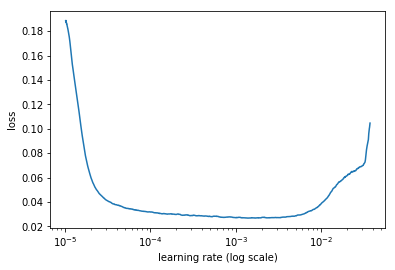

In [12]:
learn.sched.plot()

In [10]:
# Do 5 fold cv split
cv_idxs = kfold_cv_idx(train_test, 5)

# Input
X = train_test.drop(['id', 'target'], 1)
X = np.array(X)

trn_idx, val_idx = cv_idxs[0]

trn_ds = AEDataset(X[trn_idx], denoise_func=inputSwapNoise, p=0.15)
val_ds = AEDataset(X[val_idx], denoise_func=inputSwapNoise, p=0.15)
trn_dl = DataLoader(trn_ds, 128, True)
val_dl = DataLoader(val_ds, 128)

# Fastai integration with modeldata and singlemodel
md = ModelData('./', trn_dl, val_dl)
model = RepresentNet([221, 1000, 1500, 1000, 221])
if torch.cuda.is_available():
    single_model = SingleModel(model.cuda())
else: single_model = SingleModel(model)

# Create learner
learn = Learner(md, single_model)
learn.crit = nn.MSELoss()
learn.opt_fn = optim.Adam

# Fit model
learn.fit(1e-4, 10, 1e-4, cycle_len=1)

HBox(children=(IntProgress(value=0, description='Epoch', max=10), HTML(value='')))

[ 0.       0.02935  0.02391]                                    
[ 1.       0.02784  0.02286]                                    
[ 2.       0.02689  0.02218]                                    
[ 3.       0.02582  0.02165]                                    
[ 4.       0.02528  0.02126]                                    
[ 5.       0.02497  0.02098]                                    
[ 6.       0.02465  0.02079]                                      
[ 7.       0.02426  0.02064]                                      
[ 8.       0.02435  0.02049]                                      
[ 9.       0.02398  0.0204 ]                                      



In [ ]:
learn.save('10')

In [ ]:
# Fit model
learn.fit(1e-4, 10, 1e-4, cycle_len=1)

HBox(children=(IntProgress(value=0, description='Epoch', max=10), HTML(value='')))

[ 0.       0.02931  0.02386]                                    
 51%|█████     | 4726/9301 [09:44<09:25,  8.09it/s, loss=0.0284]